## Latent Probing on Tokens: Predicting LLM Generation Accuracy from Models Trained on Binarized Semantic Entropy

We are analyzing the embeddings of last input token before model generation and the second last token in all generated tokens. We store the embeddings from all model layers.

In this notebook, we will study how to close the performance gap (currently ~0.005 AUROC) **between models trained for binarized SE while tested for accuracy and models both trained and tested for accuracy.**

In [98]:
%load_ext autoreload
%autoreload 2

import os
# change path to the desired log saving path
# os.chdir('/scratch-ssd/ms23jh/uncertainty/wandb/run-20240320_104214-eq9l4ap7/files')  # path for falcon-7b on trivia_qa (2k)
# os.chdir('/scratch-ssd/ms23jh/uncertainty/wandb/run-20240422_010858-rhf4s3f0/files')  # path for llama2-7b on trivia_qa (200)
# os.chdir('/scratch-ssd/ms23jh/uncertainty/wandb/run-20240320_140822-qlf5m8bq/files')  # path for llama2-7b on squad (2k) -- very high entropy scores (very uncertain)
# os.chdir('/scratch-ssd/ms23jh/uncertainty/wandb/run-20240314_140138-44ihurtz/files')  # path for mistral-7b on squad (200) 
os.chdir('/scratch-ssd//ms23jh/uncertainty/wandb/run-20240422_125709-vjb2jtnx/files')  # path for llama2-7b on trivia_qa (2k)
    
import pickle
import yaml
import json

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import torch

from copy import deepcopy
import seaborn as sns

import wandb
api = wandb.Api()
api.entity = 'jiatongg'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Utility Functions

In [99]:
# Read training generated embeddings
f = open('validation_generations.pkl', 'rb')
generations = pickle.load(f)
f.close()

# Read uncertainty measures (p-true, predictive/semantic uncertainties)
g = open('uncertainty_measures.pkl', 'rb')
measures = pickle.load(g)
g.close()

In [100]:
entropy = torch.tensor(measures['uncertainty_measures']['cluster_assignment_entropy']).to(torch.float32)  # replace semantic_entropy with cluster_assignment_entropy
print(entropy.shape, entropy)

torch.Size([2000]) tensor([0.3251, -0.0000, 2.0253,  ..., -0.0000, 0.8979, -0.0000])


In [27]:
# Define LR and MLP model structures (LR)
import torch
import torch.nn as nn
from torch.nn import Linear, ReLU, Dropout, BatchNorm1d, Sigmoid
from sklearn.linear_model import LogisticRegression, LinearRegression

class MLP(nn.Module):
    def __init__(self, in_dim, hid_dims, out_dim=1, dropout=0.5):
        super(MLP, self).__init__()
        layers = []
        
        if isinstance(hid_dims, int):
            layer_dims = [in_dim] + [hid_dims] * 2
        elif isinstance(hid_dims, list):
            layer_dims = [in_dim] + hid_dims
        else:
            raise ValueError("hid_dims must be either an integer or a list of integers")
        
        for i in range(len(layer_dims) - 1):
            layers.append(Linear(layer_dims[i], layer_dims[i+1]))
            layers.append(BatchNorm1d(layer_dims[i+1]))
            layers.append(ReLU())
            layers.append(Dropout(dropout))

        layers.append(Linear(layer_dims[-1], out_dim))        
        self.layers = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.layers(x)


class MLPClassifier(MLP):
    def __init__(self, in_dim, hid_dims, dropout):
        super().__init__(in_dim, hid_dims, out_dim=1, dropout=dropout)

    def forward(self, x):
        x = super().forward(x)
        x = torch.sigmoid(x) 
        return x

## Use Linear Probe for Predicting Semantic Entropy 

We experiment with the 'Last Input Token before Generation' first.

We train simple MLPs (4 hidden layers, 100 epochs w/ early stopping) on the token embeddings from each layer on _semantic entropy_ scores. 

In this section, we only prepare datasets for later transfer learning tasks.

In [101]:
tok_bef_gen_dataset = torch.stack([record['most_likely_answer']['emb_last_tok_before_gen'] 
                                   for record in generations.values()]).squeeze(-2).to(torch.float32)
# Originally float64
ca_entropy = entropy.to(torch.float32)
mean = ca_entropy.mean()
std = ca_entropy.std()
print(ca_entropy.min(), ca_entropy.max(), mean, std)
ca_entropy = (ca_entropy - mean) / std

print(tok_bef_gen_dataset.shape, ca_entropy.shape)

tensor(-0.) tensor(2.3026) tensor(0.7473) tensor(0.7444)
torch.Size([2000, 33, 4096]) torch.Size([2000])


### Explore Token before First Generated Token (TBG)

We experment layer-by-layer.

In [102]:
tok_bef_gen_layered_datasets = tok_bef_gen_dataset.transpose(0, 1)
print(tok_bef_gen_layered_datasets.shape)

torch.Size([33, 2000, 4096])


In [30]:
# Make batched inputs and dataloaders (one for each layer)
from torch.utils.data import DataLoader, Subset, TensorDataset, ConcatDataset

from sklearn.model_selection import train_test_split

total_size = 2000  # Number of samples
batch_size = 32

def create_dataloaders(tok_bef_gen_layered_datasets, semantic_entropy, total_size, batch_size, set_seed=False, val_test_splits=[0.2, 0.1]):
    if set_seed:
        torch.manual_seed(42)
    
    indices = torch.randperm(total_size)
    test_size = int(total_size * val_test_splits[1])
    valid_size = int((total_size - test_size) * val_test_splits[0])
    train_size = total_size - test_size - valid_size

    train_indices = indices[:train_size]
    valid_indices = indices[train_size:train_size + valid_size]
    test_indices = indices[train_size + valid_size:]

    tbg_train_dataloaders = []
    tbg_valid_dataloaders = []
    tbg_test_dataloaders = []

    for i in range(tok_bef_gen_layered_datasets.shape[0]):
        dataset_i = tok_bef_gen_layered_datasets[i]
        
        tensor_dataset_i = TensorDataset(dataset_i, semantic_entropy)
        
        train_dataset_i = Subset(tensor_dataset_i, train_indices)
        valid_dataset_i = Subset(tensor_dataset_i, valid_indices)
        test_dataset_i = Subset(tensor_dataset_i, test_indices)
        
        train_dataloader_i = DataLoader(train_dataset_i, batch_size=batch_size, shuffle=True)
        valid_dataloader_i = DataLoader(valid_dataset_i, batch_size=batch_size, shuffle=False)
        test_dataloader_i = DataLoader(test_dataset_i, batch_size=batch_size, shuffle=False)
        
        tbg_train_dataloaders.append(train_dataloader_i)
        tbg_valid_dataloaders.append(valid_dataloader_i)
        tbg_test_dataloaders.append(test_dataloader_i)

    return tbg_train_dataloaders, tbg_valid_dataloaders, tbg_test_dataloaders
    
def create_Xs_and_ys(tok_bef_gen_layered_datasets, ca_entropy, total_size, val_test_splits=[0.2, 0.1]):
    # Data splitting for sklearn linear models
    X = tok_bef_gen_layered_datasets.numpy()
    y = ca_entropy.numpy()

    valid_size = val_test_splits[0]
    test_size = val_test_splits[1]

    X_trains = []
    X_vals = []
    X_tests = []
    y_trains = []
    y_vals = []
    y_tests = []

    for i in range(X.shape[0]):
        # Split data into train, validation, and test sets
        X_train_val, X_test, y_train_val, y_test = train_test_split(X[i], y, test_size=test_size, random_state=42)
        X_tests.append(X_test)
        y_tests.append(y_test)
        X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=valid_size, random_state=42) 
        X_trains.append(X_train)
        y_trains.append(y_train)
        X_vals.append(X_val)
        y_vals.append(y_val)

    return X_trains, X_vals, X_tests, y_trains, y_vals, y_tests

In [31]:
# Training and testing helper function.
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim

from sklearn.metrics import log_loss, roc_auc_score, mean_squared_error

# Use verbose=1 for model loss tracking.
def sklearn_train_and_evaluate(model, X_train, y_train, X_valid, y_valid, binary_cls=False, title="", silent=False):
    model.fit(X_train, y_train)
    
    # Calculate training loss and score
    if binary_cls:
        train_probs = model.predict_proba(X_train)
        train_loss = log_loss(y_train, train_probs)
    else:
        train_preds = model.predict(X_train)
        train_loss = mean_squared_error(y_train, train_preds)

    # Calculate validation loss
    valid_preds = model.predict(X_valid)
    if binary_cls:
        valid_probs = model.predict_proba(X_valid)
        valid_loss = log_loss(y_valid, valid_probs)
        val_accuracy = np.mean((valid_preds == y_valid).astype(int))
        auroc_score = roc_auc_score(y_valid, valid_probs[:,1])
        print(f"Validation Accuracy: {val_accuracy:.4f}, AUROC: {auroc_score:.4f}")
    else:
        valid_loss = mean_squared_error(y_valid, valid_preds)
        # train_score = model.score(X_train, y_train)
        # val_score = model.score(X_valid, y_valid)
        # print(f"Training R_squared: {train_score:.4f}, Validation R_squared: {val_score:.4f}")
    print(f"Training Loss: {train_loss:.4f}, Validation Loss: {valid_loss:.4f}")

def sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=False):
    test_preds = model.predict(X_test)
    if binary_cls:
        test_probs = model.predict_proba(X_test)
        test_loss = log_loss(y_test, test_probs)
    else:
        test_loss = mean_squared_error(y_test, test_preds)
        
    if binary_cls:
        test_probs = test_probs[:, 1]  # Probabilities for the positive class
        test_accuracy = np.mean((test_preds == y_test).astype(int))
        auroc_score = roc_auc_score(y_test, test_probs)
        print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, AUROC: {auroc_score:.4f}")
        return test_loss, test_accuracy, auroc_score
    else:
        test_score = model.score(X_test, y_test)
        print(f"Test Loss: {test_loss:.4f}, Test R-squared: {test_score:.4f}")
        return test_loss


def train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.MSELoss(), epochs=50, 
                       binary_cls=False, title="", silent=False, lr=0.0005):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    train_losses = []
    valid_losses = []

    for epoch in range(epochs):
        model.train()
        total_train_loss = 0
        if binary_cls:
            total_train_correct = 0
            total_train_samples = 0
            
        for inputs, scalars in train_loader:
            inputs, scalars = inputs.to(device), scalars.to(device)
            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, scalars)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

            if binary_cls:
                preds = outputs > 0.5
                matches = preds == scalars
                total_train_correct += matches.int().sum().item()
                total_train_samples += scalars.size(0)
        
        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        total_valid_loss = 0
        with torch.no_grad():
            for inputs, scalars in valid_loader:
                inputs, scalars = inputs.to(device), scalars.to(device)
                outputs = model(inputs).squeeze()
                loss = criterion(outputs, scalars)
                total_valid_loss += loss.item()

        avg_valid_loss = total_valid_loss / len(valid_loader)
        valid_losses.append(avg_valid_loss)

        if epoch == 0 or (epoch+1) % 10 == 0:
            if binary_cls:
                train_accuracy = total_train_correct / total_train_samples
                print(f"Epoch {epoch+1}/{epochs}, Training Loss: {avg_train_loss:.4f}, Validation Loss: {avg_valid_loss:.4f}, Training Accuracy: {train_accuracy:.4f}")
            else:
                print(f"Epoch {epoch+1}/{epochs}, Training Loss: {avg_train_loss:.4f}, Validation Loss: {avg_valid_loss:.4f}")

    # Plot training and validation loss
    if not silent:
        plt.figure(figsize=(10, 5))
        plt.plot(train_losses, label='Training Loss')
        plt.plot(valid_losses, label='Validation Loss')
        plt.title(f'Training and Validation Losses for {title}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    return None

def evaluate_on_test(model, test_loader, device, criterion=nn.MSELoss(), binary_cls=False):
    model.to(device)
    model.eval()
    total_test_loss = 0
    all_preds = []
    all_outputs = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            total_test_loss += loss.item()

            if binary_cls:
                preds = outputs > 0.5
                all_preds.extend(preds.cpu().numpy())
                all_outputs.extend(outputs.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

    avg_test_loss = total_test_loss / len(test_loader)

    if binary_cls:
        test_accuracy = np.mean(np.array(all_preds) == np.array(all_labels))
        auroc_score = roc_auc_score(all_labels, all_outputs) if len(set(all_labels)) > 1 else float('nan')
        
        print(f"Test Loss: {avg_test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, AUROC: {auroc_score:.4f}")
        return avg_test_loss, test_accuracy, auroc_score
    else:
        print(f"Test Loss: {avg_test_loss:.4f}")
        return avg_test_loss

In [32]:
# Plot the 1-D pooled test losses
from datetime import datetime

def plot_1d_metrics(test_metrics_list, model_names, metric_name="MSE Losses", save_fig=False, use_logarithm=False):
    plt.figure(figsize=(10, 5))
    
    # Make sure that model_names array and test_metrics_list have the same length.
    if len(test_metrics_list) != len(model_names):
        raise ValueError("The length of test_metrics_list and model_names must be the same.")
    
    for test_metrics, model_name in zip(test_metrics_list, model_names):
        test_metrics = torch.tensor(test_metrics, dtype=torch.float32)
        if use_logarithm:
            test_metrics = torch.log(test_metrics + 1e-6)
        layer_indices = torch.arange(len(test_metrics)) + 1  # +1 if layer indexing starts at 1
        plt.plot(layer_indices, test_metrics, marker='o', linestyle='-', label=model_name)
    
    plt.title(f'Test {metric_name} per Layer')
    plt.xlabel('Layer_i')
    plt.ylabel(f'{metric_name}')
    plt.xticks(layer_indices)  # Assuming all models have the same number of layers
    plt.legend()
    plt.grid(True)
    formatted_time = datetime.now().strftime("%Y%m%d-%H%M%S")
    full_path = '~/Downloads/oatml/semantic_uncertainty/figures'
    full_path = os.path.expanduser(full_path)
    if save_fig:
        plt.savefig(f'{full_path}/test_{metric_name}_per_layer_for_{"_".join(model_names)}_{formatted_time}.jpg')
    plt.show()

#### Binarize Entropy and Predict with Logistic Regression

We try binarizing the entropy scores and use logistic regression as with the accuracy prediction.

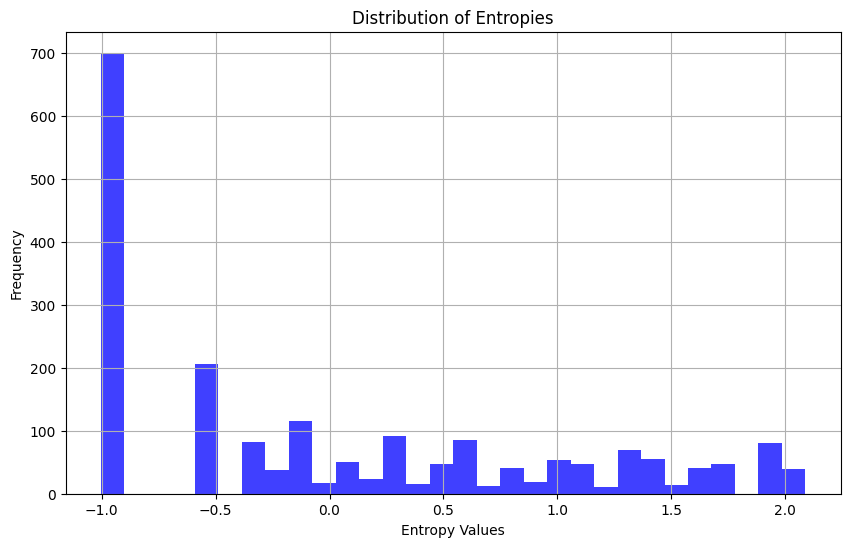

tensor(-1.0039) tensor(2.0892) tensor(1.) tensor(-5.8174e-08)


In [103]:
# Plot the entropy distribution
def plot_entropy_distribution(entropies):
    entropies_np = entropies.numpy()
    plt.figure(figsize=(10, 6))  # Set the figure size
    plt.hist(entropies_np, bins=30, alpha=0.75, color='blue')
    plt.title('Distribution of Entropies')  # Title of the histogram
    plt.xlabel('Entropy Values')  # Label for the x-axis
    plt.ylabel('Frequency')  # Label for the y-axis
    plt.grid(True) 
    plt.show()

plot_entropy_distribution(ca_entropy)
print(ca_entropy.min(), ca_entropy.max(), ca_entropy.var(), ca_entropy.mean())

def binarize_entropy(entropies, thres=0.0):
    binary_entropies = torch.full_like(entropies, -1, dtype=torch.float)
    binary_entropies[entropies < thres] = 0
    binary_entropies[entropies > thres] = 1

    return binary_entropies

bca_entropy = binarize_entropy(ca_entropy, 0.0)

We observe bimodal distribution for the normalized entropy values. The distribution is slightly skewed. **We decide to bin at 0.0 for even splits for now.**

In [104]:
# Fractions of 1's for binarized entropy
print(sum(bca_entropy)/len(bca_entropy))

tensor(0.4215)


### Explore Second Last generated Token (SLT)


In [114]:
sec_last_tok_dataset = torch.stack([record['most_likely_answer']['emb_tok_before_eos'] 
                                   for record in generations.values()]).squeeze(-2).to(torch.float32)
print(sec_last_tok_dataset.shape)

torch.Size([2000, 33, 4096])


In [115]:
sec_last_tok_dataset.transpose(0, 1).shape

torch.Size([33, 2000, 4096])

In [116]:
slt_layered_datasets = sec_last_tok_dataset.transpose(0, 1)
print(slt_layered_datasets.shape, slt_layered_datasets.dtype)

torch.Size([33, 2000, 4096]) torch.float32


In [117]:
# We may want to drop the first layer due to its homogeneity in values.
# print(slt_layered_datasets[0], slt_layered_datasets[0].shape)
slt_layered_datasets = slt_layered_datasets[1:]

## Use Linear Probe for Predicting Correctness of Generated Answers (or Accuracy)

It would be interesting to see how linear probes perform at predicting accuracy obtained from using semantic entropy at selecting the most probable answer (true or false), as indicated in the `compute_uncertainty_measures.py` (_# For the semantic uncertainties, we can also change the prediction, by first selecting the semantic cluster with the highest probability, and then selecting the generation with the highest probability within that cluster._)

We will use logistic regression for this task, as for the binarized entropy prediction task.

### Token Before first Generation (TBG)

In [118]:
accuracies = torch.tensor([record['most_likely_answer']['accuracy'] for record in generations.values()])
print(accuracies.shape, accuracies[:10])  # "Accuracies" are binary. Classification task.

torch.Size([2000]) tensor([1., 1., 0., 1., 0., 0., 1., 0., 1., 0.])


In [119]:
# Create data loaders from tbg embeddings
tbg_train_dataloaders, tbg_valid_dataloaders, tbg_test_dataloaders = create_dataloaders(tok_bef_gen_layered_datasets, accuracies, total_size, batch_size)
# Prepare X's and y's for sklearn LR model.
X_trains, X_vals, X_tests, y_trains, y_vals, y_tests = create_Xs_and_ys(tok_bef_gen_layered_datasets, accuracies, total_size)

In [120]:
# Dummy accuracy:
print(f"Dummy accuracy: {max(np.mean(y_tests), 1-np.mean(y_tests)):.4f}")

Dummy accuracy: 0.6250


Training on TBG-Acc Dataset 1/33
Validation Accuracy: 0.6639, AUROC: 0.5158
Training Loss: 0.5520, Validation Loss: 0.6365
Test Loss: 0.6232, Test Accuracy: 0.6700, AUROC: 0.6665
Training on TBG-Acc Dataset 2/33
Validation Accuracy: 0.6583, AUROC: 0.5278
Training Loss: 0.5098, Validation Loss: 0.6460
Test Loss: 0.6051, Test Accuracy: 0.6800, AUROC: 0.7005
Training on TBG-Acc Dataset 3/33
Validation Accuracy: 0.6611, AUROC: 0.5678
Training Loss: 0.4350, Validation Loss: 0.6539
Test Loss: 0.6088, Test Accuracy: 0.6450, AUROC: 0.6835
Training on TBG-Acc Dataset 4/33
Validation Accuracy: 0.6500, AUROC: 0.5945
Training Loss: 0.3778, Validation Loss: 0.6605
Test Loss: 0.6356, Test Accuracy: 0.6650, AUROC: 0.6721
Training on TBG-Acc Dataset 5/33
Validation Accuracy: 0.6444, AUROC: 0.5877
Training Loss: 0.3379, Validation Loss: 0.6942
Test Loss: 0.6577, Test Accuracy: 0.6600, AUROC: 0.6726
Training on TBG-Acc Dataset 6/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6278, AUROC: 0.5708
Training Loss: 0.3005, Validation Loss: 0.7449
Test Loss: 0.7133, Test Accuracy: 0.6200, AUROC: 0.6630
Training on TBG-Acc Dataset 7/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6361, AUROC: 0.6086
Training Loss: 0.2579, Validation Loss: 0.7243
Test Loss: 0.6845, Test Accuracy: 0.6800, AUROC: 0.6931
Training on TBG-Acc Dataset 8/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6889, AUROC: 0.6507
Training Loss: 0.2075, Validation Loss: 0.7379
Test Loss: 0.6865, Test Accuracy: 0.7000, AUROC: 0.7036
Training on TBG-Acc Dataset 9/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6778, AUROC: 0.6335
Training Loss: 0.1787, Validation Loss: 0.7811
Test Loss: 0.7157, Test Accuracy: 0.6900, AUROC: 0.7070
Training on TBG-Acc Dataset 10/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6889, AUROC: 0.6806
Training Loss: 0.1528, Validation Loss: 0.7712
Test Loss: 0.7581, Test Accuracy: 0.7350, AUROC: 0.7178
Training on TBG-Acc Dataset 11/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7056, AUROC: 0.7178
Training Loss: 0.1043, Validation Loss: 0.7369
Test Loss: 0.7985, Test Accuracy: 0.6850, AUROC: 0.7253
Training on TBG-Acc Dataset 12/33
Validation Accuracy: 0.7194, AUROC: 0.7217
Training Loss: 0.0845, Validation Loss: 0.7612
Test Loss: 0.8361, Test Accuracy: 0.7200, AUROC: 0.7269
Training on TBG-Acc Dataset 13/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7083, AUROC: 0.7086
Training Loss: 0.0695, Validation Loss: 0.8155
Test Loss: 0.7412, Test Accuracy: 0.7200, AUROC: 0.7657
Training on TBG-Acc Dataset 14/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6778, AUROC: 0.6836
Training Loss: 0.0576, Validation Loss: 0.9415
Test Loss: 0.8108, Test Accuracy: 0.6900, AUROC: 0.7489
Training on TBG-Acc Dataset 15/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7056, AUROC: 0.6750
Training Loss: 0.0499, Validation Loss: 0.9868
Test Loss: 0.8236, Test Accuracy: 0.7100, AUROC: 0.7543
Training on TBG-Acc Dataset 16/33
Validation Accuracy: 0.6889, AUROC: 0.6943
Training Loss: 0.0368, Validation Loss: 0.9999
Test Loss: 0.8483, Test Accuracy: 0.7450, AUROC: 0.7684
Training on TBG-Acc Dataset 17/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6917, AUROC: 0.7120
Training Loss: 0.0295, Validation Loss: 0.9864
Test Loss: 0.8028, Test Accuracy: 0.7850, AUROC: 0.7888
Training on TBG-Acc Dataset 18/33
Validation Accuracy: 0.7111, AUROC: 0.7238
Training Loss: 0.0189, Validation Loss: 1.0420
Test Loss: 0.8427, Test Accuracy: 0.7750, AUROC: 0.7914
Training on TBG-Acc Dataset 19/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6833, AUROC: 0.6845
Training Loss: 0.0142, Validation Loss: 1.2383
Test Loss: 0.9108, Test Accuracy: 0.7300, AUROC: 0.7863
Training on TBG-Acc Dataset 20/33
Validation Accuracy: 0.7167, AUROC: 0.6880
Training Loss: 0.0113, Validation Loss: 1.2805
Test Loss: 0.8772, Test Accuracy: 0.7700, AUROC: 0.8013
Training on TBG-Acc Dataset 21/33
Validation Accuracy: 0.7056, AUROC: 0.6708
Training Loss: 0.0085, Validation Loss: 1.3457
Test Loss: 0.9690, Test Accuracy: 0.7500, AUROC: 0.7858
Training on TBG-Acc Dataset 22/33
Validation Accuracy: 0.7111, AUROC: 0.6895
Training Loss: 0.0061, Validation Loss: 1.3378
Test Loss: 1.0762, Test Accuracy: 0.7300, AUROC: 0.7772
Training on TBG-Acc Dataset 23/33
Validation Accuracy: 0.7056, AUROC: 0.7003
Training Loss: 0.0049, Validation Loss: 1.3012
Test Loss: 1.1039, Test Accuracy: 0.7350, AUROC: 0.7750
Training on TBG-Acc Dataset 24/33
Validation Accuracy: 0.7194, AUROC: 0.7034
Training Loss: 0.0040, Validation Loss: 1.2886
Test Loss:

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6944, AUROC: 0.6647
Training Loss: 0.0026, Validation Loss: 1.5261
Test Loss: 1.1891, Test Accuracy: 0.7450, AUROC: 0.7871


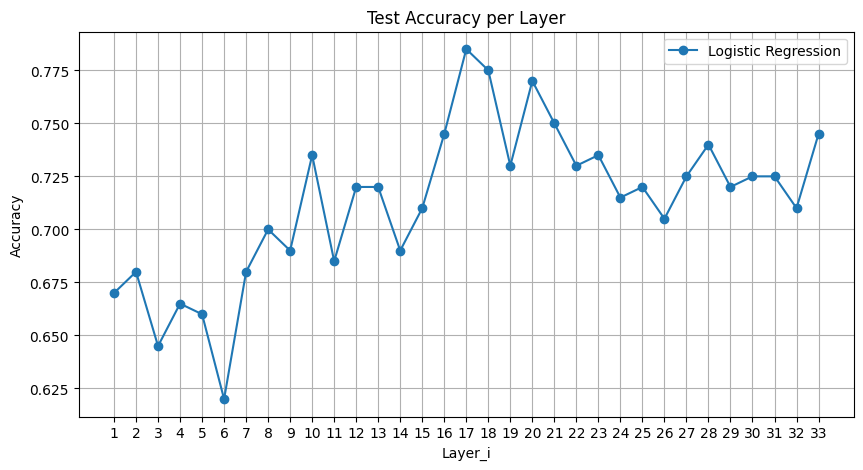

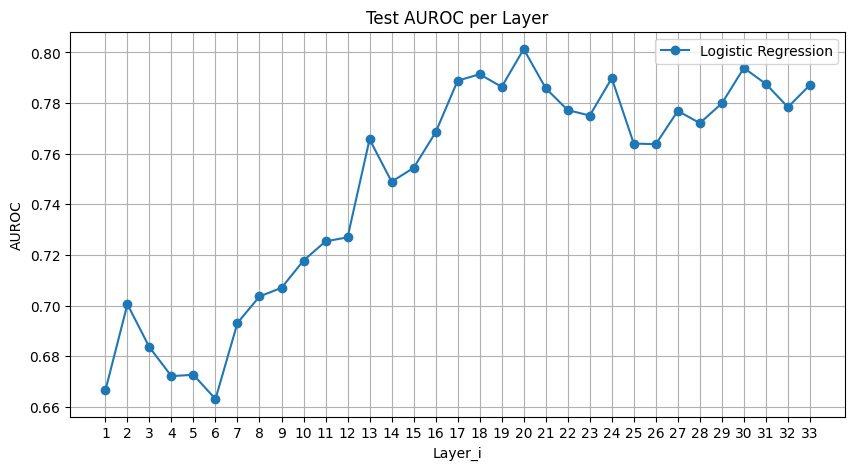

In [42]:
# Training Loops (LR)
talr_test_accs = []
talr_test_aucs = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(X_trains, X_vals, X_tests, y_trains, y_vals, y_tests)):
    print(f"Training on TBG-Acc Dataset {i+1}/{len(X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on TBG-Acc Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    talr_test_accs.append(test_acc)
    talr_test_aucs.append(test_auc)

plot_1d_metrics([talr_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([talr_test_aucs], ['Logistic Regression'], 'AUROC')

Using device: cuda
Training on TBG-Acc Dataset 1/33
Epoch 1/50, Training Loss: 72.5969, Validation Loss: 62.2901, Training Accuracy: 0.5007
Epoch 10/50, Training Loss: 70.3230, Validation Loss: 62.7326, Training Accuracy: 0.7972
Epoch 20/50, Training Loss: 70.2188, Validation Loss: 62.7625, Training Accuracy: 0.8097
Epoch 30/50, Training Loss: 70.0471, Validation Loss: 62.8940, Training Accuracy: 0.8021
Epoch 40/50, Training Loss: 70.0884, Validation Loss: 62.8197, Training Accuracy: 0.8160
Epoch 50/50, Training Loss: 70.0408, Validation Loss: 62.8959, Training Accuracy: 0.8132


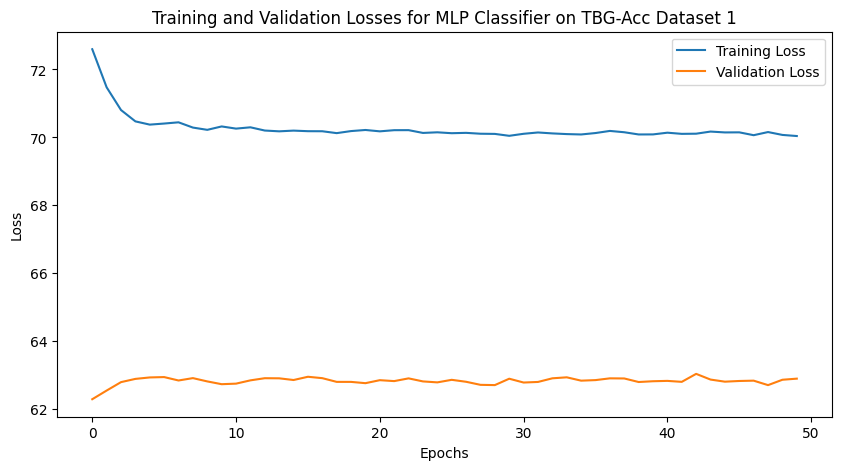

Test Loss: 69.2262, Test Accuracy: 0.6650, AUROC: 0.6056
Training on TBG-Acc Dataset 2/33
Epoch 1/50, Training Loss: 72.5363, Validation Loss: 62.2931, Training Accuracy: 0.5514
Epoch 10/50, Training Loss: 70.2982, Validation Loss: 62.9436, Training Accuracy: 0.7931
Epoch 20/50, Training Loss: 70.1751, Validation Loss: 62.8736, Training Accuracy: 0.8076
Epoch 30/50, Training Loss: 70.0083, Validation Loss: 62.7098, Training Accuracy: 0.8229
Epoch 40/50, Training Loss: 69.9531, Validation Loss: 62.7408, Training Accuracy: 0.8194
Epoch 50/50, Training Loss: 69.9079, Validation Loss: 62.7390, Training Accuracy: 0.8208


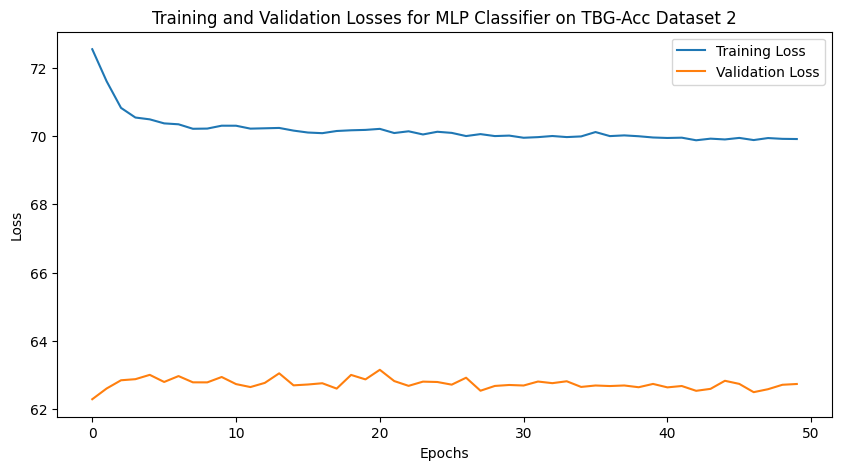

Test Loss: 69.0313, Test Accuracy: 0.6800, AUROC: 0.6276
Training on TBG-Acc Dataset 3/33
Epoch 1/50, Training Loss: 72.6229, Validation Loss: 62.2503, Training Accuracy: 0.4972
Epoch 10/50, Training Loss: 69.9874, Validation Loss: 62.6479, Training Accuracy: 0.8243
Epoch 20/50, Training Loss: 69.8050, Validation Loss: 62.3800, Training Accuracy: 0.8347
Epoch 30/50, Training Loss: 69.6986, Validation Loss: 62.2463, Training Accuracy: 0.8451
Epoch 40/50, Training Loss: 69.5441, Validation Loss: 62.2397, Training Accuracy: 0.8431
Epoch 50/50, Training Loss: 69.5992, Validation Loss: 62.3910, Training Accuracy: 0.8417


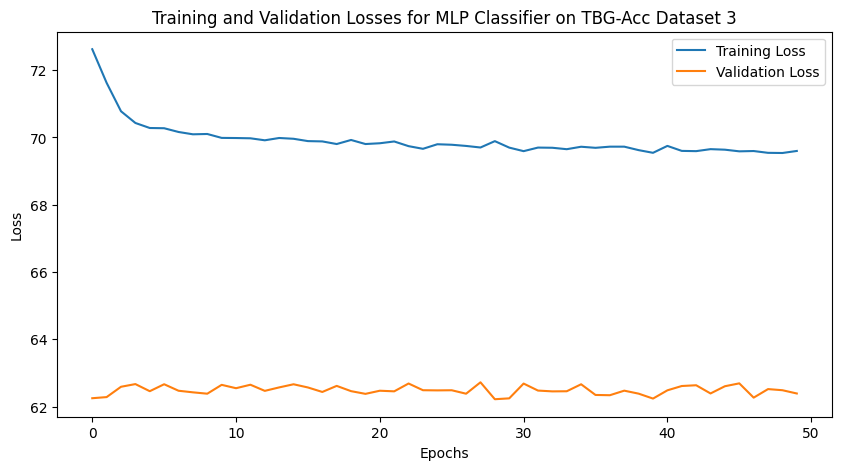

Test Loss: 68.6857, Test Accuracy: 0.6900, AUROC: 0.6998
Training on TBG-Acc Dataset 4/33
Epoch 1/50, Training Loss: 72.7189, Validation Loss: 62.4336, Training Accuracy: 0.5076
Epoch 10/50, Training Loss: 69.8044, Validation Loss: 62.5868, Training Accuracy: 0.8347
Epoch 20/50, Training Loss: 69.6582, Validation Loss: 62.2975, Training Accuracy: 0.8472
Epoch 30/50, Training Loss: 69.6936, Validation Loss: 62.4954, Training Accuracy: 0.8410
Epoch 40/50, Training Loss: 69.5869, Validation Loss: 62.5483, Training Accuracy: 0.8410
Epoch 50/50, Training Loss: 69.4047, Validation Loss: 62.3998, Training Accuracy: 0.8535


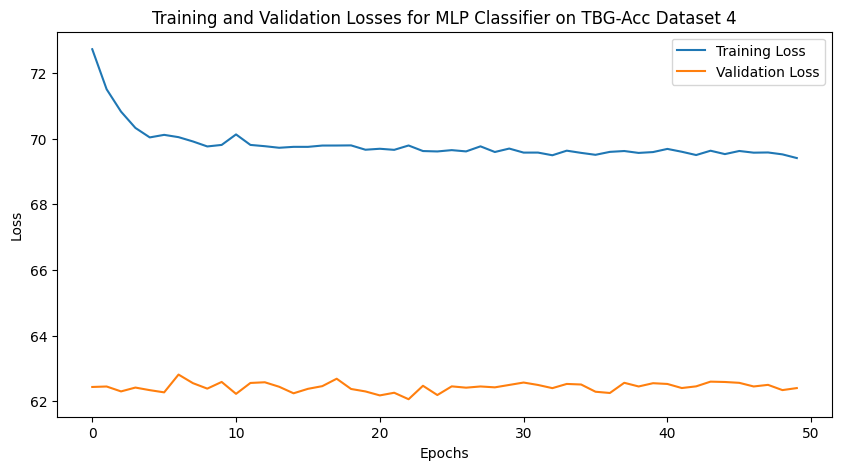

Test Loss: 69.2340, Test Accuracy: 0.6550, AUROC: 0.6536
Training on TBG-Acc Dataset 5/33
Epoch 1/50, Training Loss: 72.4870, Validation Loss: 62.2367, Training Accuracy: 0.5278
Epoch 10/50, Training Loss: 69.7850, Validation Loss: 62.4849, Training Accuracy: 0.8431
Epoch 20/50, Training Loss: 69.6073, Validation Loss: 62.4437, Training Accuracy: 0.8507
Epoch 30/50, Training Loss: 69.5531, Validation Loss: 63.6119, Training Accuracy: 0.8458
Epoch 40/50, Training Loss: 69.5395, Validation Loss: 62.6103, Training Accuracy: 0.8528
Epoch 50/50, Training Loss: 69.4244, Validation Loss: 62.3062, Training Accuracy: 0.8618


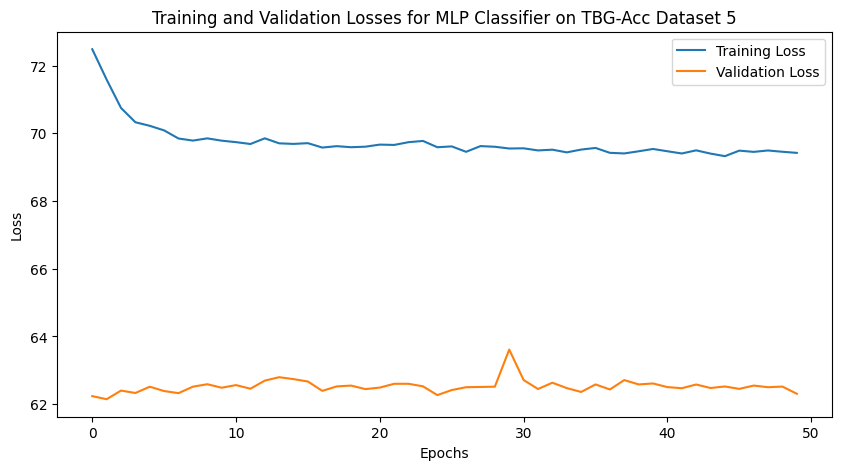

Test Loss: 69.2759, Test Accuracy: 0.6550, AUROC: 0.6402
Training on TBG-Acc Dataset 6/33
Epoch 1/50, Training Loss: 72.5027, Validation Loss: 62.1614, Training Accuracy: 0.5382
Epoch 10/50, Training Loss: 69.7534, Validation Loss: 62.4860, Training Accuracy: 0.8396
Epoch 20/50, Training Loss: 69.5358, Validation Loss: 62.8924, Training Accuracy: 0.8521
Epoch 30/50, Training Loss: 69.4807, Validation Loss: 62.6723, Training Accuracy: 0.8556
Epoch 40/50, Training Loss: 69.3540, Validation Loss: 62.4682, Training Accuracy: 0.8632
Epoch 50/50, Training Loss: 69.3203, Validation Loss: 62.5069, Training Accuracy: 0.8639


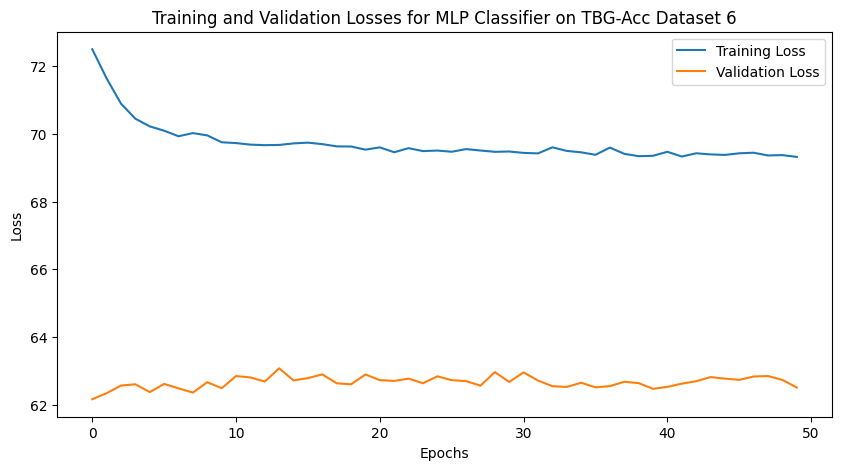

Test Loss: 69.6016, Test Accuracy: 0.6200, AUROC: 0.6531
Training on TBG-Acc Dataset 7/33
Epoch 1/50, Training Loss: 72.5445, Validation Loss: 62.3356, Training Accuracy: 0.5354
Epoch 10/50, Training Loss: 69.6057, Validation Loss: 62.8778, Training Accuracy: 0.8403
Epoch 20/50, Training Loss: 69.3868, Validation Loss: 62.7050, Training Accuracy: 0.8597
Epoch 30/50, Training Loss: 69.1302, Validation Loss: 62.3263, Training Accuracy: 0.8764
Epoch 40/50, Training Loss: 69.2599, Validation Loss: 62.4334, Training Accuracy: 0.8646
Epoch 50/50, Training Loss: 69.1504, Validation Loss: 62.5613, Training Accuracy: 0.8722


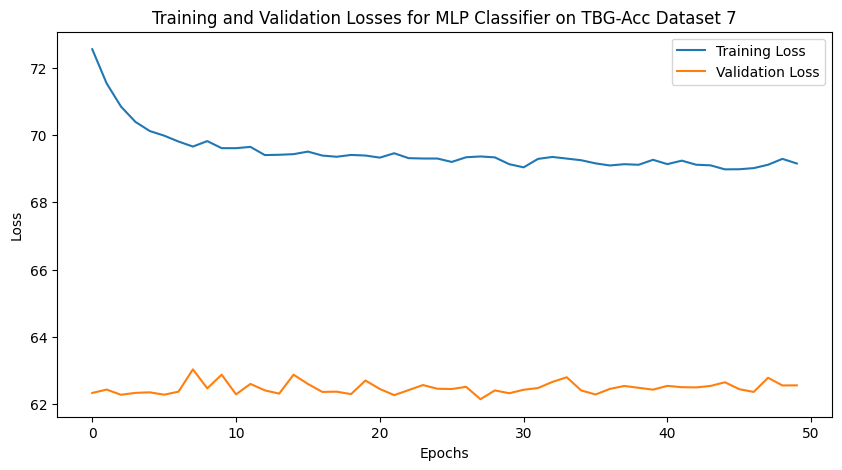

Test Loss: 69.4956, Test Accuracy: 0.6550, AUROC: 0.6471
Training on TBG-Acc Dataset 8/33
Epoch 1/50, Training Loss: 72.4351, Validation Loss: 62.5014, Training Accuracy: 0.5500
Epoch 10/50, Training Loss: 69.4722, Validation Loss: 62.4468, Training Accuracy: 0.8528
Epoch 20/50, Training Loss: 69.0133, Validation Loss: 62.5040, Training Accuracy: 0.8889
Epoch 30/50, Training Loss: 68.9808, Validation Loss: 62.5319, Training Accuracy: 0.8903
Epoch 40/50, Training Loss: 68.7976, Validation Loss: 62.2844, Training Accuracy: 0.8993
Epoch 50/50, Training Loss: 68.6408, Validation Loss: 62.2917, Training Accuracy: 0.9160


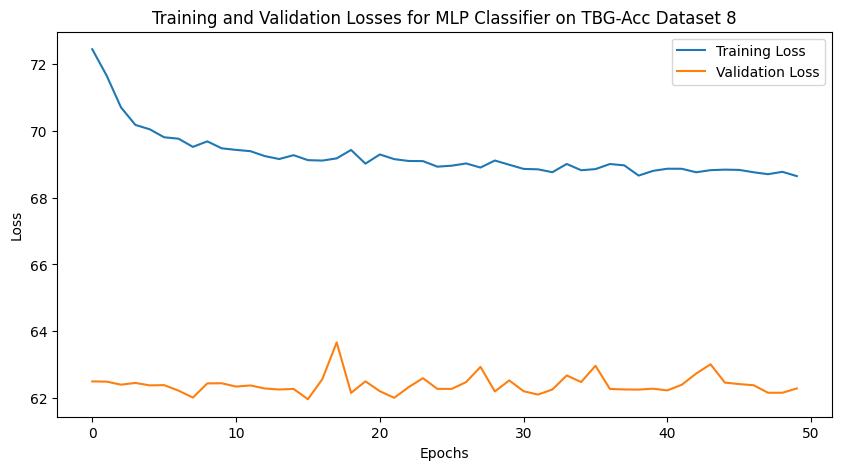

Test Loss: 68.7427, Test Accuracy: 0.6950, AUROC: 0.7192
Training on TBG-Acc Dataset 9/33
Epoch 1/50, Training Loss: 72.3997, Validation Loss: 62.3120, Training Accuracy: 0.4972
Epoch 10/50, Training Loss: 69.2244, Validation Loss: 62.2214, Training Accuracy: 0.8764
Epoch 20/50, Training Loss: 68.8603, Validation Loss: 62.0335, Training Accuracy: 0.8972
Epoch 30/50, Training Loss: 68.9237, Validation Loss: 62.2462, Training Accuracy: 0.8965
Epoch 40/50, Training Loss: 68.8513, Validation Loss: 62.2642, Training Accuracy: 0.8958
Epoch 50/50, Training Loss: 68.4739, Validation Loss: 62.0853, Training Accuracy: 0.9187


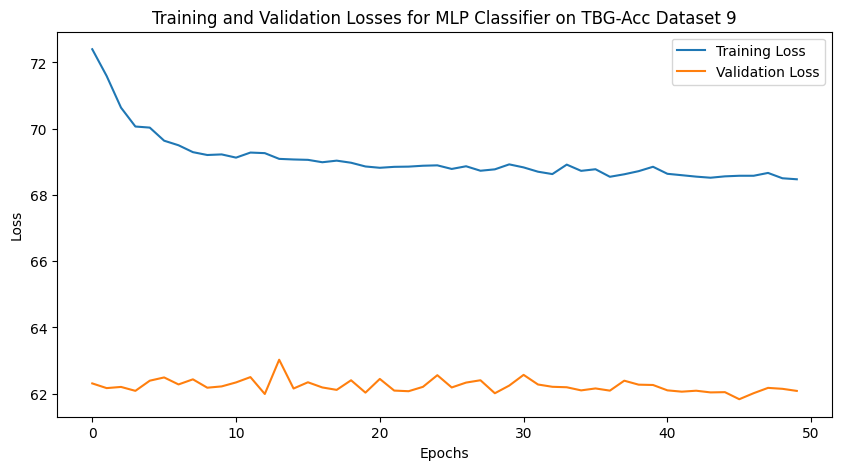

Test Loss: 68.7375, Test Accuracy: 0.6800, AUROC: 0.7033
Training on TBG-Acc Dataset 10/33
Epoch 1/50, Training Loss: 72.5555, Validation Loss: 62.4999, Training Accuracy: 0.4861
Epoch 10/50, Training Loss: 69.1358, Validation Loss: 62.2042, Training Accuracy: 0.8819
Epoch 20/50, Training Loss: 68.5744, Validation Loss: 62.1184, Training Accuracy: 0.9167
Epoch 30/50, Training Loss: 68.4532, Validation Loss: 61.7940, Training Accuracy: 0.9278
Epoch 40/50, Training Loss: 68.4907, Validation Loss: 61.8714, Training Accuracy: 0.9236
Epoch 50/50, Training Loss: 68.3582, Validation Loss: 61.6794, Training Accuracy: 0.9326


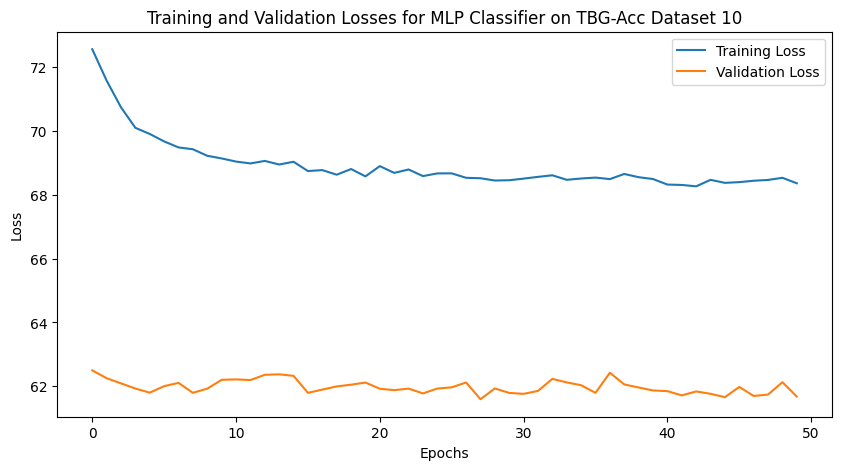

Test Loss: 68.4579, Test Accuracy: 0.7250, AUROC: 0.7366
Training on TBG-Acc Dataset 11/33
Epoch 1/50, Training Loss: 72.3812, Validation Loss: 62.0691, Training Accuracy: 0.5694
Epoch 10/50, Training Loss: 68.7556, Validation Loss: 61.8756, Training Accuracy: 0.9049
Epoch 20/50, Training Loss: 68.3476, Validation Loss: 62.2053, Training Accuracy: 0.9326
Epoch 30/50, Training Loss: 68.2136, Validation Loss: 62.1862, Training Accuracy: 0.9403
Epoch 40/50, Training Loss: 67.9710, Validation Loss: 61.9374, Training Accuracy: 0.9569
Epoch 50/50, Training Loss: 68.0390, Validation Loss: 61.7800, Training Accuracy: 0.9514


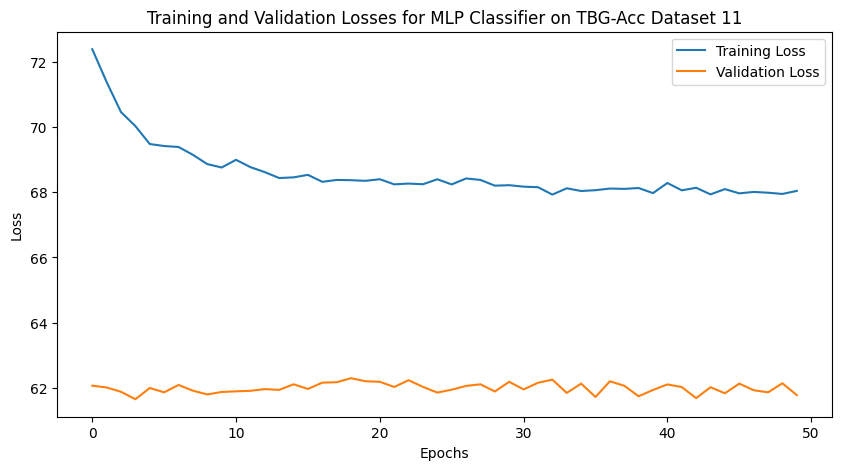

Test Loss: 68.1758, Test Accuracy: 0.7450, AUROC: 0.7752
Training on TBG-Acc Dataset 12/33
Epoch 1/50, Training Loss: 72.3415, Validation Loss: 61.9498, Training Accuracy: 0.6167
Epoch 10/50, Training Loss: 68.7113, Validation Loss: 61.7757, Training Accuracy: 0.9090
Epoch 20/50, Training Loss: 68.2555, Validation Loss: 61.8056, Training Accuracy: 0.9375
Epoch 30/50, Training Loss: 68.0212, Validation Loss: 62.1816, Training Accuracy: 0.9535
Epoch 40/50, Training Loss: 67.9788, Validation Loss: 61.8933, Training Accuracy: 0.9563
Epoch 50/50, Training Loss: 67.8170, Validation Loss: 62.0363, Training Accuracy: 0.9694


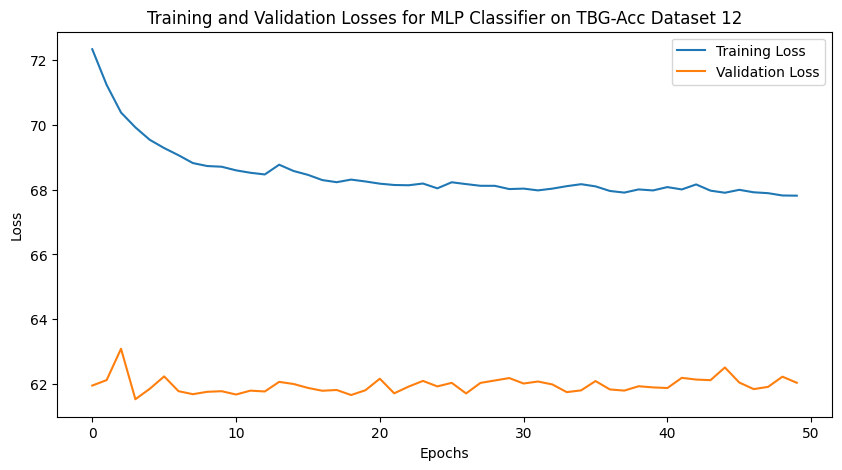

Test Loss: 68.3475, Test Accuracy: 0.7250, AUROC: 0.7436
Training on TBG-Acc Dataset 13/33
Epoch 1/50, Training Loss: 72.1834, Validation Loss: 61.8734, Training Accuracy: 0.6222
Epoch 10/50, Training Loss: 68.5965, Validation Loss: 61.6603, Training Accuracy: 0.9139
Epoch 20/50, Training Loss: 68.2720, Validation Loss: 61.9428, Training Accuracy: 0.9361
Epoch 30/50, Training Loss: 67.8163, Validation Loss: 61.7160, Training Accuracy: 0.9667
Epoch 40/50, Training Loss: 67.9075, Validation Loss: 61.7463, Training Accuracy: 0.9583
Epoch 50/50, Training Loss: 67.8336, Validation Loss: 62.0928, Training Accuracy: 0.9660


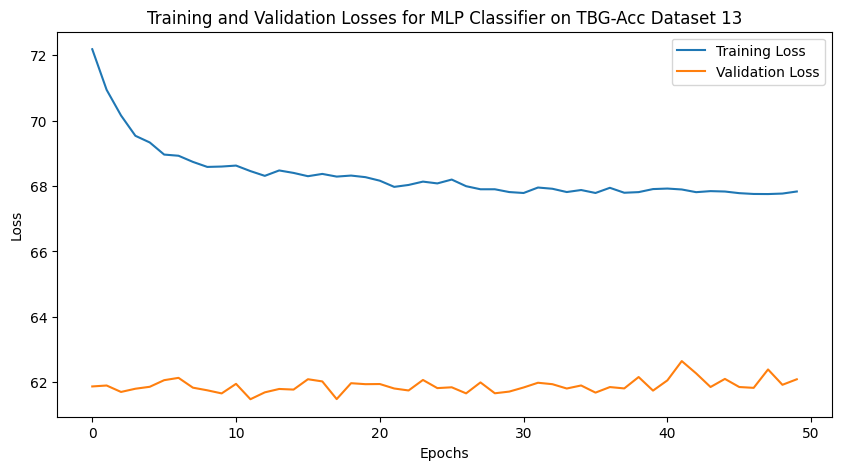

Test Loss: 68.1375, Test Accuracy: 0.7450, AUROC: 0.7516
Training on TBG-Acc Dataset 14/33
Epoch 1/50, Training Loss: 72.2246, Validation Loss: 62.2631, Training Accuracy: 0.5701
Epoch 10/50, Training Loss: 68.2868, Validation Loss: 62.0107, Training Accuracy: 0.9326
Epoch 20/50, Training Loss: 68.0216, Validation Loss: 62.1974, Training Accuracy: 0.9528
Epoch 30/50, Training Loss: 67.7615, Validation Loss: 62.1566, Training Accuracy: 0.9674
Epoch 40/50, Training Loss: 67.7313, Validation Loss: 61.7080, Training Accuracy: 0.9715
Epoch 50/50, Training Loss: 67.8005, Validation Loss: 61.6310, Training Accuracy: 0.9667


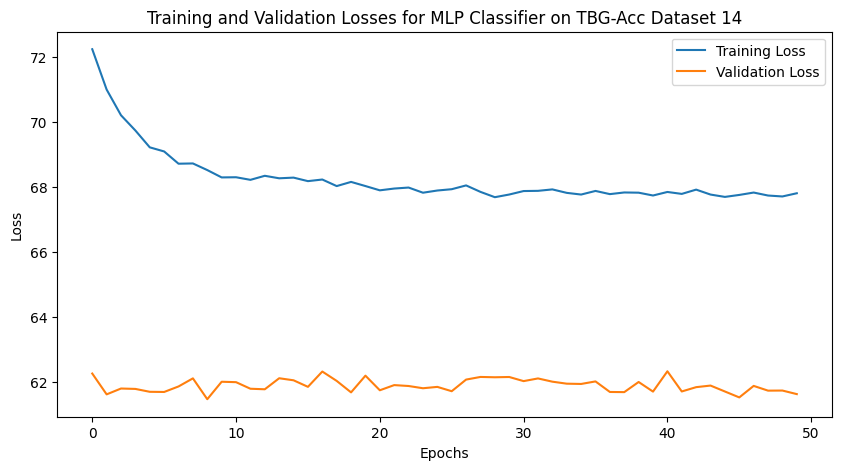

Test Loss: 68.1407, Test Accuracy: 0.7550, AUROC: 0.7496
Training on TBG-Acc Dataset 15/33
Epoch 1/50, Training Loss: 72.1028, Validation Loss: 61.6516, Training Accuracy: 0.5868
Epoch 10/50, Training Loss: 68.5082, Validation Loss: 61.6439, Training Accuracy: 0.9243
Epoch 20/50, Training Loss: 67.9602, Validation Loss: 61.6247, Training Accuracy: 0.9583
Epoch 30/50, Training Loss: 68.0017, Validation Loss: 62.0112, Training Accuracy: 0.9549
Epoch 40/50, Training Loss: 67.6911, Validation Loss: 61.8762, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 67.8515, Validation Loss: 61.9397, Training Accuracy: 0.9639


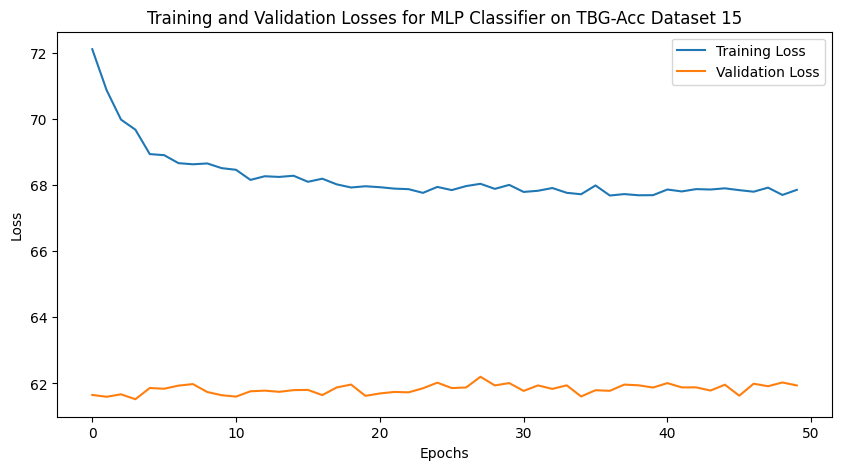

Test Loss: 68.1090, Test Accuracy: 0.7550, AUROC: 0.7812
Training on TBG-Acc Dataset 16/33
Epoch 1/50, Training Loss: 72.1896, Validation Loss: 61.7412, Training Accuracy: 0.5431
Epoch 10/50, Training Loss: 68.3934, Validation Loss: 62.0890, Training Accuracy: 0.9299
Epoch 20/50, Training Loss: 68.0478, Validation Loss: 62.0948, Training Accuracy: 0.9549
Epoch 30/50, Training Loss: 67.7743, Validation Loss: 62.0445, Training Accuracy: 0.9708
Epoch 40/50, Training Loss: 67.8287, Validation Loss: 62.3282, Training Accuracy: 0.9674
Epoch 50/50, Training Loss: 67.8184, Validation Loss: 61.9047, Training Accuracy: 0.9694


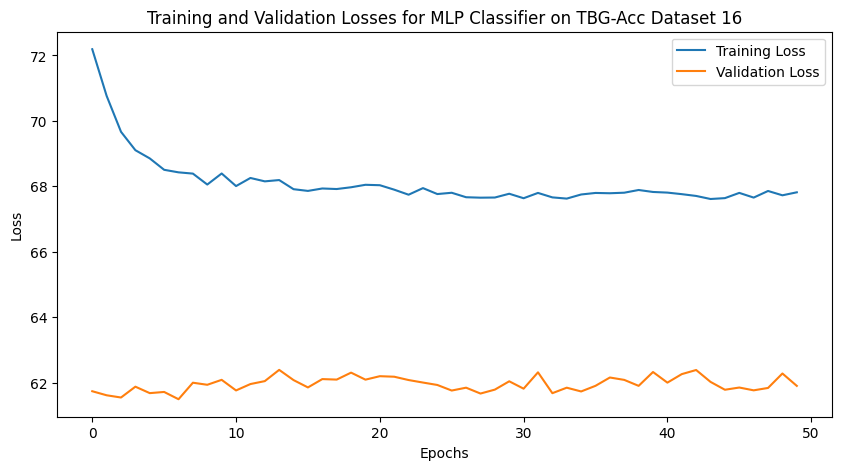

Test Loss: 68.0335, Test Accuracy: 0.7500, AUROC: 0.8005
Training on TBG-Acc Dataset 17/33
Epoch 1/50, Training Loss: 72.0153, Validation Loss: 61.6955, Training Accuracy: 0.6069
Epoch 10/50, Training Loss: 68.1280, Validation Loss: 62.0731, Training Accuracy: 0.9500
Epoch 20/50, Training Loss: 68.0957, Validation Loss: 62.1947, Training Accuracy: 0.9514
Epoch 30/50, Training Loss: 67.7245, Validation Loss: 62.2451, Training Accuracy: 0.9743
Epoch 40/50, Training Loss: 67.6747, Validation Loss: 61.8421, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 67.7103, Validation Loss: 62.2418, Training Accuracy: 0.9743


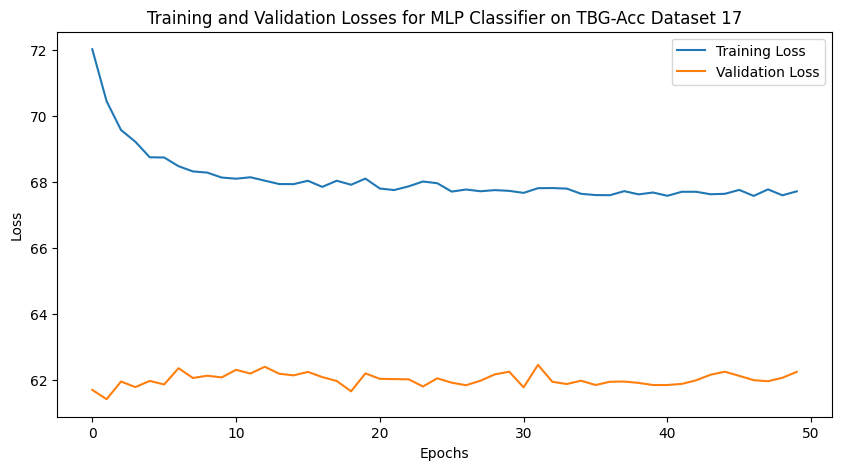

Test Loss: 68.1732, Test Accuracy: 0.7450, AUROC: 0.7994
Training on TBG-Acc Dataset 18/33
Epoch 1/50, Training Loss: 72.0776, Validation Loss: 61.6681, Training Accuracy: 0.6097
Epoch 10/50, Training Loss: 67.9466, Validation Loss: 61.9854, Training Accuracy: 0.9625
Epoch 20/50, Training Loss: 67.8668, Validation Loss: 62.1097, Training Accuracy: 0.9653
Epoch 30/50, Training Loss: 67.8155, Validation Loss: 61.9169, Training Accuracy: 0.9681
Epoch 40/50, Training Loss: 67.5997, Validation Loss: 61.8877, Training Accuracy: 0.9826
Epoch 50/50, Training Loss: 67.6565, Validation Loss: 61.7872, Training Accuracy: 0.9792


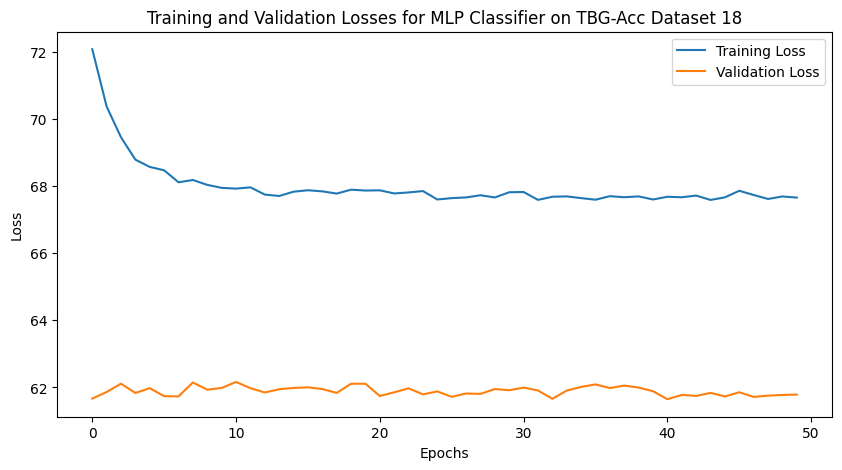

Test Loss: 67.7967, Test Accuracy: 0.7700, AUROC: 0.8178
Training on TBG-Acc Dataset 19/33
Epoch 1/50, Training Loss: 71.9790, Validation Loss: 61.9423, Training Accuracy: 0.6236
Epoch 10/50, Training Loss: 67.9734, Validation Loss: 62.2881, Training Accuracy: 0.9597
Epoch 20/50, Training Loss: 67.8581, Validation Loss: 61.9928, Training Accuracy: 0.9701
Epoch 30/50, Training Loss: 67.6166, Validation Loss: 62.1056, Training Accuracy: 0.9819
Epoch 40/50, Training Loss: 67.6773, Validation Loss: 62.2738, Training Accuracy: 0.9771
Epoch 50/50, Training Loss: 67.5047, Validation Loss: 62.2605, Training Accuracy: 0.9882


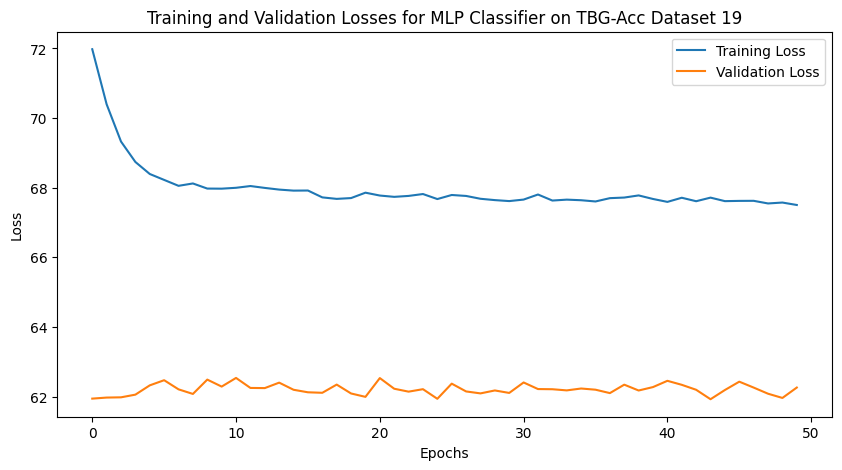

Test Loss: 67.6263, Test Accuracy: 0.7900, AUROC: 0.8488
Training on TBG-Acc Dataset 20/33
Epoch 1/50, Training Loss: 72.0598, Validation Loss: 61.6147, Training Accuracy: 0.6153
Epoch 10/50, Training Loss: 67.8528, Validation Loss: 62.0027, Training Accuracy: 0.9688
Epoch 20/50, Training Loss: 67.9583, Validation Loss: 62.8976, Training Accuracy: 0.9590
Epoch 30/50, Training Loss: 67.6946, Validation Loss: 62.1710, Training Accuracy: 0.9736
Epoch 40/50, Training Loss: 67.6176, Validation Loss: 62.0181, Training Accuracy: 0.9812
Epoch 50/50, Training Loss: 67.6441, Validation Loss: 61.7566, Training Accuracy: 0.9812


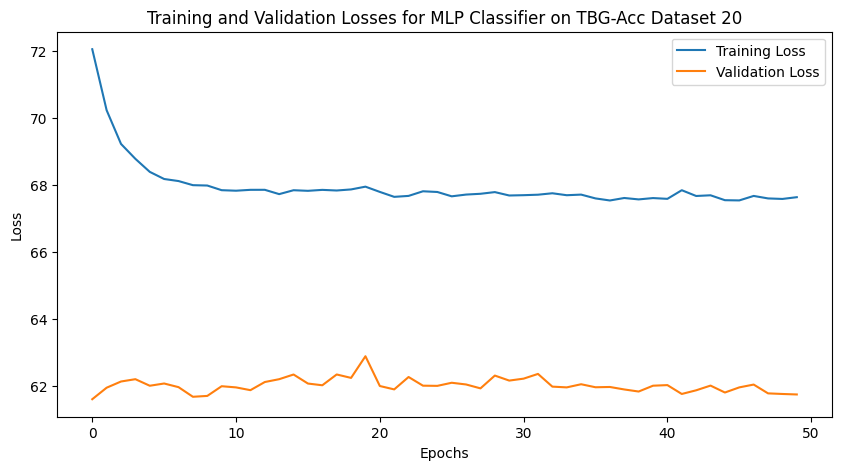

Test Loss: 67.8682, Test Accuracy: 0.7700, AUROC: 0.8026
Training on TBG-Acc Dataset 21/33
Epoch 1/50, Training Loss: 72.0604, Validation Loss: 61.8953, Training Accuracy: 0.6146
Epoch 10/50, Training Loss: 67.9155, Validation Loss: 61.9152, Training Accuracy: 0.9681
Epoch 20/50, Training Loss: 67.7394, Validation Loss: 62.2238, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 67.5948, Validation Loss: 62.0103, Training Accuracy: 0.9833
Epoch 40/50, Training Loss: 67.7906, Validation Loss: 61.9817, Training Accuracy: 0.9715
Epoch 50/50, Training Loss: 67.5951, Validation Loss: 61.7744, Training Accuracy: 0.9833


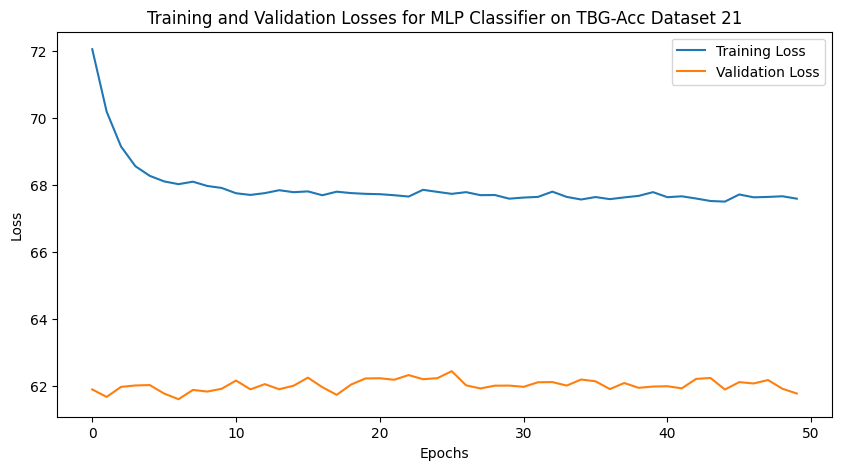

Test Loss: 67.7411, Test Accuracy: 0.7700, AUROC: 0.7880
Training on TBG-Acc Dataset 22/33
Epoch 1/50, Training Loss: 72.0679, Validation Loss: 61.5186, Training Accuracy: 0.5868
Epoch 10/50, Training Loss: 67.8894, Validation Loss: 62.0578, Training Accuracy: 0.9694
Epoch 20/50, Training Loss: 67.7377, Validation Loss: 61.5494, Training Accuracy: 0.9736
Epoch 30/50, Training Loss: 67.5990, Validation Loss: 62.2209, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 67.5555, Validation Loss: 62.1418, Training Accuracy: 0.9840
Epoch 50/50, Training Loss: 67.5813, Validation Loss: 62.3009, Training Accuracy: 0.9833


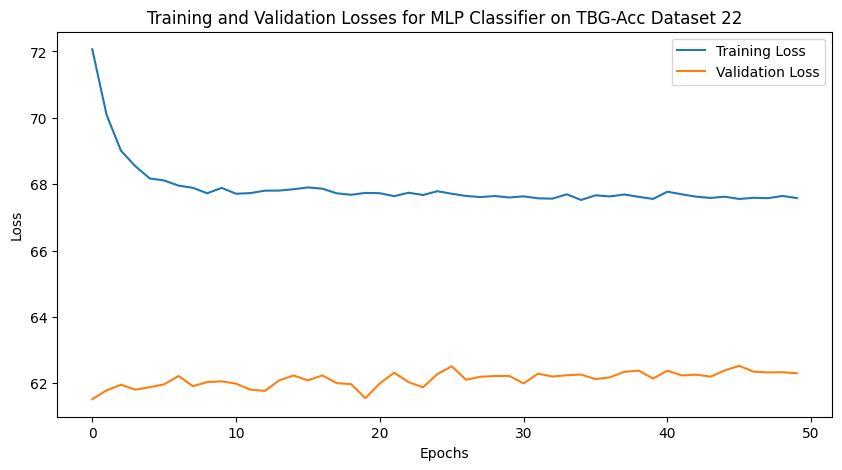

Test Loss: 67.7705, Test Accuracy: 0.7700, AUROC: 0.8307
Training on TBG-Acc Dataset 23/33
Epoch 1/50, Training Loss: 72.0934, Validation Loss: 61.7295, Training Accuracy: 0.5403
Epoch 10/50, Training Loss: 67.7726, Validation Loss: 61.9357, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 67.8039, Validation Loss: 62.3080, Training Accuracy: 0.9667
Epoch 30/50, Training Loss: 67.5675, Validation Loss: 61.8837, Training Accuracy: 0.9861
Epoch 40/50, Training Loss: 67.4704, Validation Loss: 62.2567, Training Accuracy: 0.9896
Epoch 50/50, Training Loss: 67.5689, Validation Loss: 62.4159, Training Accuracy: 0.9861


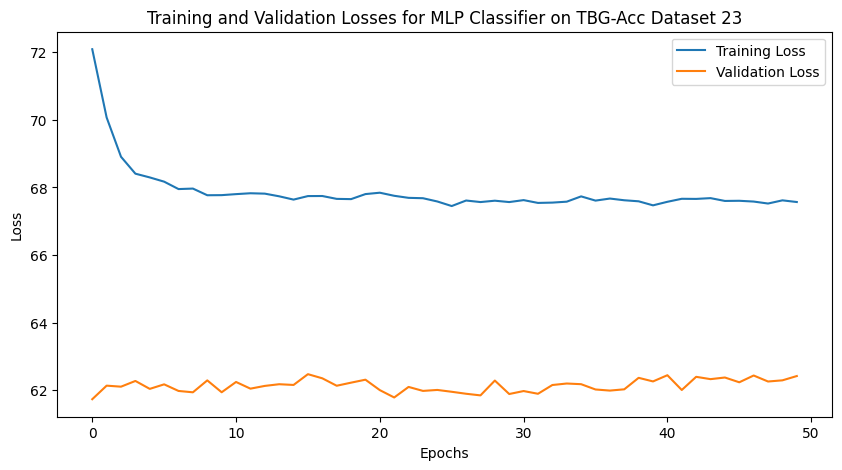

Test Loss: 68.0859, Test Accuracy: 0.7550, AUROC: 0.7428
Training on TBG-Acc Dataset 24/33
Epoch 1/50, Training Loss: 72.0728, Validation Loss: 62.1675, Training Accuracy: 0.5813
Epoch 10/50, Training Loss: 67.8735, Validation Loss: 62.0290, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 67.8266, Validation Loss: 62.0278, Training Accuracy: 0.9674
Epoch 30/50, Training Loss: 67.5805, Validation Loss: 62.3375, Training Accuracy: 0.9847
Epoch 40/50, Training Loss: 67.7432, Validation Loss: 62.0701, Training Accuracy: 0.9778
Epoch 50/50, Training Loss: 67.5954, Validation Loss: 61.8799, Training Accuracy: 0.9840


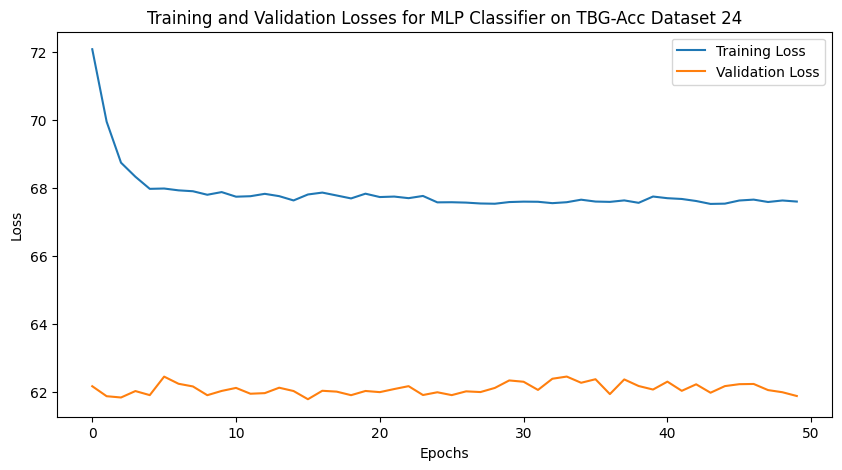

Test Loss: 68.0961, Test Accuracy: 0.7550, AUROC: 0.7398
Training on TBG-Acc Dataset 25/33
Epoch 1/50, Training Loss: 72.0551, Validation Loss: 61.7362, Training Accuracy: 0.5743
Epoch 10/50, Training Loss: 67.7226, Validation Loss: 61.8254, Training Accuracy: 0.9757
Epoch 20/50, Training Loss: 67.8172, Validation Loss: 61.9789, Training Accuracy: 0.9694
Epoch 30/50, Training Loss: 67.6033, Validation Loss: 62.2543, Training Accuracy: 0.9833
Epoch 40/50, Training Loss: 67.6717, Validation Loss: 62.4596, Training Accuracy: 0.9785
Epoch 50/50, Training Loss: 67.6474, Validation Loss: 62.0223, Training Accuracy: 0.9799


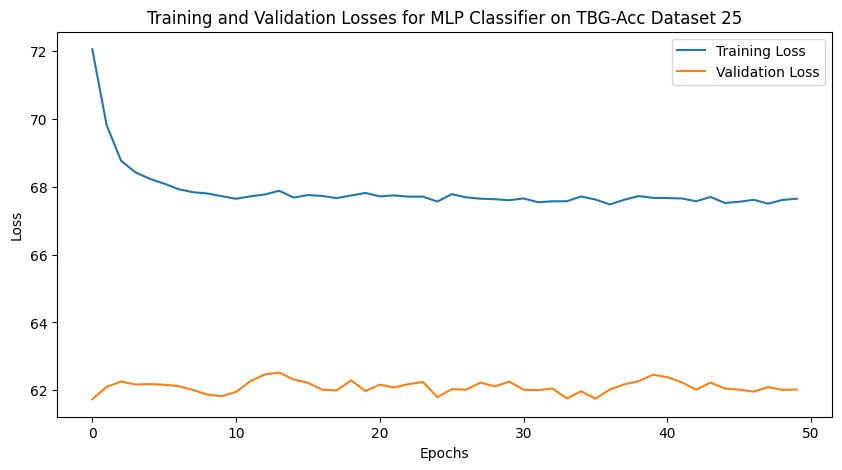

Test Loss: 68.5083, Test Accuracy: 0.7150, AUROC: 0.7422
Training on TBG-Acc Dataset 26/33
Epoch 1/50, Training Loss: 72.0292, Validation Loss: 61.7326, Training Accuracy: 0.5646
Epoch 10/50, Training Loss: 67.6514, Validation Loss: 61.8693, Training Accuracy: 0.9799
Epoch 20/50, Training Loss: 67.8204, Validation Loss: 62.0035, Training Accuracy: 0.9701
Epoch 30/50, Training Loss: 67.5831, Validation Loss: 61.8723, Training Accuracy: 0.9840
Epoch 40/50, Training Loss: 67.7530, Validation Loss: 62.2782, Training Accuracy: 0.9729
Epoch 50/50, Training Loss: 67.5070, Validation Loss: 61.6407, Training Accuracy: 0.9882


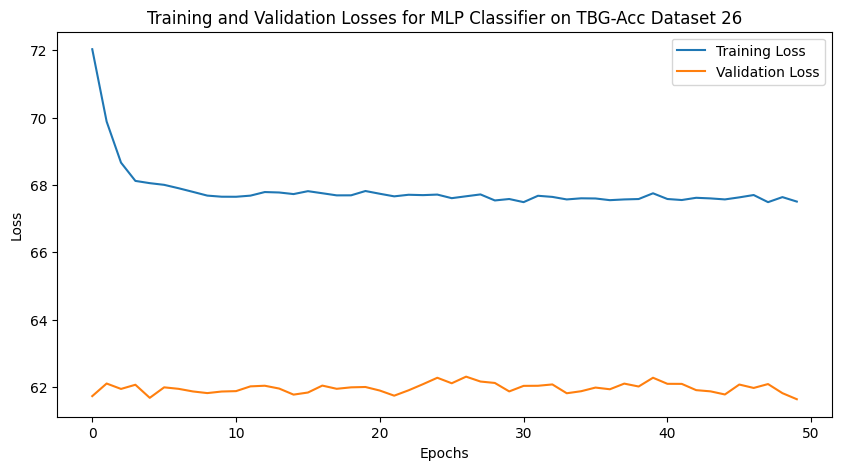

Test Loss: 68.0745, Test Accuracy: 0.7650, AUROC: 0.7265
Training on TBG-Acc Dataset 27/33
Epoch 1/50, Training Loss: 71.9545, Validation Loss: 62.0092, Training Accuracy: 0.6382
Epoch 10/50, Training Loss: 67.7905, Validation Loss: 62.0278, Training Accuracy: 0.9715
Epoch 20/50, Training Loss: 67.6021, Validation Loss: 62.0342, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 67.6899, Validation Loss: 61.9616, Training Accuracy: 0.9757
Epoch 40/50, Training Loss: 67.5565, Validation Loss: 61.8195, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 67.5750, Validation Loss: 61.8478, Training Accuracy: 0.9833


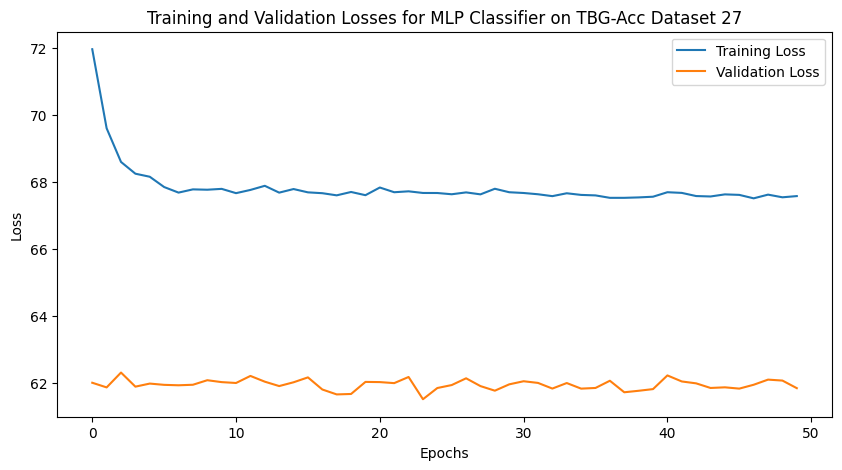

Test Loss: 68.2358, Test Accuracy: 0.7400, AUROC: 0.7624
Training on TBG-Acc Dataset 28/33
Epoch 1/50, Training Loss: 72.0319, Validation Loss: 61.6729, Training Accuracy: 0.6410
Epoch 10/50, Training Loss: 67.7581, Validation Loss: 61.8242, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 67.5752, Validation Loss: 61.7680, Training Accuracy: 0.9826
Epoch 30/50, Training Loss: 67.6604, Validation Loss: 61.9327, Training Accuracy: 0.9771
Epoch 40/50, Training Loss: 67.5327, Validation Loss: 62.3543, Training Accuracy: 0.9875
Epoch 50/50, Training Loss: 67.4885, Validation Loss: 62.3011, Training Accuracy: 0.9889


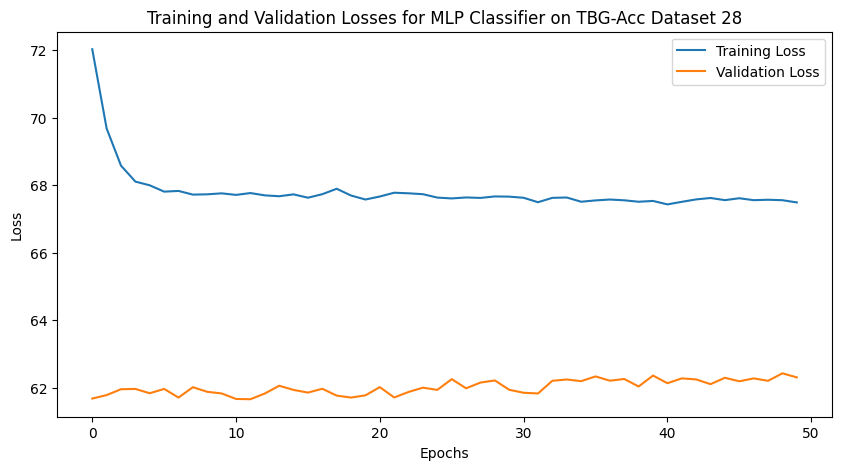

Test Loss: 68.5732, Test Accuracy: 0.7150, AUROC: 0.7245
Training on TBG-Acc Dataset 29/33
Epoch 1/50, Training Loss: 72.0765, Validation Loss: 61.7163, Training Accuracy: 0.5986
Epoch 10/50, Training Loss: 67.7318, Validation Loss: 61.9417, Training Accuracy: 0.9764
Epoch 20/50, Training Loss: 67.6929, Validation Loss: 62.0513, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 67.5851, Validation Loss: 61.6702, Training Accuracy: 0.9833
Epoch 40/50, Training Loss: 67.5122, Validation Loss: 61.9819, Training Accuracy: 0.9882
Epoch 50/50, Training Loss: 67.5776, Validation Loss: 61.5620, Training Accuracy: 0.9854


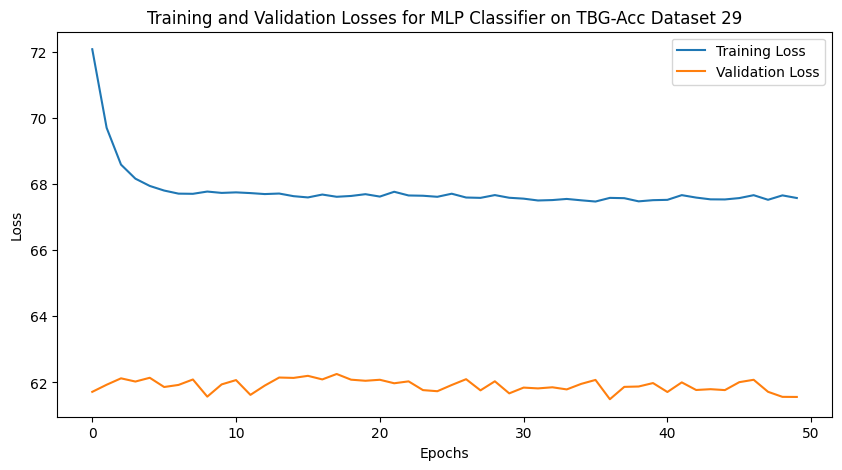

Test Loss: 68.2535, Test Accuracy: 0.7450, AUROC: 0.7369
Training on TBG-Acc Dataset 30/33
Epoch 1/50, Training Loss: 71.9010, Validation Loss: 61.6414, Training Accuracy: 0.6132
Epoch 10/50, Training Loss: 67.6793, Validation Loss: 61.4426, Training Accuracy: 0.9799
Epoch 20/50, Training Loss: 67.6271, Validation Loss: 61.9387, Training Accuracy: 0.9792
Epoch 30/50, Training Loss: 67.6558, Validation Loss: 61.4811, Training Accuracy: 0.9812
Epoch 40/50, Training Loss: 67.6070, Validation Loss: 61.4962, Training Accuracy: 0.9847
Epoch 50/50, Training Loss: 67.6999, Validation Loss: 61.3696, Training Accuracy: 0.9792


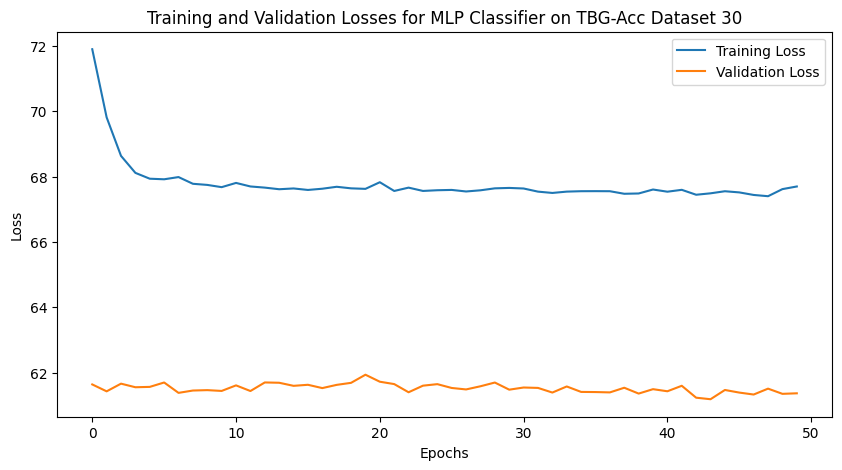

Test Loss: 68.7839, Test Accuracy: 0.6650, AUROC: 0.7673
Training on TBG-Acc Dataset 31/33
Epoch 1/50, Training Loss: 72.0059, Validation Loss: 61.4273, Training Accuracy: 0.5521
Epoch 10/50, Training Loss: 67.6955, Validation Loss: 61.4901, Training Accuracy: 0.9792
Epoch 20/50, Training Loss: 67.6330, Validation Loss: 61.8475, Training Accuracy: 0.9819
Epoch 30/50, Training Loss: 67.5495, Validation Loss: 61.8781, Training Accuracy: 0.9861
Epoch 40/50, Training Loss: 67.6720, Validation Loss: 61.8478, Training Accuracy: 0.9778
Epoch 50/50, Training Loss: 67.5828, Validation Loss: 61.5384, Training Accuracy: 0.9847


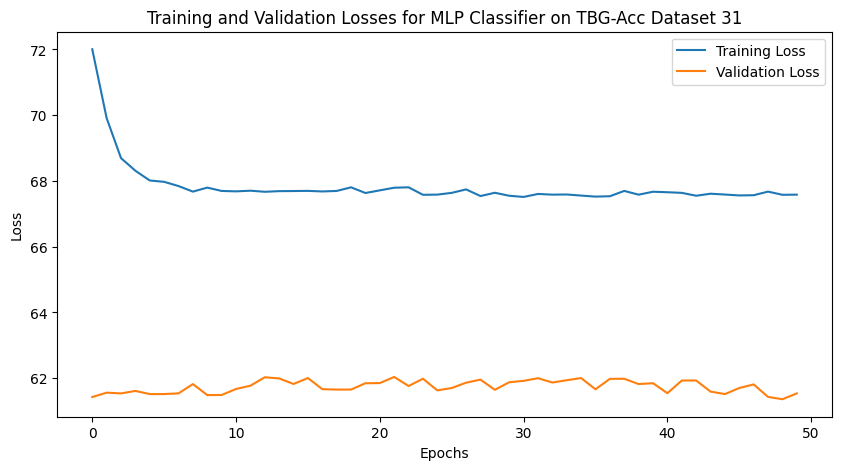

Test Loss: 68.5214, Test Accuracy: 0.7150, AUROC: 0.7090
Training on TBG-Acc Dataset 32/33
Epoch 1/50, Training Loss: 71.9101, Validation Loss: 61.7591, Training Accuracy: 0.5972
Epoch 10/50, Training Loss: 67.8082, Validation Loss: 61.4036, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 67.7008, Validation Loss: 61.6488, Training Accuracy: 0.9785
Epoch 30/50, Training Loss: 67.5696, Validation Loss: 61.3326, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 67.5457, Validation Loss: 61.6356, Training Accuracy: 0.9847
Epoch 50/50, Training Loss: 67.4868, Validation Loss: 61.7457, Training Accuracy: 0.9903


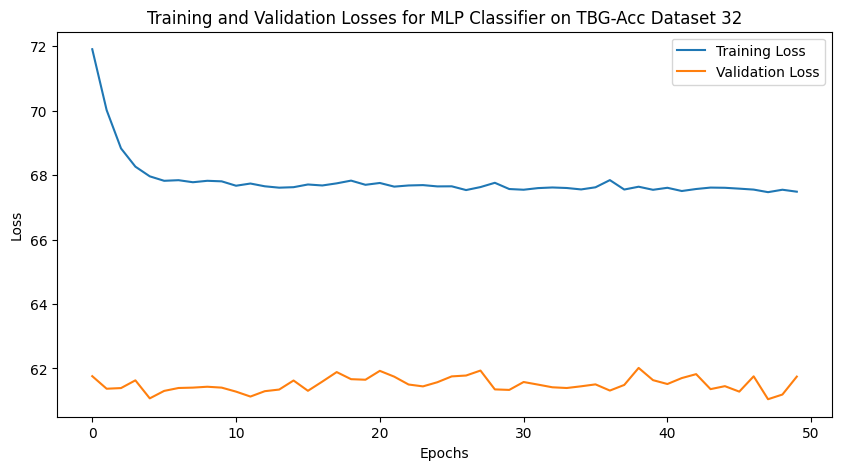

Test Loss: 68.0816, Test Accuracy: 0.7450, AUROC: 0.7923
Training on TBG-Acc Dataset 33/33
Epoch 1/50, Training Loss: 72.1174, Validation Loss: 61.8220, Training Accuracy: 0.6076
Epoch 10/50, Training Loss: 67.9734, Validation Loss: 61.4924, Training Accuracy: 0.9604
Epoch 20/50, Training Loss: 67.6620, Validation Loss: 61.8790, Training Accuracy: 0.9806
Epoch 30/50, Training Loss: 67.5294, Validation Loss: 61.7239, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 67.6735, Validation Loss: 61.6201, Training Accuracy: 0.9757
Epoch 50/50, Training Loss: 67.5523, Validation Loss: 61.7404, Training Accuracy: 0.9847


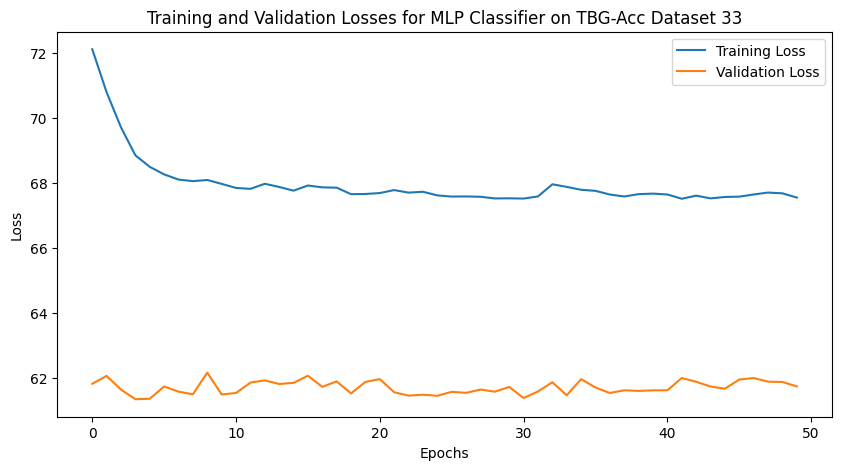

Test Loss: 68.5046, Test Accuracy: 0.6900, AUROC: 0.7621


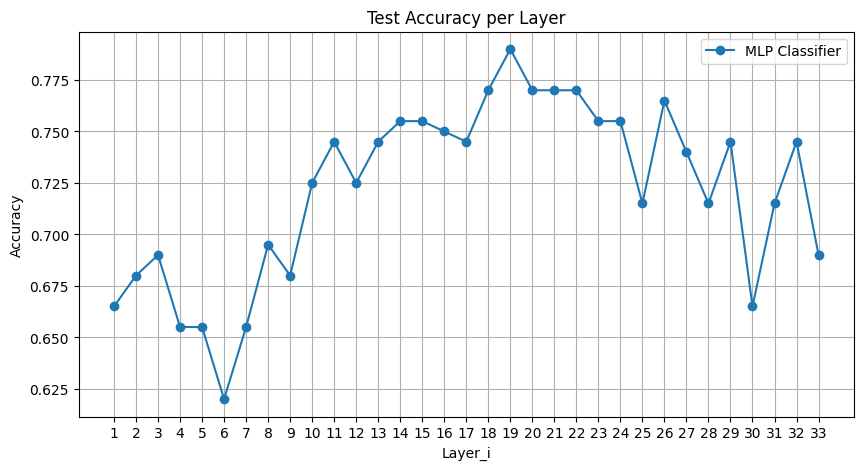

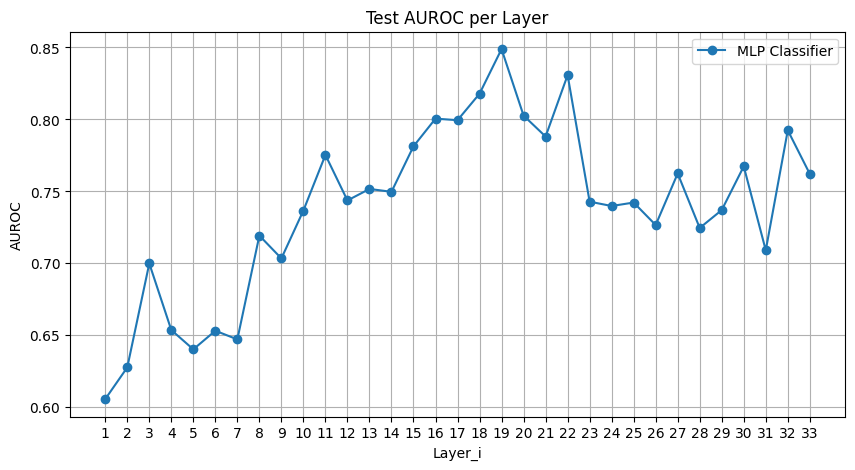

In [44]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions (e.g. Falcon-7B: 4544)
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
tamlp_test_accs = []
tamlp_test_aucs = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(tbg_train_dataloaders, tbg_valid_dataloaders, tbg_test_dataloaders)):
    print(f"Training on TBG-Acc Dataset {i+1}/{len(tbg_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on TBG-Acc Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    tamlp_test_accs.append(test_acc)
    tamlp_test_aucs.append(test_auc)

plot_1d_metrics([tamlp_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([tamlp_test_aucs], ['MLP Classifier'], 'AUROC')

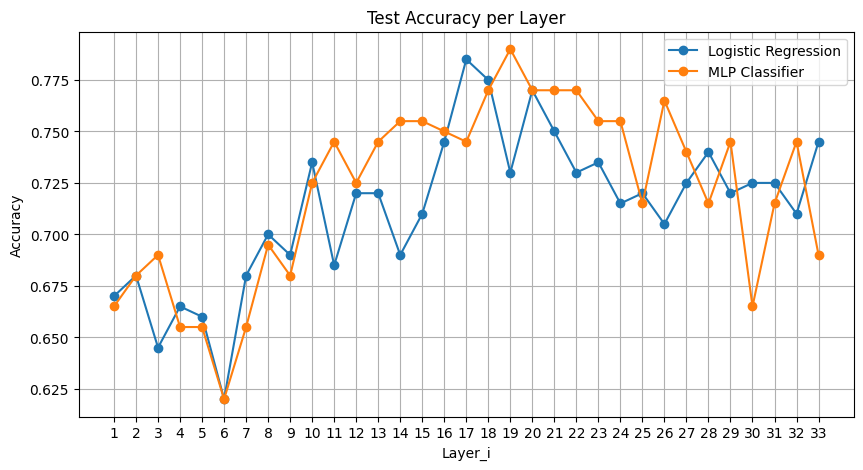

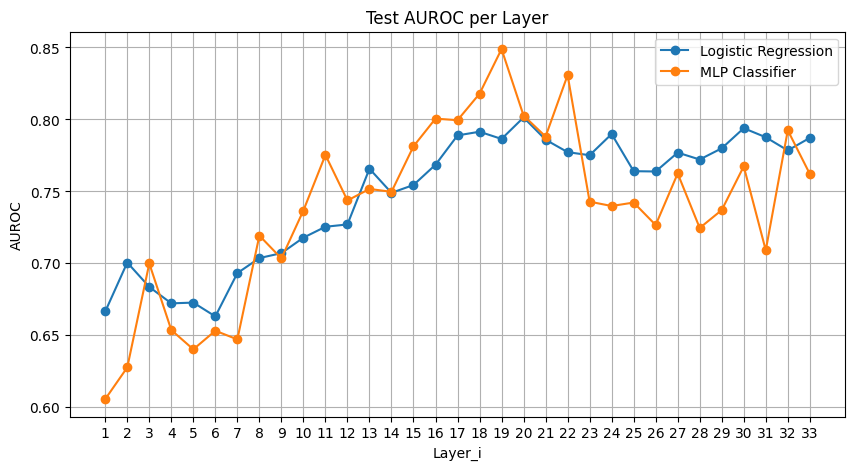

In [55]:
# LR vs MLP on TBG for Accuracy
plot_1d_metrics([talr_test_accs, tamlp_test_accs], ['Logistic Regression', 'MLP Classifier'], 'Accuracy')
plot_1d_metrics([talr_test_aucs, tamlp_test_aucs], ['Logistic Regression', 'MLP Classifier'], 'AUROC')

In [49]:
# Data for SLT embeddings
slt_train_dataloaders, slt_valid_dataloaders, slt_test_dataloaders = create_dataloaders(slt_layered_datasets, accuracies, total_size, batch_size)
X_trains, X_vals, X_tests, y_trains, y_vals, y_tests = create_Xs_and_ys(slt_layered_datasets, accuracies, total_size)

Training on SLT-Acc Dataset 1/32
Validation Accuracy: 0.6750, AUROC: 0.5260
Training Loss: 0.6418, Validation Loss: 0.6296
Test Loss: 0.6586, Test Accuracy: 0.6250, AUROC: 0.5854
Training on SLT-Acc Dataset 2/32
Validation Accuracy: 0.6750, AUROC: 0.5365
Training Loss: 0.6363, Validation Loss: 0.6278
Test Loss: 0.6569, Test Accuracy: 0.6250, AUROC: 0.5854
Training on SLT-Acc Dataset 3/32
Validation Accuracy: 0.6806, AUROC: 0.5851
Training Loss: 0.6211, Validation Loss: 0.6200
Test Loss: 0.6554, Test Accuracy: 0.6200, AUROC: 0.5707
Training on SLT-Acc Dataset 4/32
Validation Accuracy: 0.6833, AUROC: 0.6016
Training Loss: 0.6086, Validation Loss: 0.6144
Test Loss: 0.6486, Test Accuracy: 0.6300, AUROC: 0.5939
Training on SLT-Acc Dataset 5/32
Validation Accuracy: 0.6861, AUROC: 0.6098
Training Loss: 0.5703, Validation Loss: 0.6115
Test Loss: 0.6346, Test Accuracy: 0.6400, AUROC: 0.6298
Training on SLT-Acc Dataset 6/32
Validation Accuracy: 0.6667, AUROC: 0.6426
Training Loss: 0.5342, Valida

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6917, AUROC: 0.6943
Training Loss: 0.4289, Validation Loss: 0.5837
Test Loss: 0.5917, Test Accuracy: 0.6800, AUROC: 0.7098
Training on SLT-Acc Dataset 9/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6833, AUROC: 0.7086
Training Loss: 0.3813, Validation Loss: 0.5839
Test Loss: 0.5854, Test Accuracy: 0.6800, AUROC: 0.7244
Training on SLT-Acc Dataset 10/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7028, AUROC: 0.7201
Training Loss: 0.2510, Validation Loss: 0.6059
Test Loss: 0.6246, Test Accuracy: 0.6600, AUROC: 0.7279
Training on SLT-Acc Dataset 11/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7139, AUROC: 0.7207
Training Loss: 0.2051, Validation Loss: 0.6345
Test Loss: 0.6316, Test Accuracy: 0.6650, AUROC: 0.7330
Training on SLT-Acc Dataset 12/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7028, AUROC: 0.7130
Training Loss: 0.1652, Validation Loss: 0.6700
Test Loss: 0.6417, Test Accuracy: 0.7100, AUROC: 0.7475
Training on SLT-Acc Dataset 13/32
Validation Accuracy: 0.6972, AUROC: 0.7478
Training Loss: 0.1199, Validation Loss: 0.6702
Test Loss: 0.6859, Test Accuracy: 0.7100, AUROC: 0.7533
Training on SLT-Acc Dataset 14/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6833, AUROC: 0.7333
Training Loss: 0.0972, Validation Loss: 0.7452
Test Loss: 0.6747, Test Accuracy: 0.7000, AUROC: 0.7588
Training on SLT-Acc Dataset 15/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7167, AUROC: 0.7486
Training Loss: 0.0637, Validation Loss: 0.7743
Test Loss: 0.7293, Test Accuracy: 0.7350, AUROC: 0.7743
Training on SLT-Acc Dataset 16/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7250, AUROC: 0.7891
Training Loss: 0.0549, Validation Loss: 0.7054
Test Loss: 0.7550, Test Accuracy: 0.7150, AUROC: 0.7729
Training on SLT-Acc Dataset 17/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7639, AUROC: 0.7969
Training Loss: 0.0325, Validation Loss: 0.7870
Test Loss: 0.8288, Test Accuracy: 0.7450, AUROC: 0.7891
Training on SLT-Acc Dataset 18/32
Validation Accuracy: 0.7778, AUROC: 0.7866
Training Loss: 0.0238, Validation Loss: 0.8204
Test Loss: 0.9743, Test Accuracy: 0.7350, AUROC: 0.7626
Training on SLT-Acc Dataset 19/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7556, AUROC: 0.7684
Training Loss: 0.0185, Validation Loss: 0.9419
Test Loss: 1.0492, Test Accuracy: 0.7750, AUROC: 0.7742
Training on SLT-Acc Dataset 20/32
Validation Accuracy: 0.7278, AUROC: 0.7483
Training Loss: 0.0127, Validation Loss: 1.0473
Test Loss: 0.9387, Test Accuracy: 0.7600, AUROC: 0.7870
Training on SLT-Acc Dataset 21/32
Validation Accuracy: 0.7028, AUROC: 0.7097
Training Loss: 0.0082, Validation Loss: 1.3923
Test Loss: 1.1712, Test Accuracy: 0.7300, AUROC: 0.7654
Training on SLT-Acc Dataset 22/32
Validation Accuracy: 0.7000, AUROC: 0.7234
Training Loss: 0.0061, Validation Loss: 1.4137
Test Loss: 1.3273, Test Accuracy: 0.7550, AUROC: 0.7537
Training on SLT-Acc Dataset 23/32
Validation Accuracy: 0.7194, AUROC: 0.7570
Training Loss: 0.0048, Validation Loss: 1.2491
Test Loss: 1.3174, Test Accuracy: 0.7550, AUROC: 0.7700
Training on SLT-Acc Dataset 24/32
Validation Accuracy: 0.7139, AUROC: 0.7557
Training Loss: 0.0040, Validation Loss: 1.2427
Test Loss:

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7250, AUROC: 0.7571
Training Loss: 0.0027, Validation Loss: 1.3636
Test Loss: 1.4324, Test Accuracy: 0.7400, AUROC: 0.7685


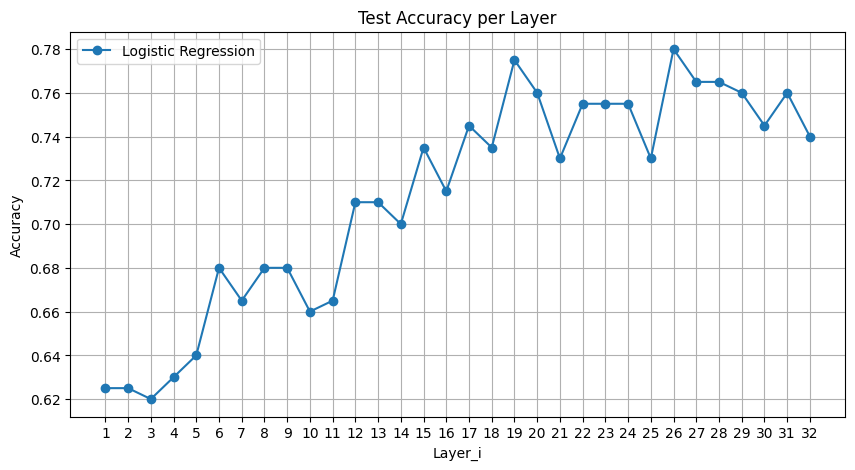

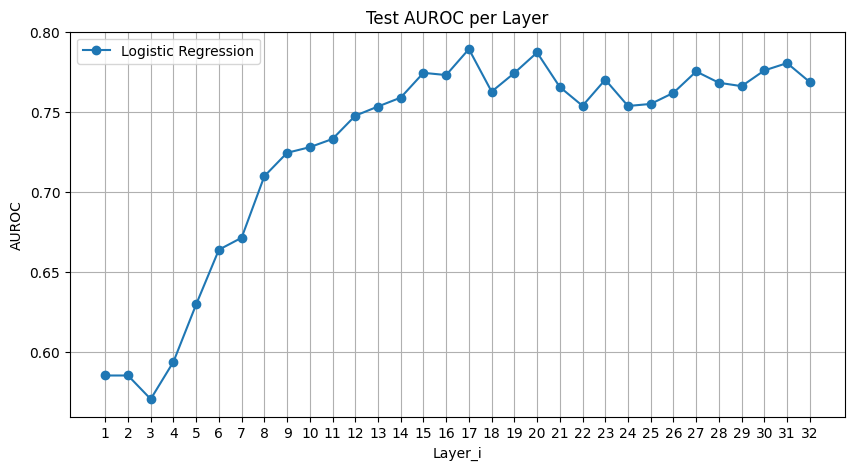

In [50]:
# Training with LR.
salr_test_accs = []
salr_test_aucs = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(X_trains, X_vals, X_tests, y_trains, y_vals, y_tests)):
    print(f"Training on SLT-Acc Dataset {i+1}/{len(X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on SLT-Acc Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    salr_test_accs.append(test_acc)
    salr_test_aucs.append(test_auc)

plot_1d_metrics([salr_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([salr_test_aucs], ['Logistic Regression'], 'AUROC')

Using device: cuda
Training on SLT-Acc Dataset 1/32
Epoch 1/50, Training Loss: 70.7873, Validation Loss: 71.4817, Training Accuracy: 0.5722
Epoch 10/50, Training Loss: 69.4814, Validation Loss: 71.6563, Training Accuracy: 0.7292
Epoch 20/50, Training Loss: 68.6713, Validation Loss: 72.1685, Training Accuracy: 0.7861
Epoch 30/50, Training Loss: 68.1487, Validation Loss: 72.2003, Training Accuracy: 0.8187
Epoch 40/50, Training Loss: 67.4992, Validation Loss: 71.8691, Training Accuracy: 0.8701
Epoch 50/50, Training Loss: 67.1744, Validation Loss: 71.7032, Training Accuracy: 0.8917


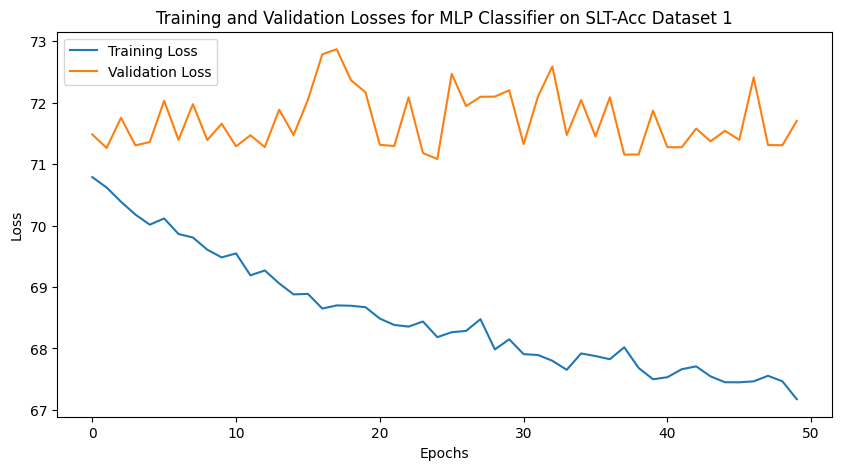

Test Loss: 63.8586, Test Accuracy: 0.6100, AUROC: 0.6245
Training on SLT-Acc Dataset 2/32
Epoch 1/50, Training Loss: 70.9035, Validation Loss: 71.5258, Training Accuracy: 0.5139
Epoch 10/50, Training Loss: 69.6171, Validation Loss: 72.4323, Training Accuracy: 0.7118
Epoch 20/50, Training Loss: 68.5792, Validation Loss: 71.4910, Training Accuracy: 0.7993
Epoch 30/50, Training Loss: 67.9361, Validation Loss: 71.4659, Training Accuracy: 0.8340
Epoch 40/50, Training Loss: 67.6638, Validation Loss: 72.4538, Training Accuracy: 0.8500
Epoch 50/50, Training Loss: 67.5433, Validation Loss: 72.2048, Training Accuracy: 0.8604


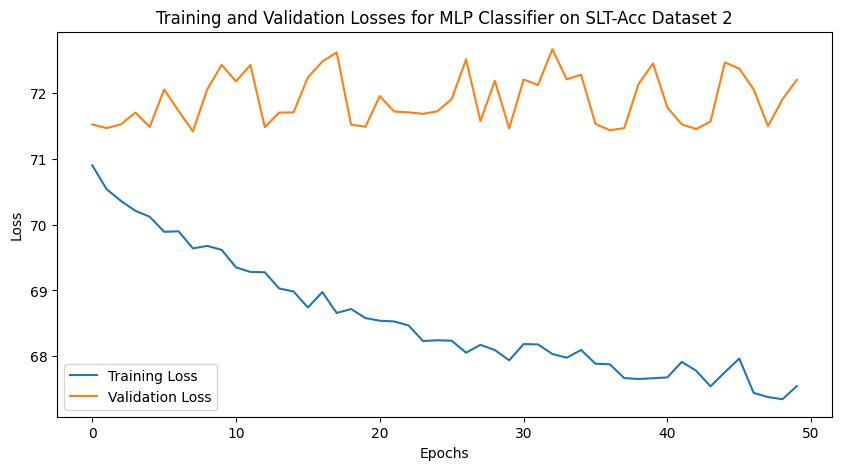

Test Loss: 63.9214, Test Accuracy: 0.6000, AUROC: 0.6355
Training on SLT-Acc Dataset 3/32
Epoch 1/50, Training Loss: 70.8237, Validation Loss: 71.5228, Training Accuracy: 0.5326
Epoch 10/50, Training Loss: 69.2653, Validation Loss: 71.7538, Training Accuracy: 0.7521
Epoch 20/50, Training Loss: 68.4265, Validation Loss: 72.2779, Training Accuracy: 0.8021
Epoch 30/50, Training Loss: 68.0353, Validation Loss: 71.4542, Training Accuracy: 0.8264
Epoch 40/50, Training Loss: 67.6491, Validation Loss: 71.6592, Training Accuracy: 0.8583
Epoch 50/50, Training Loss: 67.4372, Validation Loss: 71.3502, Training Accuracy: 0.8688


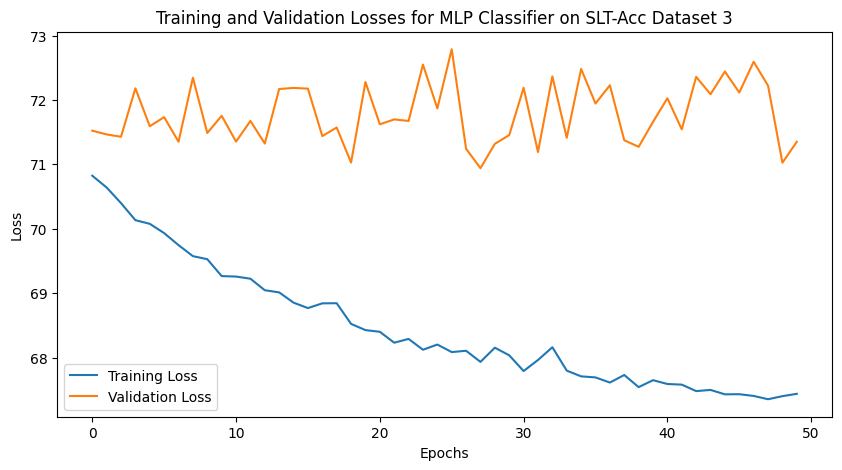

Test Loss: 63.4080, Test Accuracy: 0.6450, AUROC: 0.6484
Training on SLT-Acc Dataset 4/32
Epoch 1/50, Training Loss: 70.7691, Validation Loss: 71.4550, Training Accuracy: 0.5590
Epoch 10/50, Training Loss: 69.1095, Validation Loss: 71.4570, Training Accuracy: 0.7479
Epoch 20/50, Training Loss: 68.2567, Validation Loss: 71.5363, Training Accuracy: 0.8125
Epoch 30/50, Training Loss: 67.6541, Validation Loss: 72.0565, Training Accuracy: 0.8583
Epoch 40/50, Training Loss: 67.3464, Validation Loss: 71.9132, Training Accuracy: 0.8715
Epoch 50/50, Training Loss: 67.4077, Validation Loss: 72.3390, Training Accuracy: 0.8701


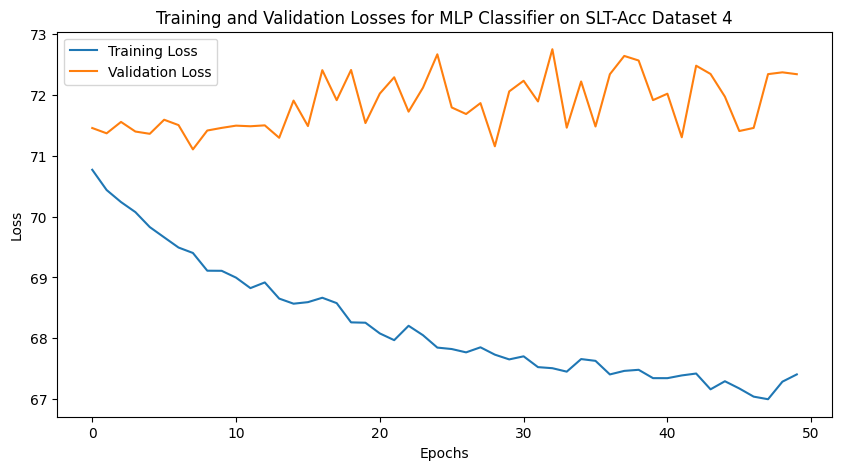

Test Loss: 63.9871, Test Accuracy: 0.4950, AUROC: 0.6149
Training on SLT-Acc Dataset 5/32
Epoch 1/50, Training Loss: 70.8723, Validation Loss: 71.6178, Training Accuracy: 0.5083
Epoch 10/50, Training Loss: 68.5939, Validation Loss: 71.2873, Training Accuracy: 0.7917
Epoch 20/50, Training Loss: 67.7050, Validation Loss: 71.4286, Training Accuracy: 0.8535
Epoch 30/50, Training Loss: 67.1516, Validation Loss: 71.3254, Training Accuracy: 0.8896
Epoch 40/50, Training Loss: 67.0602, Validation Loss: 71.1284, Training Accuracy: 0.8972
Epoch 50/50, Training Loss: 66.5899, Validation Loss: 72.5046, Training Accuracy: 0.9243


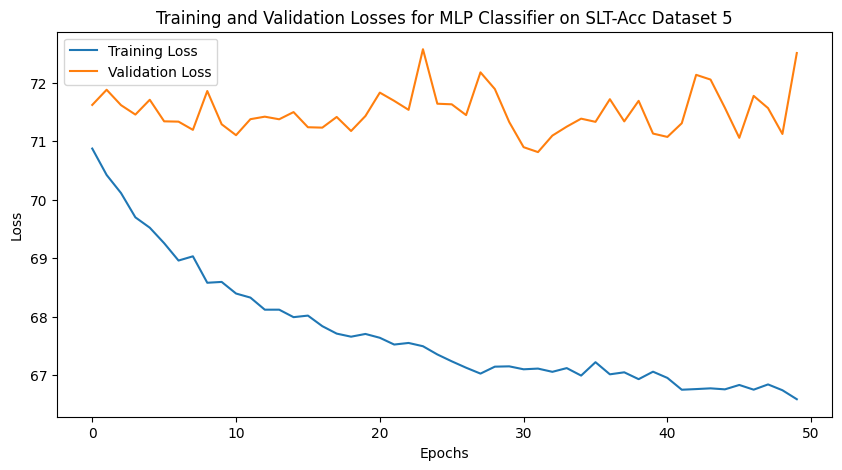

Test Loss: 63.3577, Test Accuracy: 0.5750, AUROC: 0.6597
Training on SLT-Acc Dataset 6/32
Epoch 1/50, Training Loss: 70.6647, Validation Loss: 71.5298, Training Accuracy: 0.6208
Epoch 10/50, Training Loss: 68.2275, Validation Loss: 71.5203, Training Accuracy: 0.8208
Epoch 20/50, Training Loss: 67.2004, Validation Loss: 71.3668, Training Accuracy: 0.8875
Epoch 30/50, Training Loss: 66.7778, Validation Loss: 72.0423, Training Accuracy: 0.9146
Epoch 40/50, Training Loss: 66.7923, Validation Loss: 71.9869, Training Accuracy: 0.9201
Epoch 50/50, Training Loss: 66.5385, Validation Loss: 71.5305, Training Accuracy: 0.9333


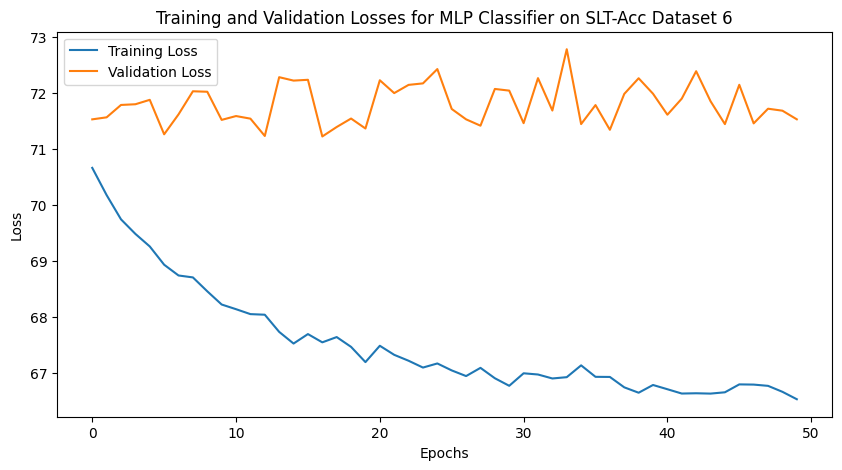

Test Loss: 63.5003, Test Accuracy: 0.6450, AUROC: 0.6628
Training on SLT-Acc Dataset 7/32
Epoch 1/50, Training Loss: 70.6766, Validation Loss: 71.6681, Training Accuracy: 0.5299
Epoch 10/50, Training Loss: 68.0054, Validation Loss: 71.8305, Training Accuracy: 0.8354
Epoch 20/50, Training Loss: 67.1637, Validation Loss: 71.9486, Training Accuracy: 0.8903
Epoch 30/50, Training Loss: 66.6936, Validation Loss: 72.0406, Training Accuracy: 0.9174
Epoch 40/50, Training Loss: 66.4866, Validation Loss: 72.4122, Training Accuracy: 0.9306
Epoch 50/50, Training Loss: 66.2650, Validation Loss: 71.7779, Training Accuracy: 0.9493


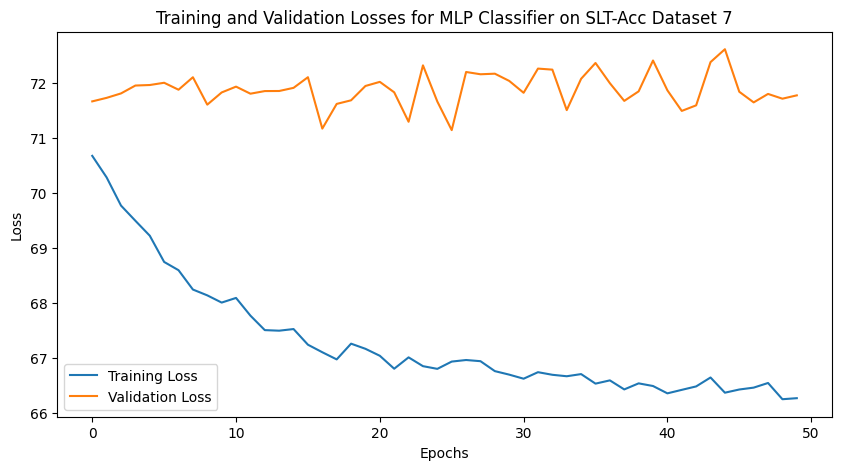

Test Loss: 63.5145, Test Accuracy: 0.6550, AUROC: 0.6478
Training on SLT-Acc Dataset 8/32
Epoch 1/50, Training Loss: 70.5661, Validation Loss: 71.4632, Training Accuracy: 0.5486
Epoch 10/50, Training Loss: 67.7900, Validation Loss: 72.0244, Training Accuracy: 0.8431
Epoch 20/50, Training Loss: 66.8529, Validation Loss: 71.9599, Training Accuracy: 0.9118
Epoch 30/50, Training Loss: 66.7440, Validation Loss: 71.5439, Training Accuracy: 0.9146
Epoch 40/50, Training Loss: 66.5227, Validation Loss: 72.0214, Training Accuracy: 0.9319
Epoch 50/50, Training Loss: 66.3329, Validation Loss: 71.5576, Training Accuracy: 0.9444


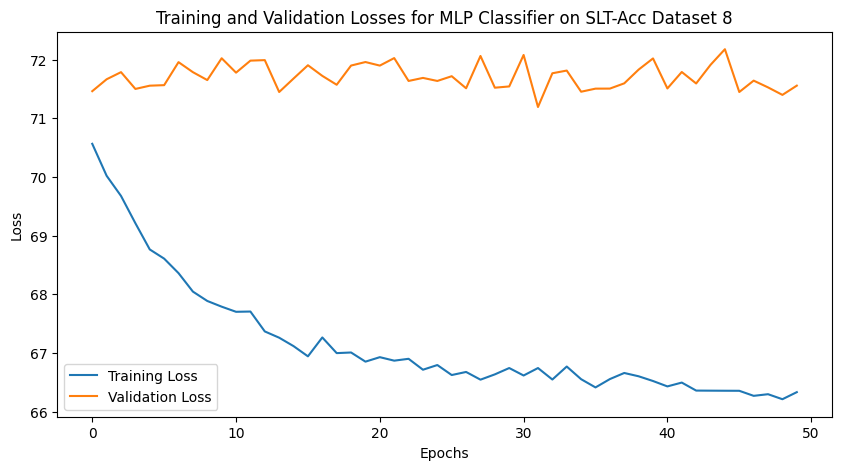

Test Loss: 62.9500, Test Accuracy: 0.6850, AUROC: 0.7016
Training on SLT-Acc Dataset 9/32
Epoch 1/50, Training Loss: 70.6630, Validation Loss: 71.5466, Training Accuracy: 0.5583
Epoch 10/50, Training Loss: 67.4723, Validation Loss: 71.5943, Training Accuracy: 0.8750
Epoch 20/50, Training Loss: 66.7594, Validation Loss: 71.7054, Training Accuracy: 0.9132
Epoch 30/50, Training Loss: 66.4907, Validation Loss: 71.3850, Training Accuracy: 0.9375
Epoch 40/50, Training Loss: 66.5622, Validation Loss: 71.7563, Training Accuracy: 0.9313
Epoch 50/50, Training Loss: 66.3340, Validation Loss: 71.5882, Training Accuracy: 0.9424


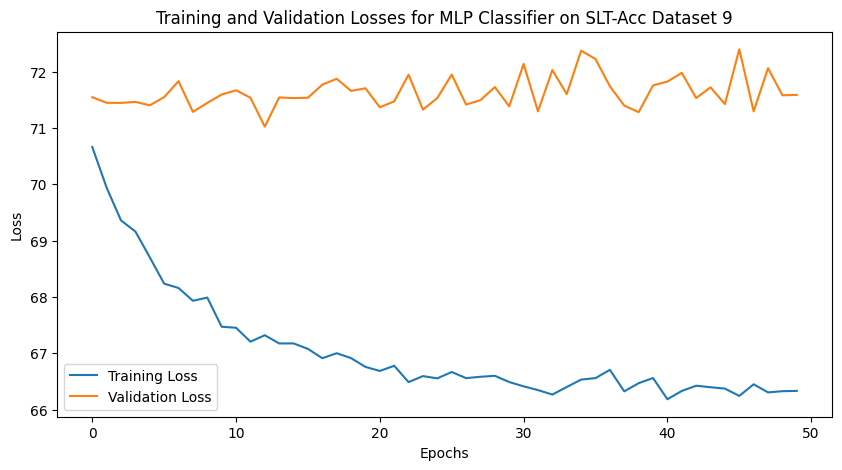

Test Loss: 63.2437, Test Accuracy: 0.6750, AUROC: 0.7227
Training on SLT-Acc Dataset 10/32
Epoch 1/50, Training Loss: 70.5216, Validation Loss: 71.3775, Training Accuracy: 0.5729
Epoch 10/50, Training Loss: 67.3930, Validation Loss: 71.1826, Training Accuracy: 0.8764
Epoch 20/50, Training Loss: 66.7981, Validation Loss: 71.6389, Training Accuracy: 0.9139
Epoch 30/50, Training Loss: 66.4356, Validation Loss: 71.6195, Training Accuracy: 0.9347
Epoch 40/50, Training Loss: 66.4171, Validation Loss: 71.4971, Training Accuracy: 0.9382
Epoch 50/50, Training Loss: 66.2258, Validation Loss: 71.5883, Training Accuracy: 0.9535


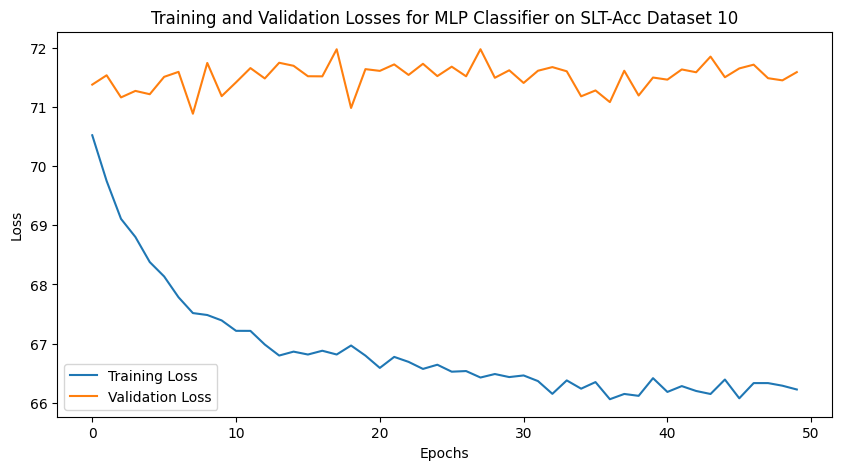

Test Loss: 62.8320, Test Accuracy: 0.7000, AUROC: 0.7419
Training on SLT-Acc Dataset 11/32
Epoch 1/50, Training Loss: 70.3873, Validation Loss: 71.6907, Training Accuracy: 0.5951
Epoch 10/50, Training Loss: 67.3463, Validation Loss: 71.1799, Training Accuracy: 0.8806
Epoch 20/50, Training Loss: 66.5518, Validation Loss: 71.0960, Training Accuracy: 0.9271
Epoch 30/50, Training Loss: 66.5204, Validation Loss: 71.0317, Training Accuracy: 0.9278
Epoch 40/50, Training Loss: 66.1988, Validation Loss: 71.2541, Training Accuracy: 0.9563
Epoch 50/50, Training Loss: 66.0387, Validation Loss: 71.3729, Training Accuracy: 0.9660


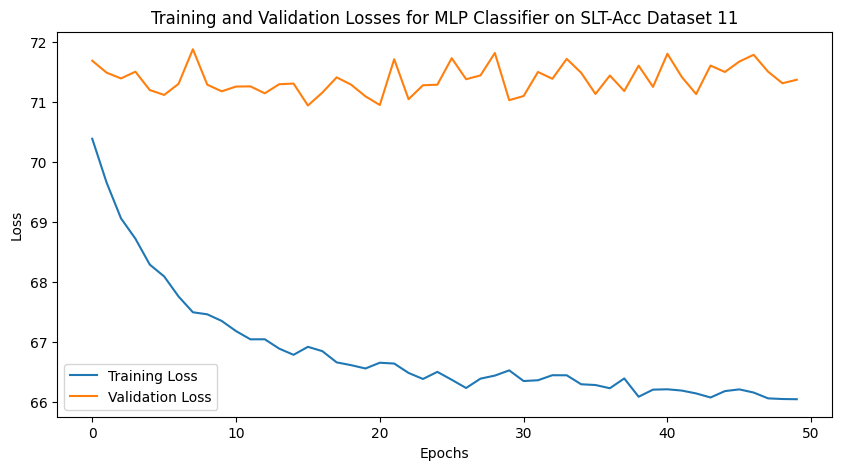

Test Loss: 62.6658, Test Accuracy: 0.7150, AUROC: 0.7630
Training on SLT-Acc Dataset 12/32
Epoch 1/50, Training Loss: 70.2675, Validation Loss: 71.2043, Training Accuracy: 0.5993
Epoch 10/50, Training Loss: 67.1066, Validation Loss: 71.4081, Training Accuracy: 0.8972
Epoch 20/50, Training Loss: 66.3332, Validation Loss: 71.5946, Training Accuracy: 0.9486
Epoch 30/50, Training Loss: 66.2039, Validation Loss: 71.0707, Training Accuracy: 0.9528
Epoch 40/50, Training Loss: 66.2158, Validation Loss: 71.1588, Training Accuracy: 0.9479
Epoch 50/50, Training Loss: 66.0033, Validation Loss: 71.4029, Training Accuracy: 0.9688


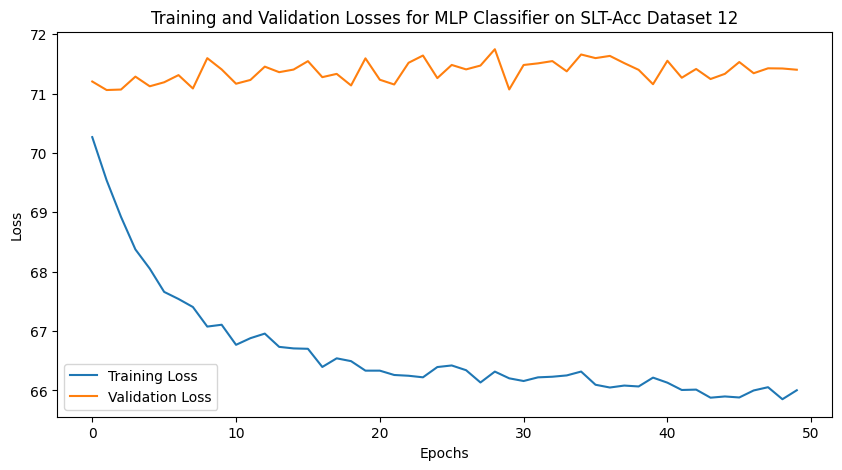

Test Loss: 62.6453, Test Accuracy: 0.7200, AUROC: 0.7590
Training on SLT-Acc Dataset 13/32
Epoch 1/50, Training Loss: 70.2988, Validation Loss: 71.2941, Training Accuracy: 0.6201
Epoch 10/50, Training Loss: 66.9319, Validation Loss: 71.5405, Training Accuracy: 0.9042
Epoch 20/50, Training Loss: 66.2596, Validation Loss: 71.4400, Training Accuracy: 0.9507
Epoch 30/50, Training Loss: 66.1869, Validation Loss: 71.2374, Training Accuracy: 0.9521
Epoch 40/50, Training Loss: 66.0521, Validation Loss: 71.5217, Training Accuracy: 0.9681
Epoch 50/50, Training Loss: 65.9044, Validation Loss: 71.4994, Training Accuracy: 0.9764


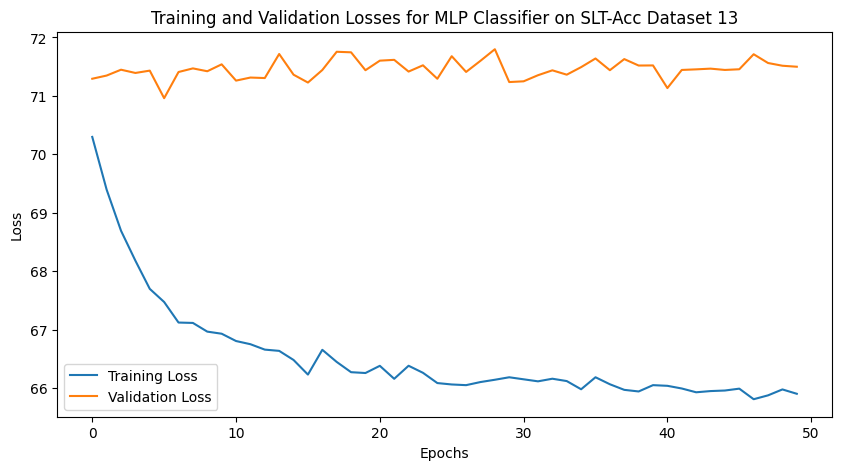

Test Loss: 62.9153, Test Accuracy: 0.6950, AUROC: 0.7727
Training on SLT-Acc Dataset 14/32
Epoch 1/50, Training Loss: 70.0719, Validation Loss: 70.9007, Training Accuracy: 0.6438
Epoch 10/50, Training Loss: 66.9364, Validation Loss: 71.5332, Training Accuracy: 0.9049
Epoch 20/50, Training Loss: 66.2718, Validation Loss: 71.1718, Training Accuracy: 0.9458
Epoch 30/50, Training Loss: 66.1800, Validation Loss: 71.0797, Training Accuracy: 0.9556
Epoch 40/50, Training Loss: 65.8957, Validation Loss: 71.3358, Training Accuracy: 0.9736
Epoch 50/50, Training Loss: 65.8604, Validation Loss: 71.4001, Training Accuracy: 0.9750


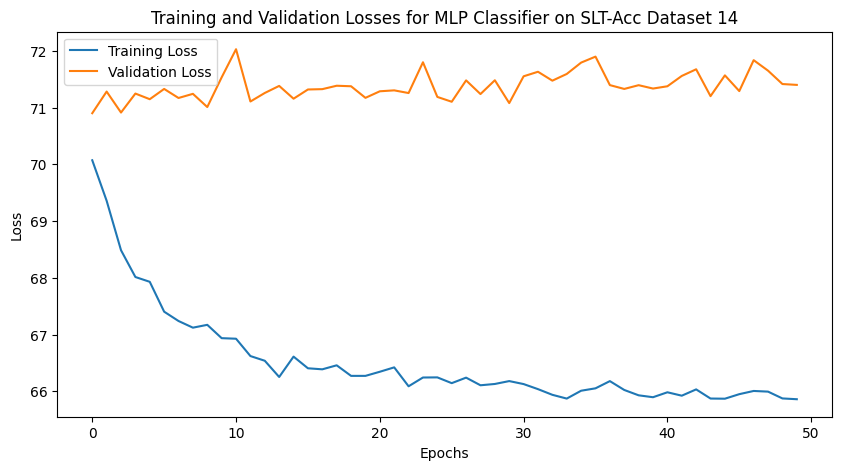

Test Loss: 62.7305, Test Accuracy: 0.7150, AUROC: 0.7794
Training on SLT-Acc Dataset 15/32
Epoch 1/50, Training Loss: 70.2311, Validation Loss: 71.2221, Training Accuracy: 0.6118
Epoch 10/50, Training Loss: 66.5819, Validation Loss: 70.9007, Training Accuracy: 0.9306
Epoch 20/50, Training Loss: 66.1902, Validation Loss: 71.2931, Training Accuracy: 0.9583
Epoch 30/50, Training Loss: 66.1118, Validation Loss: 71.2649, Training Accuracy: 0.9590
Epoch 40/50, Training Loss: 65.9923, Validation Loss: 71.3462, Training Accuracy: 0.9694
Epoch 50/50, Training Loss: 65.9119, Validation Loss: 71.1935, Training Accuracy: 0.9757


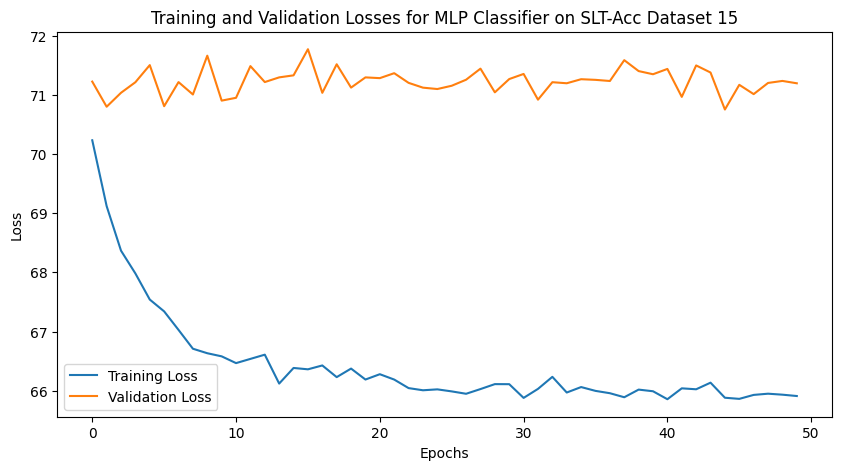

Test Loss: 62.5231, Test Accuracy: 0.7250, AUROC: 0.7705
Training on SLT-Acc Dataset 16/32
Epoch 1/50, Training Loss: 70.0218, Validation Loss: 71.0070, Training Accuracy: 0.6257
Epoch 10/50, Training Loss: 66.4574, Validation Loss: 71.0840, Training Accuracy: 0.9382
Epoch 20/50, Training Loss: 66.0547, Validation Loss: 71.3287, Training Accuracy: 0.9639
Epoch 30/50, Training Loss: 66.1684, Validation Loss: 71.1452, Training Accuracy: 0.9563
Epoch 40/50, Training Loss: 65.8664, Validation Loss: 71.1913, Training Accuracy: 0.9771
Epoch 50/50, Training Loss: 65.9155, Validation Loss: 71.0950, Training Accuracy: 0.9722


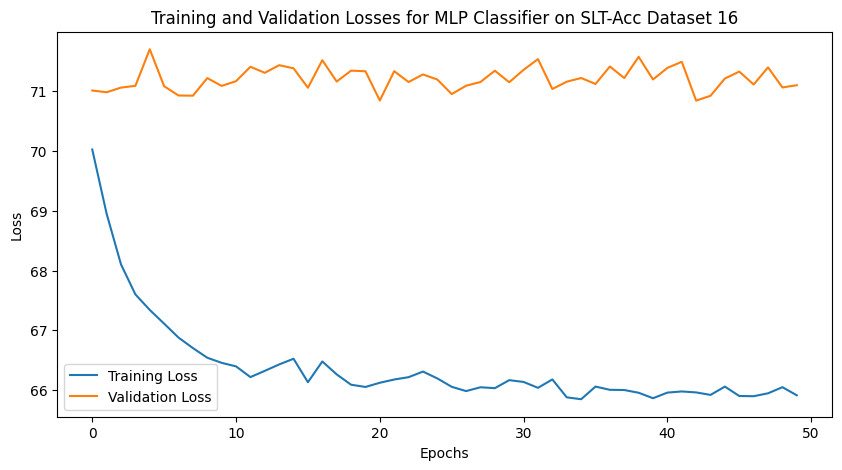

Test Loss: 62.5548, Test Accuracy: 0.7150, AUROC: 0.7826
Training on SLT-Acc Dataset 17/32
Epoch 1/50, Training Loss: 70.0132, Validation Loss: 71.1747, Training Accuracy: 0.6424
Epoch 10/50, Training Loss: 66.4825, Validation Loss: 70.9508, Training Accuracy: 0.9354
Epoch 20/50, Training Loss: 66.1627, Validation Loss: 70.9988, Training Accuracy: 0.9556
Epoch 30/50, Training Loss: 66.0795, Validation Loss: 71.4285, Training Accuracy: 0.9632
Epoch 40/50, Training Loss: 65.8674, Validation Loss: 71.1819, Training Accuracy: 0.9764
Epoch 50/50, Training Loss: 65.8168, Validation Loss: 71.3274, Training Accuracy: 0.9778


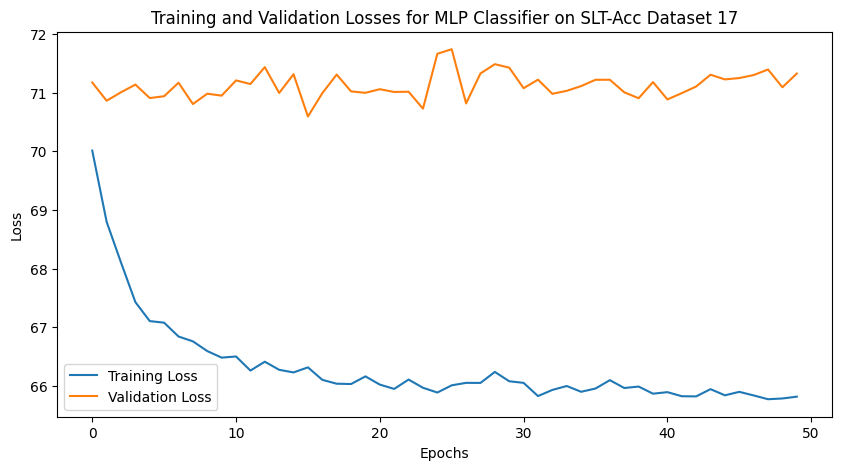

Test Loss: 62.8113, Test Accuracy: 0.7100, AUROC: 0.7769
Training on SLT-Acc Dataset 18/32
Epoch 1/50, Training Loss: 70.0789, Validation Loss: 71.1586, Training Accuracy: 0.6097
Epoch 10/50, Training Loss: 66.3548, Validation Loss: 71.1310, Training Accuracy: 0.9479
Epoch 20/50, Training Loss: 66.0186, Validation Loss: 71.1591, Training Accuracy: 0.9674
Epoch 30/50, Training Loss: 65.8771, Validation Loss: 71.3268, Training Accuracy: 0.9743
Epoch 40/50, Training Loss: 65.8393, Validation Loss: 71.3352, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 65.9513, Validation Loss: 71.6549, Training Accuracy: 0.9729


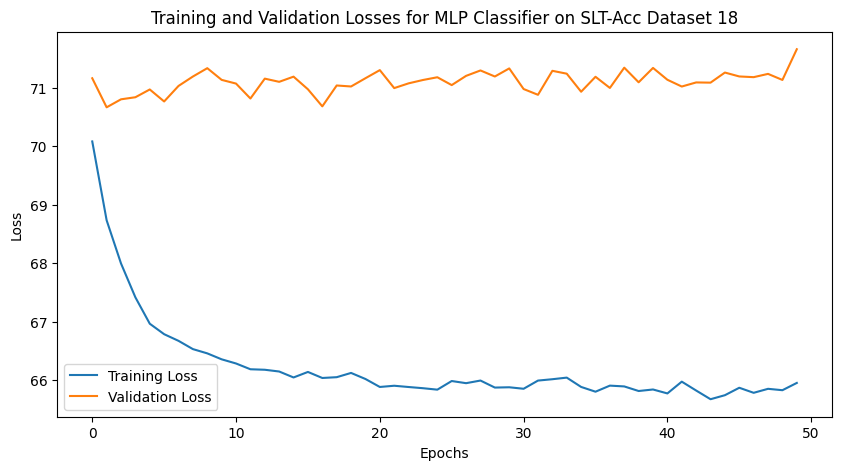

Test Loss: 62.4312, Test Accuracy: 0.7350, AUROC: 0.7735
Training on SLT-Acc Dataset 19/32
Epoch 1/50, Training Loss: 70.0729, Validation Loss: 71.0747, Training Accuracy: 0.6076
Epoch 10/50, Training Loss: 66.3442, Validation Loss: 71.5407, Training Accuracy: 0.9472
Epoch 20/50, Training Loss: 65.9438, Validation Loss: 71.5587, Training Accuracy: 0.9722
Epoch 30/50, Training Loss: 65.8898, Validation Loss: 71.2792, Training Accuracy: 0.9729
Epoch 40/50, Training Loss: 65.7635, Validation Loss: 71.4147, Training Accuracy: 0.9806
Epoch 50/50, Training Loss: 65.8433, Validation Loss: 71.2319, Training Accuracy: 0.9785


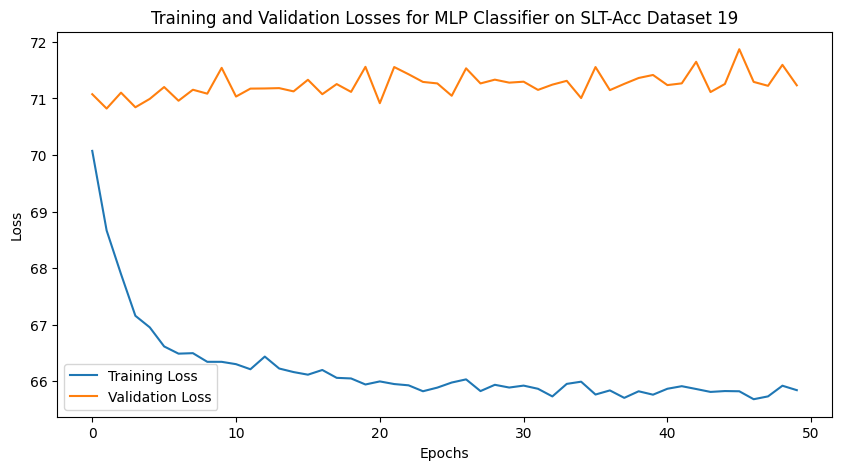

Test Loss: 62.5349, Test Accuracy: 0.7250, AUROC: 0.7932
Training on SLT-Acc Dataset 20/32
Epoch 1/50, Training Loss: 69.9952, Validation Loss: 71.1329, Training Accuracy: 0.6146
Epoch 10/50, Training Loss: 66.1337, Validation Loss: 71.2974, Training Accuracy: 0.9611
Epoch 20/50, Training Loss: 65.7974, Validation Loss: 71.3338, Training Accuracy: 0.9792
Epoch 30/50, Training Loss: 65.7722, Validation Loss: 71.2795, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 65.8137, Validation Loss: 71.3384, Training Accuracy: 0.9792
Epoch 50/50, Training Loss: 65.6814, Validation Loss: 71.6264, Training Accuracy: 0.9889


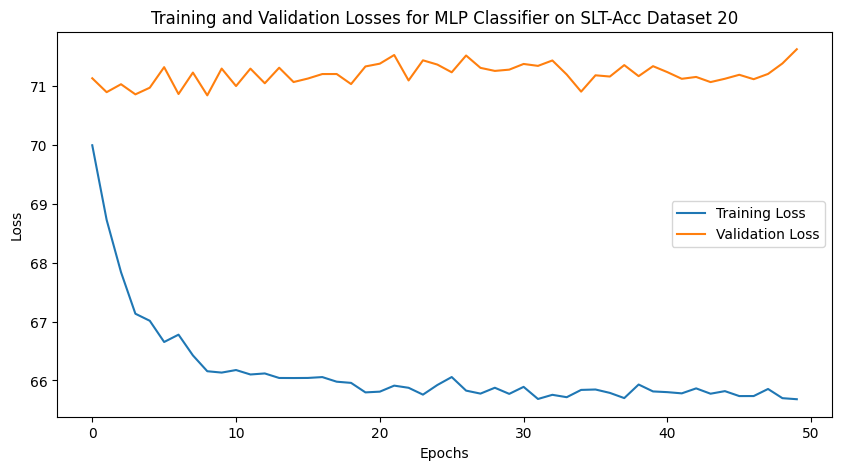

Test Loss: 62.1190, Test Accuracy: 0.7500, AUROC: 0.7969
Training on SLT-Acc Dataset 21/32
Epoch 1/50, Training Loss: 70.1279, Validation Loss: 70.9205, Training Accuracy: 0.6229
Epoch 10/50, Training Loss: 66.2109, Validation Loss: 71.1535, Training Accuracy: 0.9563
Epoch 20/50, Training Loss: 65.9766, Validation Loss: 71.1023, Training Accuracy: 0.9674
Epoch 30/50, Training Loss: 65.8066, Validation Loss: 70.7054, Training Accuracy: 0.9812
Epoch 40/50, Training Loss: 65.8128, Validation Loss: 70.9082, Training Accuracy: 0.9840
Epoch 50/50, Training Loss: 65.7230, Validation Loss: 70.9606, Training Accuracy: 0.9826


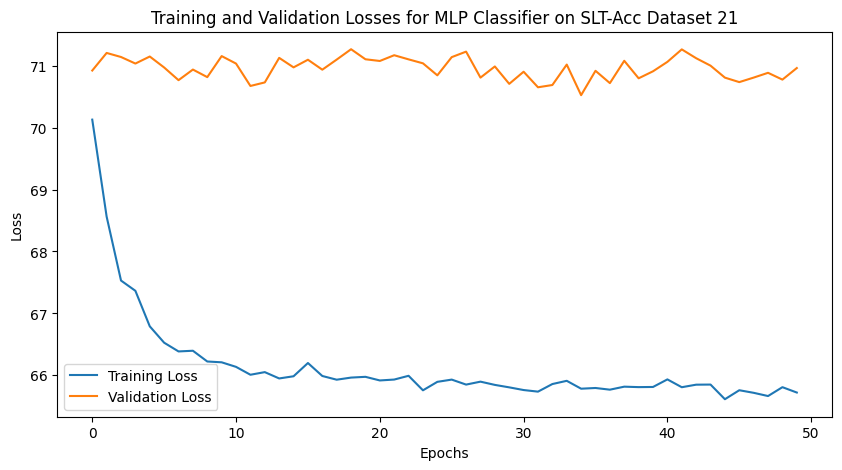

Test Loss: 62.6111, Test Accuracy: 0.7300, AUROC: 0.7588
Training on SLT-Acc Dataset 22/32
Epoch 1/50, Training Loss: 70.2448, Validation Loss: 71.2117, Training Accuracy: 0.6208
Epoch 10/50, Training Loss: 66.1588, Validation Loss: 71.1893, Training Accuracy: 0.9597
Epoch 20/50, Training Loss: 65.7724, Validation Loss: 70.9929, Training Accuracy: 0.9840
Epoch 30/50, Training Loss: 65.7988, Validation Loss: 71.0134, Training Accuracy: 0.9819
Epoch 40/50, Training Loss: 65.8720, Validation Loss: 70.8891, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 65.7718, Validation Loss: 70.8451, Training Accuracy: 0.9847


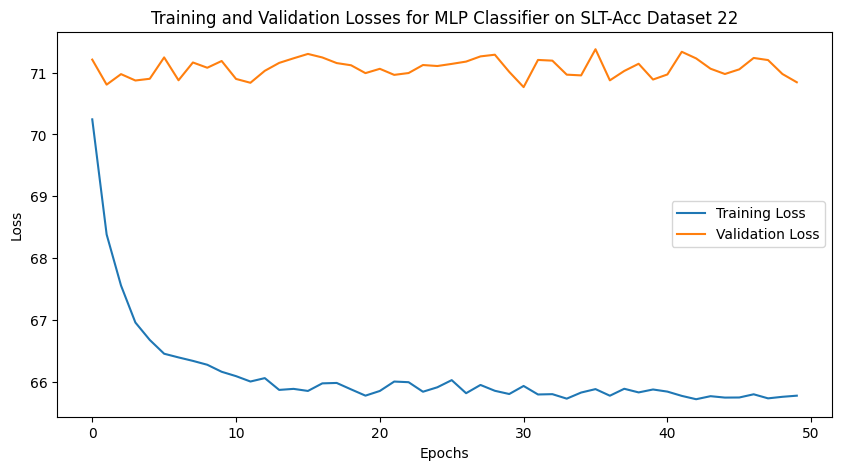

Test Loss: 62.4742, Test Accuracy: 0.7200, AUROC: 0.7878
Training on SLT-Acc Dataset 23/32
Epoch 1/50, Training Loss: 70.0375, Validation Loss: 70.9849, Training Accuracy: 0.6292
Epoch 10/50, Training Loss: 66.2372, Validation Loss: 71.0067, Training Accuracy: 0.9535
Epoch 20/50, Training Loss: 65.8684, Validation Loss: 70.8070, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 65.8796, Validation Loss: 70.8202, Training Accuracy: 0.9736
Epoch 40/50, Training Loss: 65.7163, Validation Loss: 70.9529, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 65.7481, Validation Loss: 71.0182, Training Accuracy: 0.9847


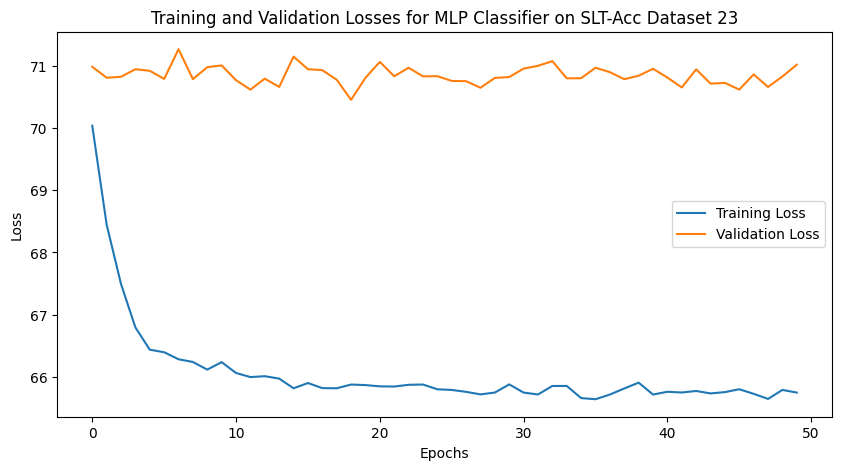

Test Loss: 62.6874, Test Accuracy: 0.7150, AUROC: 0.7312
Training on SLT-Acc Dataset 24/32
Epoch 1/50, Training Loss: 69.9700, Validation Loss: 70.7778, Training Accuracy: 0.6479
Epoch 10/50, Training Loss: 65.9753, Validation Loss: 70.4655, Training Accuracy: 0.9694
Epoch 20/50, Training Loss: 66.0156, Validation Loss: 70.6701, Training Accuracy: 0.9632
Epoch 30/50, Training Loss: 65.7710, Validation Loss: 70.8638, Training Accuracy: 0.9819
Epoch 40/50, Training Loss: 65.8939, Validation Loss: 70.9711, Training Accuracy: 0.9722
Epoch 50/50, Training Loss: 65.7701, Validation Loss: 71.0687, Training Accuracy: 0.9854


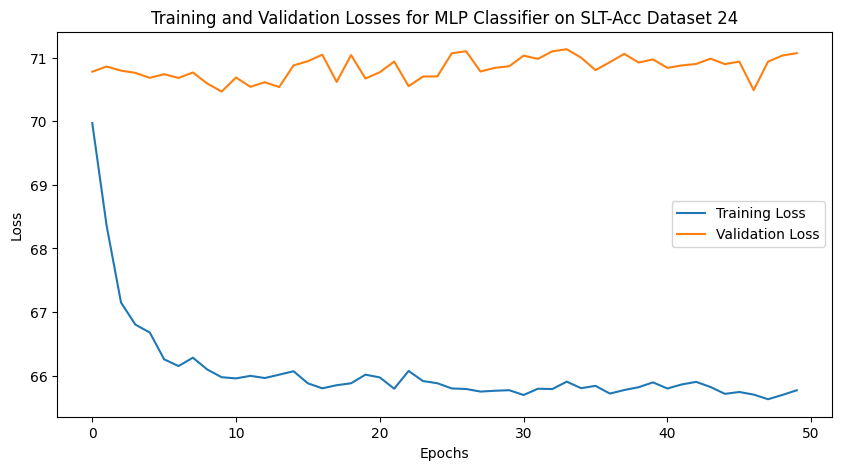

Test Loss: 62.0631, Test Accuracy: 0.7600, AUROC: 0.7923
Training on SLT-Acc Dataset 25/32
Epoch 1/50, Training Loss: 70.0823, Validation Loss: 70.9686, Training Accuracy: 0.6236
Epoch 10/50, Training Loss: 65.9492, Validation Loss: 70.6541, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 66.0153, Validation Loss: 70.6460, Training Accuracy: 0.9667
Epoch 30/50, Training Loss: 65.7588, Validation Loss: 70.6686, Training Accuracy: 0.9833
Epoch 40/50, Training Loss: 65.7371, Validation Loss: 70.8382, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 65.7302, Validation Loss: 71.0047, Training Accuracy: 0.9875


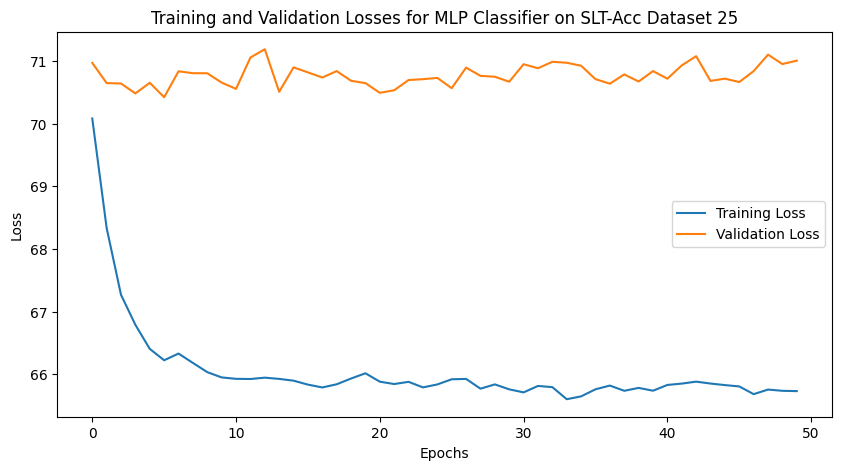

Test Loss: 62.6122, Test Accuracy: 0.7200, AUROC: 0.7469
Training on SLT-Acc Dataset 26/32
Epoch 1/50, Training Loss: 69.9851, Validation Loss: 70.9509, Training Accuracy: 0.6604
Epoch 10/50, Training Loss: 65.9613, Validation Loss: 71.0255, Training Accuracy: 0.9708
Epoch 20/50, Training Loss: 66.0068, Validation Loss: 70.9771, Training Accuracy: 0.9667
Epoch 30/50, Training Loss: 65.8533, Validation Loss: 70.8570, Training Accuracy: 0.9771
Epoch 40/50, Training Loss: 65.6543, Validation Loss: 71.2854, Training Accuracy: 0.9875
Epoch 50/50, Training Loss: 65.6471, Validation Loss: 70.9982, Training Accuracy: 0.9917


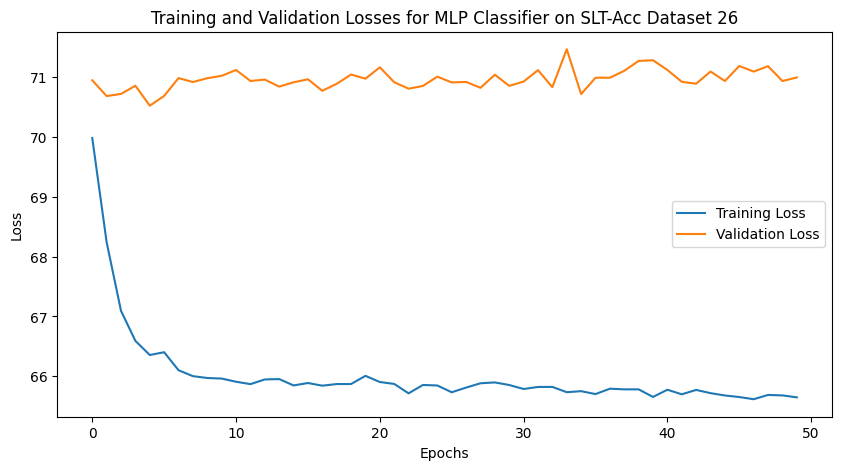

Test Loss: 62.4839, Test Accuracy: 0.7300, AUROC: 0.7699
Training on SLT-Acc Dataset 27/32
Epoch 1/50, Training Loss: 70.1600, Validation Loss: 70.9974, Training Accuracy: 0.6007
Epoch 10/50, Training Loss: 65.9753, Validation Loss: 71.1078, Training Accuracy: 0.9736
Epoch 20/50, Training Loss: 65.7257, Validation Loss: 71.4724, Training Accuracy: 0.9882
Epoch 30/50, Training Loss: 65.7995, Validation Loss: 71.0439, Training Accuracy: 0.9792
Epoch 40/50, Training Loss: 65.7443, Validation Loss: 71.2656, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 65.7029, Validation Loss: 71.0913, Training Accuracy: 0.9882


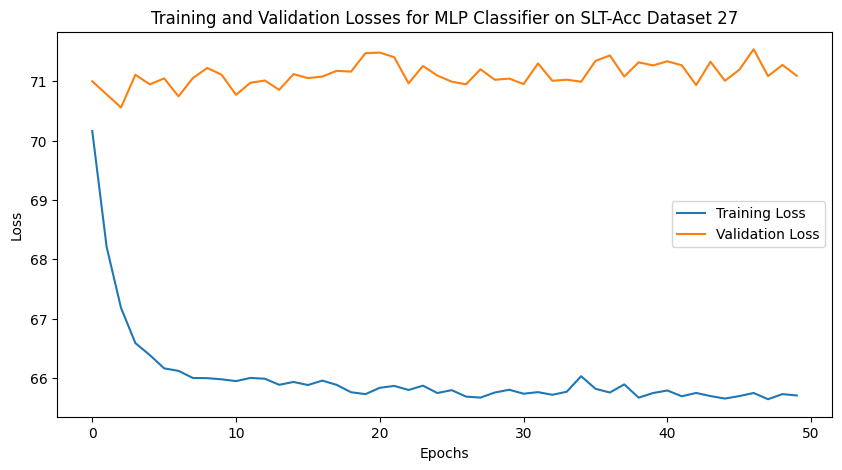

Test Loss: 62.4332, Test Accuracy: 0.7350, AUROC: 0.7809
Training on SLT-Acc Dataset 28/32
Epoch 1/50, Training Loss: 70.0359, Validation Loss: 71.1203, Training Accuracy: 0.6375
Epoch 10/50, Training Loss: 65.9594, Validation Loss: 70.8869, Training Accuracy: 0.9708
Epoch 20/50, Training Loss: 65.8335, Validation Loss: 71.2621, Training Accuracy: 0.9833
Epoch 30/50, Training Loss: 65.8531, Validation Loss: 71.1255, Training Accuracy: 0.9861
Epoch 40/50, Training Loss: 65.7380, Validation Loss: 71.1967, Training Accuracy: 0.9833
Epoch 50/50, Training Loss: 65.7449, Validation Loss: 71.0748, Training Accuracy: 0.9875


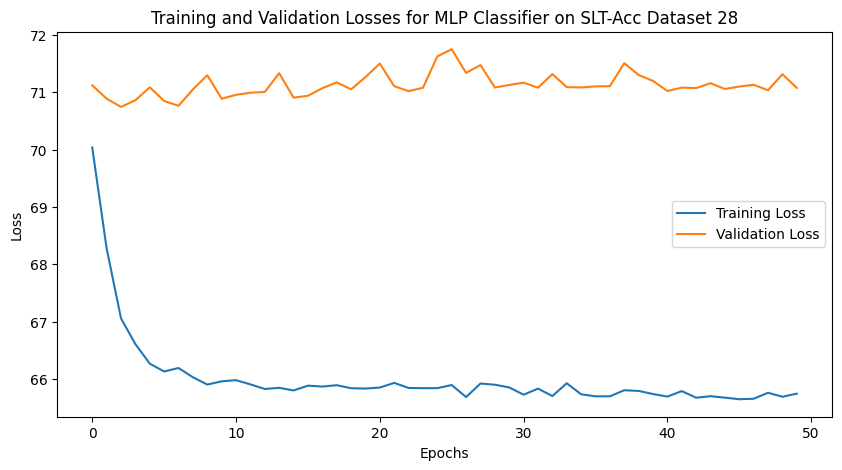

Test Loss: 62.8618, Test Accuracy: 0.6900, AUROC: 0.7745
Training on SLT-Acc Dataset 29/32
Epoch 1/50, Training Loss: 70.1467, Validation Loss: 71.1554, Training Accuracy: 0.6410
Epoch 10/50, Training Loss: 65.8551, Validation Loss: 71.3023, Training Accuracy: 0.9799
Epoch 20/50, Training Loss: 65.7420, Validation Loss: 71.0140, Training Accuracy: 0.9854
Epoch 30/50, Training Loss: 65.7654, Validation Loss: 70.8556, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 65.6495, Validation Loss: 70.9952, Training Accuracy: 0.9896
Epoch 50/50, Training Loss: 65.6684, Validation Loss: 70.8915, Training Accuracy: 0.9903


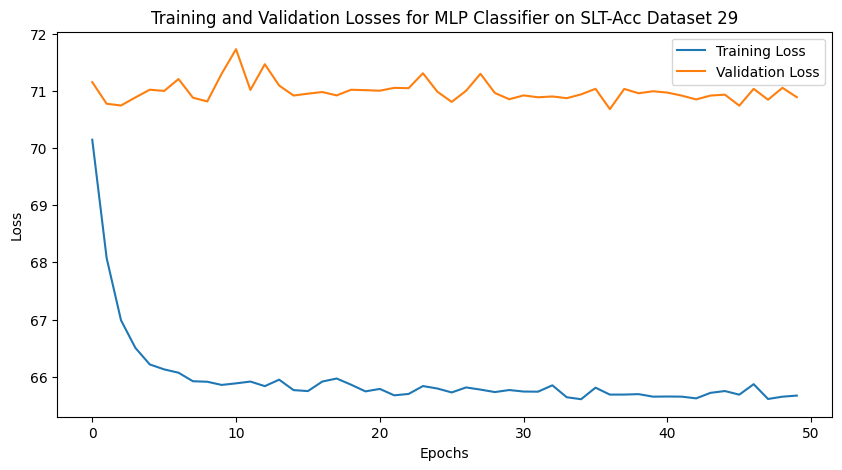

Test Loss: 62.6118, Test Accuracy: 0.7250, AUROC: 0.8025
Training on SLT-Acc Dataset 30/32
Epoch 1/50, Training Loss: 70.0713, Validation Loss: 70.9029, Training Accuracy: 0.5993
Epoch 10/50, Training Loss: 65.8863, Validation Loss: 71.1000, Training Accuracy: 0.9778
Epoch 20/50, Training Loss: 65.7809, Validation Loss: 70.9876, Training Accuracy: 0.9840
Epoch 30/50, Training Loss: 65.7601, Validation Loss: 70.9650, Training Accuracy: 0.9840
Epoch 40/50, Training Loss: 65.7141, Validation Loss: 70.8409, Training Accuracy: 0.9875
Epoch 50/50, Training Loss: 65.6811, Validation Loss: 71.1989, Training Accuracy: 0.9903


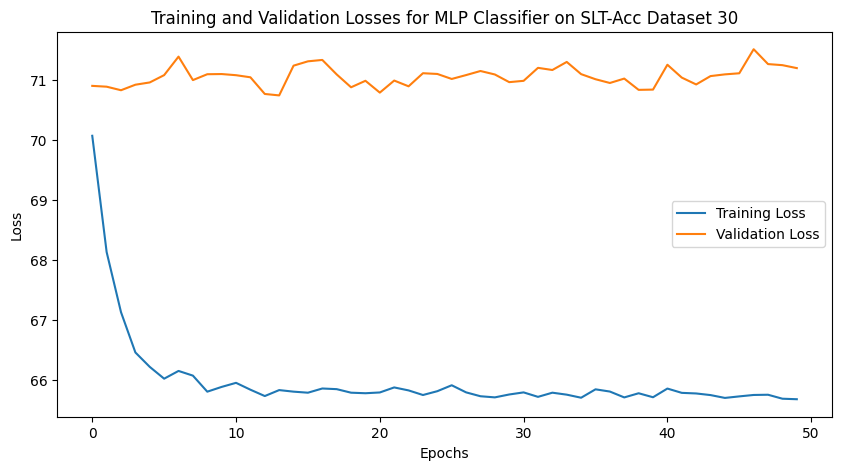

Test Loss: 62.0779, Test Accuracy: 0.7600, AUROC: 0.8224
Training on SLT-Acc Dataset 31/32
Epoch 1/50, Training Loss: 70.0041, Validation Loss: 71.0085, Training Accuracy: 0.6424
Epoch 10/50, Training Loss: 65.9699, Validation Loss: 71.2769, Training Accuracy: 0.9757
Epoch 20/50, Training Loss: 65.7338, Validation Loss: 71.2954, Training Accuracy: 0.9875
Epoch 30/50, Training Loss: 65.7501, Validation Loss: 71.0599, Training Accuracy: 0.9875
Epoch 40/50, Training Loss: 65.6833, Validation Loss: 71.3929, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 65.5976, Validation Loss: 71.2102, Training Accuracy: 0.9931


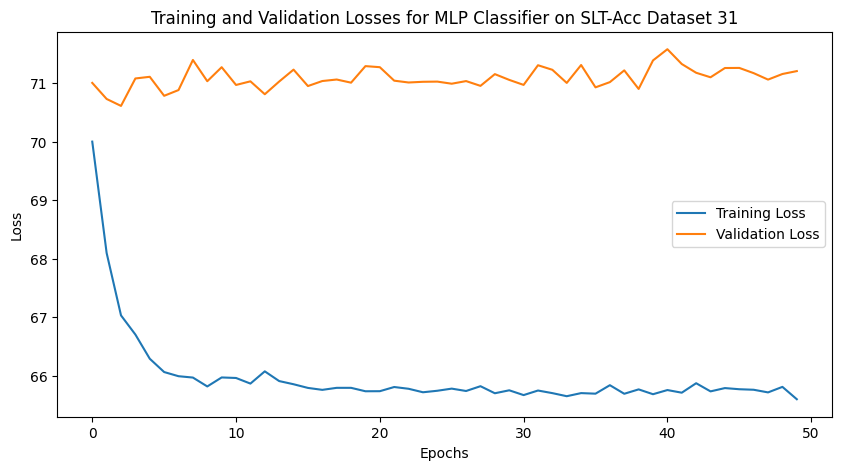

Test Loss: 62.6253, Test Accuracy: 0.7100, AUROC: 0.8070
Training on SLT-Acc Dataset 32/32
Epoch 1/50, Training Loss: 70.0371, Validation Loss: 71.1333, Training Accuracy: 0.6438
Epoch 10/50, Training Loss: 66.2253, Validation Loss: 71.6930, Training Accuracy: 0.9535
Epoch 20/50, Training Loss: 65.7679, Validation Loss: 71.1640, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 65.9561, Validation Loss: 71.5727, Training Accuracy: 0.9736
Epoch 40/50, Training Loss: 65.7826, Validation Loss: 71.3949, Training Accuracy: 0.9840
Epoch 50/50, Training Loss: 65.6445, Validation Loss: 71.1188, Training Accuracy: 0.9910


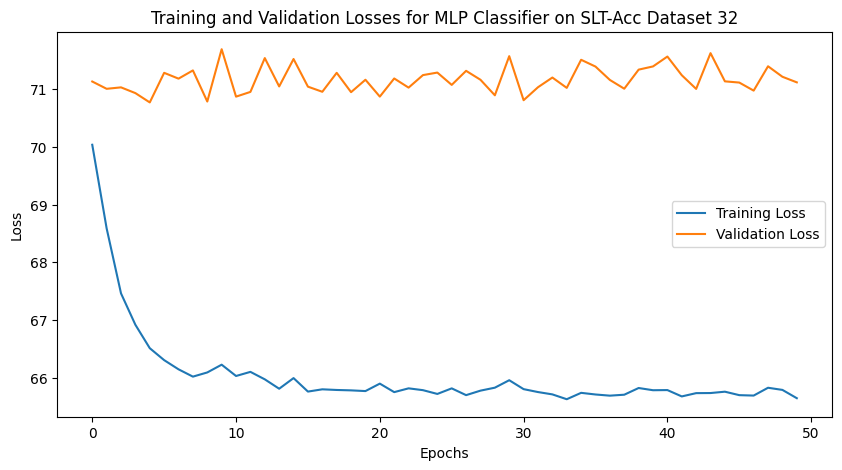

Test Loss: 62.1576, Test Accuracy: 0.7550, AUROC: 0.8109


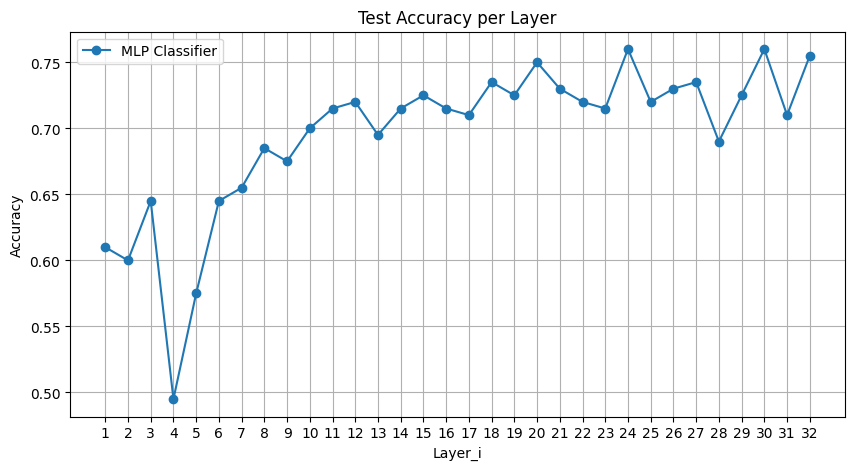

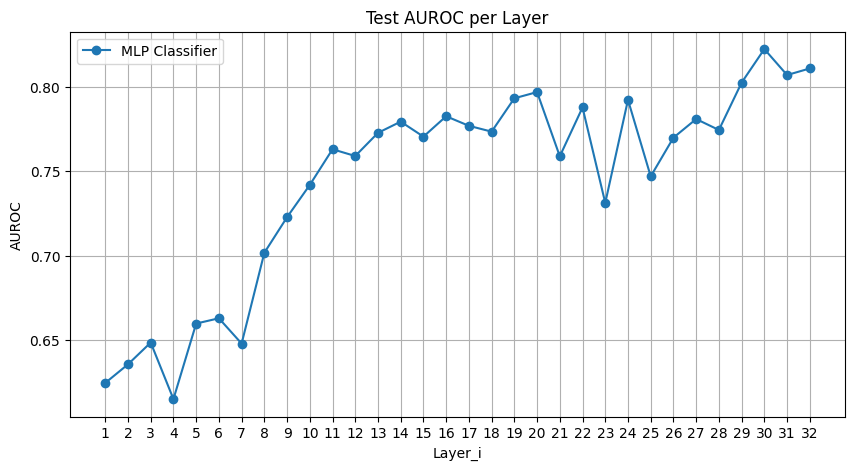

In [52]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
samlp_test_accs = []
samlp_test_aucs = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(slt_train_dataloaders, slt_valid_dataloaders, slt_test_dataloaders)):
    print(f"Training on SLT-Acc Dataset {i+1}/{len(slt_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on SLT-Acc Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    samlp_test_accs.append(test_acc)
    samlp_test_aucs.append(test_auc)

plot_1d_metrics([samlp_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([samlp_test_aucs], ['MLP Classifier'], 'AUROC')

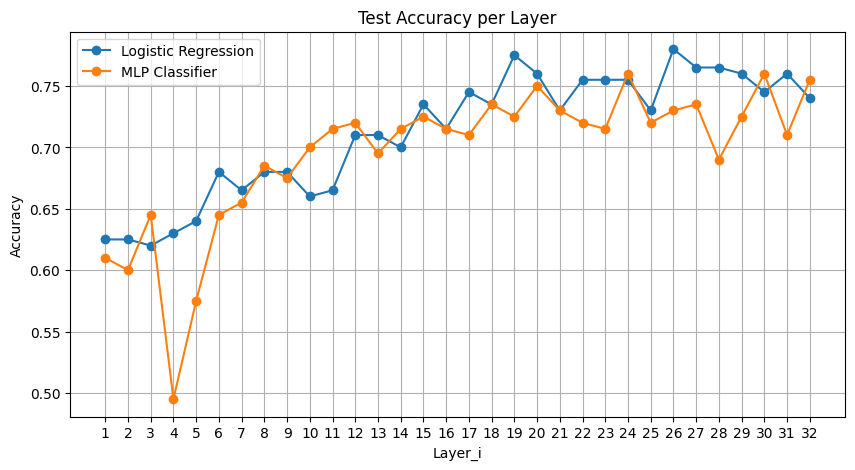

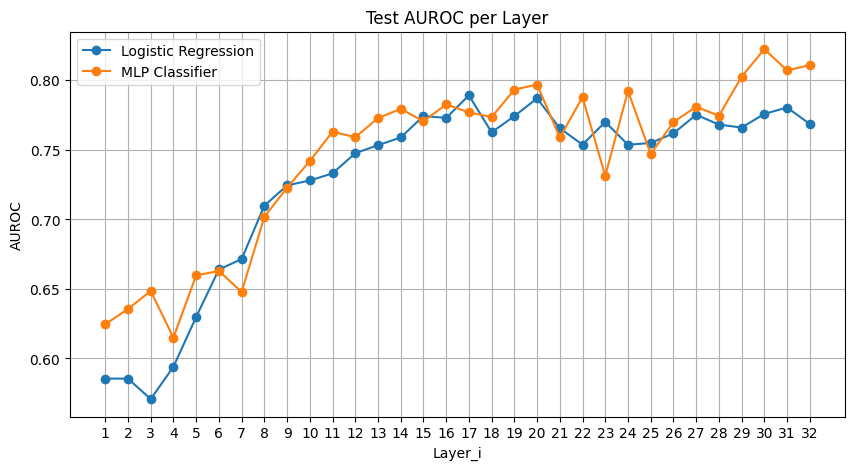

In [54]:
# LR vs MLP on SLT for Accuracy
plot_1d_metrics([salr_test_accs, samlp_test_accs], ['Logistic Regression', 'MLP Classifier'], 'Accuracy')
plot_1d_metrics([salr_test_aucs, samlp_test_aucs], ['Logistic Regression', 'MLP Classifier'], 'AUROC')

## Use Classifier for Binary SE for Predicting LLM Accuracy

We want to show that models trained on binary SE are more generalizable to new datasets when predicting their generation correctness.

In [121]:
# Train LR with TBG embeddings for binary SE.
tbg_train_dataloaders, tbg_valid_dataloaders, _ = create_dataloaders(tok_bef_gen_layered_datasets, bca_entropy, total_size, batch_size, set_seed=True)
# Test with accuracy test set (with the same random seed to ensure no data leakage)
# We should reverse the accuracy due to negative R.
r_accuracies = 1 - accuracies
_, _, tbg_test_dataloaders = create_dataloaders(tok_bef_gen_layered_datasets, r_accuracies, total_size, batch_size, set_seed=True)

X_trains, X_vals, _, y_trains, y_vals, _ = create_Xs_and_ys(tok_bef_gen_layered_datasets, bca_entropy, total_size)
_, _, X_tests, _, _, y_tests = create_Xs_and_ys(tok_bef_gen_layered_datasets, r_accuracies, total_size)

Training on TBG Dataset 1/33
Validation Accuracy: 0.5778, AUROC: 0.5195
Training Loss: 0.5799, Validation Loss: 0.6845
Test Loss: 0.6609, Test Accuracy: 0.5750, AUROC: 0.5286
Training on TBG Dataset 2/33
Validation Accuracy: 0.5667, AUROC: 0.5584
Training Loss: 0.5340, Validation Loss: 0.6936
Test Loss: 0.6758, Test Accuracy: 0.5600, AUROC: 0.5392
Training on TBG Dataset 3/33
Validation Accuracy: 0.5750, AUROC: 0.5734
Training Loss: 0.4557, Validation Loss: 0.7202
Test Loss: 0.6950, Test Accuracy: 0.5900, AUROC: 0.5795
Training on TBG Dataset 4/33
Validation Accuracy: 0.6111, AUROC: 0.6152
Training Loss: 0.3981, Validation Loss: 0.7101
Test Loss: 0.7049, Test Accuracy: 0.6000, AUROC: 0.5979
Training on TBG Dataset 5/33
Validation Accuracy: 0.6111, AUROC: 0.6271
Training Loss: 0.3548, Validation Loss: 0.7226
Test Loss: 0.7313, Test Accuracy: 0.6100, AUROC: 0.5991
Training on TBG Dataset 6/33
Validation Accuracy: 0.6139, AUROC: 0.6412
Training Loss: 0.3088, Validation Loss: 0.7342
Test L

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6694, AUROC: 0.6862
Training Loss: 0.2092, Validation Loss: 0.7751
Test Loss: 0.7645, Test Accuracy: 0.6550, AUROC: 0.6611
Training on TBG Dataset 9/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6833, AUROC: 0.7044
Training Loss: 0.1791, Validation Loss: 0.7831
Test Loss: 0.8379, Test Accuracy: 0.6400, AUROC: 0.6642
Training on TBG Dataset 10/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6889, AUROC: 0.7146
Training Loss: 0.1482, Validation Loss: 0.8080
Test Loss: 0.8795, Test Accuracy: 0.6600, AUROC: 0.6738
Training on TBG Dataset 11/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7111, AUROC: 0.7356
Training Loss: 0.1011, Validation Loss: 0.8287
Test Loss: 0.8782, Test Accuracy: 0.6650, AUROC: 0.7013
Training on TBG Dataset 12/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7111, AUROC: 0.7725
Training Loss: 0.0817, Validation Loss: 0.7454
Test Loss: 1.0085, Test Accuracy: 0.6650, AUROC: 0.6993
Training on TBG Dataset 13/33
Validation Accuracy: 0.7250, AUROC: 0.7743
Training Loss: 0.0652, Validation Loss: 0.8199
Test Loss: 1.0142, Test Accuracy: 0.6700, AUROC: 0.7142
Training on TBG Dataset 14/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7278, AUROC: 0.7923
Training Loss: 0.0548, Validation Loss: 0.7771
Test Loss: 1.0179, Test Accuracy: 0.6600, AUROC: 0.7172
Training on TBG Dataset 15/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7472, AUROC: 0.8020
Training Loss: 0.0485, Validation Loss: 0.7821
Test Loss: 1.0780, Test Accuracy: 0.6650, AUROC: 0.7127
Training on TBG Dataset 16/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7444, AUROC: 0.8014
Training Loss: 0.0382, Validation Loss: 0.8163
Test Loss: 1.0185, Test Accuracy: 0.6850, AUROC: 0.7405
Training on TBG Dataset 17/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7333, AUROC: 0.7727
Training Loss: 0.0316, Validation Loss: 0.9615
Test Loss: 1.1574, Test Accuracy: 0.6700, AUROC: 0.7195
Training on TBG Dataset 18/33
Validation Accuracy: 0.7278, AUROC: 0.7558
Training Loss: 0.0225, Validation Loss: 1.1386
Test Loss: 1.1697, Test Accuracy: 0.6650, AUROC: 0.7427
Training on TBG Dataset 19/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7139, AUROC: 0.7375
Training Loss: 0.0192, Validation Loss: 1.2737
Test Loss: 1.2326, Test Accuracy: 0.6700, AUROC: 0.7369
Training on TBG Dataset 20/33
Validation Accuracy: 0.6833, AUROC: 0.7420
Training Loss: 0.0170, Validation Loss: 1.2909
Test Loss: 1.3139, Test Accuracy: 0.6750, AUROC: 0.7293
Training on TBG Dataset 21/33
Validation Accuracy: 0.7111, AUROC: 0.7502
Training Loss: 0.0145, Validation Loss: 1.2729
Test Loss: 1.4828, Test Accuracy: 0.6800, AUROC: 0.7197
Training on TBG Dataset 22/33
Validation Accuracy: 0.7167, AUROC: 0.7558
Training Loss: 0.0126, Validation Loss: 1.2527
Test Loss: 1.4548, Test Accuracy: 0.6650, AUROC: 0.7210
Training on TBG Dataset 23/33
Validation Accuracy: 0.7194, AUROC: 0.7534
Training Loss: 0.0115, Validation Loss: 1.3197
Test Loss: 1.5922, Test Accuracy: 0.6350, AUROC: 0.7008
Training on TBG Dataset 24/33
Validation Accuracy: 0.7111, AUROC: 0.7540
Training Loss: 0.0109, Validation Loss: 1.3403
Test Loss: 1.5437, Test Accura

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7250, AUROC: 0.7626
Training Loss: 0.0105, Validation Loss: 1.2893
Test Loss: 1.5842, Test Accuracy: 0.6800, AUROC: 0.7058
Training on TBG Dataset 26/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7111, AUROC: 0.7560
Training Loss: 0.0101, Validation Loss: 1.3382
Test Loss: 1.5286, Test Accuracy: 0.6850, AUROC: 0.7161
Training on TBG Dataset 27/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7194, AUROC: 0.7552
Training Loss: 0.0098, Validation Loss: 1.3930
Test Loss: 1.6394, Test Accuracy: 0.6750, AUROC: 0.7075
Training on TBG Dataset 28/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7111, AUROC: 0.7510
Training Loss: 0.0096, Validation Loss: 1.3954
Test Loss: 1.6981, Test Accuracy: 0.6800, AUROC: 0.7011
Training on TBG Dataset 29/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7028, AUROC: 0.7380
Training Loss: 0.0095, Validation Loss: 1.4570
Test Loss: 1.6970, Test Accuracy: 0.6950, AUROC: 0.7046
Training on TBG Dataset 30/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6944, AUROC: 0.7447
Training Loss: 0.0093, Validation Loss: 1.3791
Test Loss: 1.7206, Test Accuracy: 0.6750, AUROC: 0.7125
Training on TBG Dataset 31/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6972, AUROC: 0.7521
Training Loss: 0.0093, Validation Loss: 1.3520
Test Loss: 1.7248, Test Accuracy: 0.6650, AUROC: 0.7162
Training on TBG Dataset 32/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6944, AUROC: 0.7367
Training Loss: 0.0090, Validation Loss: 1.4913
Test Loss: 1.8068, Test Accuracy: 0.6500, AUROC: 0.7156
Training on TBG Dataset 33/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6694, AUROC: 0.7353
Training Loss: 0.0094, Validation Loss: 1.5151
Test Loss: 1.7032, Test Accuracy: 0.7100, AUROC: 0.7403


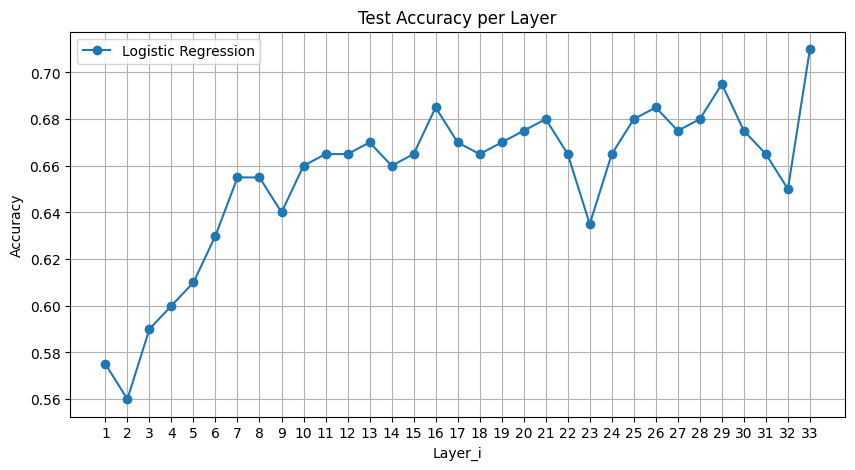

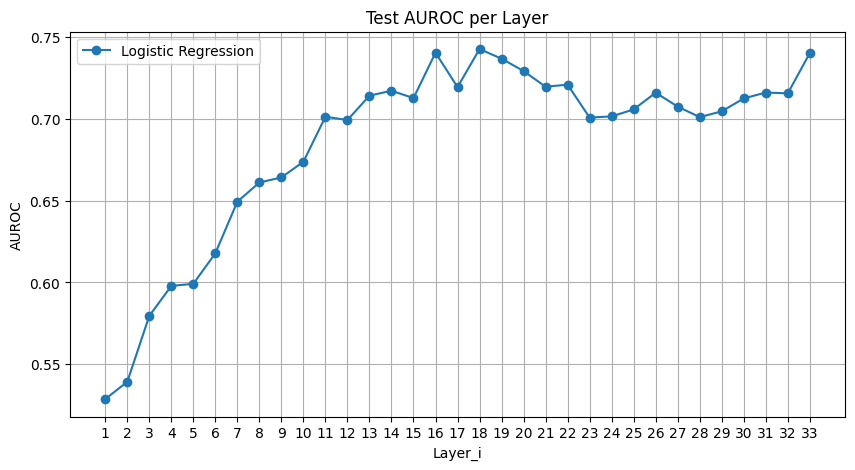

In [122]:
# Training Loops (LR)
tablr_test_accs = []
tablr_test_aucs = []
tablr_trained_models = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(X_trains, X_vals, X_tests, y_trains, y_vals, y_tests)):
    print(f"Training on TBG Dataset {i+1}/{len(X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on TBG Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    tablr_test_accs.append(test_acc)
    tablr_test_aucs.append(test_auc)
    tablr_trained_models.append(model)

plot_1d_metrics([tablr_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([tablr_test_aucs], ['Logistic Regression'], 'AUROC')

In [123]:
# Max AUROC achieved by 'transfer learning' compared to normal training
print(f"TBG: AUROC for LR trained on Binary SE, tested on Accuracy: {max(tablr_test_aucs):.4f}")
print(f"TBG: AUROC for LR trained on Accuracy, tested on Accuracy: {max(talr_test_aucs):.4f}")

TBG: AUROC for LR trained on Binary SE, tested on Accuracy: 0.7427
TBG: AUROC for LR trained on Accuracy, tested on Accuracy: 0.8013


Using device: cuda
Training on TBG Dataset 1/33
Epoch 1/50, Training Loss: 46.5390, Validation Loss: 43.0738, Training Accuracy: 0.4903
Epoch 10/50, Training Loss: 43.8229, Validation Loss: 42.9564, Training Accuracy: 0.7708
Epoch 20/50, Training Loss: 43.9056, Validation Loss: 42.9330, Training Accuracy: 0.7444
Epoch 30/50, Training Loss: 43.7753, Validation Loss: 42.8036, Training Accuracy: 0.7694
Epoch 40/50, Training Loss: 43.7694, Validation Loss: 42.7678, Training Accuracy: 0.7653
Epoch 50/50, Training Loss: 43.7176, Validation Loss: 42.8538, Training Accuracy: 0.7701


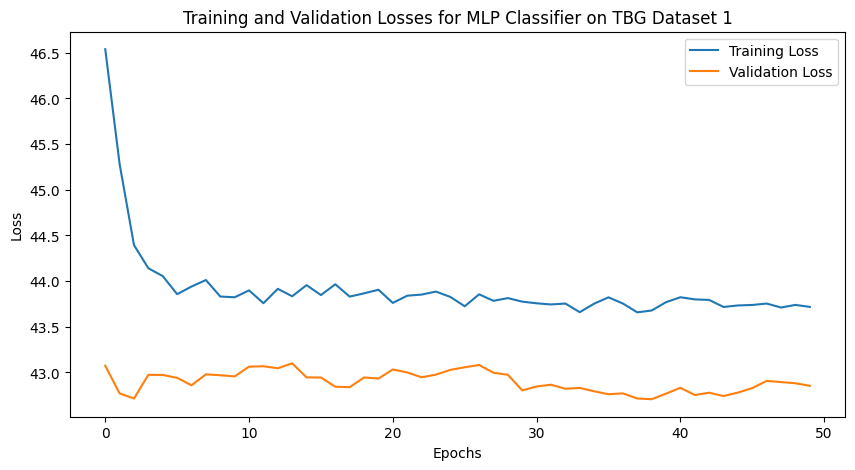

Test Loss: 36.6492, Test Accuracy: 0.5600, AUROC: 0.5245
Training on TBG Dataset 2/33
Epoch 1/50, Training Loss: 46.5972, Validation Loss: 43.0172, Training Accuracy: 0.5222
Epoch 10/50, Training Loss: 43.7449, Validation Loss: 42.8127, Training Accuracy: 0.7681
Epoch 20/50, Training Loss: 43.6528, Validation Loss: 42.6103, Training Accuracy: 0.7799
Epoch 30/50, Training Loss: 43.5054, Validation Loss: 42.5966, Training Accuracy: 0.7917
Epoch 40/50, Training Loss: 43.5472, Validation Loss: 42.6994, Training Accuracy: 0.7896
Epoch 50/50, Training Loss: 43.4439, Validation Loss: 42.8195, Training Accuracy: 0.7910


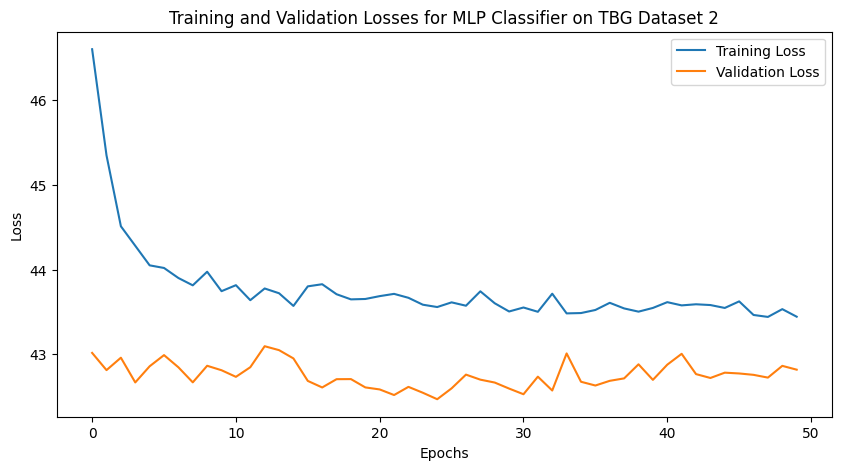

Test Loss: 37.0366, Test Accuracy: 0.5600, AUROC: 0.5253
Training on TBG Dataset 3/33
Epoch 1/50, Training Loss: 46.3930, Validation Loss: 42.8325, Training Accuracy: 0.5458
Epoch 10/50, Training Loss: 43.6842, Validation Loss: 42.6403, Training Accuracy: 0.7847
Epoch 20/50, Training Loss: 43.6154, Validation Loss: 42.7579, Training Accuracy: 0.7792
Epoch 30/50, Training Loss: 43.4079, Validation Loss: 42.8178, Training Accuracy: 0.7937
Epoch 40/50, Training Loss: 43.1875, Validation Loss: 42.5887, Training Accuracy: 0.8042
Epoch 50/50, Training Loss: 43.2297, Validation Loss: 42.6071, Training Accuracy: 0.8167


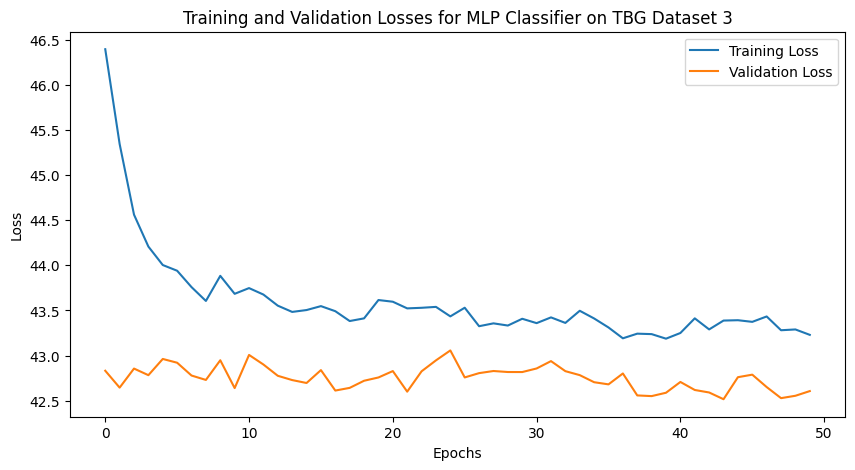

Test Loss: 36.8672, Test Accuracy: 0.5600, AUROC: 0.5382
Training on TBG Dataset 4/33
Epoch 1/50, Training Loss: 46.4104, Validation Loss: 42.9427, Training Accuracy: 0.5715
Epoch 10/50, Training Loss: 43.5226, Validation Loss: 42.3797, Training Accuracy: 0.7944
Epoch 20/50, Training Loss: 43.3850, Validation Loss: 42.7888, Training Accuracy: 0.8021
Epoch 30/50, Training Loss: 43.3543, Validation Loss: 42.7089, Training Accuracy: 0.8063
Epoch 40/50, Training Loss: 43.2509, Validation Loss: 42.6393, Training Accuracy: 0.8049
Epoch 50/50, Training Loss: 43.1294, Validation Loss: 42.8641, Training Accuracy: 0.8236


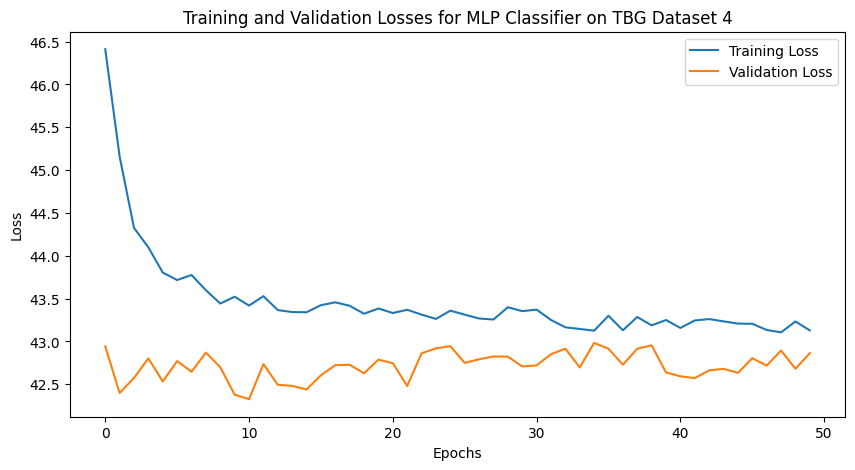

Test Loss: 36.5343, Test Accuracy: 0.5500, AUROC: 0.5817
Training on TBG Dataset 5/33
Epoch 1/50, Training Loss: 46.3677, Validation Loss: 42.7291, Training Accuracy: 0.5396
Epoch 10/50, Training Loss: 43.5137, Validation Loss: 42.4960, Training Accuracy: 0.7833
Epoch 20/50, Training Loss: 43.1181, Validation Loss: 42.5746, Training Accuracy: 0.8243
Epoch 30/50, Training Loss: 43.1917, Validation Loss: 42.6040, Training Accuracy: 0.8292
Epoch 40/50, Training Loss: 42.9401, Validation Loss: 42.3184, Training Accuracy: 0.8389
Epoch 50/50, Training Loss: 42.9604, Validation Loss: 42.4157, Training Accuracy: 0.8333


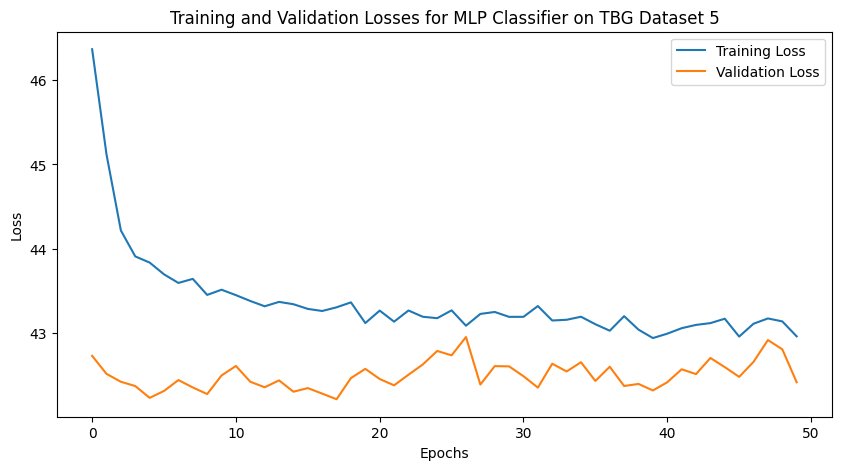

Test Loss: 36.3076, Test Accuracy: 0.5900, AUROC: 0.5904
Training on TBG Dataset 6/33
Epoch 1/50, Training Loss: 46.3807, Validation Loss: 42.7612, Training Accuracy: 0.5771
Epoch 10/50, Training Loss: 43.4587, Validation Loss: 42.5018, Training Accuracy: 0.7861
Epoch 20/50, Training Loss: 43.3092, Validation Loss: 42.4080, Training Accuracy: 0.8153
Epoch 30/50, Training Loss: 43.0314, Validation Loss: 42.4219, Training Accuracy: 0.8250
Epoch 40/50, Training Loss: 42.9084, Validation Loss: 42.2611, Training Accuracy: 0.8306
Epoch 50/50, Training Loss: 42.8504, Validation Loss: 42.0972, Training Accuracy: 0.8438


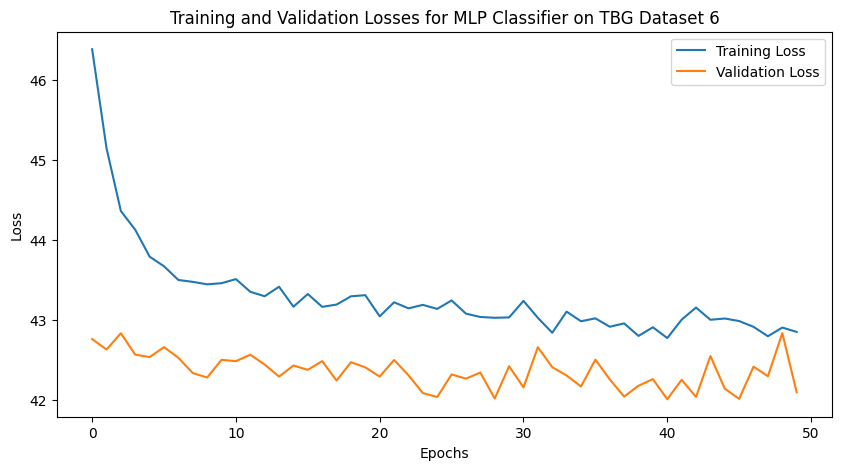

Test Loss: 36.7131, Test Accuracy: 0.5500, AUROC: 0.5647
Training on TBG Dataset 7/33
Epoch 1/50, Training Loss: 46.2904, Validation Loss: 42.8732, Training Accuracy: 0.5632
Epoch 10/50, Training Loss: 43.1060, Validation Loss: 42.0408, Training Accuracy: 0.8229
Epoch 20/50, Training Loss: 42.8750, Validation Loss: 41.9040, Training Accuracy: 0.8403
Epoch 30/50, Training Loss: 42.6489, Validation Loss: 42.3516, Training Accuracy: 0.8500
Epoch 40/50, Training Loss: 42.6703, Validation Loss: 42.6423, Training Accuracy: 0.8424
Epoch 50/50, Training Loss: 42.5320, Validation Loss: 41.9741, Training Accuracy: 0.8639


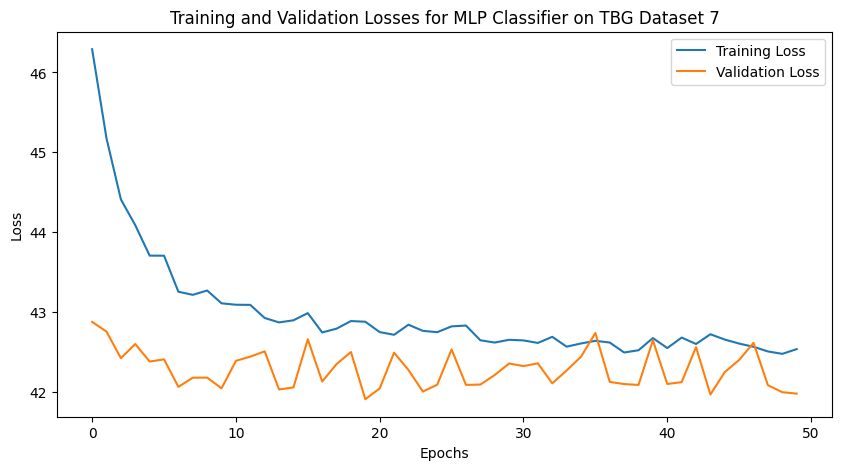

Test Loss: 36.0567, Test Accuracy: 0.6300, AUROC: 0.6171
Training on TBG Dataset 8/33
Epoch 1/50, Training Loss: 46.1760, Validation Loss: 42.7110, Training Accuracy: 0.5958
Epoch 10/50, Training Loss: 42.6316, Validation Loss: 42.3444, Training Accuracy: 0.8542
Epoch 20/50, Training Loss: 42.4293, Validation Loss: 42.1705, Training Accuracy: 0.8694
Epoch 30/50, Training Loss: 42.2397, Validation Loss: 42.0858, Training Accuracy: 0.8819
Epoch 40/50, Training Loss: 42.0861, Validation Loss: 42.1943, Training Accuracy: 0.8910
Epoch 50/50, Training Loss: 42.0913, Validation Loss: 42.0666, Training Accuracy: 0.9014


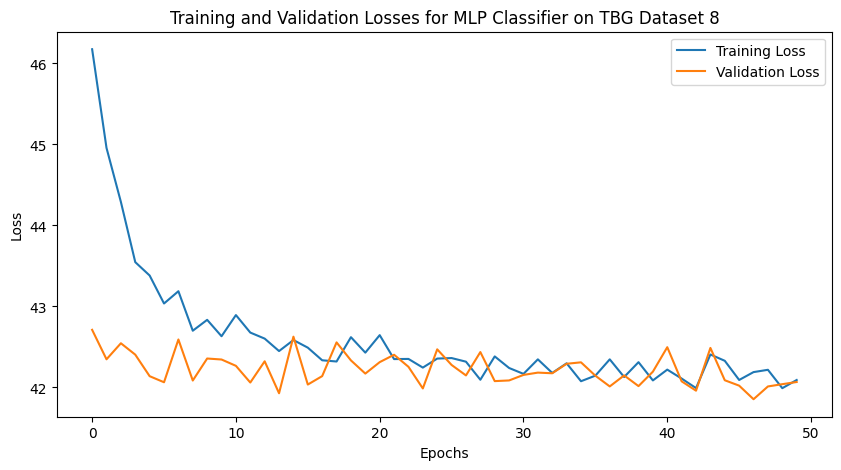

Test Loss: 36.0268, Test Accuracy: 0.6000, AUROC: 0.6263
Training on TBG Dataset 9/33
Epoch 1/50, Training Loss: 46.0019, Validation Loss: 42.6143, Training Accuracy: 0.5986
Epoch 10/50, Training Loss: 42.5467, Validation Loss: 41.9883, Training Accuracy: 0.8618
Epoch 20/50, Training Loss: 42.2124, Validation Loss: 42.3223, Training Accuracy: 0.8910
Epoch 30/50, Training Loss: 42.2150, Validation Loss: 42.3293, Training Accuracy: 0.8806
Epoch 40/50, Training Loss: 42.0305, Validation Loss: 42.0551, Training Accuracy: 0.8986
Epoch 50/50, Training Loss: 42.0106, Validation Loss: 42.4192, Training Accuracy: 0.9028


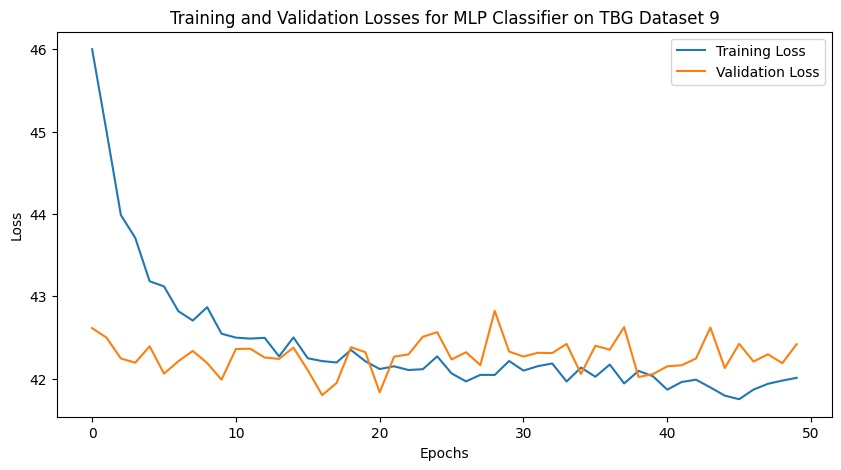

Test Loss: 36.7531, Test Accuracy: 0.5750, AUROC: 0.6042
Training on TBG Dataset 10/33
Epoch 1/50, Training Loss: 45.9986, Validation Loss: 42.4906, Training Accuracy: 0.6139
Epoch 10/50, Training Loss: 42.5150, Validation Loss: 42.1934, Training Accuracy: 0.8660
Epoch 20/50, Training Loss: 42.1490, Validation Loss: 41.8833, Training Accuracy: 0.8819
Epoch 30/50, Training Loss: 41.9554, Validation Loss: 42.4989, Training Accuracy: 0.8965
Epoch 40/50, Training Loss: 41.6654, Validation Loss: 42.4083, Training Accuracy: 0.9194
Epoch 50/50, Training Loss: 41.6280, Validation Loss: 42.3084, Training Accuracy: 0.9208


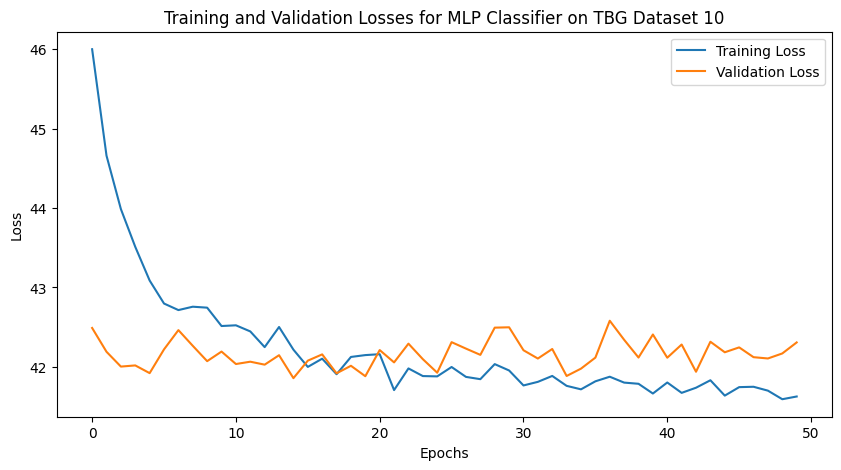

Test Loss: 35.6795, Test Accuracy: 0.6300, AUROC: 0.6533
Training on TBG Dataset 11/33
Epoch 1/50, Training Loss: 45.8508, Validation Loss: 42.3045, Training Accuracy: 0.6097
Epoch 10/50, Training Loss: 42.1477, Validation Loss: 41.9600, Training Accuracy: 0.8896
Epoch 20/50, Training Loss: 41.8933, Validation Loss: 41.7123, Training Accuracy: 0.9035
Epoch 30/50, Training Loss: 41.5726, Validation Loss: 41.8190, Training Accuracy: 0.9306
Epoch 40/50, Training Loss: 41.4935, Validation Loss: 41.6994, Training Accuracy: 0.9354
Epoch 50/50, Training Loss: 41.2397, Validation Loss: 41.6206, Training Accuracy: 0.9528


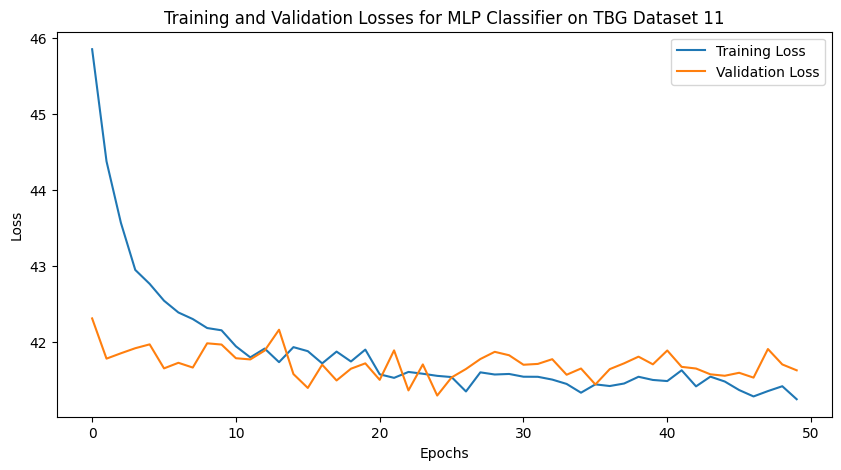

Test Loss: 36.0408, Test Accuracy: 0.5950, AUROC: 0.6726
Training on TBG Dataset 12/33
Epoch 1/50, Training Loss: 45.5063, Validation Loss: 42.1193, Training Accuracy: 0.6410
Epoch 10/50, Training Loss: 42.0224, Validation Loss: 41.6497, Training Accuracy: 0.9000
Epoch 20/50, Training Loss: 41.4846, Validation Loss: 41.2649, Training Accuracy: 0.9285
Epoch 30/50, Training Loss: 41.4260, Validation Loss: 41.1382, Training Accuracy: 0.9410
Epoch 40/50, Training Loss: 41.3516, Validation Loss: 41.4678, Training Accuracy: 0.9479
Epoch 50/50, Training Loss: 41.2495, Validation Loss: 41.4399, Training Accuracy: 0.9542


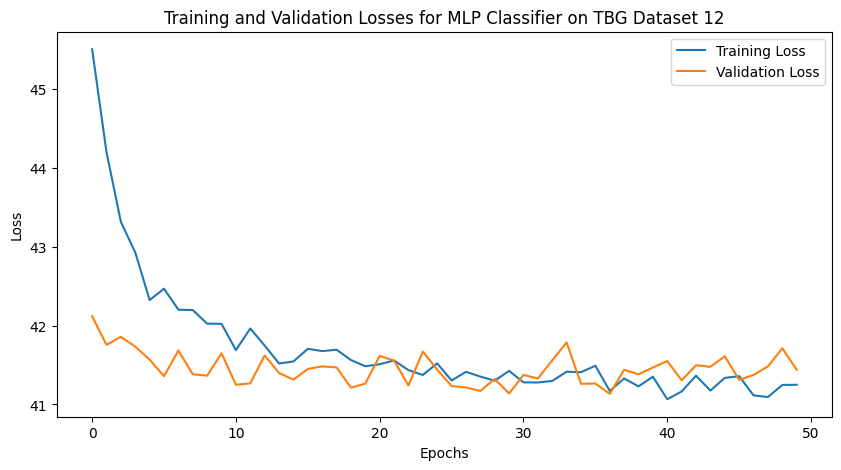

Test Loss: 35.1484, Test Accuracy: 0.6700, AUROC: 0.7167
Training on TBG Dataset 13/33
Epoch 1/50, Training Loss: 45.5731, Validation Loss: 41.8527, Training Accuracy: 0.6264
Epoch 10/50, Training Loss: 41.8149, Validation Loss: 41.4274, Training Accuracy: 0.9069
Epoch 20/50, Training Loss: 41.4491, Validation Loss: 41.3970, Training Accuracy: 0.9396
Epoch 30/50, Training Loss: 41.2167, Validation Loss: 41.3622, Training Accuracy: 0.9535
Epoch 40/50, Training Loss: 41.2572, Validation Loss: 41.2950, Training Accuracy: 0.9521
Epoch 50/50, Training Loss: 41.2266, Validation Loss: 41.6618, Training Accuracy: 0.9542


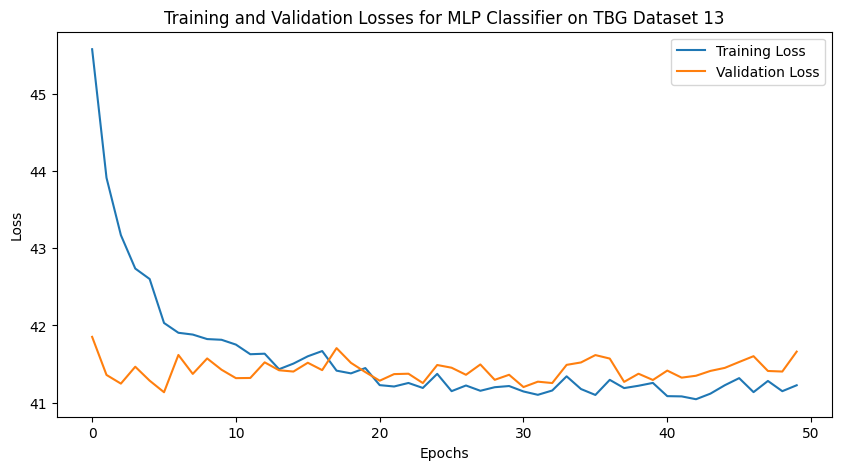

Test Loss: 35.6207, Test Accuracy: 0.6700, AUROC: 0.6813
Training on TBG Dataset 14/33
Epoch 1/50, Training Loss: 45.3580, Validation Loss: 41.4765, Training Accuracy: 0.6410
Epoch 10/50, Training Loss: 41.5903, Validation Loss: 41.0318, Training Accuracy: 0.9250
Epoch 20/50, Training Loss: 41.3706, Validation Loss: 41.1766, Training Accuracy: 0.9437
Epoch 30/50, Training Loss: 41.1102, Validation Loss: 41.0765, Training Accuracy: 0.9625
Epoch 40/50, Training Loss: 41.1796, Validation Loss: 41.1756, Training Accuracy: 0.9576
Epoch 50/50, Training Loss: 41.1109, Validation Loss: 41.0455, Training Accuracy: 0.9604


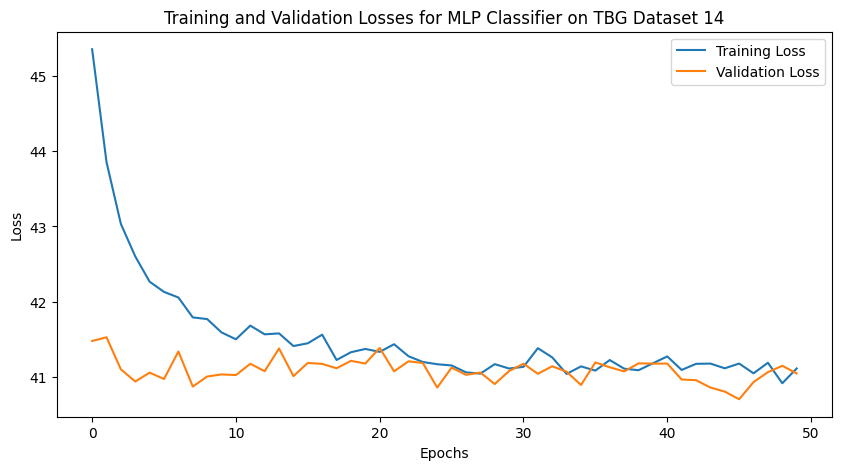

Test Loss: 35.3315, Test Accuracy: 0.6850, AUROC: 0.7186
Training on TBG Dataset 15/33
Epoch 1/50, Training Loss: 45.3998, Validation Loss: 41.3202, Training Accuracy: 0.6444
Epoch 10/50, Training Loss: 41.5451, Validation Loss: 41.1713, Training Accuracy: 0.9326
Epoch 20/50, Training Loss: 41.2095, Validation Loss: 40.9723, Training Accuracy: 0.9569
Epoch 30/50, Training Loss: 41.0683, Validation Loss: 40.9873, Training Accuracy: 0.9667
Epoch 40/50, Training Loss: 41.0619, Validation Loss: 40.9950, Training Accuracy: 0.9681
Epoch 50/50, Training Loss: 41.0109, Validation Loss: 41.1331, Training Accuracy: 0.9722


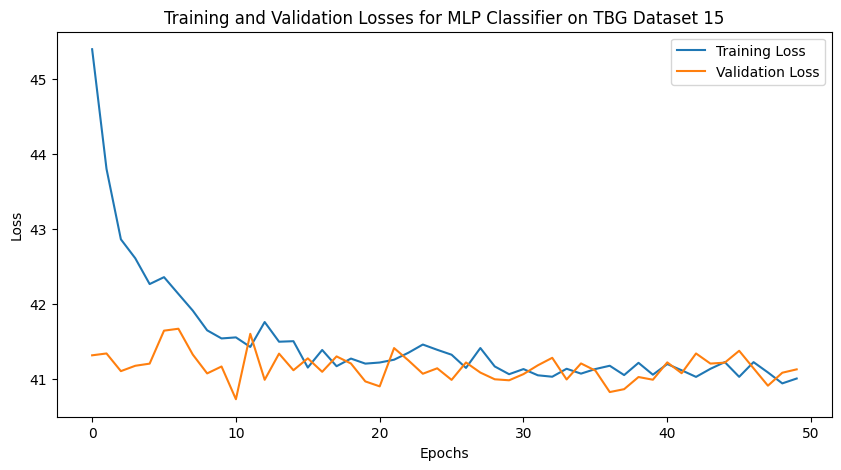

Test Loss: 35.1867, Test Accuracy: 0.6900, AUROC: 0.7488
Training on TBG Dataset 16/33
Epoch 1/50, Training Loss: 45.2743, Validation Loss: 41.7285, Training Accuracy: 0.6535
Epoch 10/50, Training Loss: 41.4187, Validation Loss: 41.1607, Training Accuracy: 0.9361
Epoch 20/50, Training Loss: 41.1079, Validation Loss: 41.0023, Training Accuracy: 0.9639
Epoch 30/50, Training Loss: 41.3070, Validation Loss: 41.3264, Training Accuracy: 0.9528
Epoch 40/50, Training Loss: 41.0915, Validation Loss: 41.4313, Training Accuracy: 0.9625
Epoch 50/50, Training Loss: 41.0757, Validation Loss: 41.5584, Training Accuracy: 0.9639


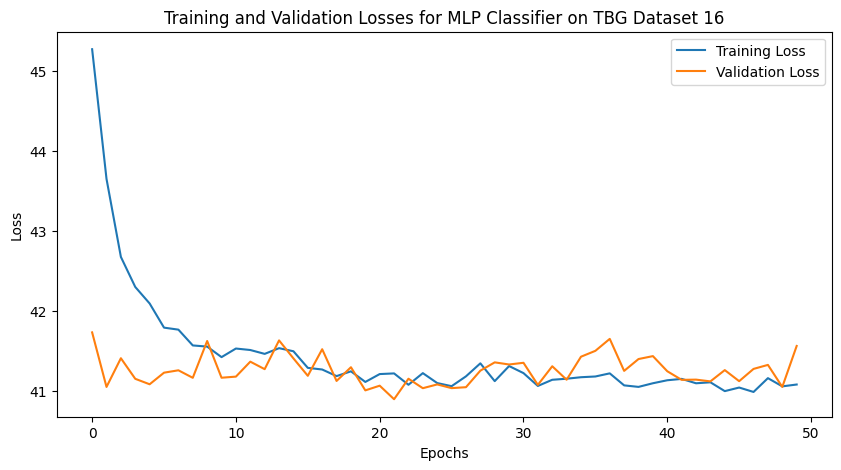

Test Loss: 35.1901, Test Accuracy: 0.6950, AUROC: 0.7104
Training on TBG Dataset 17/33
Epoch 1/50, Training Loss: 45.2906, Validation Loss: 41.4034, Training Accuracy: 0.6361
Epoch 10/50, Training Loss: 41.4518, Validation Loss: 40.8982, Training Accuracy: 0.9403
Epoch 20/50, Training Loss: 41.0985, Validation Loss: 41.4383, Training Accuracy: 0.9646
Epoch 30/50, Training Loss: 41.1490, Validation Loss: 41.4732, Training Accuracy: 0.9604
Epoch 40/50, Training Loss: 41.0007, Validation Loss: 41.1481, Training Accuracy: 0.9688
Epoch 50/50, Training Loss: 41.1317, Validation Loss: 40.9888, Training Accuracy: 0.9660


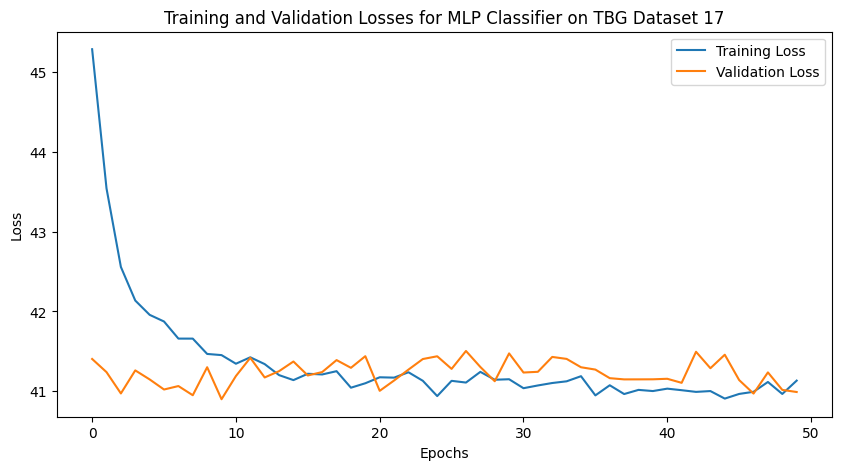

Test Loss: 35.2025, Test Accuracy: 0.6800, AUROC: 0.7481
Training on TBG Dataset 18/33
Epoch 1/50, Training Loss: 45.1437, Validation Loss: 41.1675, Training Accuracy: 0.6479
Epoch 10/50, Training Loss: 41.3800, Validation Loss: 41.1345, Training Accuracy: 0.9396
Epoch 20/50, Training Loss: 41.1563, Validation Loss: 41.0170, Training Accuracy: 0.9583
Epoch 30/50, Training Loss: 41.0709, Validation Loss: 41.1434, Training Accuracy: 0.9618
Epoch 40/50, Training Loss: 41.2116, Validation Loss: 41.1857, Training Accuracy: 0.9556
Epoch 50/50, Training Loss: 41.1073, Validation Loss: 41.1945, Training Accuracy: 0.9639


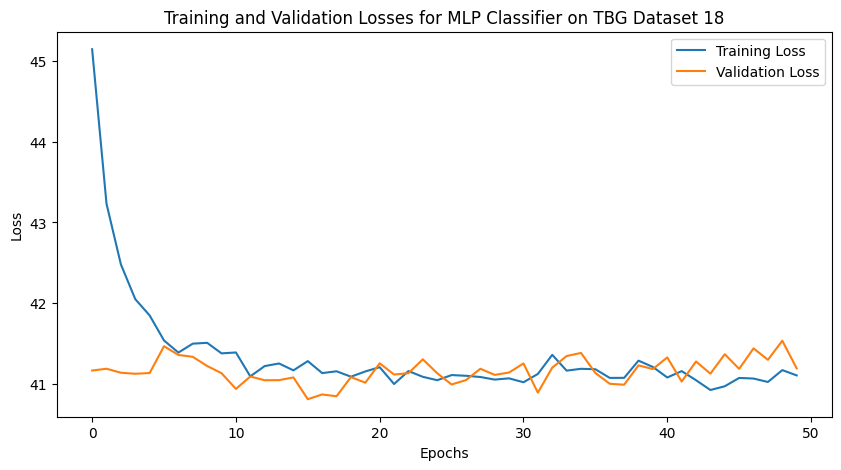

Test Loss: 35.0194, Test Accuracy: 0.6900, AUROC: 0.7155
Training on TBG Dataset 19/33
Epoch 1/50, Training Loss: 45.1206, Validation Loss: 41.3738, Training Accuracy: 0.6590
Epoch 10/50, Training Loss: 41.3446, Validation Loss: 41.2933, Training Accuracy: 0.9514
Epoch 20/50, Training Loss: 41.2414, Validation Loss: 41.0776, Training Accuracy: 0.9542
Epoch 30/50, Training Loss: 41.0498, Validation Loss: 41.2692, Training Accuracy: 0.9681
Epoch 40/50, Training Loss: 40.9757, Validation Loss: 41.4802, Training Accuracy: 0.9660
Epoch 50/50, Training Loss: 41.0272, Validation Loss: 41.3920, Training Accuracy: 0.9653


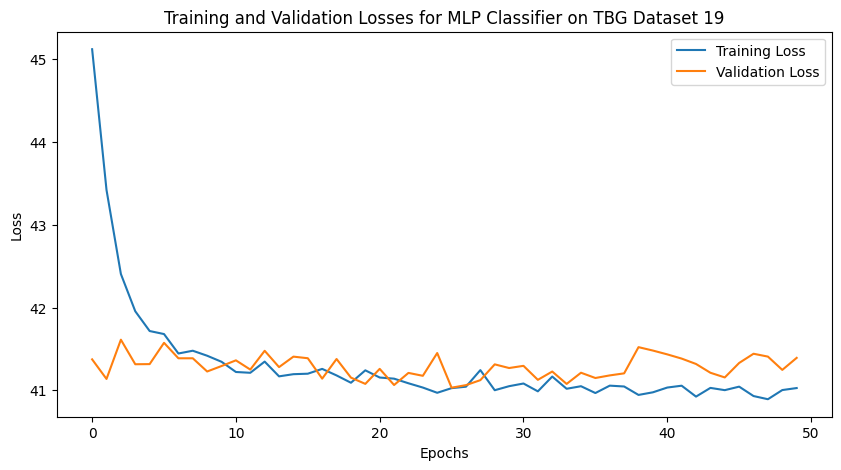

Test Loss: 34.8800, Test Accuracy: 0.7200, AUROC: 0.7141
Training on TBG Dataset 20/33
Epoch 1/50, Training Loss: 45.3775, Validation Loss: 41.3948, Training Accuracy: 0.6278
Epoch 10/50, Training Loss: 41.2688, Validation Loss: 41.4800, Training Accuracy: 0.9549
Epoch 20/50, Training Loss: 41.0156, Validation Loss: 41.1843, Training Accuracy: 0.9653
Epoch 30/50, Training Loss: 41.1118, Validation Loss: 41.5802, Training Accuracy: 0.9653
Epoch 40/50, Training Loss: 40.9179, Validation Loss: 41.4155, Training Accuracy: 0.9729
Epoch 50/50, Training Loss: 40.9214, Validation Loss: 41.3004, Training Accuracy: 0.9750


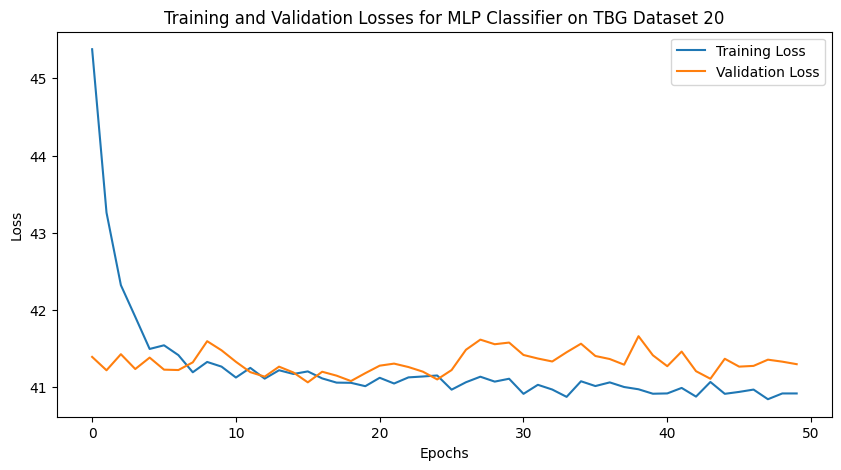

Test Loss: 35.5229, Test Accuracy: 0.6450, AUROC: 0.6862
Training on TBG Dataset 21/33
Epoch 1/50, Training Loss: 45.3955, Validation Loss: 41.2356, Training Accuracy: 0.6458
Epoch 10/50, Training Loss: 41.1969, Validation Loss: 41.3577, Training Accuracy: 0.9542
Epoch 20/50, Training Loss: 41.0234, Validation Loss: 41.7520, Training Accuracy: 0.9674
Epoch 30/50, Training Loss: 40.9232, Validation Loss: 41.4869, Training Accuracy: 0.9750
Epoch 40/50, Training Loss: 41.0402, Validation Loss: 41.3140, Training Accuracy: 0.9660
Epoch 50/50, Training Loss: 40.8563, Validation Loss: 41.3499, Training Accuracy: 0.9743


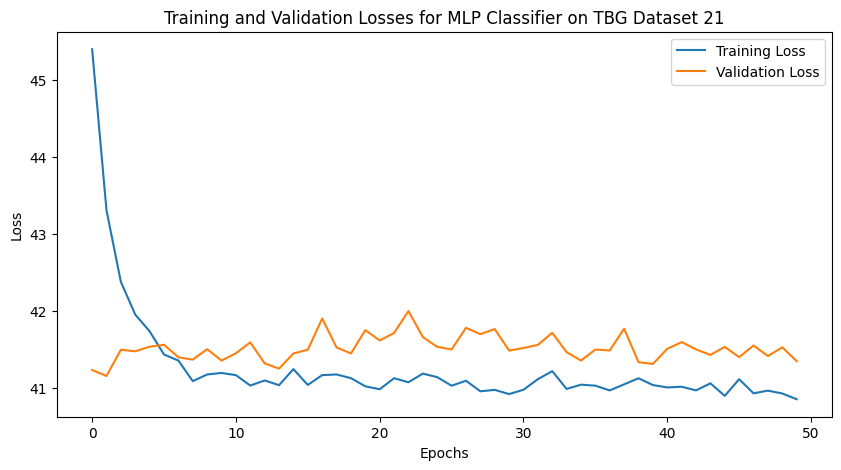

Test Loss: 35.2978, Test Accuracy: 0.6750, AUROC: 0.6790
Training on TBG Dataset 22/33
Epoch 1/50, Training Loss: 45.2844, Validation Loss: 41.5018, Training Accuracy: 0.6639
Epoch 10/50, Training Loss: 41.0929, Validation Loss: 41.4005, Training Accuracy: 0.9604
Epoch 20/50, Training Loss: 41.0329, Validation Loss: 41.3676, Training Accuracy: 0.9611
Epoch 30/50, Training Loss: 40.9207, Validation Loss: 41.3622, Training Accuracy: 0.9729
Epoch 40/50, Training Loss: 40.8936, Validation Loss: 41.7789, Training Accuracy: 0.9778
Epoch 50/50, Training Loss: 40.8352, Validation Loss: 41.3034, Training Accuracy: 0.9785


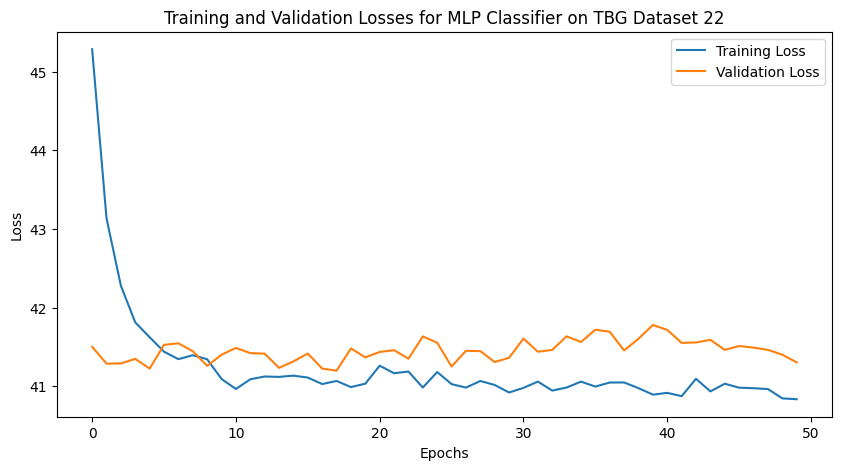

Test Loss: 35.2871, Test Accuracy: 0.6700, AUROC: 0.6926
Training on TBG Dataset 23/33
Epoch 1/50, Training Loss: 45.5039, Validation Loss: 41.4424, Training Accuracy: 0.6354
Epoch 10/50, Training Loss: 41.0684, Validation Loss: 41.2288, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 40.9453, Validation Loss: 41.3959, Training Accuracy: 0.9722
Epoch 30/50, Training Loss: 40.8665, Validation Loss: 41.4312, Training Accuracy: 0.9743
Epoch 40/50, Training Loss: 40.8752, Validation Loss: 41.4574, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 41.0848, Validation Loss: 41.3292, Training Accuracy: 0.9708


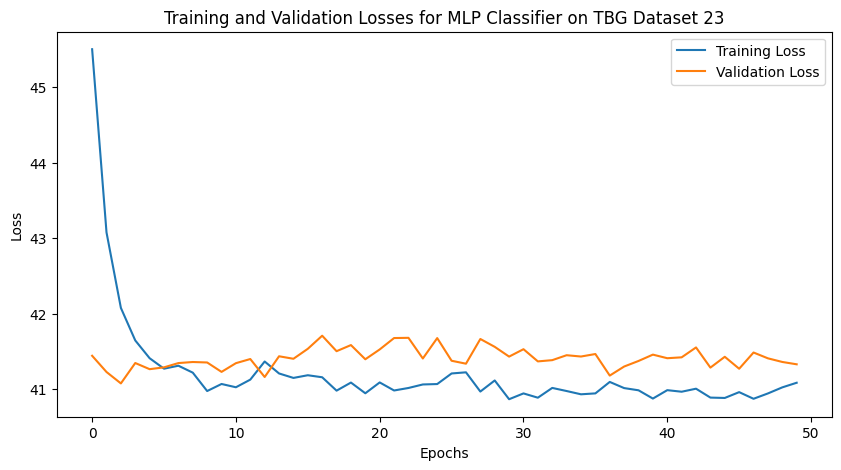

Test Loss: 34.6336, Test Accuracy: 0.7250, AUROC: 0.7279
Training on TBG Dataset 24/33
Epoch 1/50, Training Loss: 45.3065, Validation Loss: 41.3968, Training Accuracy: 0.6590
Epoch 10/50, Training Loss: 41.1965, Validation Loss: 41.4370, Training Accuracy: 0.9590
Epoch 20/50, Training Loss: 41.1169, Validation Loss: 41.3536, Training Accuracy: 0.9632
Epoch 30/50, Training Loss: 41.0374, Validation Loss: 41.5532, Training Accuracy: 0.9688
Epoch 40/50, Training Loss: 40.8602, Validation Loss: 41.3180, Training Accuracy: 0.9792
Epoch 50/50, Training Loss: 40.9058, Validation Loss: 41.6140, Training Accuracy: 0.9729


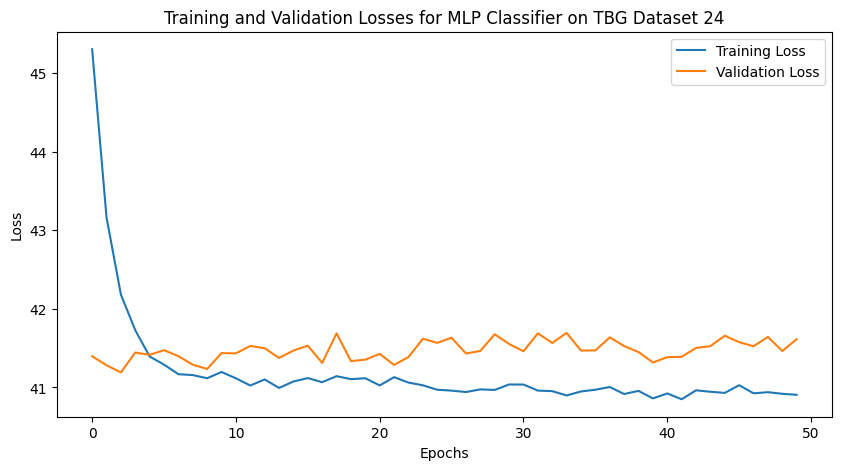

Test Loss: 35.2997, Test Accuracy: 0.6750, AUROC: 0.7003
Training on TBG Dataset 25/33
Epoch 1/50, Training Loss: 45.3863, Validation Loss: 41.4163, Training Accuracy: 0.6465
Epoch 10/50, Training Loss: 41.0971, Validation Loss: 41.3108, Training Accuracy: 0.9646
Epoch 20/50, Training Loss: 41.0789, Validation Loss: 41.4647, Training Accuracy: 0.9590
Epoch 30/50, Training Loss: 41.0474, Validation Loss: 41.5951, Training Accuracy: 0.9660
Epoch 40/50, Training Loss: 40.8575, Validation Loss: 41.5925, Training Accuracy: 0.9785
Epoch 50/50, Training Loss: 40.9021, Validation Loss: 41.7134, Training Accuracy: 0.9771


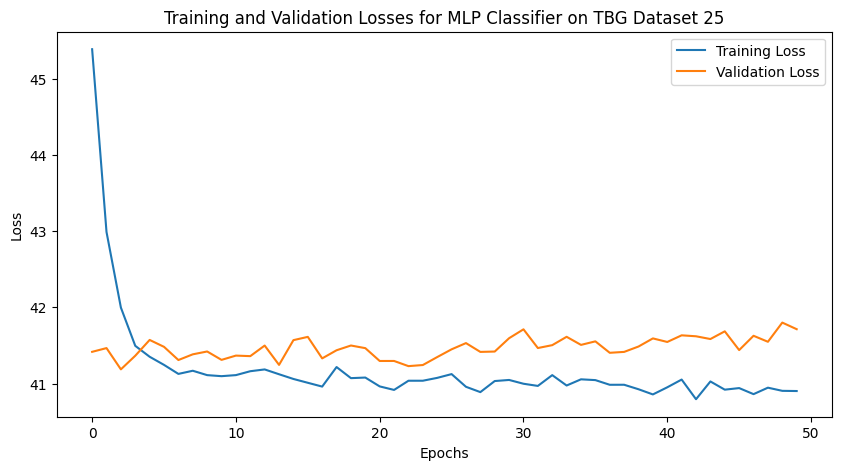

Test Loss: 35.7800, Test Accuracy: 0.6350, AUROC: 0.7148
Training on TBG Dataset 26/33
Epoch 1/50, Training Loss: 45.3453, Validation Loss: 41.4309, Training Accuracy: 0.6493
Epoch 10/50, Training Loss: 40.9609, Validation Loss: 41.4298, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 40.9215, Validation Loss: 41.3242, Training Accuracy: 0.9708
Epoch 30/50, Training Loss: 41.1046, Validation Loss: 41.5305, Training Accuracy: 0.9625
Epoch 40/50, Training Loss: 40.9136, Validation Loss: 41.6480, Training Accuracy: 0.9778
Epoch 50/50, Training Loss: 40.8576, Validation Loss: 41.7598, Training Accuracy: 0.9806


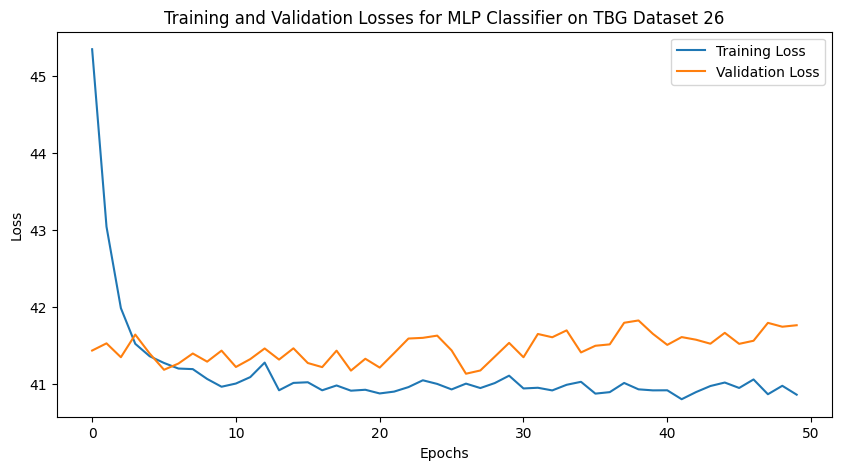

Test Loss: 35.2025, Test Accuracy: 0.6700, AUROC: 0.7222
Training on TBG Dataset 27/33
Epoch 1/50, Training Loss: 45.3347, Validation Loss: 41.3056, Training Accuracy: 0.6153
Epoch 10/50, Training Loss: 40.9429, Validation Loss: 41.3907, Training Accuracy: 0.9743
Epoch 20/50, Training Loss: 41.1469, Validation Loss: 41.3178, Training Accuracy: 0.9604
Epoch 30/50, Training Loss: 40.8832, Validation Loss: 41.4235, Training Accuracy: 0.9715
Epoch 40/50, Training Loss: 40.9170, Validation Loss: 41.4607, Training Accuracy: 0.9722
Epoch 50/50, Training Loss: 40.8417, Validation Loss: 41.3685, Training Accuracy: 0.9771


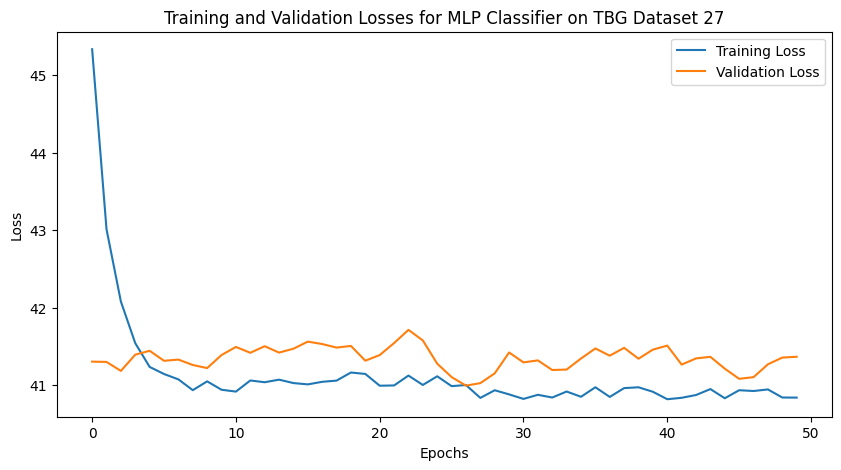

Test Loss: 35.0923, Test Accuracy: 0.6800, AUROC: 0.7388
Training on TBG Dataset 28/33
Epoch 1/50, Training Loss: 45.4066, Validation Loss: 41.2648, Training Accuracy: 0.6431
Epoch 10/50, Training Loss: 41.0886, Validation Loss: 41.6672, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 41.0971, Validation Loss: 41.5911, Training Accuracy: 0.9590
Epoch 30/50, Training Loss: 41.0199, Validation Loss: 41.1406, Training Accuracy: 0.9708
Epoch 40/50, Training Loss: 40.8494, Validation Loss: 42.0205, Training Accuracy: 0.9785
Epoch 50/50, Training Loss: 41.0629, Validation Loss: 41.5486, Training Accuracy: 0.9667


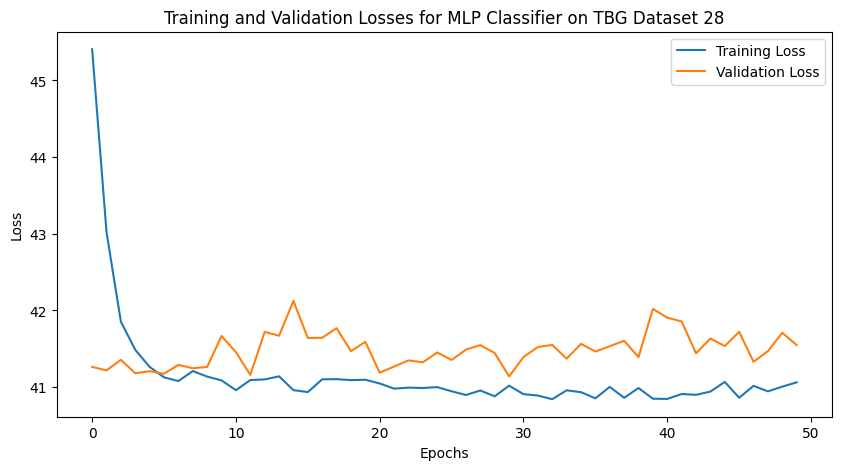

Test Loss: 35.6968, Test Accuracy: 0.6450, AUROC: 0.6946
Training on TBG Dataset 29/33
Epoch 1/50, Training Loss: 45.2816, Validation Loss: 41.4223, Training Accuracy: 0.6507
Epoch 10/50, Training Loss: 41.1450, Validation Loss: 41.3296, Training Accuracy: 0.9653
Epoch 20/50, Training Loss: 40.9992, Validation Loss: 41.6953, Training Accuracy: 0.9715
Epoch 30/50, Training Loss: 41.0529, Validation Loss: 41.6153, Training Accuracy: 0.9646
Epoch 40/50, Training Loss: 40.9019, Validation Loss: 41.4516, Training Accuracy: 0.9764
Epoch 50/50, Training Loss: 40.8917, Validation Loss: 41.6117, Training Accuracy: 0.9757


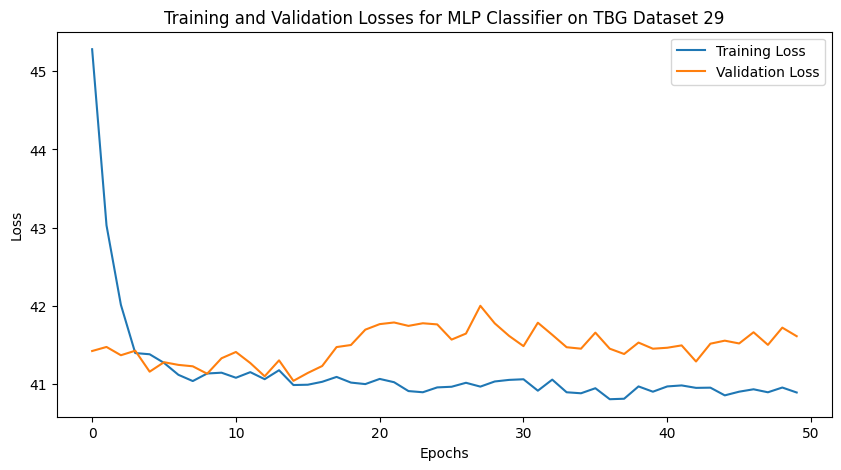

Test Loss: 35.3702, Test Accuracy: 0.6700, AUROC: 0.7205
Training on TBG Dataset 30/33
Epoch 1/50, Training Loss: 45.4279, Validation Loss: 41.2395, Training Accuracy: 0.6326
Epoch 10/50, Training Loss: 41.2209, Validation Loss: 41.2647, Training Accuracy: 0.9597
Epoch 20/50, Training Loss: 40.9460, Validation Loss: 41.4480, Training Accuracy: 0.9729
Epoch 30/50, Training Loss: 40.9272, Validation Loss: 41.4338, Training Accuracy: 0.9750
Epoch 40/50, Training Loss: 40.9455, Validation Loss: 41.2412, Training Accuracy: 0.9688
Epoch 50/50, Training Loss: 40.9743, Validation Loss: 41.3768, Training Accuracy: 0.9743


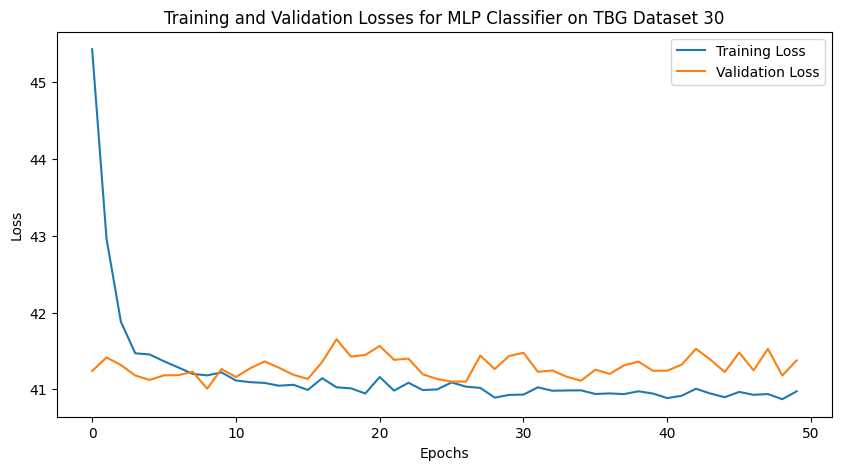

Test Loss: 35.4590, Test Accuracy: 0.6500, AUROC: 0.7180
Training on TBG Dataset 31/33
Epoch 1/50, Training Loss: 45.3279, Validation Loss: 41.1702, Training Accuracy: 0.6507
Epoch 10/50, Training Loss: 41.0466, Validation Loss: 41.1735, Training Accuracy: 0.9660
Epoch 20/50, Training Loss: 41.1124, Validation Loss: 40.9439, Training Accuracy: 0.9653
Epoch 30/50, Training Loss: 40.9211, Validation Loss: 41.0015, Training Accuracy: 0.9764
Epoch 40/50, Training Loss: 40.9142, Validation Loss: 41.3242, Training Accuracy: 0.9806
Epoch 50/50, Training Loss: 40.9811, Validation Loss: 41.3471, Training Accuracy: 0.9736


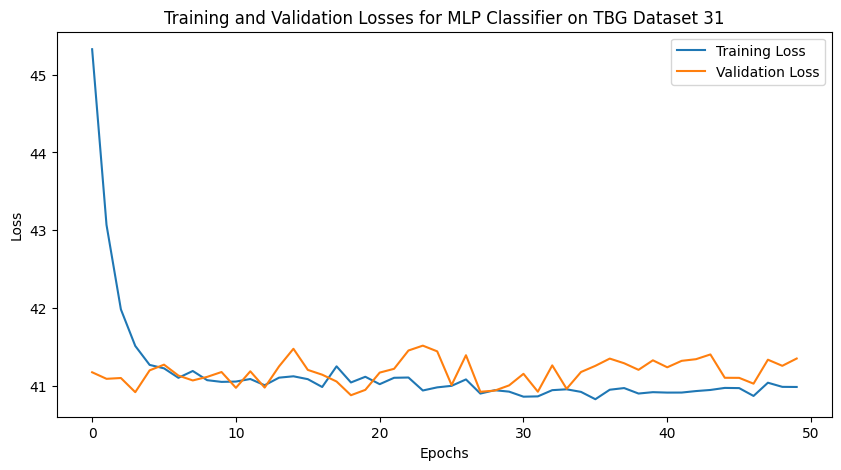

Test Loss: 35.6564, Test Accuracy: 0.6500, AUROC: 0.7030
Training on TBG Dataset 32/33
Epoch 1/50, Training Loss: 45.2046, Validation Loss: 41.2942, Training Accuracy: 0.6590
Epoch 10/50, Training Loss: 41.0886, Validation Loss: 41.1747, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 40.8845, Validation Loss: 41.2659, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 40.9554, Validation Loss: 41.3969, Training Accuracy: 0.9757
Epoch 40/50, Training Loss: 40.9487, Validation Loss: 41.6095, Training Accuracy: 0.9736
Epoch 50/50, Training Loss: 40.8563, Validation Loss: 41.0946, Training Accuracy: 0.9792


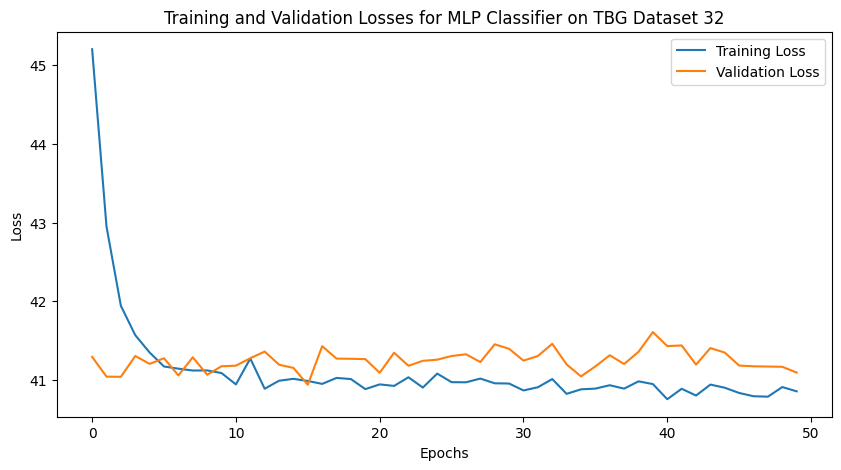

Test Loss: 35.6134, Test Accuracy: 0.6500, AUROC: 0.6926
Training on TBG Dataset 33/33
Epoch 1/50, Training Loss: 45.4226, Validation Loss: 41.4886, Training Accuracy: 0.6514
Epoch 10/50, Training Loss: 41.3104, Validation Loss: 41.1930, Training Accuracy: 0.9521
Epoch 20/50, Training Loss: 41.0758, Validation Loss: 41.2993, Training Accuracy: 0.9646
Epoch 30/50, Training Loss: 41.1270, Validation Loss: 41.3577, Training Accuracy: 0.9563
Epoch 40/50, Training Loss: 41.1275, Validation Loss: 41.5612, Training Accuracy: 0.9625
Epoch 50/50, Training Loss: 40.8418, Validation Loss: 41.4250, Training Accuracy: 0.9764


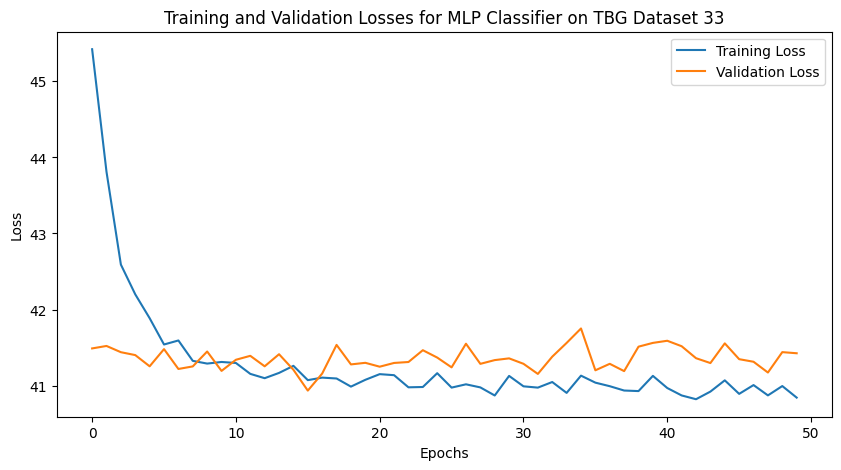

Test Loss: 35.8150, Test Accuracy: 0.6200, AUROC: 0.6969


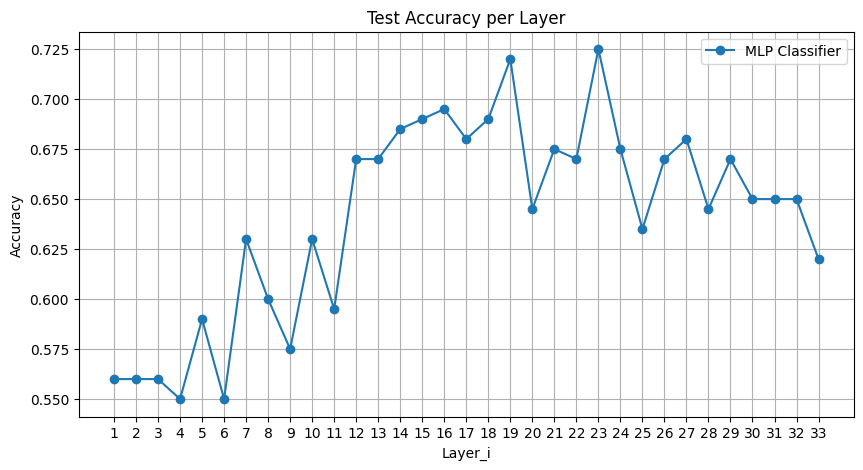

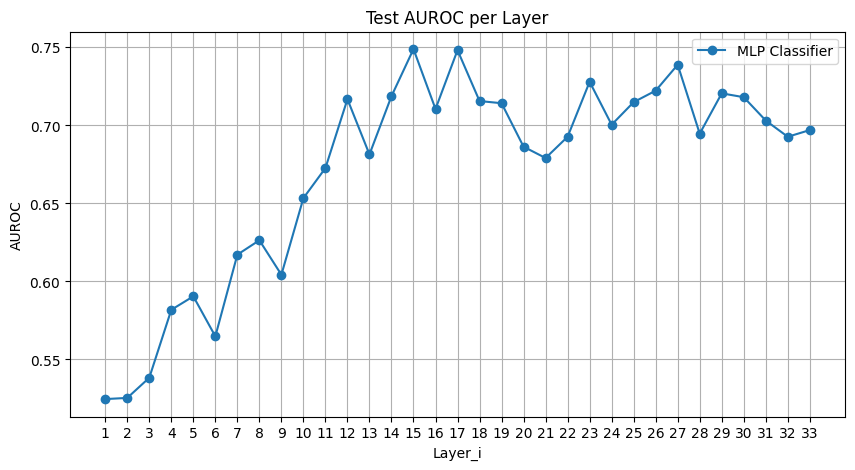

In [125]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
tabmlp_test_accs = []
tabmlp_test_aucs = []
tabmlp_trained_models = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(tbg_train_dataloaders, tbg_valid_dataloaders, tbg_test_dataloaders)):
    print(f"Training on TBG Dataset {i+1}/{len(tbg_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on TBG Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    tabmlp_test_accs.append(test_acc)
    tabmlp_test_aucs.append(test_auc)
    tabmlp_trained_models.append(model)

plot_1d_metrics([tabmlp_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([tabmlp_test_aucs], ['MLP Classifier'], 'AUROC')

In [126]:
# Max AUROC achieved by 'transfer learning' compared to normal training
print(f"TBG: AUROC for MLP trained on Binary SE, tested on Accuracy: {max(tabmlp_test_aucs):.4f}")
print(f"TBG: AUROC for MLP trained on Accuracy, tested on Accuracy: {max(tamlp_test_aucs):.4f}")

TBG: AUROC for MLP trained on Binary SE, tested on Accuracy: 0.7488
TBG: AUROC for MLP trained on Accuracy, tested on Accuracy: 0.8488


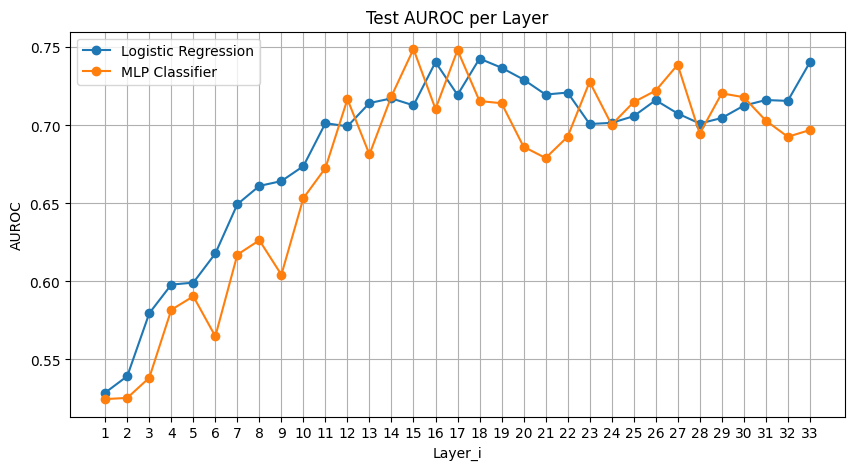

In [129]:
# LR vs MLP on TBG for Accuracy
# plot_1d_metrics([tablr_test_accs, tabmlp_test_accs], ['Logistic Regression', 'MLP Classifier'], 'Accuracy')
plot_1d_metrics([tablr_test_aucs, tabmlp_test_aucs], ['Logistic Regression', 'MLP Classifier'], 'AUROC')

Now we test on SLT embeddings.

In [66]:
slt_train_dataloaders, slt_valid_dataloaders, _ = create_dataloaders(slt_layered_datasets, bca_entropy, total_size, batch_size, set_seed=True)
_, _, slt_test_dataloaders = create_dataloaders(slt_layered_datasets, r_accuracies, total_size, batch_size, set_seed=True)

X_trains, X_vals, _, y_trains, y_vals, _ = create_Xs_and_ys(slt_layered_datasets, bca_entropy, total_size)
_, _, X_tests, _, _, y_tests = create_Xs_and_ys(slt_layered_datasets, r_accuracies, total_size)

Training on SLT Dataset 1/32
Validation Accuracy: 0.5889, AUROC: 0.6121
Training Loss: 0.6727, Validation Loss: 0.6710
Test Loss: 0.6682, Test Accuracy: 0.6300, AUROC: 0.4971
Training on SLT Dataset 2/32
Validation Accuracy: 0.5972, AUROC: 0.5778
Training Loss: 0.6645, Validation Loss: 0.6690
Test Loss: 0.6677, Test Accuracy: 0.6150, AUROC: 0.5035
Training on SLT Dataset 3/32
Validation Accuracy: 0.6250, AUROC: 0.6219
Training Loss: 0.6441, Validation Loss: 0.6544
Test Loss: 0.6668, Test Accuracy: 0.5950, AUROC: 0.5437
Training on SLT Dataset 4/32
Validation Accuracy: 0.6056, AUROC: 0.6424
Training Loss: 0.6237, Validation Loss: 0.6425
Test Loss: 0.6512, Test Accuracy: 0.6350, AUROC: 0.6027
Training on SLT Dataset 5/32
Validation Accuracy: 0.6139, AUROC: 0.6778
Training Loss: 0.5758, Validation Loss: 0.6244
Test Loss: 0.6271, Test Accuracy: 0.6700, AUROC: 0.6506
Training on SLT Dataset 6/32
Validation Accuracy: 0.6528, AUROC: 0.6941
Training Loss: 0.5295, Validation Loss: 0.6161
Test L

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6472, AUROC: 0.6987
Training Loss: 0.4647, Validation Loss: 0.6238
Test Loss: 0.6309, Test Accuracy: 0.6800, AUROC: 0.6850
Training on SLT Dataset 8/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6833, AUROC: 0.7235
Training Loss: 0.4197, Validation Loss: 0.6118
Test Loss: 0.6152, Test Accuracy: 0.6650, AUROC: 0.7025
Training on SLT Dataset 9/32
Validation Accuracy: 0.6917, AUROC: 0.7516
Training Loss: 0.3624, Validation Loss: 0.5918
Test Loss: 0.6193, Test Accuracy: 0.6750, AUROC: 0.7127
Training on SLT Dataset 10/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6778, AUROC: 0.7444
Training Loss: 0.2445, Validation Loss: 0.6454
Test Loss: 0.7617, Test Accuracy: 0.6550, AUROC: 0.6738
Training on SLT Dataset 11/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7056, AUROC: 0.7632
Training Loss: 0.1933, Validation Loss: 0.6597
Test Loss: 0.7470, Test Accuracy: 0.6650, AUROC: 0.6981
Training on SLT Dataset 12/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7194, AUROC: 0.7771
Training Loss: 0.1484, Validation Loss: 0.6922
Test Loss: 0.7937, Test Accuracy: 0.6800, AUROC: 0.7202
Training on SLT Dataset 13/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.6944, AUROC: 0.7719
Training Loss: 0.1097, Validation Loss: 0.7425
Test Loss: 0.8681, Test Accuracy: 0.6650, AUROC: 0.7067
Training on SLT Dataset 14/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7278, AUROC: 0.7852
Training Loss: 0.0941, Validation Loss: 0.7532
Test Loss: 0.8857, Test Accuracy: 0.6800, AUROC: 0.7113
Training on SLT Dataset 15/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7583, AUROC: 0.8029
Training Loss: 0.0643, Validation Loss: 0.7506
Test Loss: 0.8367, Test Accuracy: 0.6900, AUROC: 0.7500
Training on SLT Dataset 16/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7333, AUROC: 0.8119
Training Loss: 0.0540, Validation Loss: 0.7733
Test Loss: 0.9809, Test Accuracy: 0.6900, AUROC: 0.7367
Training on SLT Dataset 17/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7278, AUROC: 0.7938
Training Loss: 0.0341, Validation Loss: 0.9535
Test Loss: 1.1629, Test Accuracy: 0.6850, AUROC: 0.7260
Training on SLT Dataset 18/32
Validation Accuracy: 0.7583, AUROC: 0.7999
Training Loss: 0.0273, Validation Loss: 0.9638
Test Loss: 1.2155, Test Accuracy: 0.6600, AUROC: 0.7236
Training on SLT Dataset 19/32
Validation Accuracy: 0.7250, AUROC: 0.8024
Training Loss: 0.0229, Validation Loss: 1.0456
Test Loss: 1.3761, Test Accuracy: 0.6800, AUROC: 0.7146
Training on SLT Dataset 20/32
Validation Accuracy: 0.7250, AUROC: 0.8061
Training Loss: 0.0178, Validation Loss: 1.0902
Test Loss: 1.3222, Test Accuracy: 0.7100, AUROC: 0.7410
Training on SLT Dataset 21/32
Validation Accuracy: 0.7278, AUROC: 0.8065
Training Loss: 0.0139, Validation Loss: 1.1668
Test Loss: 1.4538, Test Accuracy: 0.6850, AUROC: 0.7346
Training on SLT Dataset 22/32
Validation Accuracy: 0.7306, AUROC: 0.8019
Training Loss: 0.0121, Validation Loss: 1.2526
Test Loss: 1.5917, Test Accura

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7444, AUROC: 0.8278
Training Loss: 0.0098, Validation Loss: 1.1562
Test Loss: 1.7694, Test Accuracy: 0.6650, AUROC: 0.7133
Training on SLT Dataset 27/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7194, AUROC: 0.8103
Training Loss: 0.0095, Validation Loss: 1.2813
Test Loss: 1.7433, Test Accuracy: 0.6550, AUROC: 0.7324
Training on SLT Dataset 28/32
Validation Accuracy: 0.7306, AUROC: 0.8132
Training Loss: 0.0093, Validation Loss: 1.2937
Test Loss: 1.6430, Test Accuracy: 0.6700, AUROC: 0.7367
Training on SLT Dataset 29/32
Validation Accuracy: 0.7306, AUROC: 0.8233
Training Loss: 0.0091, Validation Loss: 1.2552
Test Loss: 1.7314, Test Accuracy: 0.6800, AUROC: 0.7421
Training on SLT Dataset 30/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7667, AUROC: 0.8298
Training Loss: 0.0090, Validation Loss: 1.2775
Test Loss: 1.6703, Test Accuracy: 0.6800, AUROC: 0.7506
Training on SLT Dataset 31/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7583, AUROC: 0.8381
Training Loss: 0.0088, Validation Loss: 1.2647
Test Loss: 1.8331, Test Accuracy: 0.7100, AUROC: 0.7485
Training on SLT Dataset 32/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.7750, AUROC: 0.8288
Training Loss: 0.0096, Validation Loss: 1.3051
Test Loss: 1.8586, Test Accuracy: 0.6800, AUROC: 0.7406


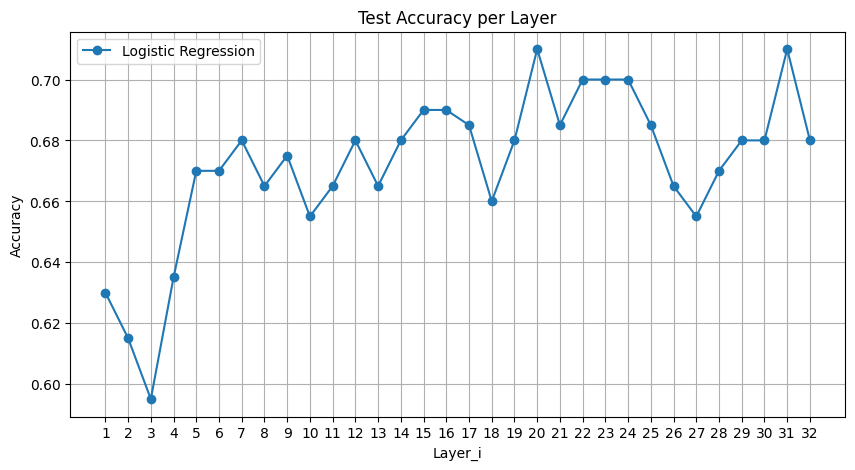

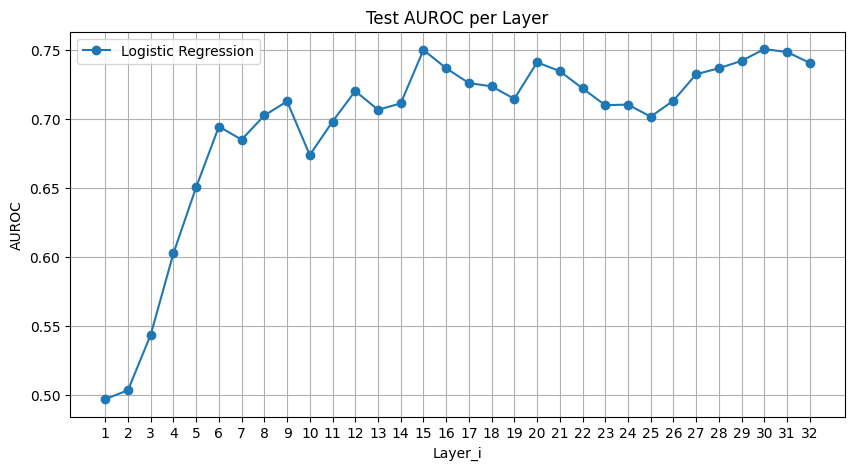

In [67]:
# Training Loops (LR)
sablr_test_accs = []
sablr_test_aucs = []
sablr_trained_models = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(X_trains, X_vals, X_tests, y_trains, y_vals, y_tests)):
    print(f"Training on SLT Dataset {i+1}/{len(X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on SLT Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    sablr_test_accs.append(test_acc)
    sablr_test_aucs.append(test_auc)
    sablr_trained_models.append(model)

plot_1d_metrics([sablr_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([sablr_test_aucs], ['Logistic Regression'], 'AUROC')

In [68]:
# Max AUROC achieved by 'transfer learning' compared to normal training
print(f"SLT: AUROC for LR trained on Binary SE, tested on Accuracy: {max(sablr_test_aucs):.4f}")
print(f"SLT: AUROC for LR trained on Accuracy, tested on Accuracy: {max(salr_test_aucs):.4f}")

SLT: AUROC for LR trained on Binary SE, tested on Accuracy: 0.7506
SLT: AUROC for LR trained on Accuracy, tested on Accuracy: 0.7891


Using device: cuda
Training on SLT Dataset 1/33
Epoch 1/50, Training Loss: 46.3793, Validation Loss: 43.0882, Training Accuracy: 0.5444
Epoch 10/50, Training Loss: 44.6302, Validation Loss: 42.6125, Training Accuracy: 0.7035
Epoch 20/50, Training Loss: 43.7177, Validation Loss: 43.2336, Training Accuracy: 0.7778
Epoch 30/50, Training Loss: 43.1428, Validation Loss: 42.8528, Training Accuracy: 0.8153
Epoch 40/50, Training Loss: 43.0616, Validation Loss: 43.0126, Training Accuracy: 0.8236
Epoch 50/50, Training Loss: 42.5231, Validation Loss: 43.3329, Training Accuracy: 0.8688


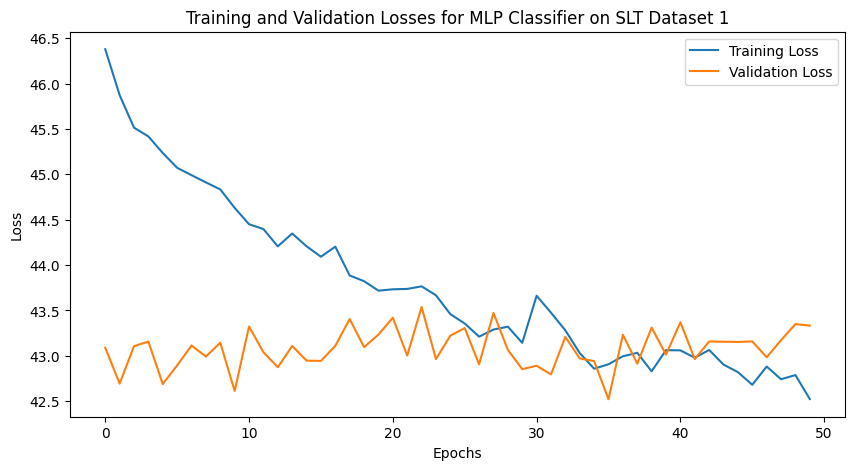

Test Loss: 37.2362, Test Accuracy: 0.5350, AUROC: 0.5018
Training on SLT Dataset 2/33
Epoch 1/50, Training Loss: 46.5539, Validation Loss: 43.1004, Training Accuracy: 0.5146
Epoch 10/50, Training Loss: 44.4756, Validation Loss: 43.3050, Training Accuracy: 0.7111
Epoch 20/50, Training Loss: 43.8299, Validation Loss: 43.6312, Training Accuracy: 0.7694
Epoch 30/50, Training Loss: 43.3005, Validation Loss: 43.4001, Training Accuracy: 0.8042
Epoch 40/50, Training Loss: 42.7063, Validation Loss: 43.0974, Training Accuracy: 0.8479
Epoch 50/50, Training Loss: 42.6964, Validation Loss: 43.0999, Training Accuracy: 0.8458


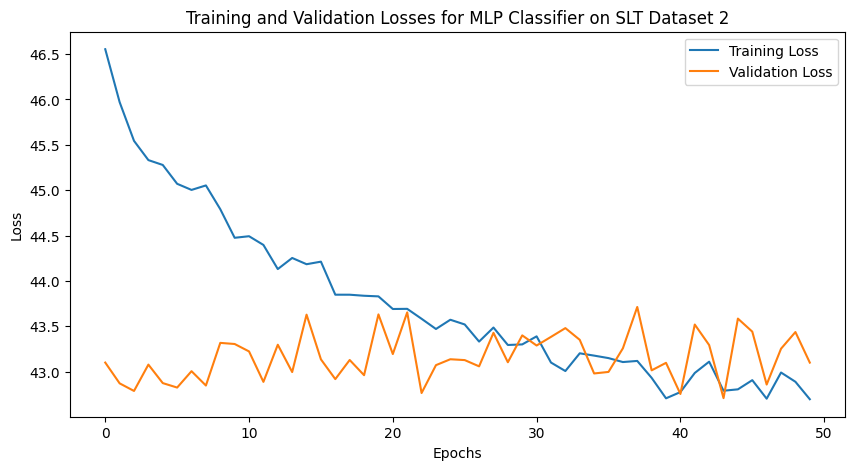

Test Loss: 37.0819, Test Accuracy: 0.5150, AUROC: 0.5521
Training on SLT Dataset 3/33
Epoch 1/50, Training Loss: 46.4251, Validation Loss: 43.0581, Training Accuracy: 0.5410
Epoch 10/50, Training Loss: 44.4046, Validation Loss: 43.0479, Training Accuracy: 0.7292
Epoch 20/50, Training Loss: 43.5322, Validation Loss: 42.8299, Training Accuracy: 0.7993
Epoch 30/50, Training Loss: 43.4486, Validation Loss: 42.3008, Training Accuracy: 0.7993
Epoch 40/50, Training Loss: 42.8737, Validation Loss: 42.3646, Training Accuracy: 0.8340
Epoch 50/50, Training Loss: 42.6971, Validation Loss: 42.6285, Training Accuracy: 0.8465


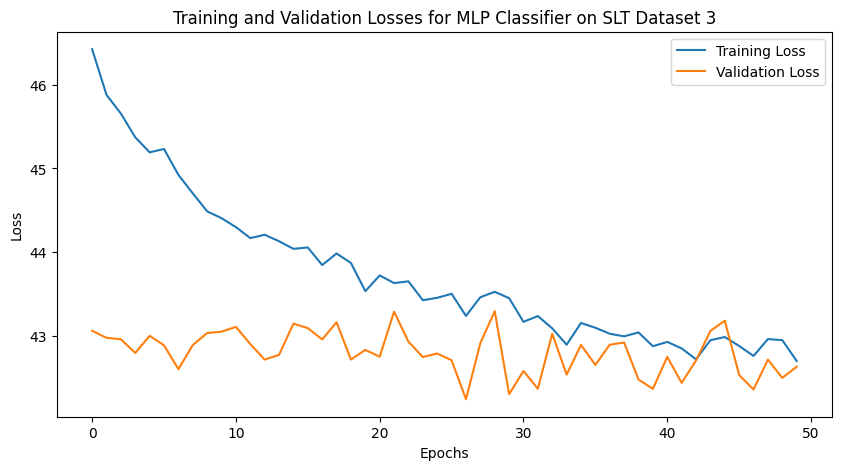

Test Loss: 36.1490, Test Accuracy: 0.5050, AUROC: 0.5743
Training on SLT Dataset 4/33
Epoch 1/50, Training Loss: 46.2760, Validation Loss: 43.0398, Training Accuracy: 0.5708
Epoch 10/50, Training Loss: 44.5161, Validation Loss: 43.0855, Training Accuracy: 0.7146
Epoch 20/50, Training Loss: 43.1929, Validation Loss: 42.5688, Training Accuracy: 0.8146
Epoch 30/50, Training Loss: 43.0155, Validation Loss: 42.3078, Training Accuracy: 0.8299
Epoch 40/50, Training Loss: 42.8282, Validation Loss: 42.8253, Training Accuracy: 0.8313
Epoch 50/50, Training Loss: 42.5234, Validation Loss: 42.4788, Training Accuracy: 0.8646


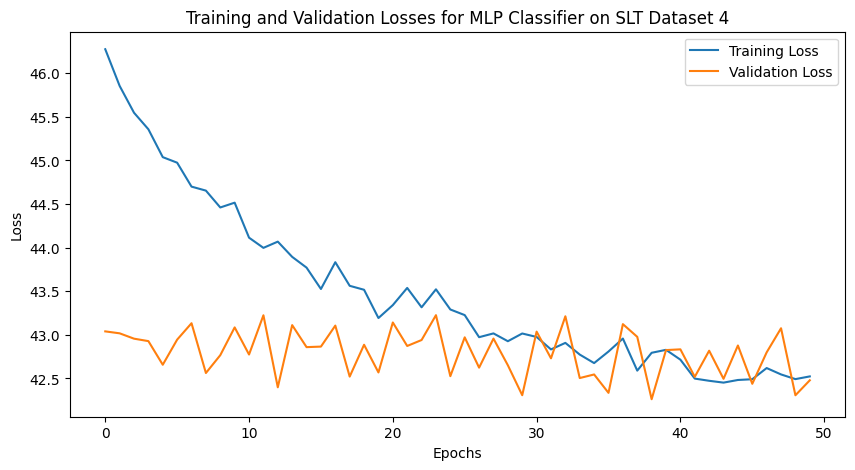

Test Loss: 36.4596, Test Accuracy: 0.6000, AUROC: 0.5939
Training on SLT Dataset 5/33
Epoch 1/50, Training Loss: 46.2876, Validation Loss: 42.9622, Training Accuracy: 0.5604
Epoch 10/50, Training Loss: 43.4805, Validation Loss: 42.7636, Training Accuracy: 0.8049
Epoch 20/50, Training Loss: 42.8354, Validation Loss: 42.7095, Training Accuracy: 0.8458
Epoch 30/50, Training Loss: 42.2070, Validation Loss: 42.1791, Training Accuracy: 0.8792
Epoch 40/50, Training Loss: 42.1573, Validation Loss: 42.3479, Training Accuracy: 0.8889
Epoch 50/50, Training Loss: 42.0226, Validation Loss: 42.1809, Training Accuracy: 0.8972


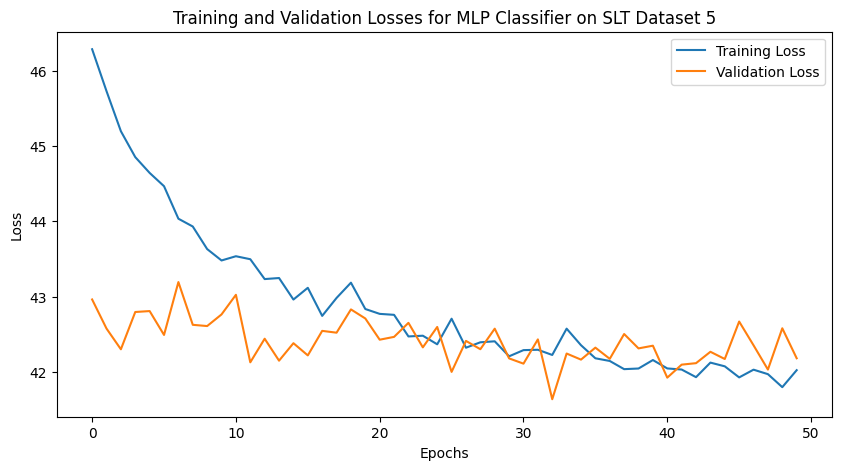

Test Loss: 37.0085, Test Accuracy: 0.5500, AUROC: 0.5461
Training on SLT Dataset 6/33
Epoch 1/50, Training Loss: 45.9412, Validation Loss: 42.6402, Training Accuracy: 0.5882
Epoch 10/50, Training Loss: 43.3891, Validation Loss: 42.2364, Training Accuracy: 0.7972
Epoch 20/50, Training Loss: 42.4177, Validation Loss: 42.4667, Training Accuracy: 0.8667
Epoch 30/50, Training Loss: 42.1071, Validation Loss: 42.3228, Training Accuracy: 0.8965
Epoch 40/50, Training Loss: 41.9818, Validation Loss: 42.2885, Training Accuracy: 0.9042
Epoch 50/50, Training Loss: 41.7093, Validation Loss: 42.3730, Training Accuracy: 0.9194


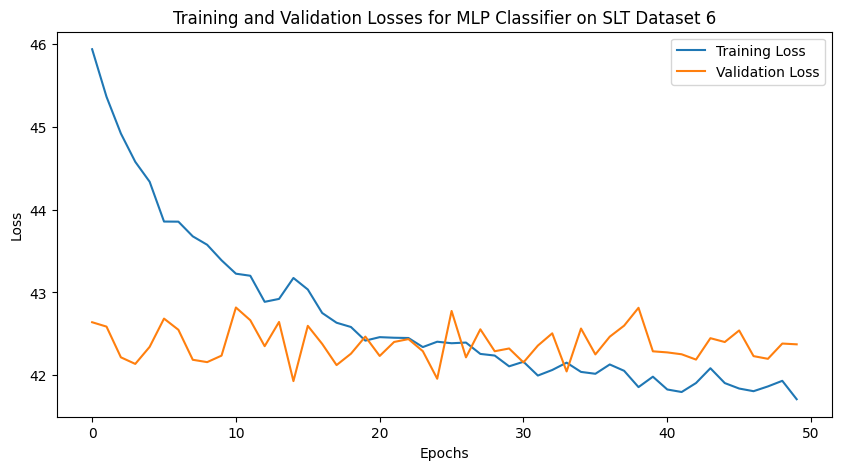

Test Loss: 36.3988, Test Accuracy: 0.5900, AUROC: 0.5872
Training on SLT Dataset 7/33
Epoch 1/50, Training Loss: 45.8148, Validation Loss: 42.4878, Training Accuracy: 0.6278
Epoch 10/50, Training Loss: 43.2793, Validation Loss: 42.3966, Training Accuracy: 0.8028
Epoch 20/50, Training Loss: 42.4539, Validation Loss: 42.4939, Training Accuracy: 0.8708
Epoch 30/50, Training Loss: 42.0604, Validation Loss: 42.3841, Training Accuracy: 0.8917
Epoch 40/50, Training Loss: 41.7569, Validation Loss: 42.0987, Training Accuracy: 0.9187
Epoch 50/50, Training Loss: 41.5601, Validation Loss: 42.6944, Training Accuracy: 0.9257


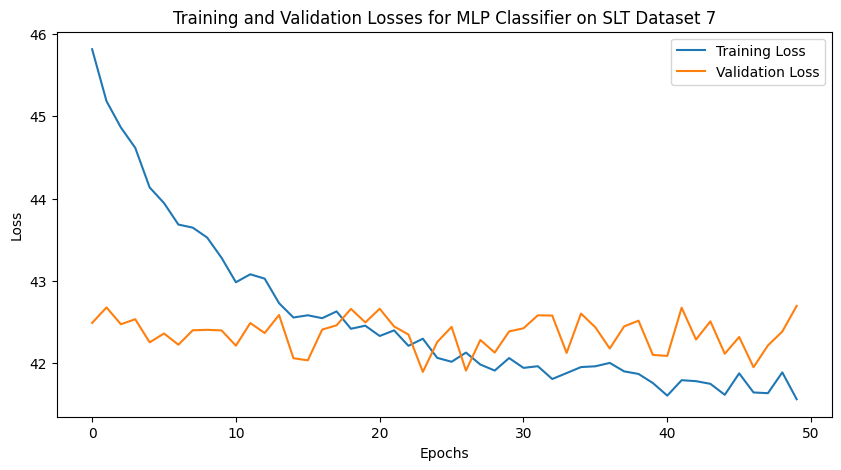

Test Loss: 36.4842, Test Accuracy: 0.5800, AUROC: 0.6115
Training on SLT Dataset 8/33
Epoch 1/50, Training Loss: 45.7297, Validation Loss: 42.3930, Training Accuracy: 0.6188
Epoch 10/50, Training Loss: 43.0129, Validation Loss: 42.1031, Training Accuracy: 0.8250
Epoch 20/50, Training Loss: 42.2336, Validation Loss: 42.0355, Training Accuracy: 0.8819
Epoch 30/50, Training Loss: 41.8268, Validation Loss: 41.7810, Training Accuracy: 0.9069
Epoch 40/50, Training Loss: 41.7052, Validation Loss: 41.9185, Training Accuracy: 0.9146
Epoch 50/50, Training Loss: 41.4659, Validation Loss: 42.0867, Training Accuracy: 0.9326


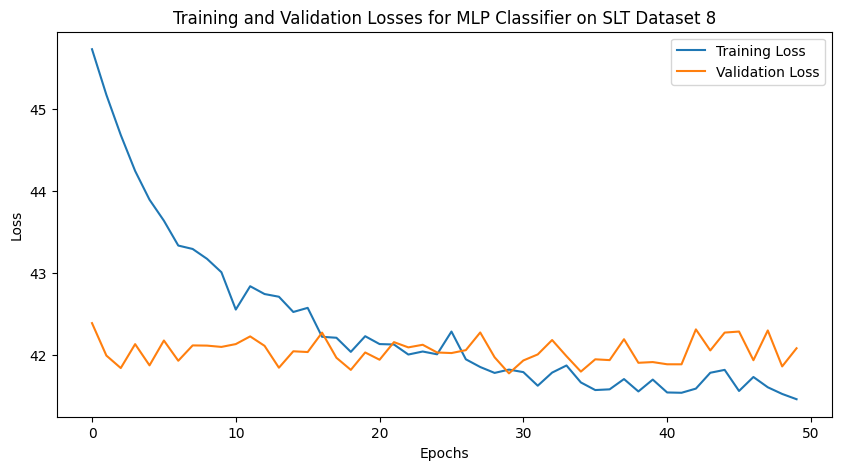

Test Loss: 35.5298, Test Accuracy: 0.6350, AUROC: 0.6482
Training on SLT Dataset 9/33
Epoch 1/50, Training Loss: 45.7083, Validation Loss: 42.5380, Training Accuracy: 0.6146
Epoch 10/50, Training Loss: 42.7615, Validation Loss: 42.0323, Training Accuracy: 0.8438
Epoch 20/50, Training Loss: 41.8360, Validation Loss: 41.8435, Training Accuracy: 0.9118
Epoch 30/50, Training Loss: 41.5460, Validation Loss: 41.8871, Training Accuracy: 0.9278
Epoch 40/50, Training Loss: 41.5480, Validation Loss: 41.9440, Training Accuracy: 0.9299
Epoch 50/50, Training Loss: 41.5832, Validation Loss: 42.2512, Training Accuracy: 0.9271


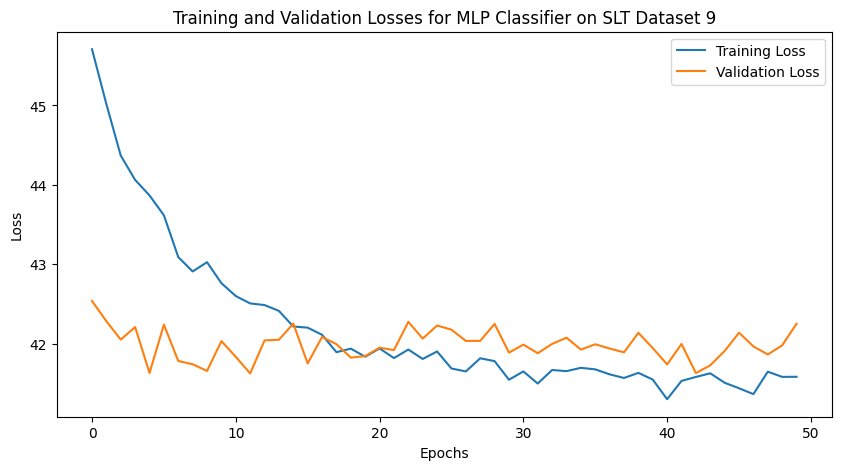

Test Loss: 35.7297, Test Accuracy: 0.6350, AUROC: 0.6836
Training on SLT Dataset 10/33
Epoch 1/50, Training Loss: 45.4807, Validation Loss: 42.2832, Training Accuracy: 0.6201
Epoch 10/50, Training Loss: 42.5067, Validation Loss: 41.7871, Training Accuracy: 0.8597
Epoch 20/50, Training Loss: 41.8620, Validation Loss: 41.6224, Training Accuracy: 0.9076
Epoch 30/50, Training Loss: 41.5838, Validation Loss: 41.8680, Training Accuracy: 0.9292
Epoch 40/50, Training Loss: 41.3617, Validation Loss: 41.6645, Training Accuracy: 0.9451
Epoch 50/50, Training Loss: 41.3039, Validation Loss: 41.9460, Training Accuracy: 0.9417


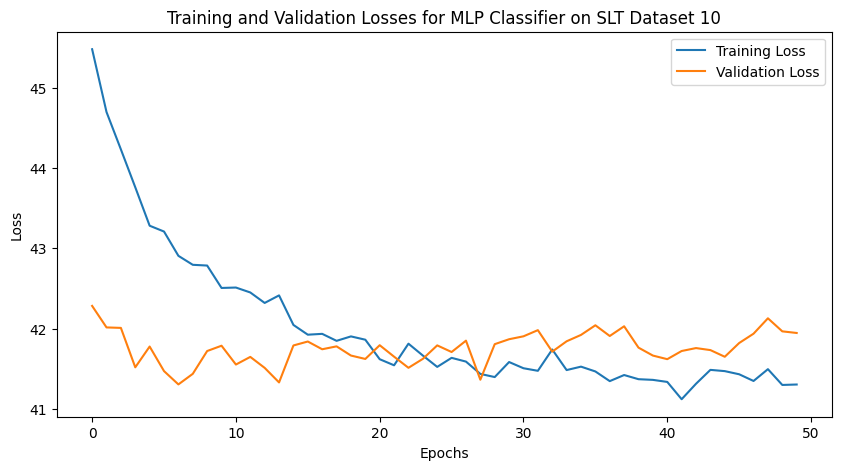

Test Loss: 35.6573, Test Accuracy: 0.6700, AUROC: 0.6845
Training on SLT Dataset 11/33
Epoch 1/50, Training Loss: 45.4941, Validation Loss: 42.0693, Training Accuracy: 0.6375
Epoch 10/50, Training Loss: 42.2155, Validation Loss: 41.9044, Training Accuracy: 0.8833
Epoch 20/50, Training Loss: 41.5726, Validation Loss: 41.4497, Training Accuracy: 0.9340
Epoch 30/50, Training Loss: 41.4038, Validation Loss: 41.5795, Training Accuracy: 0.9437
Epoch 40/50, Training Loss: 41.3272, Validation Loss: 41.7685, Training Accuracy: 0.9437
Epoch 50/50, Training Loss: 41.2951, Validation Loss: 41.5991, Training Accuracy: 0.9444


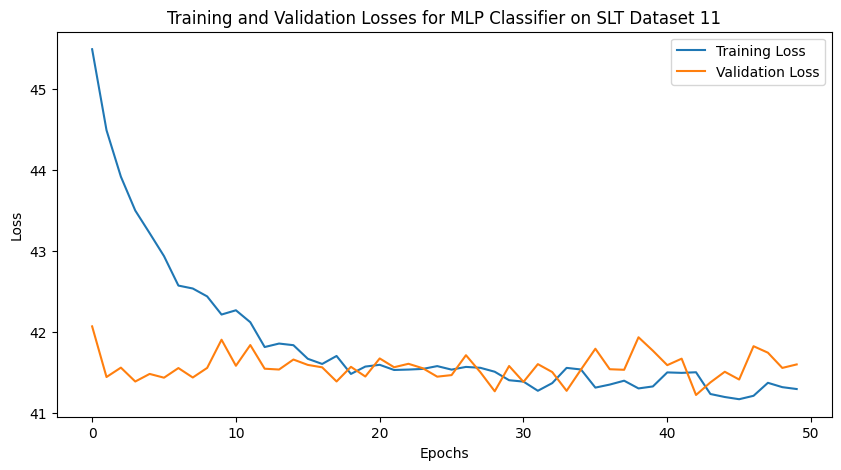

Test Loss: 35.0939, Test Accuracy: 0.6800, AUROC: 0.7062
Training on SLT Dataset 12/33
Epoch 1/50, Training Loss: 45.2621, Validation Loss: 41.6696, Training Accuracy: 0.6611
Epoch 10/50, Training Loss: 41.9087, Validation Loss: 41.4549, Training Accuracy: 0.9056
Epoch 20/50, Training Loss: 41.5976, Validation Loss: 41.5865, Training Accuracy: 0.9306
Epoch 30/50, Training Loss: 41.4584, Validation Loss: 41.4082, Training Accuracy: 0.9375
Epoch 40/50, Training Loss: 41.3137, Validation Loss: 41.2208, Training Accuracy: 0.9472
Epoch 50/50, Training Loss: 41.1868, Validation Loss: 41.4833, Training Accuracy: 0.9549


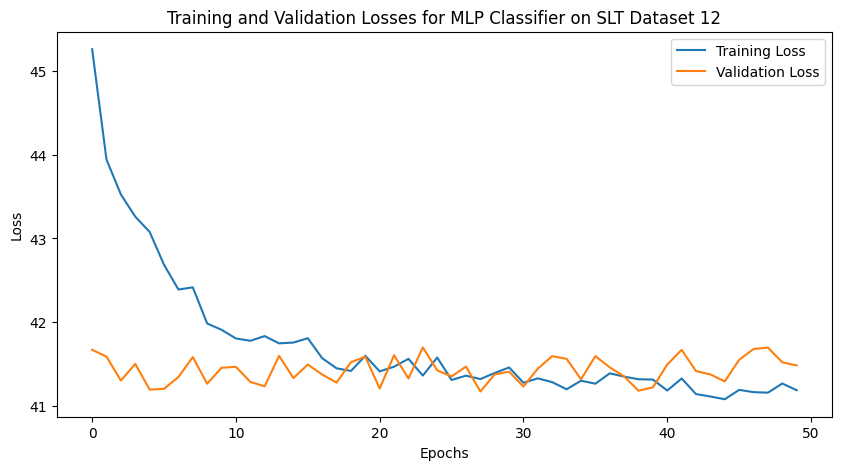

Test Loss: 35.5307, Test Accuracy: 0.6350, AUROC: 0.6740
Training on SLT Dataset 13/33
Epoch 1/50, Training Loss: 45.0091, Validation Loss: 41.4338, Training Accuracy: 0.6694
Epoch 10/50, Training Loss: 41.9892, Validation Loss: 41.3565, Training Accuracy: 0.9049
Epoch 20/50, Training Loss: 41.4762, Validation Loss: 41.2663, Training Accuracy: 0.9354
Epoch 30/50, Training Loss: 41.2868, Validation Loss: 41.5182, Training Accuracy: 0.9493
Epoch 40/50, Training Loss: 41.2158, Validation Loss: 41.1975, Training Accuracy: 0.9556
Epoch 50/50, Training Loss: 41.2090, Validation Loss: 41.4104, Training Accuracy: 0.9563


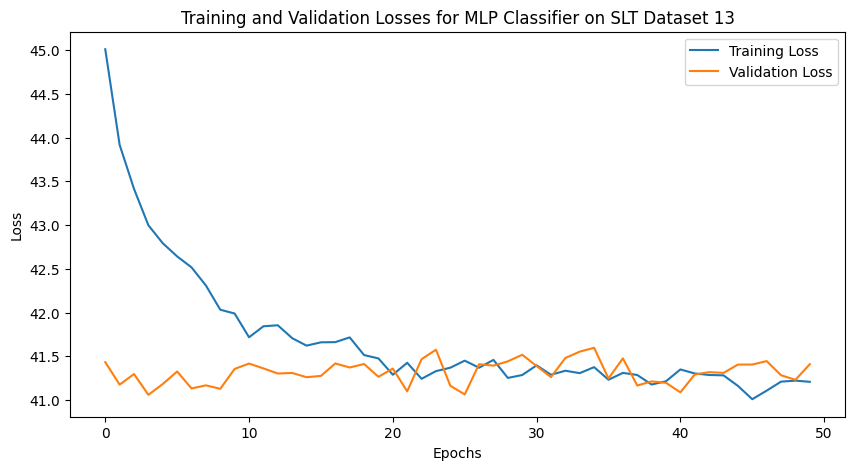

Test Loss: 35.2905, Test Accuracy: 0.6650, AUROC: 0.7073
Training on SLT Dataset 14/33
Epoch 1/50, Training Loss: 45.0231, Validation Loss: 41.2424, Training Accuracy: 0.6618
Epoch 10/50, Training Loss: 41.8301, Validation Loss: 41.1536, Training Accuracy: 0.9111
Epoch 20/50, Training Loss: 41.4329, Validation Loss: 40.9008, Training Accuracy: 0.9382
Epoch 30/50, Training Loss: 41.2013, Validation Loss: 40.9448, Training Accuracy: 0.9549
Epoch 40/50, Training Loss: 41.1296, Validation Loss: 41.1882, Training Accuracy: 0.9597
Epoch 50/50, Training Loss: 41.1444, Validation Loss: 41.2116, Training Accuracy: 0.9590


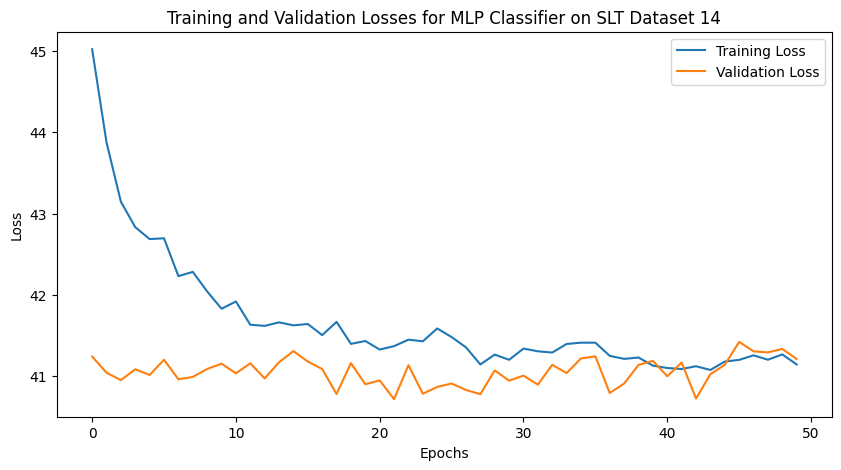

Test Loss: 35.3854, Test Accuracy: 0.6650, AUROC: 0.6876
Training on SLT Dataset 15/33
Epoch 1/50, Training Loss: 44.9109, Validation Loss: 41.0348, Training Accuracy: 0.6785
Epoch 10/50, Training Loss: 41.8448, Validation Loss: 41.0929, Training Accuracy: 0.9097
Epoch 20/50, Training Loss: 41.2713, Validation Loss: 40.8652, Training Accuracy: 0.9500
Epoch 30/50, Training Loss: 41.1329, Validation Loss: 40.6870, Training Accuracy: 0.9569
Epoch 40/50, Training Loss: 41.1590, Validation Loss: 40.9223, Training Accuracy: 0.9618
Epoch 50/50, Training Loss: 41.1166, Validation Loss: 41.1784, Training Accuracy: 0.9625


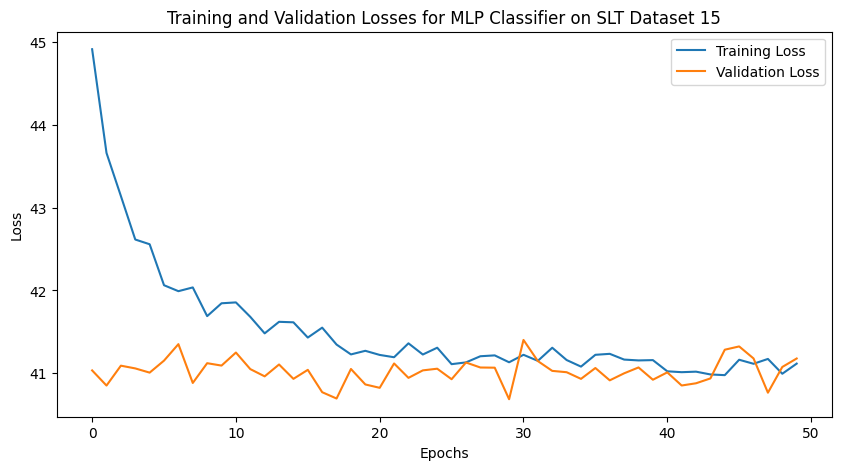

Test Loss: 34.7339, Test Accuracy: 0.7200, AUROC: 0.7574
Training on SLT Dataset 16/33
Epoch 1/50, Training Loss: 44.6896, Validation Loss: 41.0536, Training Accuracy: 0.6986
Epoch 10/50, Training Loss: 41.5667, Validation Loss: 41.1281, Training Accuracy: 0.9319
Epoch 20/50, Training Loss: 41.3251, Validation Loss: 41.3376, Training Accuracy: 0.9444
Epoch 30/50, Training Loss: 41.1277, Validation Loss: 41.1219, Training Accuracy: 0.9576
Epoch 40/50, Training Loss: 41.0329, Validation Loss: 41.1422, Training Accuracy: 0.9688
Epoch 50/50, Training Loss: 40.9378, Validation Loss: 41.1801, Training Accuracy: 0.9743


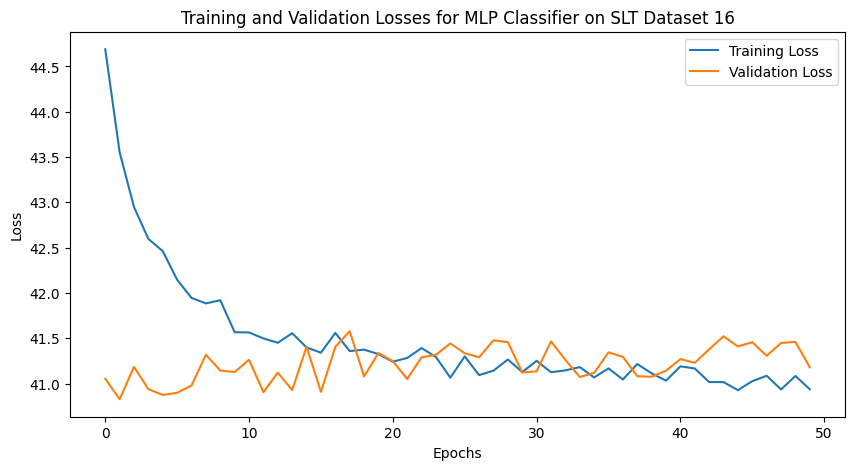

Test Loss: 34.7974, Test Accuracy: 0.6850, AUROC: 0.7543
Training on SLT Dataset 17/33
Epoch 1/50, Training Loss: 44.5853, Validation Loss: 40.8641, Training Accuracy: 0.7160
Epoch 10/50, Training Loss: 41.5102, Validation Loss: 41.1777, Training Accuracy: 0.9347
Epoch 20/50, Training Loss: 41.1347, Validation Loss: 41.0326, Training Accuracy: 0.9542
Epoch 30/50, Training Loss: 41.0846, Validation Loss: 41.2158, Training Accuracy: 0.9660
Epoch 40/50, Training Loss: 41.1332, Validation Loss: 41.2668, Training Accuracy: 0.9618
Epoch 50/50, Training Loss: 41.0196, Validation Loss: 41.0351, Training Accuracy: 0.9688


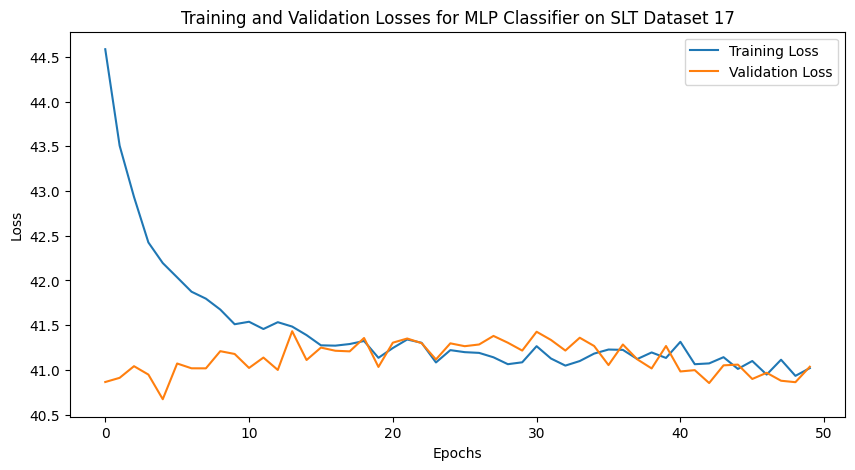

Test Loss: 34.7835, Test Accuracy: 0.6950, AUROC: 0.7186
Training on SLT Dataset 18/33
Epoch 1/50, Training Loss: 44.6259, Validation Loss: 40.9008, Training Accuracy: 0.7174
Epoch 10/50, Training Loss: 41.4507, Validation Loss: 40.7806, Training Accuracy: 0.9375
Epoch 20/50, Training Loss: 41.2176, Validation Loss: 40.8394, Training Accuracy: 0.9521
Epoch 30/50, Training Loss: 41.0797, Validation Loss: 40.9161, Training Accuracy: 0.9618
Epoch 40/50, Training Loss: 41.1185, Validation Loss: 41.1687, Training Accuracy: 0.9576
Epoch 50/50, Training Loss: 41.1011, Validation Loss: 40.9593, Training Accuracy: 0.9625


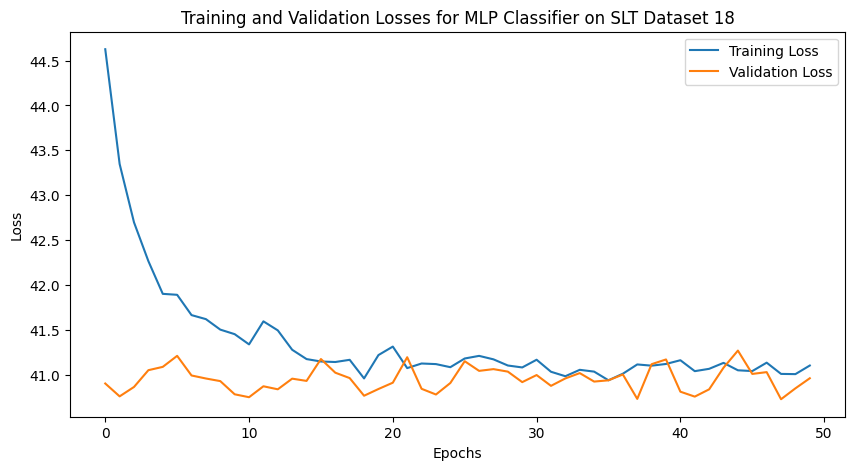

Test Loss: 34.8340, Test Accuracy: 0.7000, AUROC: 0.7306
Training on SLT Dataset 19/33
Epoch 1/50, Training Loss: 44.7708, Validation Loss: 40.8325, Training Accuracy: 0.6889
Epoch 10/50, Training Loss: 41.4325, Validation Loss: 40.6927, Training Accuracy: 0.9410
Epoch 20/50, Training Loss: 41.1410, Validation Loss: 40.9653, Training Accuracy: 0.9618
Epoch 30/50, Training Loss: 41.1722, Validation Loss: 40.7763, Training Accuracy: 0.9590
Epoch 40/50, Training Loss: 40.9642, Validation Loss: 40.5707, Training Accuracy: 0.9708
Epoch 50/50, Training Loss: 40.9663, Validation Loss: 40.7302, Training Accuracy: 0.9688


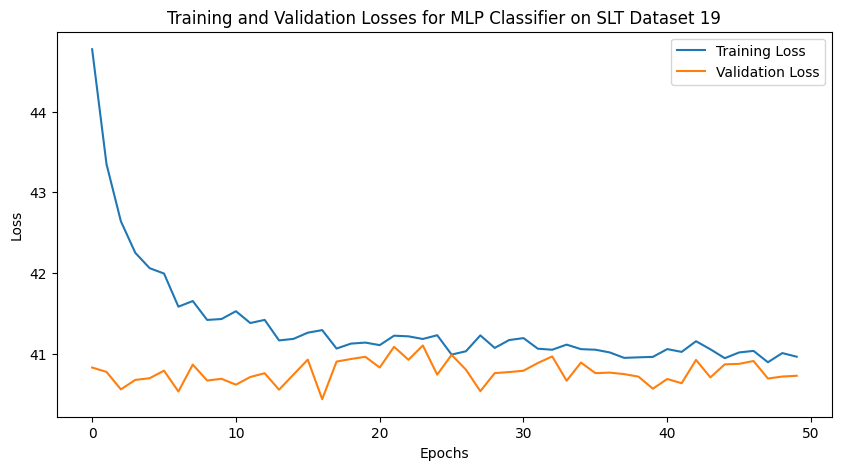

Test Loss: 34.6995, Test Accuracy: 0.7150, AUROC: 0.7439
Training on SLT Dataset 20/33
Epoch 1/50, Training Loss: 44.8705, Validation Loss: 40.9509, Training Accuracy: 0.6882
Epoch 10/50, Training Loss: 41.2607, Validation Loss: 40.8417, Training Accuracy: 0.9500
Epoch 20/50, Training Loss: 41.2093, Validation Loss: 40.7814, Training Accuracy: 0.9618
Epoch 30/50, Training Loss: 40.8730, Validation Loss: 40.7690, Training Accuracy: 0.9785
Epoch 40/50, Training Loss: 41.0893, Validation Loss: 41.1900, Training Accuracy: 0.9681
Epoch 50/50, Training Loss: 41.0517, Validation Loss: 41.0321, Training Accuracy: 0.9681


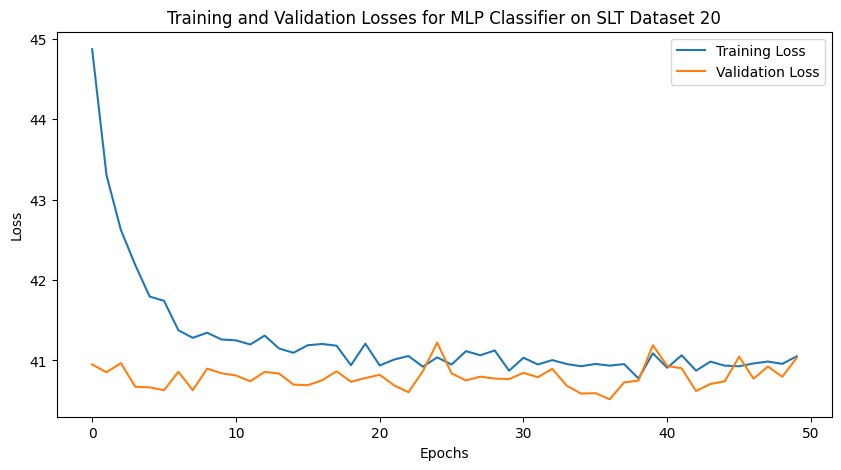

Test Loss: 34.8507, Test Accuracy: 0.7050, AUROC: 0.7558
Training on SLT Dataset 21/33
Epoch 1/50, Training Loss: 45.0290, Validation Loss: 40.8593, Training Accuracy: 0.6549
Epoch 10/50, Training Loss: 41.3956, Validation Loss: 40.8706, Training Accuracy: 0.9500
Epoch 20/50, Training Loss: 41.0485, Validation Loss: 40.9113, Training Accuracy: 0.9639
Epoch 30/50, Training Loss: 41.0506, Validation Loss: 40.7030, Training Accuracy: 0.9667
Epoch 40/50, Training Loss: 40.9842, Validation Loss: 40.9182, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 40.8325, Validation Loss: 40.8504, Training Accuracy: 0.9826


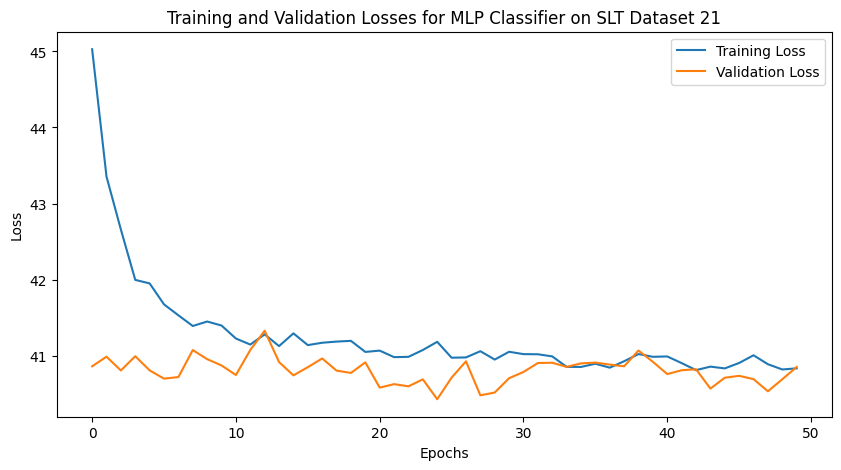

Test Loss: 35.0828, Test Accuracy: 0.6550, AUROC: 0.7403
Training on SLT Dataset 22/33
Epoch 1/50, Training Loss: 45.1306, Validation Loss: 41.0911, Training Accuracy: 0.6708
Epoch 10/50, Training Loss: 41.2901, Validation Loss: 40.8512, Training Accuracy: 0.9542
Epoch 20/50, Training Loss: 41.1761, Validation Loss: 41.2119, Training Accuracy: 0.9576
Epoch 30/50, Training Loss: 40.9059, Validation Loss: 40.9933, Training Accuracy: 0.9778
Epoch 40/50, Training Loss: 40.9798, Validation Loss: 41.0549, Training Accuracy: 0.9750
Epoch 50/50, Training Loss: 40.9223, Validation Loss: 41.1552, Training Accuracy: 0.9750


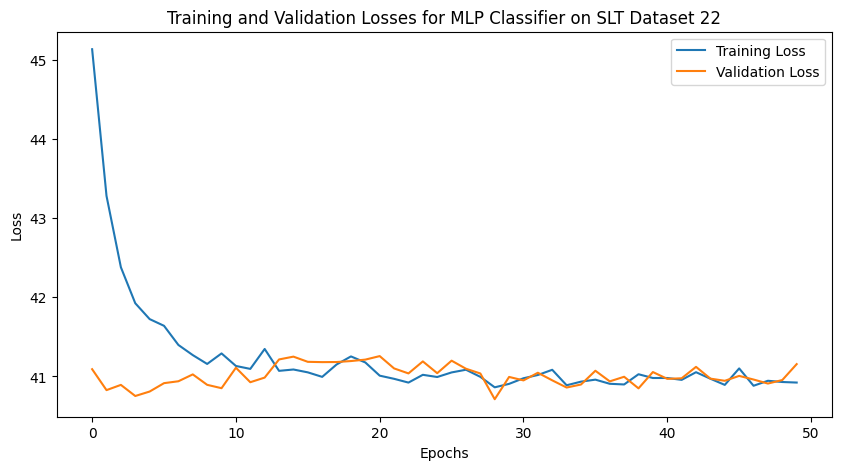

Test Loss: 34.9031, Test Accuracy: 0.6850, AUROC: 0.7275
Training on SLT Dataset 23/33
Epoch 1/50, Training Loss: 44.9444, Validation Loss: 40.8342, Training Accuracy: 0.6771
Epoch 10/50, Training Loss: 41.1448, Validation Loss: 40.8450, Training Accuracy: 0.9583
Epoch 20/50, Training Loss: 41.0096, Validation Loss: 40.7100, Training Accuracy: 0.9674
Epoch 30/50, Training Loss: 40.8466, Validation Loss: 41.0409, Training Accuracy: 0.9785
Epoch 40/50, Training Loss: 40.9806, Validation Loss: 40.8760, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 40.8343, Validation Loss: 40.9405, Training Accuracy: 0.9806


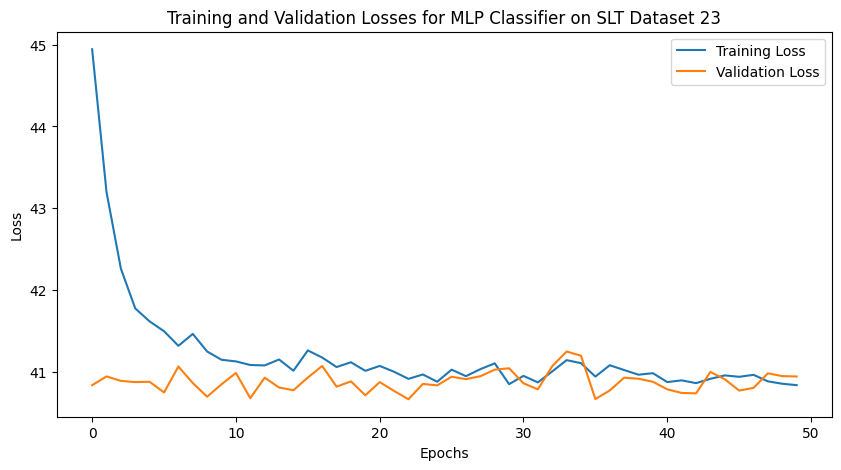

Test Loss: 35.0705, Test Accuracy: 0.6700, AUROC: 0.7232
Training on SLT Dataset 24/33
Epoch 1/50, Training Loss: 44.9815, Validation Loss: 40.9671, Training Accuracy: 0.6743
Epoch 10/50, Training Loss: 41.1102, Validation Loss: 41.3793, Training Accuracy: 0.9646
Epoch 20/50, Training Loss: 41.0758, Validation Loss: 41.1885, Training Accuracy: 0.9639
Epoch 30/50, Training Loss: 40.9714, Validation Loss: 41.0116, Training Accuracy: 0.9708
Epoch 40/50, Training Loss: 40.9706, Validation Loss: 41.2269, Training Accuracy: 0.9757
Epoch 50/50, Training Loss: 40.9620, Validation Loss: 40.9334, Training Accuracy: 0.9688


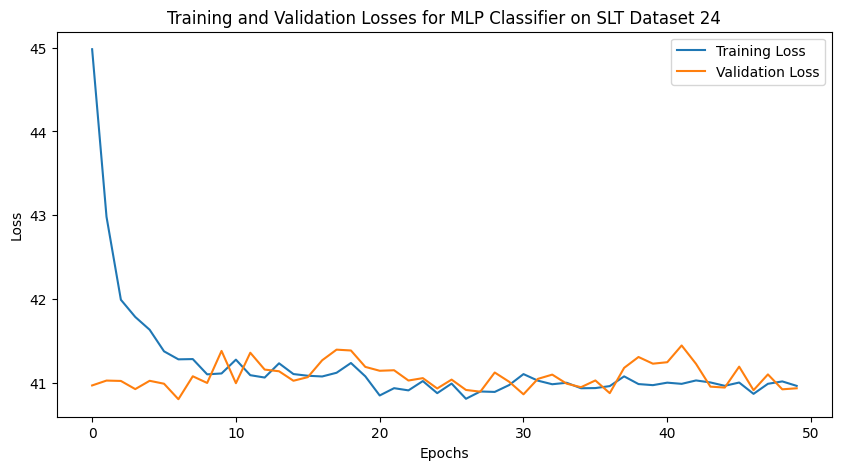

Test Loss: 35.0495, Test Accuracy: 0.6750, AUROC: 0.7152
Training on SLT Dataset 25/33
Epoch 1/50, Training Loss: 45.1007, Validation Loss: 41.1270, Training Accuracy: 0.6632
Epoch 10/50, Training Loss: 41.0601, Validation Loss: 41.2569, Training Accuracy: 0.9660
Epoch 20/50, Training Loss: 41.0040, Validation Loss: 41.3204, Training Accuracy: 0.9701
Epoch 30/50, Training Loss: 41.0175, Validation Loss: 41.4962, Training Accuracy: 0.9694
Epoch 40/50, Training Loss: 40.8816, Validation Loss: 41.3983, Training Accuracy: 0.9771
Epoch 50/50, Training Loss: 40.9018, Validation Loss: 41.2479, Training Accuracy: 0.9771


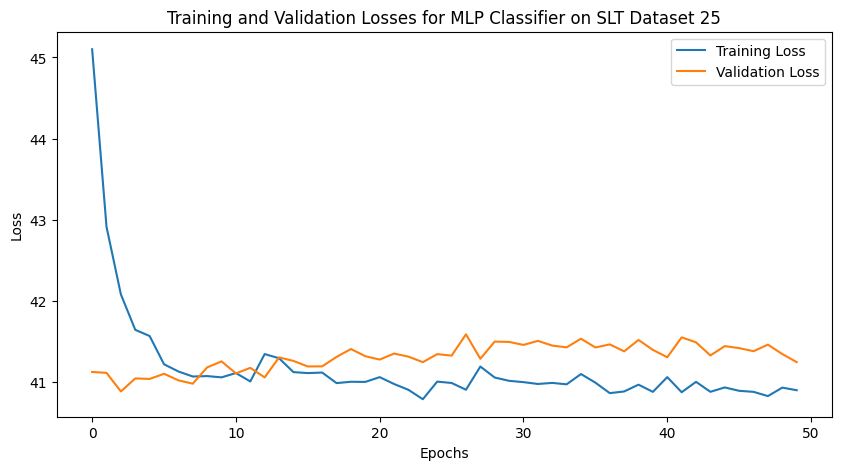

Test Loss: 34.8372, Test Accuracy: 0.6950, AUROC: 0.7488
Training on SLT Dataset 26/33
Epoch 1/50, Training Loss: 44.9123, Validation Loss: 40.7822, Training Accuracy: 0.6694
Epoch 10/50, Training Loss: 40.9672, Validation Loss: 41.1818, Training Accuracy: 0.9708
Epoch 20/50, Training Loss: 41.0809, Validation Loss: 41.0373, Training Accuracy: 0.9625
Epoch 30/50, Training Loss: 40.8933, Validation Loss: 41.2333, Training Accuracy: 0.9764
Epoch 40/50, Training Loss: 40.9564, Validation Loss: 41.2997, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 41.0303, Validation Loss: 41.3971, Training Accuracy: 0.9694


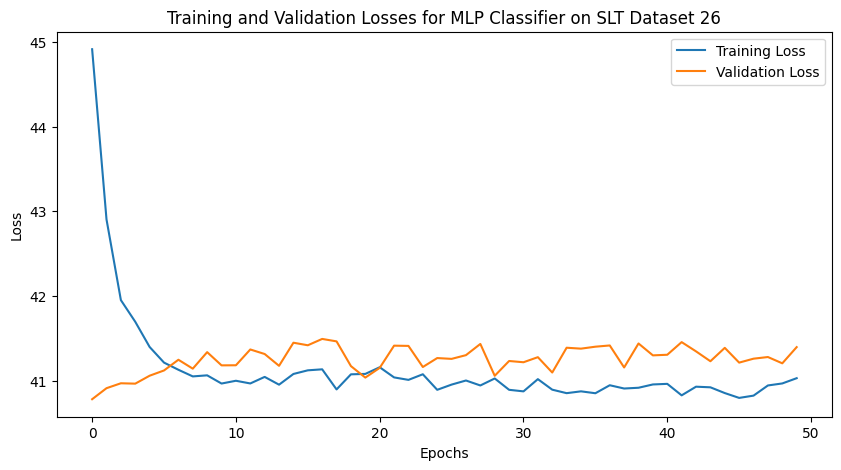

Test Loss: 34.9603, Test Accuracy: 0.7000, AUROC: 0.7351
Training on SLT Dataset 27/33
Epoch 1/50, Training Loss: 44.7863, Validation Loss: 41.1455, Training Accuracy: 0.7132
Epoch 10/50, Training Loss: 41.0128, Validation Loss: 41.4098, Training Accuracy: 0.9688
Epoch 20/50, Training Loss: 41.0988, Validation Loss: 41.3213, Training Accuracy: 0.9632
Epoch 30/50, Training Loss: 40.7737, Validation Loss: 41.5090, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 40.9677, Validation Loss: 41.3671, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 40.8219, Validation Loss: 41.5952, Training Accuracy: 0.9819


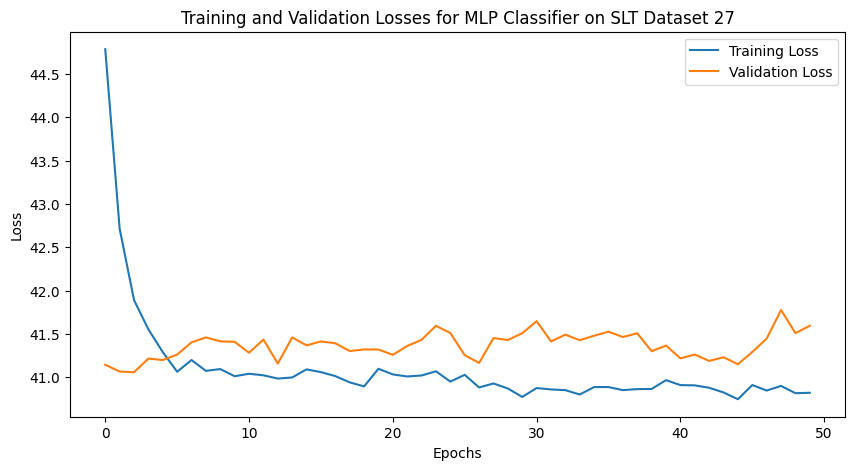

Test Loss: 34.9822, Test Accuracy: 0.6800, AUROC: 0.7401
Training on SLT Dataset 28/33
Epoch 1/50, Training Loss: 44.8808, Validation Loss: 40.8286, Training Accuracy: 0.6806
Epoch 10/50, Training Loss: 41.0706, Validation Loss: 41.4068, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 40.9311, Validation Loss: 41.1524, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 40.9479, Validation Loss: 41.4124, Training Accuracy: 0.9757
Epoch 40/50, Training Loss: 40.9386, Validation Loss: 41.3488, Training Accuracy: 0.9729
Epoch 50/50, Training Loss: 40.9056, Validation Loss: 41.2724, Training Accuracy: 0.9778


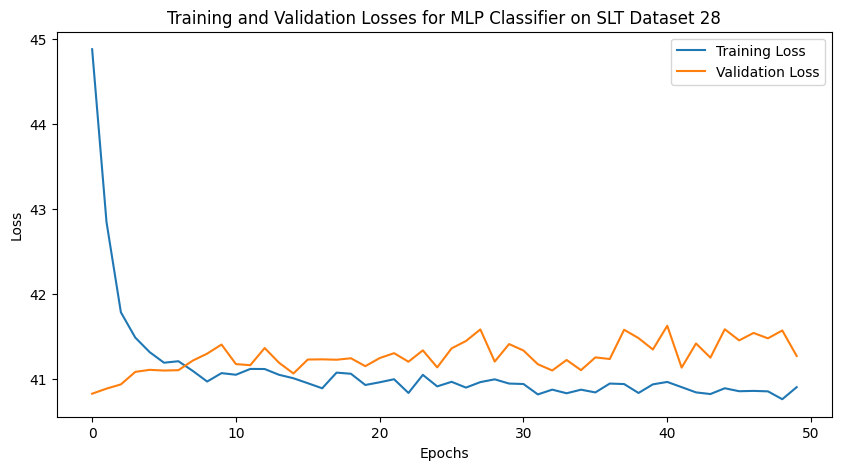

Test Loss: 35.5252, Test Accuracy: 0.6400, AUROC: 0.7015
Training on SLT Dataset 29/33
Epoch 1/50, Training Loss: 44.7498, Validation Loss: 40.9352, Training Accuracy: 0.6958
Epoch 10/50, Training Loss: 40.9157, Validation Loss: 40.8642, Training Accuracy: 0.9778
Epoch 20/50, Training Loss: 41.0434, Validation Loss: 41.0575, Training Accuracy: 0.9681
Epoch 30/50, Training Loss: 40.8993, Validation Loss: 41.0785, Training Accuracy: 0.9757
Epoch 40/50, Training Loss: 40.9179, Validation Loss: 40.8312, Training Accuracy: 0.9729
Epoch 50/50, Training Loss: 40.8137, Validation Loss: 40.9586, Training Accuracy: 0.9833


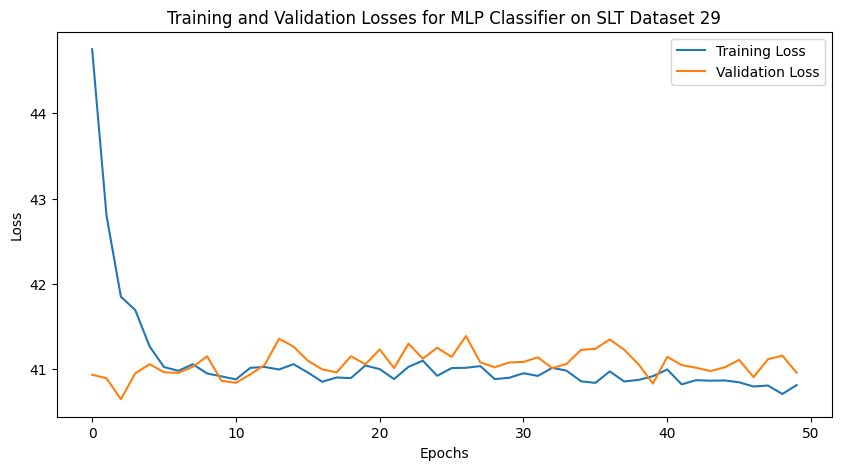

Test Loss: 34.6316, Test Accuracy: 0.7050, AUROC: 0.7702
Training on SLT Dataset 30/33
Epoch 1/50, Training Loss: 44.6880, Validation Loss: 40.6180, Training Accuracy: 0.7000
Epoch 10/50, Training Loss: 41.0257, Validation Loss: 41.0847, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 40.8421, Validation Loss: 40.9041, Training Accuracy: 0.9806
Epoch 30/50, Training Loss: 40.8874, Validation Loss: 41.0429, Training Accuracy: 0.9785
Epoch 40/50, Training Loss: 40.8535, Validation Loss: 41.2028, Training Accuracy: 0.9819
Epoch 50/50, Training Loss: 40.8035, Validation Loss: 41.3598, Training Accuracy: 0.9833


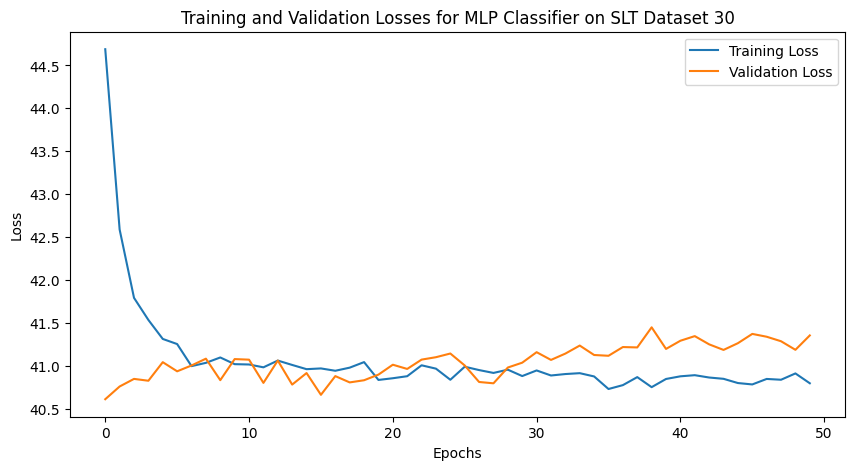

Test Loss: 34.7213, Test Accuracy: 0.7000, AUROC: 0.7656
Training on SLT Dataset 31/33
Epoch 1/50, Training Loss: 44.6574, Validation Loss: 40.5769, Training Accuracy: 0.7000
Epoch 10/50, Training Loss: 41.0847, Validation Loss: 40.9265, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 40.9888, Validation Loss: 41.0513, Training Accuracy: 0.9729
Epoch 30/50, Training Loss: 40.9247, Validation Loss: 41.2176, Training Accuracy: 0.9750
Epoch 40/50, Training Loss: 40.8566, Validation Loss: 41.0784, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 40.8166, Validation Loss: 40.8674, Training Accuracy: 0.9806


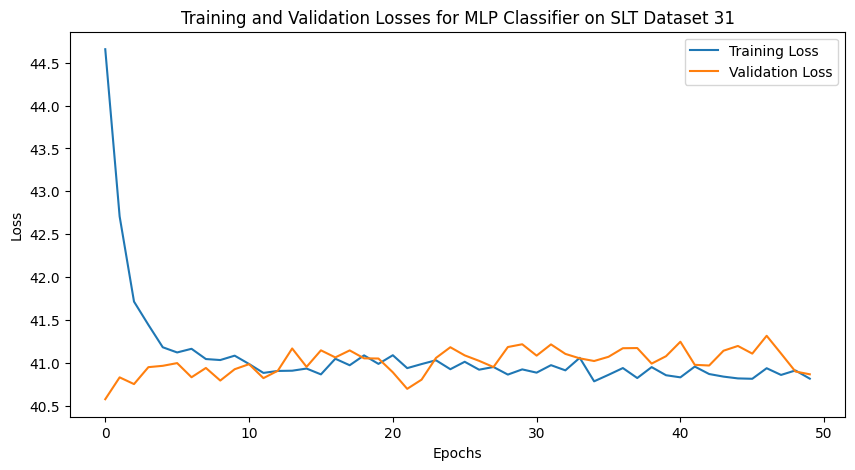

Test Loss: 34.7983, Test Accuracy: 0.7050, AUROC: 0.7358
Training on SLT Dataset 32/33
Epoch 1/50, Training Loss: 44.4095, Validation Loss: 40.4656, Training Accuracy: 0.7194
Epoch 10/50, Training Loss: 41.2067, Validation Loss: 41.0248, Training Accuracy: 0.9563
Epoch 20/50, Training Loss: 41.1430, Validation Loss: 40.8444, Training Accuracy: 0.9590
Epoch 30/50, Training Loss: 40.8301, Validation Loss: 41.0410, Training Accuracy: 0.9785
Epoch 40/50, Training Loss: 40.8818, Validation Loss: 40.8372, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 40.9499, Validation Loss: 40.8099, Training Accuracy: 0.9729


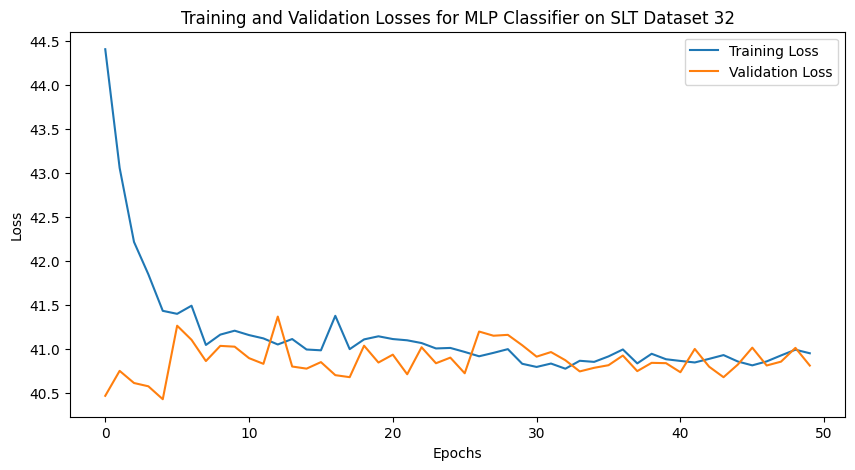

Test Loss: 34.8861, Test Accuracy: 0.7000, AUROC: 0.7332


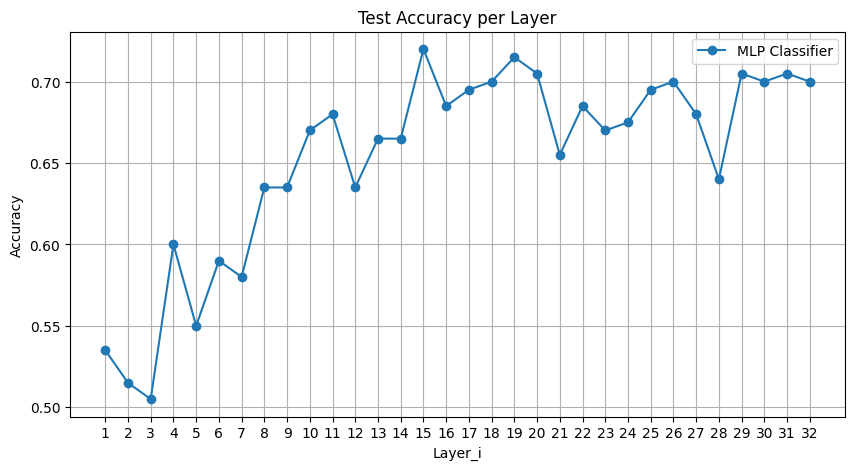

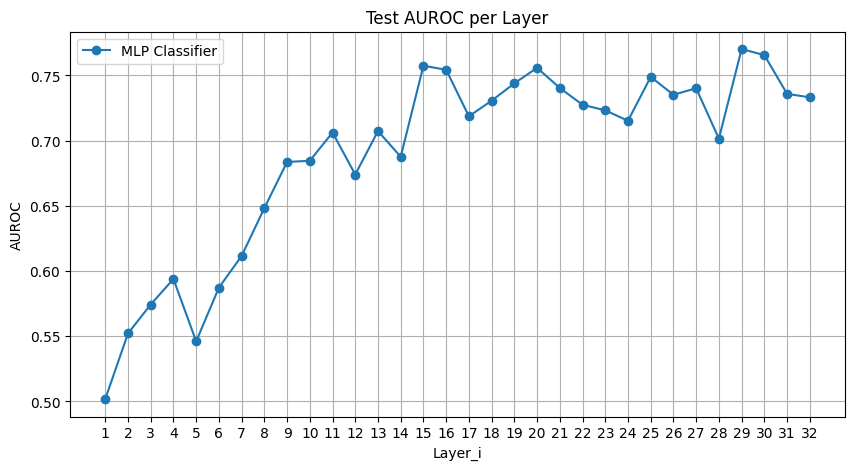

In [69]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
sabmlp_test_accs = []
sabmlp_test_aucs = []
sabmlp_trained_models = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(slt_train_dataloaders, slt_valid_dataloaders, slt_test_dataloaders)):
    print(f"Training on SLT Dataset {i+1}/{len(tbg_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on SLT Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    sabmlp_test_accs.append(test_acc)
    sabmlp_test_aucs.append(test_auc)
    sabmlp_trained_models.append(model)

plot_1d_metrics([sabmlp_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([sabmlp_test_aucs], ['MLP Classifier'], 'AUROC')

In [70]:
# Max AUROC achieved by 'transfer learning' compared to normal training
print(f"SLT: AUROC for MLP trained on Binary SE, tested on Accuracy: {max(sabmlp_test_aucs):.4f}")
print(f"SLT: AUROC for MLP trained on Accuracy, tested on Accuracy: {max(samlp_test_aucs):.4f}")

SLT: AUROC for MLP trained on Binary SE, tested on Accuracy: 0.7702
SLT: AUROC for MLP trained on Accuracy, tested on Accuracy: 0.8224


### Use models trained on D1 dataset for predicting D2

We test models trained with token embeddings and binary SE's from llama-2-7b on trivia qa (D1), on predicting accuracy scores from llama-2-7b on squad (D2) dataset.

In [144]:
os.chdir('/scratch-ssd/ms23jh/uncertainty/wandb/run-20240320_140822-qlf5m8bq/files')  # path for llama2-7b on squad (2k)
# Read training generated embeddings
f = open('validation_generations.pkl', 'rb')
d2_generations = pickle.load(f)
f.close()

# Read uncertainty measures (p-true, predictive/semantic uncertainties)
g = open('uncertainty_measures.pkl', 'rb')
d2_measures = pickle.load(g)
g.close()

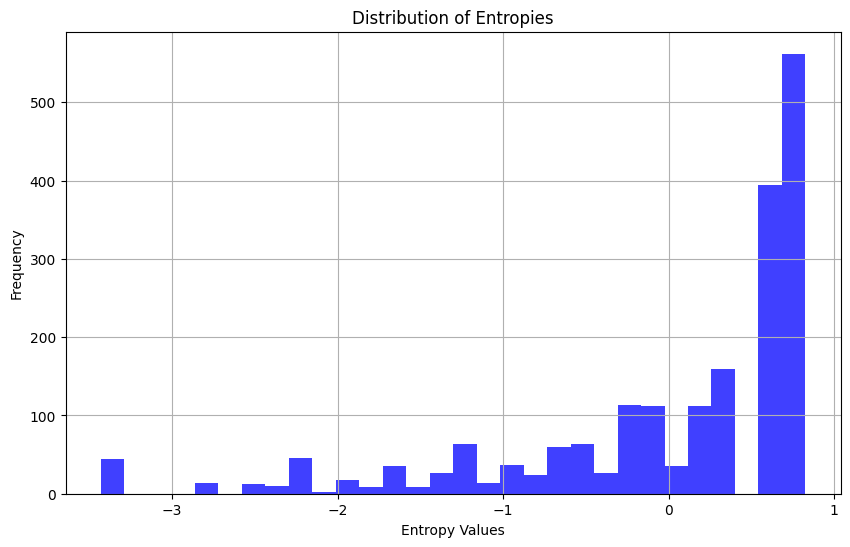

Dummy entropy: 0.6310
Dummy accuracy: 0.8685


In [145]:
# Data extraction and preprocessing.
d2_entropy = torch.tensor(d2_measures['uncertainty_measures']['cluster_assignment_entropy']).to(torch.float32)
d2_tok_bef_gen_dataset = torch.stack([record['most_likely_answer']['emb_last_tok_before_gen'] 
                                   for record in d2_generations.values()]).squeeze(-2).to(torch.float32)
d2_ca_entropy = d2_entropy.to(torch.float32)
mean = d2_ca_entropy.mean()
std = d2_ca_entropy.std()
d2_ca_entropy = (d2_ca_entropy - mean) / std

d2_tok_bef_gen_layered_datasets = d2_tok_bef_gen_dataset.transpose(0, 1)
plot_entropy_distribution(d2_ca_entropy)
d2_bca_entropy = binarize_entropy(d2_ca_entropy, 0.0)
print(f"Dummy entropy: {sum(d2_bca_entropy)/len(d2_bca_entropy):.4f}")

d2_sec_last_tok_dataset = torch.stack([record['most_likely_answer']['emb_tok_before_eos'] 
                                   for record in d2_generations.values()]).squeeze(-2).to(torch.float32)
d2_slt_layered_datasets = d2_sec_last_tok_dataset.transpose(0, 1)[1:]
d2_accuracies = torch.tensor([record['most_likely_answer']['accuracy'] for record in d2_generations.values()])
print(f"Dummy accuracy: {max(torch.mean(d2_accuracies), 1-torch.mean(d2_accuracies)):.4f}")

### Test on Models Pretrained on D1

#### TBG Tokens

In [147]:
# Prepare test sets from D2.
_, _, d2b_tbg_test_dataloaders = create_dataloaders(d2_tok_bef_gen_layered_datasets, d2_bca_entropy, total_size, batch_size, set_seed=True)
d2_r_accuracies = 1 - d2_accuracies
_, _, d2a_tbg_test_dataloaders = create_dataloaders(d2_tok_bef_gen_layered_datasets, d2_r_accuracies, total_size, batch_size, set_seed=True)

_, _, d2b_X_tests, _, _, d2b_y_tests = create_Xs_and_ys(d2_tok_bef_gen_layered_datasets, d2_bca_entropy, total_size)
_, _, d2a_X_tests, _, _, d2a_y_tests = create_Xs_and_ys(d2_tok_bef_gen_layered_datasets, d2_r_accuracies, total_size)

Test Loss: 0.7103, Test Accuracy: 0.4950, AUROC: 0.5919
Test Loss: 0.7083, Test Accuracy: 0.5200, AUROC: 0.5941
Test Loss: 0.6810, Test Accuracy: 0.6000, AUROC: 0.6393
Test Loss: 0.6937, Test Accuracy: 0.6200, AUROC: 0.6676
Test Loss: 0.6905, Test Accuracy: 0.6400, AUROC: 0.6812
Test Loss: 0.7319, Test Accuracy: 0.6500, AUROC: 0.6724
Test Loss: 0.9398, Test Accuracy: 0.5650, AUROC: 0.6166
Test Loss: 0.9567, Test Accuracy: 0.6100, AUROC: 0.6762
Test Loss: 0.9298, Test Accuracy: 0.6100, AUROC: 0.6704
Test Loss: 1.0124, Test Accuracy: 0.6350, AUROC: 0.6996
Test Loss: 1.0448, Test Accuracy: 0.6150, AUROC: 0.6749
Test Loss: 1.1787, Test Accuracy: 0.6500, AUROC: 0.6644
Test Loss: 1.1811, Test Accuracy: 0.6600, AUROC: 0.6886
Test Loss: 1.2697, Test Accuracy: 0.6550, AUROC: 0.6721
Test Loss: 1.3539, Test Accuracy: 0.6550, AUROC: 0.6703
Test Loss: 1.3976, Test Accuracy: 0.6300, AUROC: 0.6675
Test Loss: 1.4352, Test Accuracy: 0.6150, AUROC: 0.6682
Test Loss: 1.4659, Test Accuracy: 0.6450, AUROC:

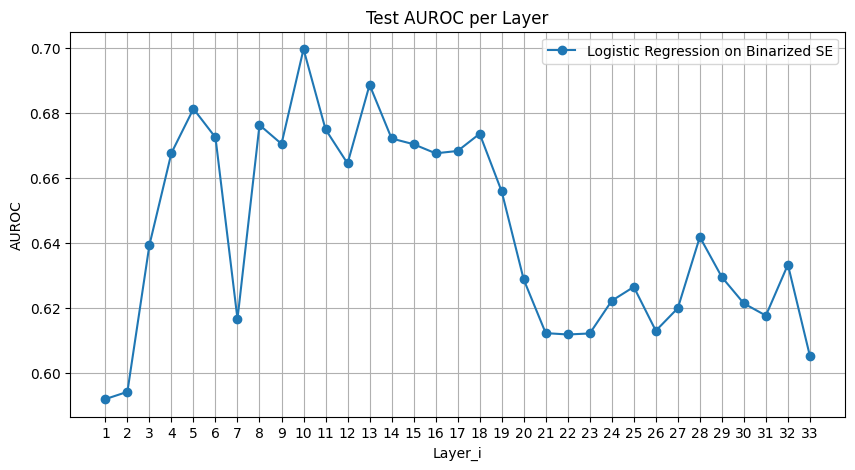

In [149]:
# Test trained LRs from D1 on D2.
# Test on binary SE first.
tlr2b_test_accs = []
tlr2b_test_aucs = []

for i, (X_test, y_test) in enumerate(zip(d2b_X_tests, d2b_y_tests)):
    _, test_acc, test_auc = sklearn_evaluate_on_test(tablr_trained_models[i], X_test, y_test, binary_cls=True)
    tlr2b_test_accs.append(test_acc)
    tlr2b_test_aucs.append(test_auc)

# plot_1d_metrics([tlr2b_test_accs], ['Logistic Regression on Binarized SE'], 'Accuracy')
plot_1d_metrics([tlr2b_test_aucs], ['Logistic Regression on Binarized SE'], 'AUROC')

Test Loss: 0.7841, Test Accuracy: 0.3350, AUROC: 0.5560
Test Loss: 0.7983, Test Accuracy: 0.4000, AUROC: 0.5429
Test Loss: 0.7624, Test Accuracy: 0.5200, AUROC: 0.5776
Test Loss: 0.8349, Test Accuracy: 0.4800, AUROC: 0.6183
Test Loss: 0.8764, Test Accuracy: 0.4900, AUROC: 0.6066
Test Loss: 0.9133, Test Accuracy: 0.5300, AUROC: 0.6144
Test Loss: 1.1602, Test Accuracy: 0.4750, AUROC: 0.5950
Test Loss: 1.3146, Test Accuracy: 0.4900, AUROC: 0.5961
Test Loss: 1.2299, Test Accuracy: 0.5300, AUROC: 0.5911
Test Loss: 1.3834, Test Accuracy: 0.5450, AUROC: 0.6427
Test Loss: 1.2554, Test Accuracy: 0.5750, AUROC: 0.5895
Test Loss: 1.2400, Test Accuracy: 0.6300, AUROC: 0.5861
Test Loss: 1.1484, Test Accuracy: 0.6500, AUROC: 0.5829
Test Loss: 1.4180, Test Accuracy: 0.5950, AUROC: 0.5753
Test Loss: 1.0533, Test Accuracy: 0.7050, AUROC: 0.6110
Test Loss: 0.8738, Test Accuracy: 0.7400, AUROC: 0.6923
Test Loss: 0.9637, Test Accuracy: 0.7450, AUROC: 0.6375
Test Loss: 0.9504, Test Accuracy: 0.7550, AUROC:

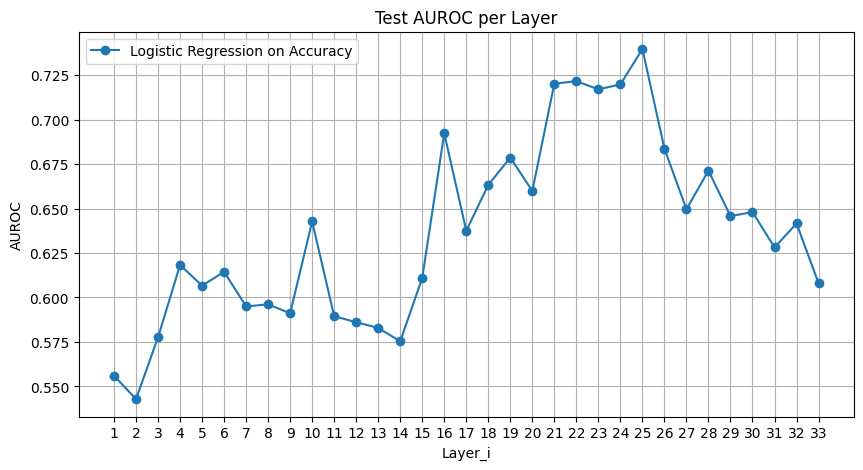

In [151]:
# Then test on accuracy scores
tlr2a_test_accs = []
tlr2a_test_aucs = []

for i, (X_test, y_test) in enumerate(zip(d2a_X_tests, d2a_y_tests)):
    _, test_acc, test_auc = sklearn_evaluate_on_test(tablr_trained_models[i], X_test, y_test, binary_cls=True)
    tlr2a_test_accs.append(test_acc)
    tlr2a_test_aucs.append(test_auc)

# plot_1d_metrics([tlr2a_test_accs], ['Logistic Regression on Accuracy'], 'Accuracy')
plot_1d_metrics([tlr2a_test_aucs], ['Logistic Regression on Accuracy'], 'AUROC')

Test Loss: 58.1700, Test Accuracy: 0.5450, AUROC: 0.5477
Test Loss: 56.5490, Test Accuracy: 0.6400, AUROC: 0.6939
Test Loss: 56.9419, Test Accuracy: 0.6250, AUROC: 0.6248
Test Loss: 57.1643, Test Accuracy: 0.6050, AUROC: 0.6396
Test Loss: 57.4398, Test Accuracy: 0.5800, AUROC: 0.6172
Test Loss: 56.9289, Test Accuracy: 0.6050, AUROC: 0.6382
Test Loss: 57.4869, Test Accuracy: 0.6000, AUROC: 0.6222
Test Loss: 56.8438, Test Accuracy: 0.6250, AUROC: 0.6807
Test Loss: 56.3257, Test Accuracy: 0.6800, AUROC: 0.7004
Test Loss: 57.0460, Test Accuracy: 0.6350, AUROC: 0.6776
Test Loss: 56.3338, Test Accuracy: 0.6700, AUROC: 0.7121
Test Loss: 56.7161, Test Accuracy: 0.6350, AUROC: 0.6944
Test Loss: 56.4507, Test Accuracy: 0.6600, AUROC: 0.6872
Test Loss: 56.7823, Test Accuracy: 0.6450, AUROC: 0.6707
Test Loss: 56.5664, Test Accuracy: 0.6450, AUROC: 0.6885
Test Loss: 56.1019, Test Accuracy: 0.6850, AUROC: 0.7369
Test Loss: 56.5487, Test Accuracy: 0.6400, AUROC: 0.6908
Test Loss: 56.7038, Test Accura

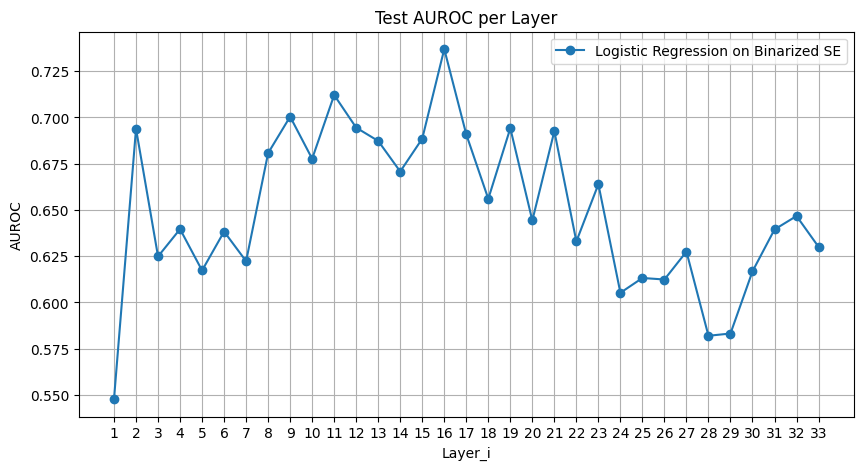

In [153]:
# Test D1-pretrained MLP on binarized SE's from D2 
tmlp2b_test_accs = []
tmlp2b_test_aucs = []

for i, test_loader in enumerate(d2b_tbg_test_dataloaders):
    test_loss, test_acc, test_auc = evaluate_on_test(tabmlp_trained_models[i], test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    tmlp2b_test_accs.append(test_acc)
    tmlp2b_test_aucs.append(test_auc)

plot_1d_metrics([tmlp2b_test_aucs], ['Logistic Regression on Binarized SE'], 'AUROC')

Test Loss: 80.7681, Test Accuracy: 0.5450, AUROC: 0.5869
Test Loss: 80.2436, Test Accuracy: 0.5900, AUROC: 0.6438
Test Loss: 80.2131, Test Accuracy: 0.5950, AUROC: 0.6249
Test Loss: 80.7336, Test Accuracy: 0.5450, AUROC: 0.6303
Test Loss: 80.1394, Test Accuracy: 0.5800, AUROC: 0.6623
Test Loss: 80.0080, Test Accuracy: 0.6250, AUROC: 0.6607
Test Loss: 80.9286, Test Accuracy: 0.5200, AUROC: 0.6256
Test Loss: 80.4506, Test Accuracy: 0.5950, AUROC: 0.6379
Test Loss: 79.8831, Test Accuracy: 0.7100, AUROC: 0.6593
Test Loss: 80.2188, Test Accuracy: 0.6950, AUROC: 0.6460
Test Loss: 79.7416, Test Accuracy: 0.7400, AUROC: 0.6682
Test Loss: 79.5456, Test Accuracy: 0.7550, AUROC: 0.7166
Test Loss: 79.2741, Test Accuracy: 0.7800, AUROC: 0.7308
Test Loss: 79.3318, Test Accuracy: 0.7550, AUROC: 0.7775
Test Loss: 78.8950, Test Accuracy: 0.8050, AUROC: 0.7815
Test Loss: 78.5749, Test Accuracy: 0.8450, AUROC: 0.8187
Test Loss: 79.1018, Test Accuracy: 0.8100, AUROC: 0.6932
Test Loss: 79.0746, Test Accura

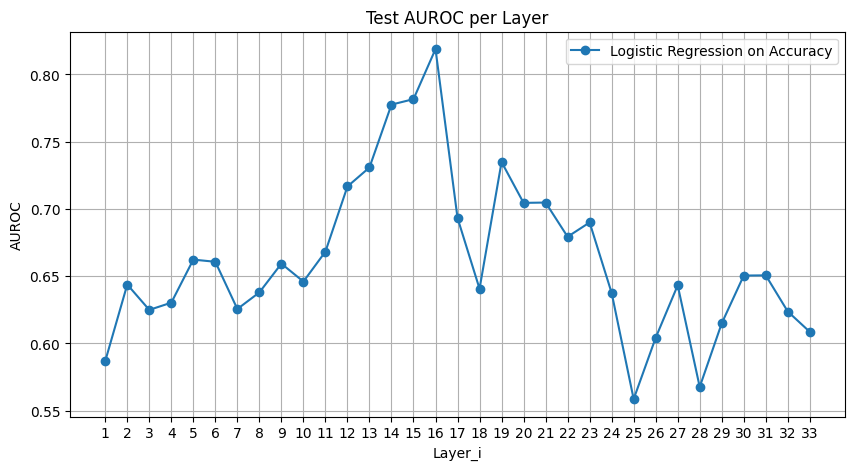

In [154]:
# Test D1-pretrained MLP on Accuracy scores from D2 
tmlp2a_test_accs = []
tmlp2a_test_aucs = []

for i, test_loader in enumerate(d2a_tbg_test_dataloaders):
    test_loss, test_acc, test_auc = evaluate_on_test(tabmlp_trained_models[i], test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    tmlp2a_test_accs.append(test_acc)
    tmlp2a_test_aucs.append(test_auc)

plot_1d_metrics([tmlp2a_test_aucs], ['Logistic Regression on Accuracy'], 'AUROC')

#### SLT Tokens

In [155]:
# Prepare test sets from D2.
_, _, d2b_slt_test_dataloaders = create_dataloaders(d2_slt_layered_datasets, d2_bca_entropy, total_size, batch_size, set_seed=True)
_, _, d2a_slt_test_dataloaders = create_dataloaders(d2_slt_layered_datasets, d2_r_accuracies, total_size, batch_size, set_seed=True)

_, _, d2b_X_tests, _, _, d2b_y_tests = create_Xs_and_ys(d2_slt_layered_datasets, d2_bca_entropy, total_size)
_, _, d2a_X_tests, _, _, d2a_y_tests = create_Xs_and_ys(d2_slt_layered_datasets, d2_r_accuracies, total_size)

Test Loss: 0.7457, Test Accuracy: 0.4050, AUROC: 0.4880
Test Loss: 0.7521, Test Accuracy: 0.4050, AUROC: 0.5118
Test Loss: 0.7701, Test Accuracy: 0.4150, AUROC: 0.5486
Test Loss: 0.7493, Test Accuracy: 0.4550, AUROC: 0.5575
Test Loss: 0.9700, Test Accuracy: 0.4150, AUROC: 0.5420
Test Loss: 1.1302, Test Accuracy: 0.4050, AUROC: 0.5374
Test Loss: 0.9273, Test Accuracy: 0.4650, AUROC: 0.5752
Test Loss: 0.7751, Test Accuracy: 0.5900, AUROC: 0.6127
Test Loss: 1.0232, Test Accuracy: 0.4850, AUROC: 0.6196
Test Loss: 1.2095, Test Accuracy: 0.5100, AUROC: 0.6295
Test Loss: 1.5766, Test Accuracy: 0.4650, AUROC: 0.5834
Test Loss: 1.0803, Test Accuracy: 0.5750, AUROC: 0.6172
Test Loss: 1.5326, Test Accuracy: 0.5100, AUROC: 0.5872
Test Loss: 1.2128, Test Accuracy: 0.5900, AUROC: 0.5978
Test Loss: 1.3055, Test Accuracy: 0.6050, AUROC: 0.6397
Test Loss: 1.2428, Test Accuracy: 0.5850, AUROC: 0.6430
Test Loss: 1.0677, Test Accuracy: 0.6500, AUROC: 0.6918
Test Loss: 1.5453, Test Accuracy: 0.6700, AUROC:

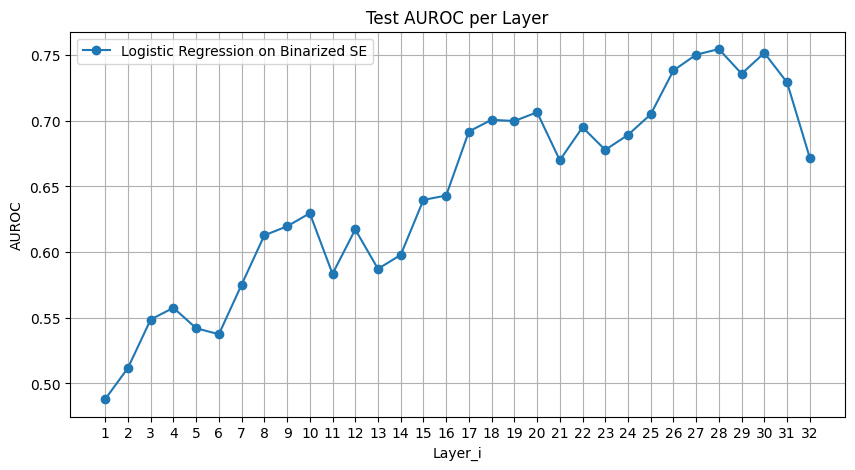

In [156]:
# Test trained LRs from D1 on D2.
# Test on binary SE first.
slr2b_test_accs = []
slr2b_test_aucs = []

for i, (X_test, y_test) in enumerate(zip(d2b_X_tests, d2b_y_tests)):
    _, test_acc, test_auc = sklearn_evaluate_on_test(sablr_trained_models[i], X_test, y_test, binary_cls=True)
    slr2b_test_accs.append(test_acc)
    slr2b_test_aucs.append(test_auc)

# plot_1d_metrics([tlr2b_test_accs], ['Logistic Regression on Binarized SE'], 'Accuracy')
plot_1d_metrics([slr2b_test_aucs], ['Logistic Regression on Binarized SE'], 'AUROC')

Test Loss: 0.8488, Test Accuracy: 0.1250, AUROC: 0.4937
Test Loss: 0.8667, Test Accuracy: 0.1250, AUROC: 0.5035
Test Loss: 0.9216, Test Accuracy: 0.1350, AUROC: 0.5374
Test Loss: 0.8752, Test Accuracy: 0.2050, AUROC: 0.5671
Test Loss: 1.3061, Test Accuracy: 0.1350, AUROC: 0.6181
Test Loss: 1.5669, Test Accuracy: 0.1350, AUROC: 0.6128
Test Loss: 1.1979, Test Accuracy: 0.2550, AUROC: 0.6567
Test Loss: 0.8525, Test Accuracy: 0.5000, AUROC: 0.6718
Test Loss: 1.4058, Test Accuracy: 0.3050, AUROC: 0.6473
Test Loss: 1.7506, Test Accuracy: 0.3300, AUROC: 0.6615
Test Loss: 2.3158, Test Accuracy: 0.2350, AUROC: 0.5774
Test Loss: 1.4440, Test Accuracy: 0.4450, AUROC: 0.5481
Test Loss: 2.2088, Test Accuracy: 0.3400, AUROC: 0.5433
Test Loss: 1.2801, Test Accuracy: 0.5200, AUROC: 0.5390
Test Loss: 1.1706, Test Accuracy: 0.6450, AUROC: 0.5822
Test Loss: 1.7837, Test Accuracy: 0.5150, AUROC: 0.5579
Test Loss: 1.3139, Test Accuracy: 0.5900, AUROC: 0.6117
Test Loss: 0.7565, Test Accuracy: 0.7700, AUROC:

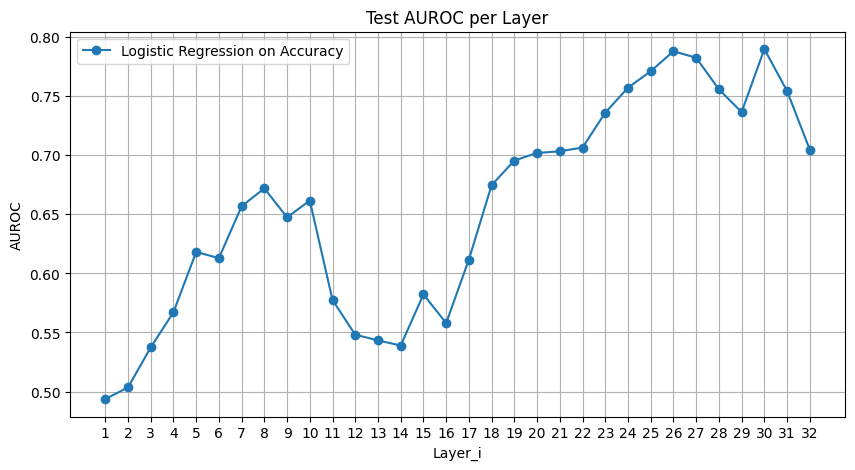

In [157]:
# Then test on accuracy scores
slr2a_test_accs = []
slr2a_test_aucs = []

for i, (X_test, y_test) in enumerate(zip(d2a_X_tests, d2a_y_tests)):
    _, test_acc, test_auc = sklearn_evaluate_on_test(sablr_trained_models[i], X_test, y_test, binary_cls=True)
    slr2a_test_accs.append(test_acc)
    slr2a_test_aucs.append(test_auc)

# plot_1d_metrics([tlr2a_test_accs], ['Logistic Regression on Accuracy'], 'Accuracy')
plot_1d_metrics([slr2a_test_aucs], ['Logistic Regression on Accuracy'], 'AUROC')

Test Loss: 57.4523, Test Accuracy: 0.5200, AUROC: 0.5868
Test Loss: 58.2039, Test Accuracy: 0.4650, AUROC: 0.5196
Test Loss: 57.5697, Test Accuracy: 0.5500, AUROC: 0.4750
Test Loss: 57.7188, Test Accuracy: 0.5600, AUROC: 0.5483
Test Loss: 57.8278, Test Accuracy: 0.5750, AUROC: 0.5752
Test Loss: 57.6557, Test Accuracy: 0.4900, AUROC: 0.5807
Test Loss: 57.3467, Test Accuracy: 0.6050, AUROC: 0.6361
Test Loss: 56.8067, Test Accuracy: 0.6200, AUROC: 0.6078
Test Loss: 57.1323, Test Accuracy: 0.6100, AUROC: 0.6791
Test Loss: 55.8607, Test Accuracy: 0.6950, AUROC: 0.7147
Test Loss: 57.2105, Test Accuracy: 0.6000, AUROC: 0.6678
Test Loss: 56.2518, Test Accuracy: 0.6500, AUROC: 0.7470
Test Loss: 56.4464, Test Accuracy: 0.6750, AUROC: 0.6844
Test Loss: 56.4989, Test Accuracy: 0.6300, AUROC: 0.7275
Test Loss: 56.1495, Test Accuracy: 0.6800, AUROC: 0.7420
Test Loss: 56.3740, Test Accuracy: 0.6400, AUROC: 0.7996
Test Loss: 56.2197, Test Accuracy: 0.6550, AUROC: 0.7728
Test Loss: 56.1084, Test Accura

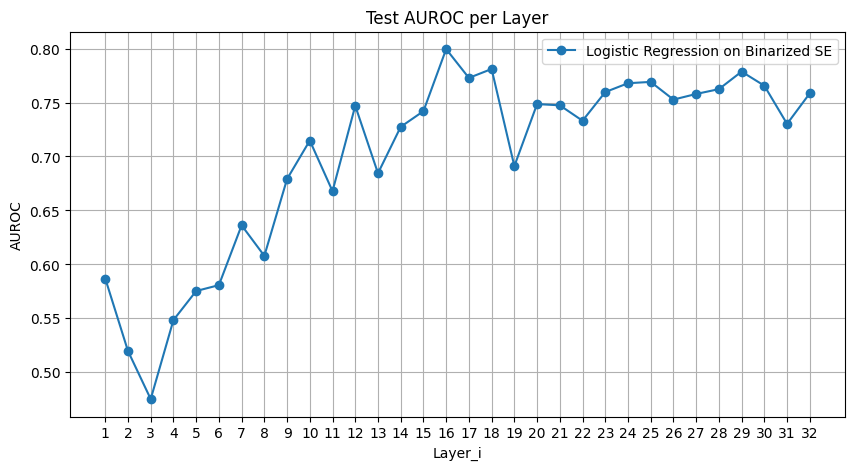

In [158]:
# Test D1-pretrained MLP on binarized SE's from D2 
smlp2b_test_accs = []
smlp2b_test_aucs = []

for i, test_loader in enumerate(d2b_slt_test_dataloaders):
    test_loss, test_acc, test_auc = evaluate_on_test(sabmlp_trained_models[i], test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    smlp2b_test_accs.append(test_acc)
    smlp2b_test_aucs.append(test_auc)

plot_1d_metrics([smlp2b_test_aucs], ['Logistic Regression on Binarized SE'], 'AUROC')

Test Loss: 80.6177, Test Accuracy: 0.3400, AUROC: 0.5336
Test Loss: 81.0133, Test Accuracy: 0.3350, AUROC: 0.5513
Test Loss: 79.7453, Test Accuracy: 0.7600, AUROC: 0.5007
Test Loss: 80.0783, Test Accuracy: 0.7100, AUROC: 0.5525
Test Loss: 80.7222, Test Accuracy: 0.5850, AUROC: 0.6154
Test Loss: 80.8976, Test Accuracy: 0.3000, AUROC: 0.5773
Test Loss: 81.0568, Test Accuracy: 0.5650, AUROC: 0.5746
Test Loss: 79.7220, Test Accuracy: 0.7600, AUROC: 0.5980
Test Loss: 81.3812, Test Accuracy: 0.4700, AUROC: 0.5754
Test Loss: 79.3323, Test Accuracy: 0.7650, AUROC: 0.6962
Test Loss: 80.9153, Test Accuracy: 0.5500, AUROC: 0.6429
Test Loss: 79.2330, Test Accuracy: 0.7800, AUROC: 0.6974
Test Loss: 79.5736, Test Accuracy: 0.7450, AUROC: 0.7194
Test Loss: 79.1011, Test Accuracy: 0.8100, AUROC: 0.6942
Test Loss: 79.3272, Test Accuracy: 0.7900, AUROC: 0.7341
Test Loss: 78.7629, Test Accuracy: 0.8400, AUROC: 0.7888
Test Loss: 78.9850, Test Accuracy: 0.8150, AUROC: 0.7883
Test Loss: 79.1149, Test Accura

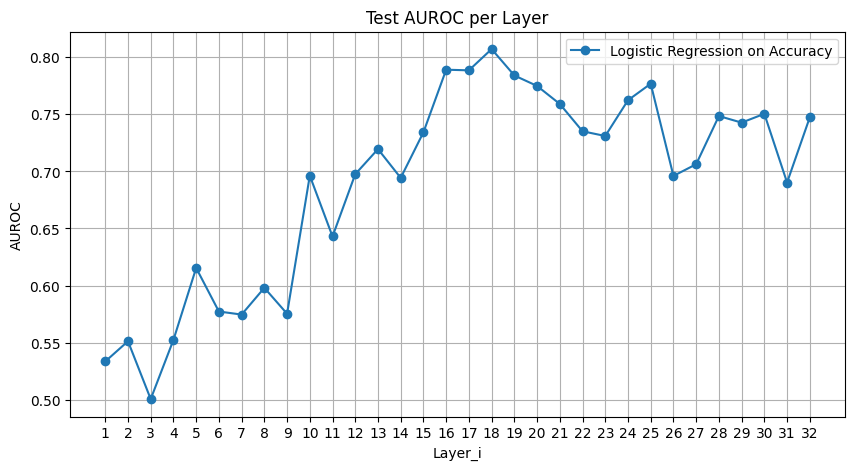

In [159]:
# Test D1-pretrained MLP on Accuracy scores from D2 
smlp2a_test_accs = []
smlp2a_test_aucs = []

for i, test_loader in enumerate(d2a_slt_test_dataloaders):
    test_loss, test_acc, test_auc = evaluate_on_test(sabmlp_trained_models[i], test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    smlp2a_test_accs.append(test_acc)
    smlp2a_test_aucs.append(test_auc)

plot_1d_metrics([smlp2a_test_aucs], ['Logistic Regression on Accuracy'], 'AUROC')

### Train Accuracy Classifiers from Scratch on D2

#### TBG Tokens

In [169]:
# Prepare all data sets from D2.
d2a_tbg_train_dataloaders, d2a_tbg_valid_dataloaders, d2a_tbg_test_dataloaders = create_dataloaders(d2_tok_bef_gen_layered_datasets, d2_r_accuracies, total_size, batch_size, set_seed=True)

d2a_X_trains, d2a_X_vals, d2a_X_tests, d2a_y_trains, d2a_y_vals, d2a_y_tests = create_Xs_and_ys(d2_tok_bef_gen_layered_datasets, d2_r_accuracies, total_size)

Training on D2 TBG Dataset 1/33
Validation Accuracy: 0.8639, AUROC: 0.5202
Training Loss: 0.3385, Validation Loss: 0.4022
Test Loss: 0.3810, Test Accuracy: 0.8750, AUROC: 0.5214
Training on D2 TBG Dataset 2/33
Validation Accuracy: 0.8611, AUROC: 0.5407
Training Loss: 0.3116, Validation Loss: 0.4043
Test Loss: 0.3864, Test Accuracy: 0.8750, AUROC: 0.5205
Training on D2 TBG Dataset 3/33
Validation Accuracy: 0.8583, AUROC: 0.5462
Training Loss: 0.2586, Validation Loss: 0.4175
Test Loss: 0.3979, Test Accuracy: 0.8650, AUROC: 0.5493
Training on D2 TBG Dataset 4/33
Validation Accuracy: 0.8528, AUROC: 0.5588
Training Loss: 0.2182, Validation Loss: 0.4322
Test Loss: 0.3980, Test Accuracy: 0.8650, AUROC: 0.5973
Training on D2 TBG Dataset 5/33
Validation Accuracy: 0.8528, AUROC: 0.5351
Training Loss: 0.1919, Validation Loss: 0.4663
Test Loss: 0.4235, Test Accuracy: 0.8600, AUROC: 0.5824
Training on D2 TBG Dataset 6/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8472, AUROC: 0.5216
Training Loss: 0.1636, Validation Loss: 0.5080
Test Loss: 0.4402, Test Accuracy: 0.8600, AUROC: 0.6014
Training on D2 TBG Dataset 7/33
Validation Accuracy: 0.8417, AUROC: 0.5697
Training Loss: 0.1288, Validation Loss: 0.5164
Test Loss: 0.4670, Test Accuracy: 0.8500, AUROC: 0.5831
Training on D2 TBG Dataset 8/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8417, AUROC: 0.5514
Training Loss: 0.0921, Validation Loss: 0.5677
Test Loss: 0.4927, Test Accuracy: 0.8350, AUROC: 0.6071
Training on D2 TBG Dataset 9/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8472, AUROC: 0.5732
Training Loss: 0.0774, Validation Loss: 0.5781
Test Loss: 0.5198, Test Accuracy: 0.8350, AUROC: 0.6226
Training on D2 TBG Dataset 10/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8333, AUROC: 0.5781
Training Loss: 0.0598, Validation Loss: 0.6085
Test Loss: 0.5027, Test Accuracy: 0.8600, AUROC: 0.6306
Training on D2 TBG Dataset 11/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8111, AUROC: 0.6033
Training Loss: 0.0401, Validation Loss: 0.6113
Test Loss: 0.5182, Test Accuracy: 0.8400, AUROC: 0.6512
Training on D2 TBG Dataset 12/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8250, AUROC: 0.6065
Training Loss: 0.0313, Validation Loss: 0.6433
Test Loss: 0.4974, Test Accuracy: 0.8450, AUROC: 0.6969
Training on D2 TBG Dataset 13/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8361, AUROC: 0.6558
Training Loss: 0.0268, Validation Loss: 0.6020
Test Loss: 0.5390, Test Accuracy: 0.8550, AUROC: 0.6560
Training on D2 TBG Dataset 14/33
Validation Accuracy: 0.8333, AUROC: 0.6831
Training Loss: 0.0225, Validation Loss: 0.5764
Test Loss: 0.5129, Test Accuracy: 0.8350, AUROC: 0.7202
Training on D2 TBG Dataset 15/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8361, AUROC: 0.6547
Training Loss: 0.0198, Validation Loss: 0.6502
Test Loss: 0.5388, Test Accuracy: 0.8500, AUROC: 0.6962
Training on D2 TBG Dataset 16/33


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8333, AUROC: 0.6277
Training Loss: 0.0151, Validation Loss: 0.7034
Test Loss: 0.5829, Test Accuracy: 0.8350, AUROC: 0.6727
Training on D2 TBG Dataset 17/33
Validation Accuracy: 0.8083, AUROC: 0.6573
Training Loss: 0.0134, Validation Loss: 0.7167
Test Loss: 0.6395, Test Accuracy: 0.8300, AUROC: 0.6551
Training on D2 TBG Dataset 18/33
Validation Accuracy: 0.8056, AUROC: 0.6323
Training Loss: 0.0096, Validation Loss: 0.8585
Test Loss: 0.6736, Test Accuracy: 0.8450, AUROC: 0.6560
Training on D2 TBG Dataset 19/33
Validation Accuracy: 0.8278, AUROC: 0.6002
Training Loss: 0.0082, Validation Loss: 0.9180
Test Loss: 0.7033, Test Accuracy: 0.8200, AUROC: 0.6747
Training on D2 TBG Dataset 20/33
Validation Accuracy: 0.8306, AUROC: 0.6101
Training Loss: 0.0070, Validation Loss: 0.9116
Test Loss: 0.7256, Test Accuracy: 0.8300, AUROC: 0.6757
Training on D2 TBG Dataset 21/33
Validation Accuracy: 0.8194, AUROC: 0.6052
Training Loss: 0.0059, Validation Loss: 0.9497
Test Loss: 0.67

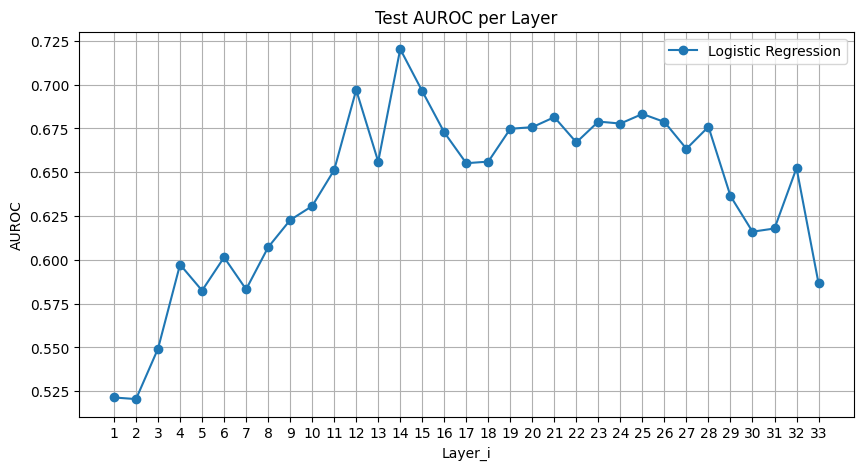

In [171]:
# Training Loops (LR)
tlra_test_accs = []
tlra_test_aucs = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(d2a_X_trains, d2a_X_vals, d2a_X_tests, d2a_y_trains, d2a_y_vals, d2a_y_tests)):
    print(f"Training on D2 TBG Dataset {i+1}/{len(X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on D2 TBG Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    tlra_test_accs.append(test_acc)
    tlra_test_aucs.append(test_auc)

# plot_1d_metrics([tlra_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([tlra_test_aucs], ['Logistic Regression'], 'AUROC')

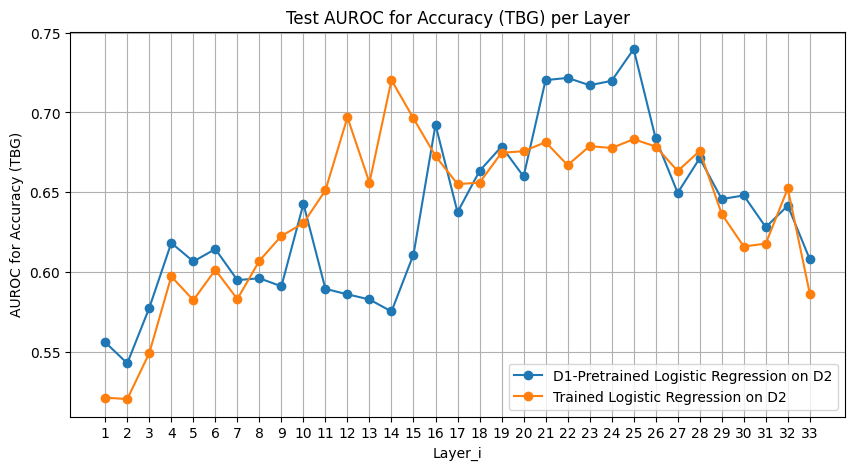

In [184]:
# Comparison with using pretrained model on D1 for prediction on D2
plot_1d_metrics([tlr2a_test_aucs, tlra_test_aucs], ['D1-Pretrained Logistic Regression on D2', 'Trained Logistic Regression on D2'], 'AUROC for Accuracy (TBG)')

Using device: cuda
Training on D2 SLT Dataset 1/33
Epoch 1/50, Training Loss: 96.2304, Validation Loss: 94.4301, Training Accuracy: 0.7146
Epoch 10/50, Training Loss: 95.0924, Validation Loss: 94.6666, Training Accuracy: 0.9021
Epoch 20/50, Training Loss: 95.0331, Validation Loss: 94.7289, Training Accuracy: 0.9028
Epoch 30/50, Training Loss: 95.0336, Validation Loss: 94.6873, Training Accuracy: 0.9069
Epoch 40/50, Training Loss: 95.0298, Validation Loss: 94.7252, Training Accuracy: 0.9090
Epoch 50/50, Training Loss: 95.0272, Validation Loss: 94.7410, Training Accuracy: 0.9049


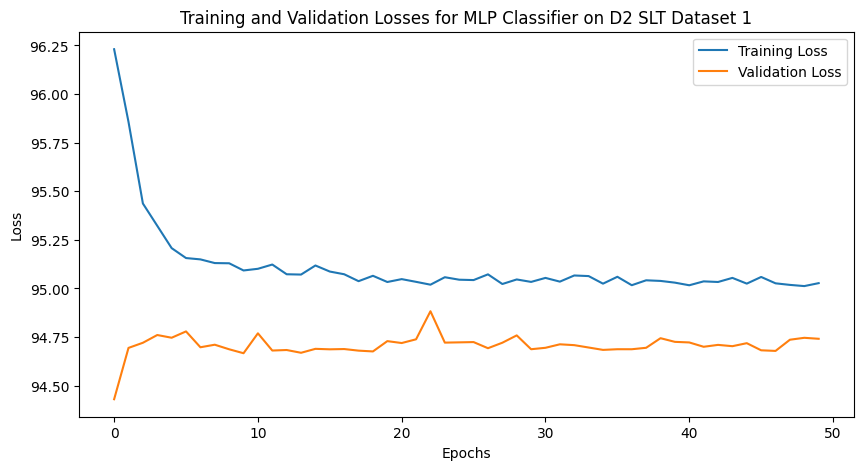

Test Loss: 79.3712, Test Accuracy: 0.7900, AUROC: 0.5080
Training on D2 SLT Dataset 2/33
Epoch 1/50, Training Loss: 96.1921, Validation Loss: 94.4101, Training Accuracy: 0.6361
Epoch 10/50, Training Loss: 95.1036, Validation Loss: 94.8356, Training Accuracy: 0.8993
Epoch 20/50, Training Loss: 95.0698, Validation Loss: 94.7922, Training Accuracy: 0.9062
Epoch 30/50, Training Loss: 95.0111, Validation Loss: 94.8548, Training Accuracy: 0.9083
Epoch 40/50, Training Loss: 95.0284, Validation Loss: 94.8320, Training Accuracy: 0.9042
Epoch 50/50, Training Loss: 94.9605, Validation Loss: 94.8114, Training Accuracy: 0.9111


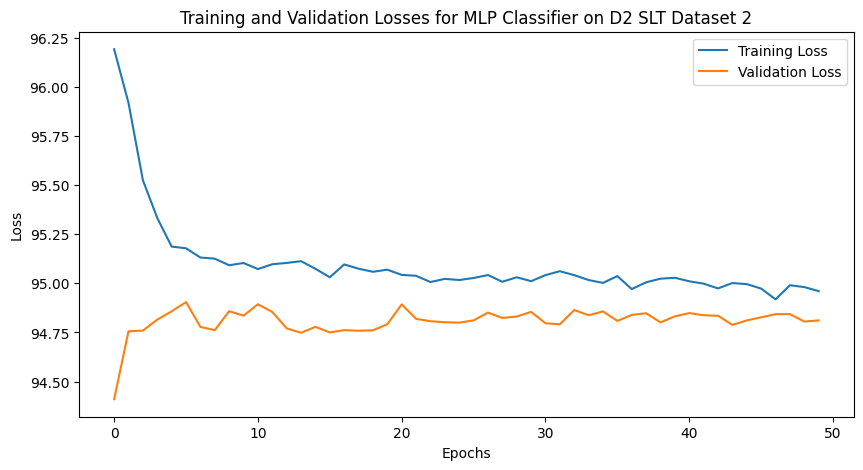

Test Loss: 79.4359, Test Accuracy: 0.7800, AUROC: 0.5499
Training on D2 SLT Dataset 3/33
Epoch 1/50, Training Loss: 96.2290, Validation Loss: 94.5242, Training Accuracy: 0.5215
Epoch 10/50, Training Loss: 95.0552, Validation Loss: 95.0114, Training Accuracy: 0.9035
Epoch 20/50, Training Loss: 94.9091, Validation Loss: 94.8668, Training Accuracy: 0.9111
Epoch 30/50, Training Loss: 94.7955, Validation Loss: 94.9198, Training Accuracy: 0.9215
Epoch 40/50, Training Loss: 94.8074, Validation Loss: 94.7941, Training Accuracy: 0.9174
Epoch 50/50, Training Loss: 94.7697, Validation Loss: 94.7514, Training Accuracy: 0.9201


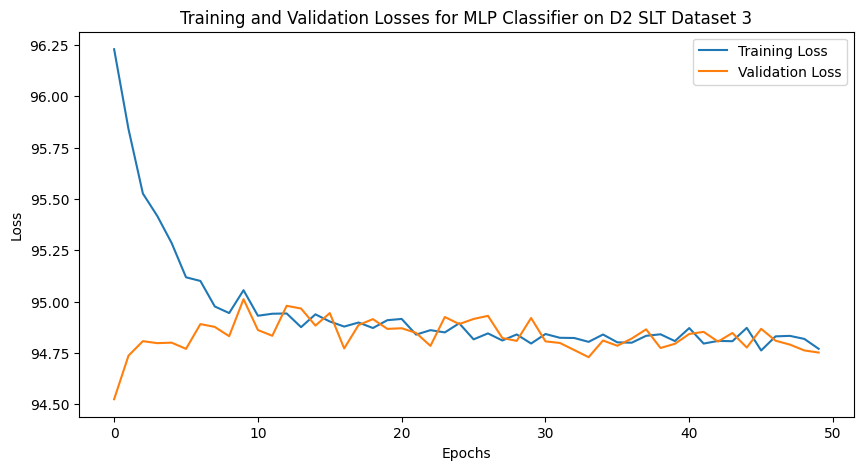

Test Loss: 79.6801, Test Accuracy: 0.7700, AUROC: 0.5734
Training on D2 SLT Dataset 4/33
Epoch 1/50, Training Loss: 96.1998, Validation Loss: 94.6159, Training Accuracy: 0.5132
Epoch 10/50, Training Loss: 94.8503, Validation Loss: 94.8222, Training Accuracy: 0.9174
Epoch 20/50, Training Loss: 94.7568, Validation Loss: 94.7908, Training Accuracy: 0.9187
Epoch 30/50, Training Loss: 94.6858, Validation Loss: 94.7815, Training Accuracy: 0.9278
Epoch 40/50, Training Loss: 94.7159, Validation Loss: 94.8648, Training Accuracy: 0.9229
Epoch 50/50, Training Loss: 94.6518, Validation Loss: 94.8457, Training Accuracy: 0.9250


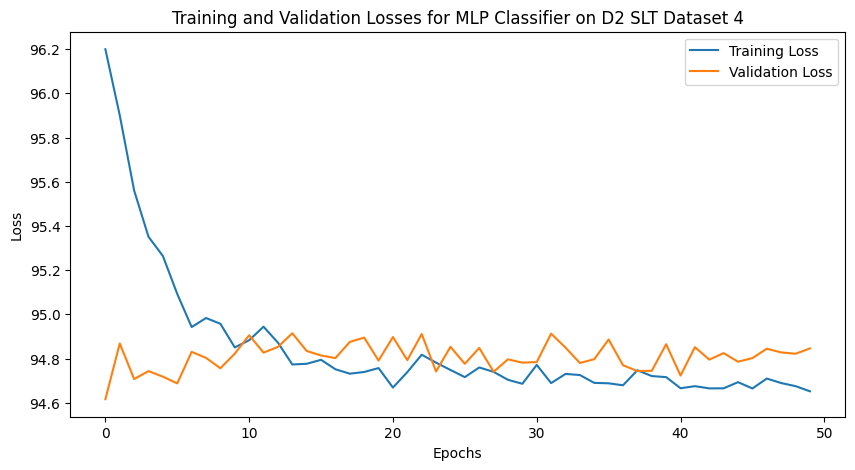

Test Loss: 79.5860, Test Accuracy: 0.7750, AUROC: 0.5539
Training on D2 SLT Dataset 5/33
Epoch 1/50, Training Loss: 96.2726, Validation Loss: 94.6676, Training Accuracy: 0.5208
Epoch 10/50, Training Loss: 94.8357, Validation Loss: 94.7963, Training Accuracy: 0.9229
Epoch 20/50, Training Loss: 94.7260, Validation Loss: 94.8805, Training Accuracy: 0.9264
Epoch 30/50, Training Loss: 94.6990, Validation Loss: 94.8190, Training Accuracy: 0.9257
Epoch 40/50, Training Loss: 94.6589, Validation Loss: 94.8152, Training Accuracy: 0.9306
Epoch 50/50, Training Loss: 94.6520, Validation Loss: 95.0018, Training Accuracy: 0.9257


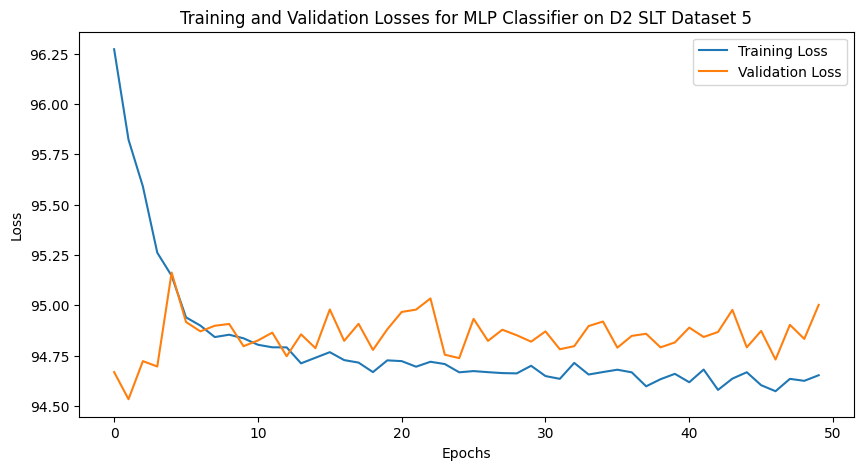

Test Loss: 80.0836, Test Accuracy: 0.7350, AUROC: 0.5097
Training on D2 SLT Dataset 6/33
Epoch 1/50, Training Loss: 96.2368, Validation Loss: 94.8772, Training Accuracy: 0.6736
Epoch 10/50, Training Loss: 94.7697, Validation Loss: 95.0110, Training Accuracy: 0.9208
Epoch 20/50, Training Loss: 94.7012, Validation Loss: 94.8495, Training Accuracy: 0.9257
Epoch 30/50, Training Loss: 94.5842, Validation Loss: 94.9521, Training Accuracy: 0.9326
Epoch 40/50, Training Loss: 94.6067, Validation Loss: 94.9212, Training Accuracy: 0.9278
Epoch 50/50, Training Loss: 94.5656, Validation Loss: 94.9322, Training Accuracy: 0.9319


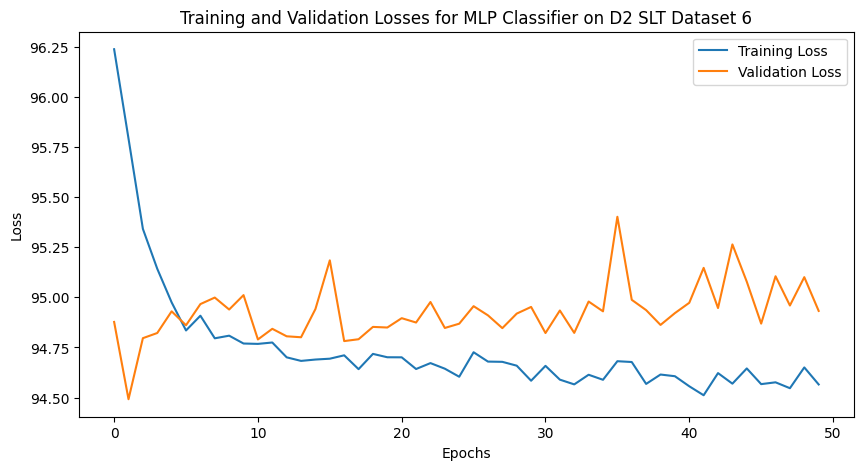

Test Loss: 79.8453, Test Accuracy: 0.7600, AUROC: 0.4836
Training on D2 SLT Dataset 7/33
Epoch 1/50, Training Loss: 96.1455, Validation Loss: 94.3752, Training Accuracy: 0.4306
Epoch 10/50, Training Loss: 94.6817, Validation Loss: 95.0381, Training Accuracy: 0.9222
Epoch 20/50, Training Loss: 94.5616, Validation Loss: 94.8202, Training Accuracy: 0.9264
Epoch 30/50, Training Loss: 94.4768, Validation Loss: 94.8273, Training Accuracy: 0.9361
Epoch 40/50, Training Loss: 94.4473, Validation Loss: 94.8707, Training Accuracy: 0.9389
Epoch 50/50, Training Loss: 94.3489, Validation Loss: 95.0859, Training Accuracy: 0.9424


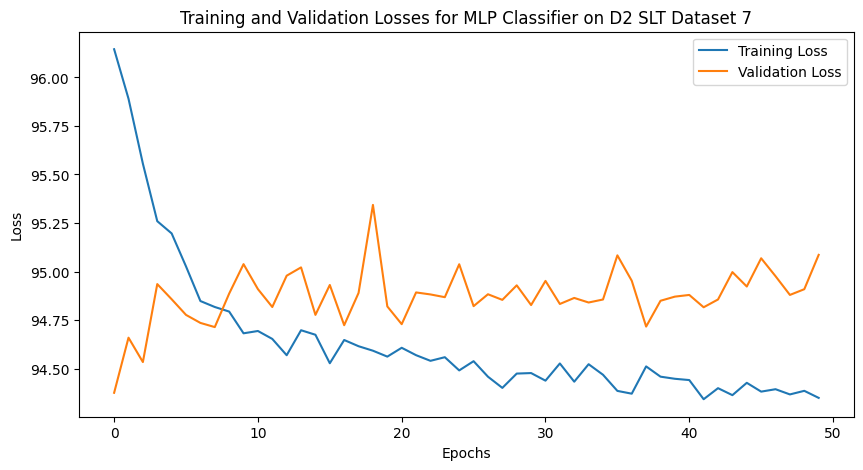

Test Loss: 79.9249, Test Accuracy: 0.7250, AUROC: 0.5608
Training on D2 SLT Dataset 8/33
Epoch 1/50, Training Loss: 96.2447, Validation Loss: 94.4586, Training Accuracy: 0.4160
Epoch 10/50, Training Loss: 94.5620, Validation Loss: 94.8152, Training Accuracy: 0.9257
Epoch 20/50, Training Loss: 94.4936, Validation Loss: 94.8686, Training Accuracy: 0.9264
Epoch 30/50, Training Loss: 94.2599, Validation Loss: 94.9853, Training Accuracy: 0.9458
Epoch 40/50, Training Loss: 94.2148, Validation Loss: 94.8511, Training Accuracy: 0.9479
Epoch 50/50, Training Loss: 94.2252, Validation Loss: 94.9692, Training Accuracy: 0.9486


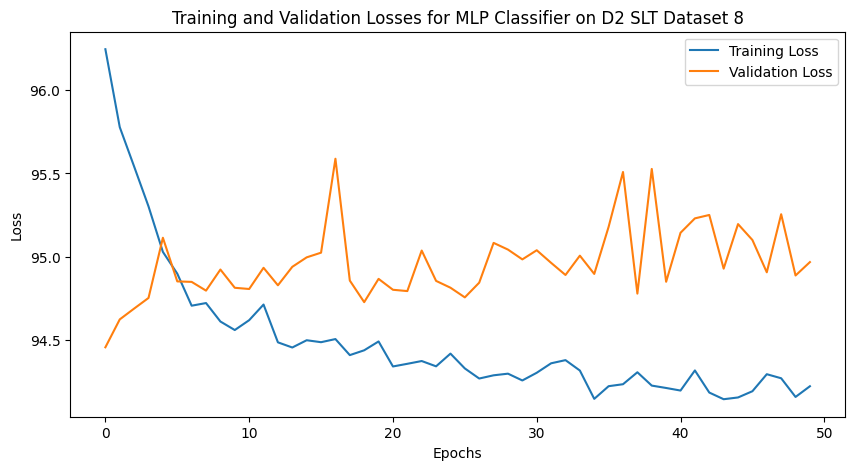

Test Loss: 79.9199, Test Accuracy: 0.7400, AUROC: 0.5967
Training on D2 SLT Dataset 9/33
Epoch 1/50, Training Loss: 96.2278, Validation Loss: 94.4357, Training Accuracy: 0.3736
Epoch 10/50, Training Loss: 94.6015, Validation Loss: 94.8102, Training Accuracy: 0.9250
Epoch 20/50, Training Loss: 94.4145, Validation Loss: 95.0616, Training Accuracy: 0.9361
Epoch 30/50, Training Loss: 94.3120, Validation Loss: 94.9507, Training Accuracy: 0.9389
Epoch 40/50, Training Loss: 94.1418, Validation Loss: 95.1809, Training Accuracy: 0.9493
Epoch 50/50, Training Loss: 94.0670, Validation Loss: 95.2100, Training Accuracy: 0.9563


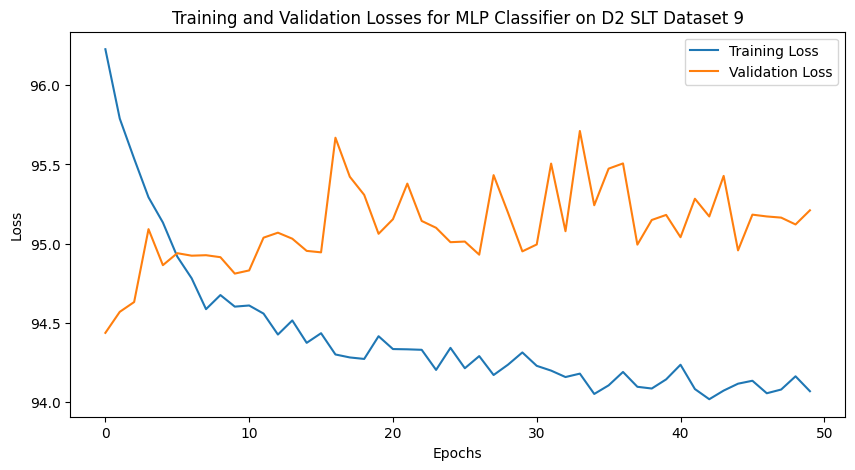

Test Loss: 79.5923, Test Accuracy: 0.7750, AUROC: 0.5811
Training on D2 SLT Dataset 10/33
Epoch 1/50, Training Loss: 96.3221, Validation Loss: 94.7862, Training Accuracy: 0.5604
Epoch 10/50, Training Loss: 94.3824, Validation Loss: 94.8353, Training Accuracy: 0.9354
Epoch 20/50, Training Loss: 94.1989, Validation Loss: 94.8358, Training Accuracy: 0.9479
Epoch 30/50, Training Loss: 94.1914, Validation Loss: 95.0753, Training Accuracy: 0.9451
Epoch 40/50, Training Loss: 94.0864, Validation Loss: 94.9876, Training Accuracy: 0.9569
Epoch 50/50, Training Loss: 94.0707, Validation Loss: 95.0986, Training Accuracy: 0.9528


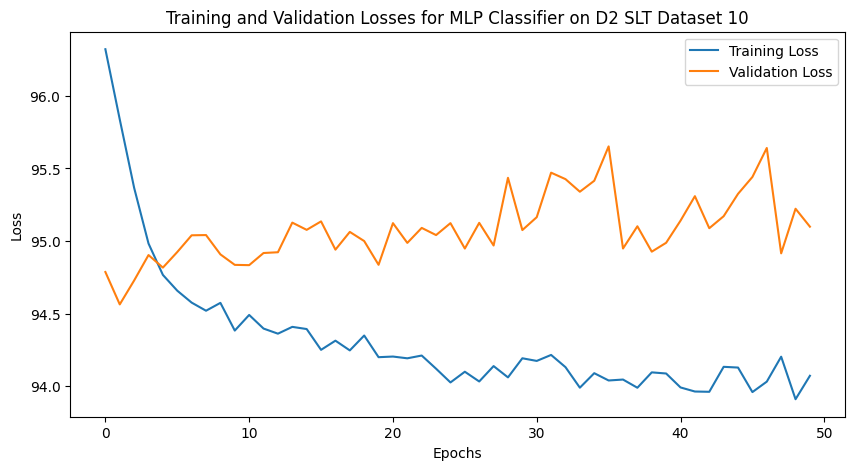

Test Loss: 80.4389, Test Accuracy: 0.6850, AUROC: 0.5726
Training on D2 SLT Dataset 11/33
Epoch 1/50, Training Loss: 96.1368, Validation Loss: 94.5148, Training Accuracy: 0.4056
Epoch 10/50, Training Loss: 94.3011, Validation Loss: 95.0924, Training Accuracy: 0.9382
Epoch 20/50, Training Loss: 94.1047, Validation Loss: 95.0763, Training Accuracy: 0.9542
Epoch 30/50, Training Loss: 93.9452, Validation Loss: 95.1309, Training Accuracy: 0.9632
Epoch 40/50, Training Loss: 93.8164, Validation Loss: 95.3091, Training Accuracy: 0.9729
Epoch 50/50, Training Loss: 93.7942, Validation Loss: 95.4229, Training Accuracy: 0.9785


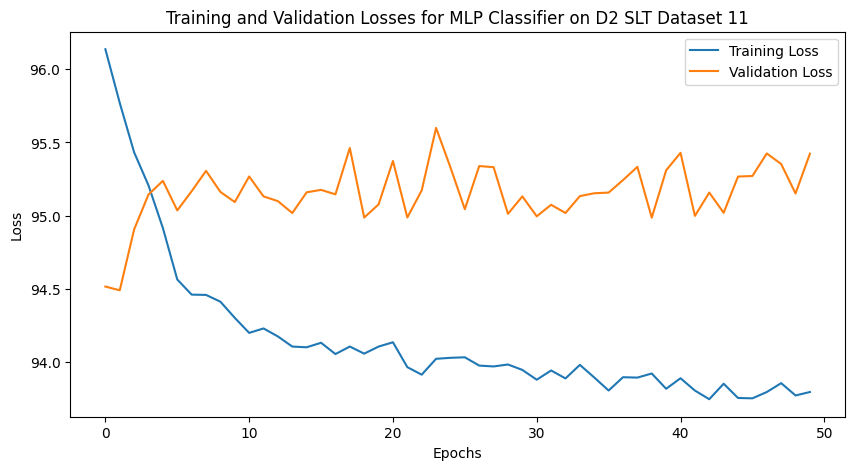

Test Loss: 79.6993, Test Accuracy: 0.7600, AUROC: 0.6562
Training on D2 SLT Dataset 12/33
Epoch 1/50, Training Loss: 96.1637, Validation Loss: 94.5229, Training Accuracy: 0.5840
Epoch 10/50, Training Loss: 94.2760, Validation Loss: 95.3363, Training Accuracy: 0.9479
Epoch 20/50, Training Loss: 93.9472, Validation Loss: 94.7554, Training Accuracy: 0.9653
Epoch 30/50, Training Loss: 93.7833, Validation Loss: 95.0085, Training Accuracy: 0.9757
Epoch 40/50, Training Loss: 93.7997, Validation Loss: 94.9185, Training Accuracy: 0.9778
Epoch 50/50, Training Loss: 93.6921, Validation Loss: 94.7495, Training Accuracy: 0.9854


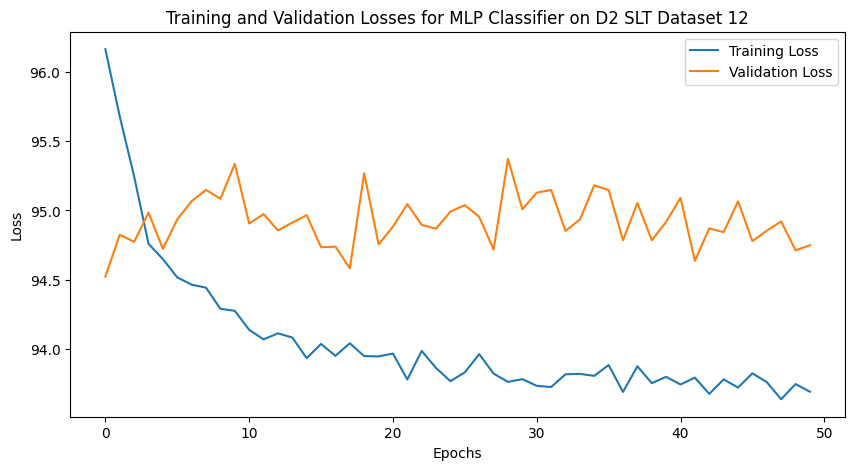

Test Loss: 79.5467, Test Accuracy: 0.7700, AUROC: 0.6170
Training on D2 SLT Dataset 13/33
Epoch 1/50, Training Loss: 96.1253, Validation Loss: 94.4741, Training Accuracy: 0.6354
Epoch 10/50, Training Loss: 94.1375, Validation Loss: 94.8771, Training Accuracy: 0.9479
Epoch 20/50, Training Loss: 93.8231, Validation Loss: 94.8824, Training Accuracy: 0.9778
Epoch 30/50, Training Loss: 93.8522, Validation Loss: 94.6973, Training Accuracy: 0.9736
Epoch 40/50, Training Loss: 93.7647, Validation Loss: 95.0690, Training Accuracy: 0.9792
Epoch 50/50, Training Loss: 93.6946, Validation Loss: 94.7515, Training Accuracy: 0.9840


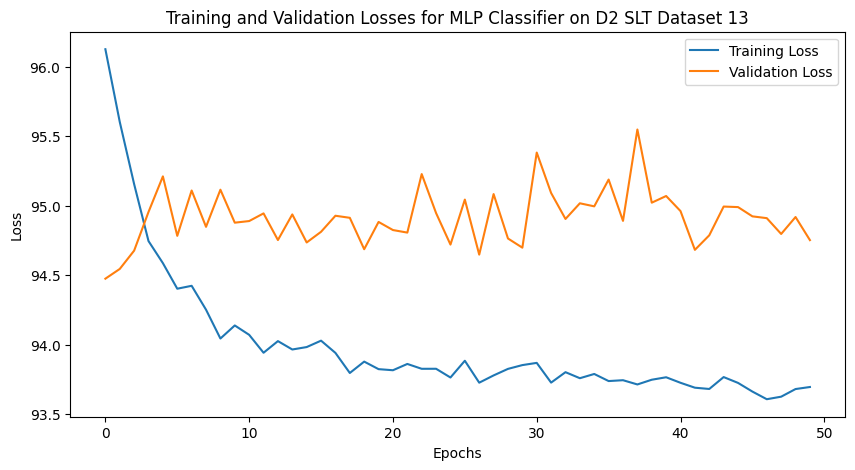

Test Loss: 79.5898, Test Accuracy: 0.7700, AUROC: 0.6847
Training on D2 SLT Dataset 14/33
Epoch 1/50, Training Loss: 96.1059, Validation Loss: 94.7091, Training Accuracy: 0.6854
Epoch 10/50, Training Loss: 93.9093, Validation Loss: 95.0478, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 93.7481, Validation Loss: 94.7445, Training Accuracy: 0.9792
Epoch 30/50, Training Loss: 93.6854, Validation Loss: 95.0803, Training Accuracy: 0.9840
Epoch 40/50, Training Loss: 93.6877, Validation Loss: 94.6944, Training Accuracy: 0.9833
Epoch 50/50, Training Loss: 93.7091, Validation Loss: 94.7202, Training Accuracy: 0.9833


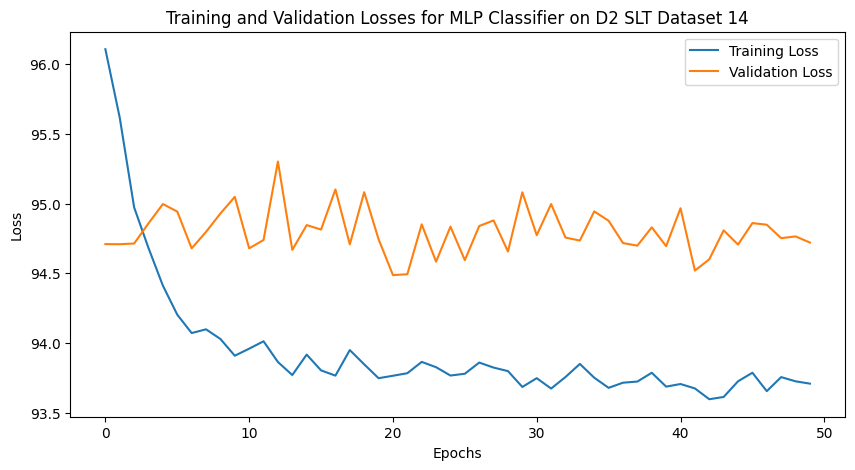

Test Loss: 79.5474, Test Accuracy: 0.7600, AUROC: 0.6447
Training on D2 SLT Dataset 15/33
Epoch 1/50, Training Loss: 96.1422, Validation Loss: 94.4299, Training Accuracy: 0.6125
Epoch 10/50, Training Loss: 94.0838, Validation Loss: 94.7683, Training Accuracy: 0.9632
Epoch 20/50, Training Loss: 93.7776, Validation Loss: 94.6323, Training Accuracy: 0.9785
Epoch 30/50, Training Loss: 93.7670, Validation Loss: 94.9578, Training Accuracy: 0.9792
Epoch 40/50, Training Loss: 93.6395, Validation Loss: 94.7557, Training Accuracy: 0.9861
Epoch 50/50, Training Loss: 93.6834, Validation Loss: 94.7054, Training Accuracy: 0.9840


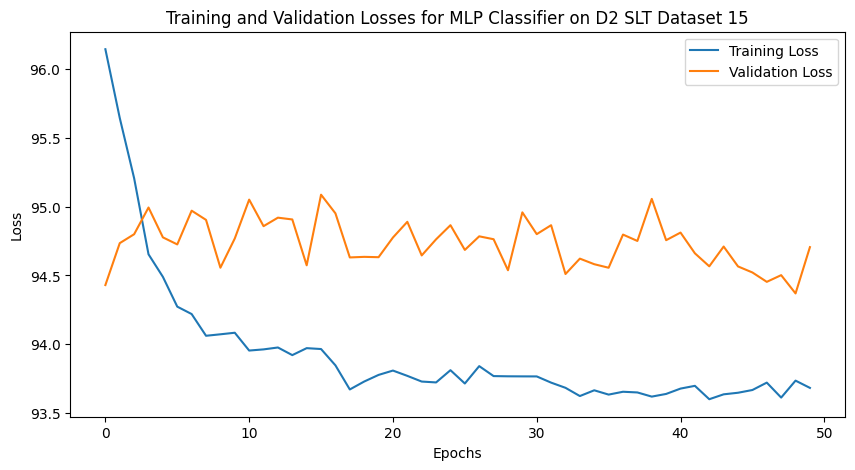

Test Loss: 79.6397, Test Accuracy: 0.7650, AUROC: 0.6416
Training on D2 SLT Dataset 16/33
Epoch 1/50, Training Loss: 96.1903, Validation Loss: 94.7407, Training Accuracy: 0.5368
Epoch 10/50, Training Loss: 93.9289, Validation Loss: 94.7538, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 93.7775, Validation Loss: 94.9410, Training Accuracy: 0.9771
Epoch 30/50, Training Loss: 93.7034, Validation Loss: 94.9289, Training Accuracy: 0.9806
Epoch 40/50, Training Loss: 93.6206, Validation Loss: 94.6086, Training Accuracy: 0.9875
Epoch 50/50, Training Loss: 93.5924, Validation Loss: 94.8637, Training Accuracy: 0.9910


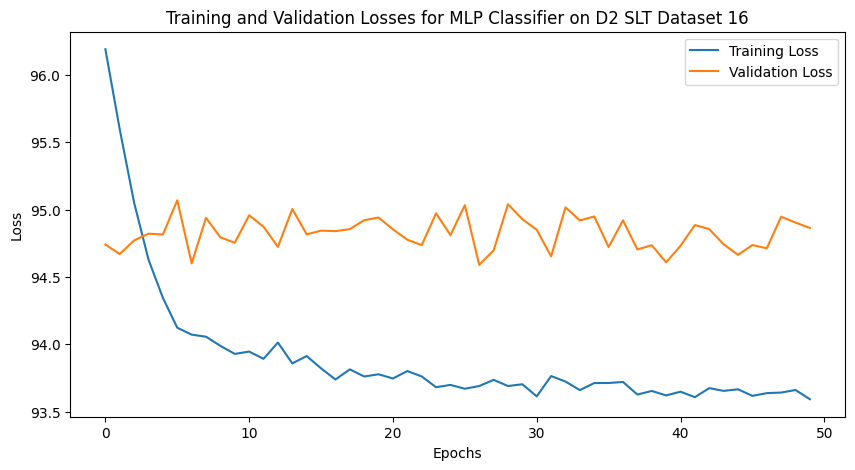

Test Loss: 79.6487, Test Accuracy: 0.7650, AUROC: 0.6628
Training on D2 SLT Dataset 17/33
Epoch 1/50, Training Loss: 96.1852, Validation Loss: 94.8283, Training Accuracy: 0.5729
Epoch 10/50, Training Loss: 93.9788, Validation Loss: 94.9455, Training Accuracy: 0.9597
Epoch 20/50, Training Loss: 93.7463, Validation Loss: 94.8354, Training Accuracy: 0.9806
Epoch 30/50, Training Loss: 93.7433, Validation Loss: 94.8279, Training Accuracy: 0.9819
Epoch 40/50, Training Loss: 93.6393, Validation Loss: 94.7760, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.6363, Validation Loss: 94.6504, Training Accuracy: 0.9875


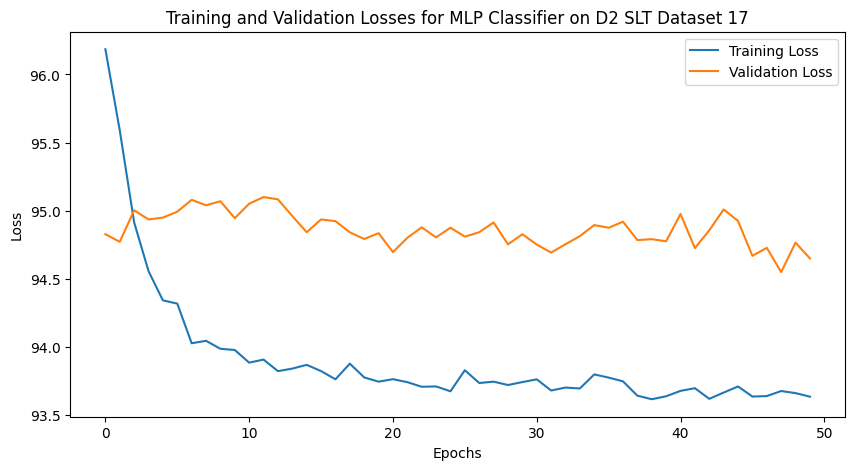

Test Loss: 79.6247, Test Accuracy: 0.7700, AUROC: 0.6398
Training on D2 SLT Dataset 18/33
Epoch 1/50, Training Loss: 96.2085, Validation Loss: 94.5198, Training Accuracy: 0.4444
Epoch 10/50, Training Loss: 93.9191, Validation Loss: 95.0570, Training Accuracy: 0.9694
Epoch 20/50, Training Loss: 93.7733, Validation Loss: 95.0412, Training Accuracy: 0.9764
Epoch 30/50, Training Loss: 93.6551, Validation Loss: 94.6750, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 93.6318, Validation Loss: 94.7393, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.5556, Validation Loss: 94.7586, Training Accuracy: 0.9938


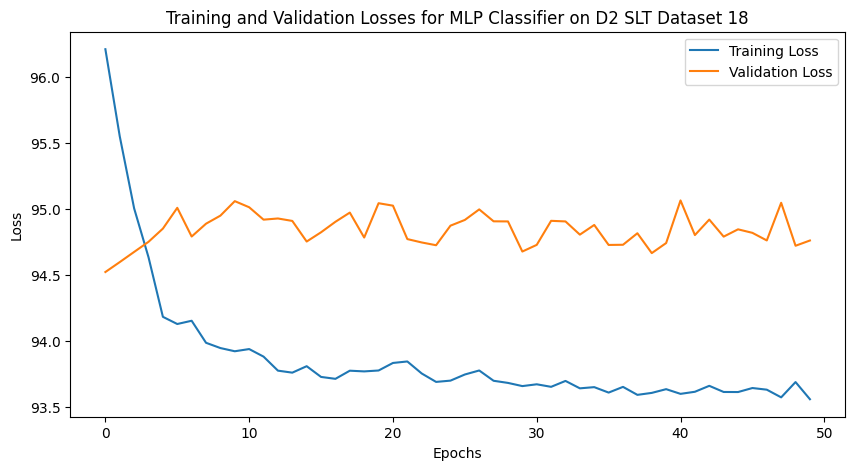

Test Loss: 79.4983, Test Accuracy: 0.7850, AUROC: 0.6333
Training on D2 SLT Dataset 19/33
Epoch 1/50, Training Loss: 96.2630, Validation Loss: 94.9198, Training Accuracy: 0.5319
Epoch 10/50, Training Loss: 93.9692, Validation Loss: 94.6797, Training Accuracy: 0.9625
Epoch 20/50, Training Loss: 93.7740, Validation Loss: 95.0586, Training Accuracy: 0.9792
Epoch 30/50, Training Loss: 93.6318, Validation Loss: 94.6885, Training Accuracy: 0.9882
Epoch 40/50, Training Loss: 93.5707, Validation Loss: 95.0550, Training Accuracy: 0.9917
Epoch 50/50, Training Loss: 93.5927, Validation Loss: 95.1876, Training Accuracy: 0.9910


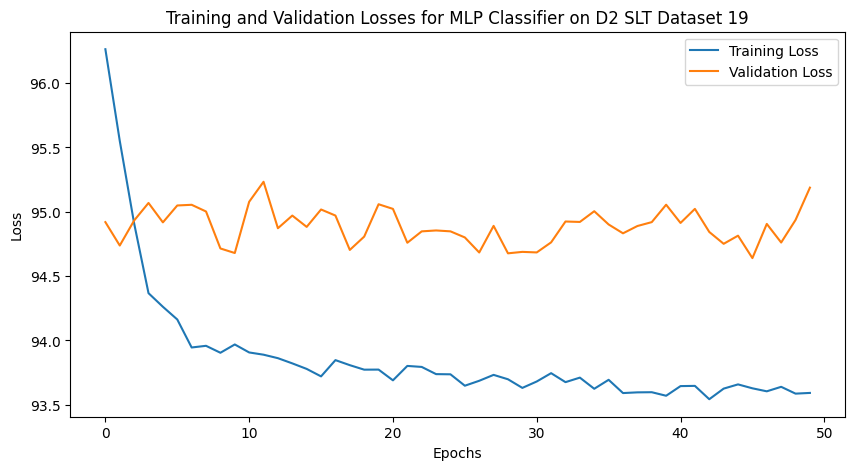

Test Loss: 79.7583, Test Accuracy: 0.7500, AUROC: 0.6681
Training on D2 SLT Dataset 20/33
Epoch 1/50, Training Loss: 96.2790, Validation Loss: 94.7007, Training Accuracy: 0.4924
Epoch 10/50, Training Loss: 93.9336, Validation Loss: 94.8501, Training Accuracy: 0.9688
Epoch 20/50, Training Loss: 93.6641, Validation Loss: 95.0995, Training Accuracy: 0.9861
Epoch 30/50, Training Loss: 93.6736, Validation Loss: 95.0716, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 93.6241, Validation Loss: 94.9542, Training Accuracy: 0.9903
Epoch 50/50, Training Loss: 93.6515, Validation Loss: 94.9279, Training Accuracy: 0.9875


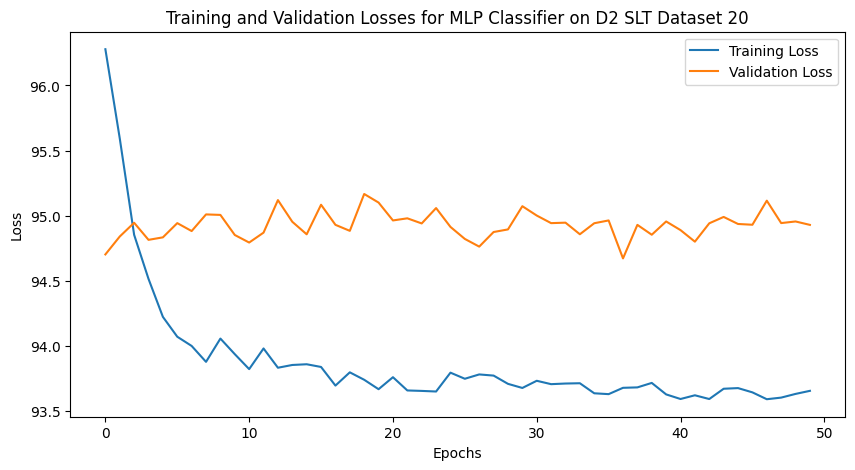

Test Loss: 79.4861, Test Accuracy: 0.7850, AUROC: 0.6134
Training on D2 SLT Dataset 21/33
Epoch 1/50, Training Loss: 96.1189, Validation Loss: 95.0057, Training Accuracy: 0.6687
Epoch 10/50, Training Loss: 93.8923, Validation Loss: 94.8729, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 93.7494, Validation Loss: 94.9966, Training Accuracy: 0.9819
Epoch 30/50, Training Loss: 93.6690, Validation Loss: 94.8659, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 93.6489, Validation Loss: 94.9390, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 93.6625, Validation Loss: 94.8174, Training Accuracy: 0.9882


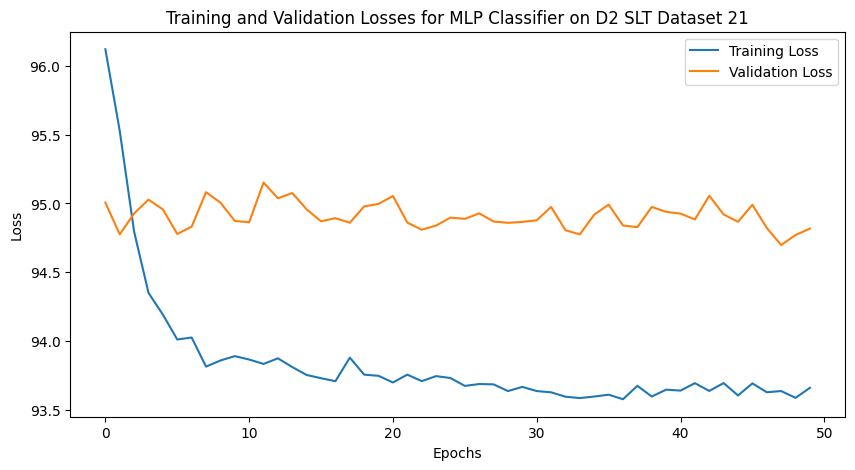

Test Loss: 79.6514, Test Accuracy: 0.7550, AUROC: 0.6446
Training on D2 SLT Dataset 22/33
Epoch 1/50, Training Loss: 96.3125, Validation Loss: 94.7182, Training Accuracy: 0.5903
Epoch 10/50, Training Loss: 93.8753, Validation Loss: 94.7497, Training Accuracy: 0.9701
Epoch 20/50, Training Loss: 93.7203, Validation Loss: 94.8316, Training Accuracy: 0.9819
Epoch 30/50, Training Loss: 93.6765, Validation Loss: 94.9099, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 93.7489, Validation Loss: 94.8881, Training Accuracy: 0.9812
Epoch 50/50, Training Loss: 93.6245, Validation Loss: 94.7911, Training Accuracy: 0.9896


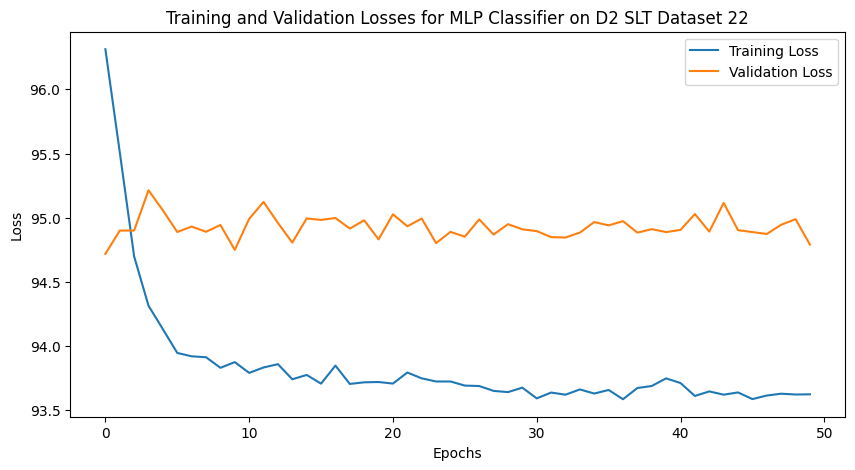

Test Loss: 79.5823, Test Accuracy: 0.7650, AUROC: 0.6642
Training on D2 SLT Dataset 23/33
Epoch 1/50, Training Loss: 96.2822, Validation Loss: 94.7584, Training Accuracy: 0.4285
Epoch 10/50, Training Loss: 93.8498, Validation Loss: 94.9969, Training Accuracy: 0.9736
Epoch 20/50, Training Loss: 93.7448, Validation Loss: 95.0199, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.7062, Validation Loss: 94.8161, Training Accuracy: 0.9799
Epoch 40/50, Training Loss: 93.5767, Validation Loss: 95.0055, Training Accuracy: 0.9924
Epoch 50/50, Training Loss: 93.5883, Validation Loss: 94.8585, Training Accuracy: 0.9910


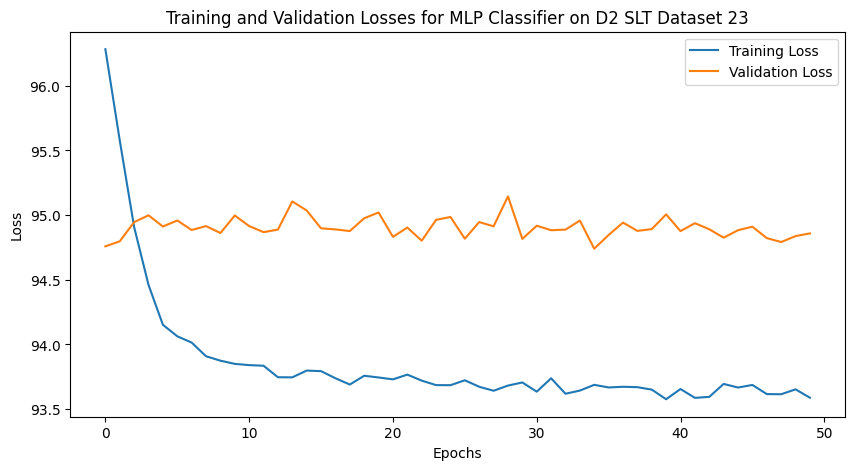

Test Loss: 79.4063, Test Accuracy: 0.7900, AUROC: 0.6500
Training on D2 SLT Dataset 24/33
Epoch 1/50, Training Loss: 96.1893, Validation Loss: 94.7404, Training Accuracy: 0.5424
Epoch 10/50, Training Loss: 93.8480, Validation Loss: 94.8455, Training Accuracy: 0.9757
Epoch 20/50, Training Loss: 93.7403, Validation Loss: 94.7901, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.6383, Validation Loss: 94.8200, Training Accuracy: 0.9889
Epoch 40/50, Training Loss: 93.6714, Validation Loss: 94.8269, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 93.7505, Validation Loss: 94.7726, Training Accuracy: 0.9778


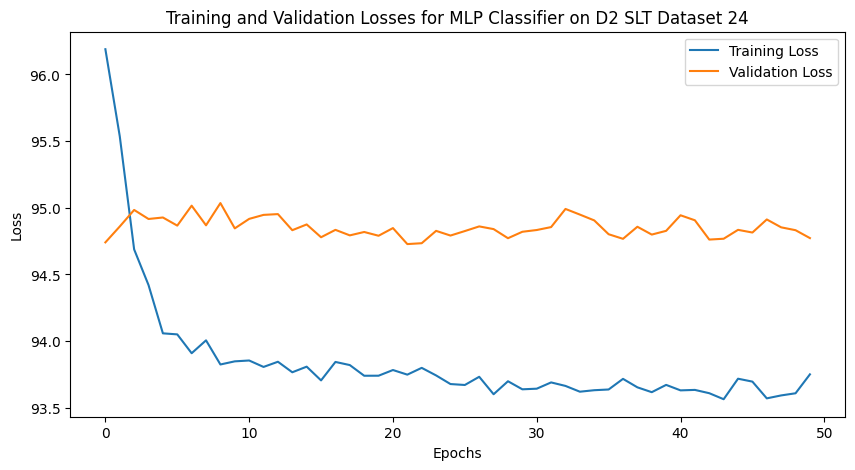

Test Loss: 79.7129, Test Accuracy: 0.7650, AUROC: 0.6852
Training on D2 SLT Dataset 25/33
Epoch 1/50, Training Loss: 96.2449, Validation Loss: 94.7355, Training Accuracy: 0.4868
Epoch 10/50, Training Loss: 93.7896, Validation Loss: 94.9835, Training Accuracy: 0.9778
Epoch 20/50, Training Loss: 93.6827, Validation Loss: 94.8887, Training Accuracy: 0.9854
Epoch 30/50, Training Loss: 93.6837, Validation Loss: 94.9520, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 93.6016, Validation Loss: 95.0086, Training Accuracy: 0.9882
Epoch 50/50, Training Loss: 93.6164, Validation Loss: 94.9027, Training Accuracy: 0.9882


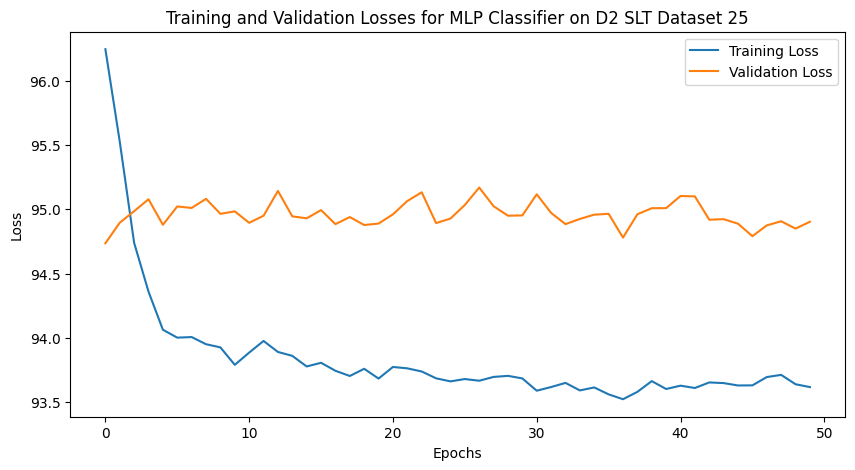

Test Loss: 79.4506, Test Accuracy: 0.7750, AUROC: 0.6746
Training on D2 SLT Dataset 26/33
Epoch 1/50, Training Loss: 96.1890, Validation Loss: 94.6317, Training Accuracy: 0.6750
Epoch 10/50, Training Loss: 93.8226, Validation Loss: 94.9246, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 93.6825, Validation Loss: 94.8329, Training Accuracy: 0.9826
Epoch 30/50, Training Loss: 93.5804, Validation Loss: 94.7449, Training Accuracy: 0.9910
Epoch 40/50, Training Loss: 93.5840, Validation Loss: 94.8666, Training Accuracy: 0.9924
Epoch 50/50, Training Loss: 93.6106, Validation Loss: 94.9950, Training Accuracy: 0.9889


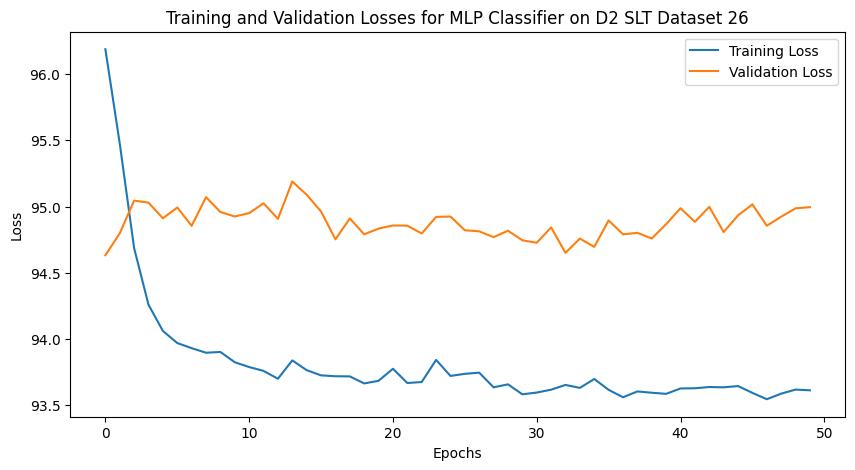

Test Loss: 79.2813, Test Accuracy: 0.7900, AUROC: 0.6425
Training on D2 SLT Dataset 27/33
Epoch 1/50, Training Loss: 96.2767, Validation Loss: 94.6672, Training Accuracy: 0.3715
Epoch 10/50, Training Loss: 93.8685, Validation Loss: 94.9049, Training Accuracy: 0.9757
Epoch 20/50, Training Loss: 93.7711, Validation Loss: 94.6720, Training Accuracy: 0.9743
Epoch 30/50, Training Loss: 93.6492, Validation Loss: 95.0575, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 93.6698, Validation Loss: 94.9442, Training Accuracy: 0.9833
Epoch 50/50, Training Loss: 93.5945, Validation Loss: 94.8515, Training Accuracy: 0.9896


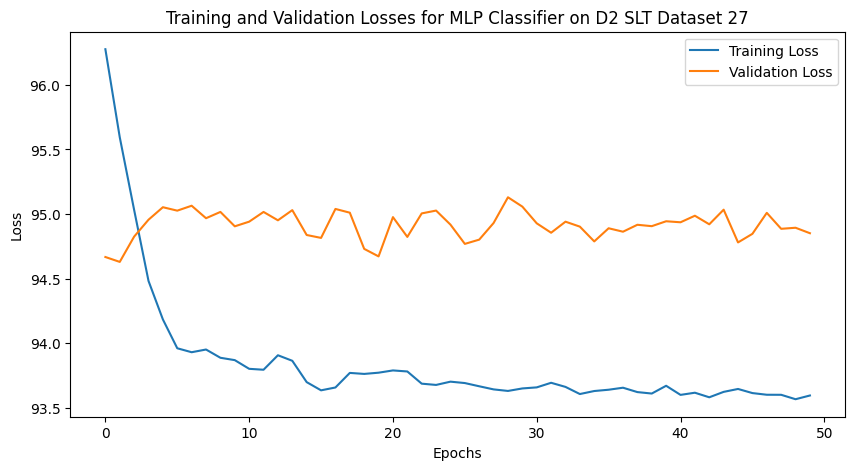

Test Loss: 79.5742, Test Accuracy: 0.7700, AUROC: 0.6231
Training on D2 SLT Dataset 28/33
Epoch 1/50, Training Loss: 96.1509, Validation Loss: 94.5753, Training Accuracy: 0.7438
Epoch 10/50, Training Loss: 93.8256, Validation Loss: 95.1643, Training Accuracy: 0.9764
Epoch 20/50, Training Loss: 93.6422, Validation Loss: 94.8929, Training Accuracy: 0.9861
Epoch 30/50, Training Loss: 93.7121, Validation Loss: 94.9532, Training Accuracy: 0.9833
Epoch 40/50, Training Loss: 93.6683, Validation Loss: 94.9765, Training Accuracy: 0.9889
Epoch 50/50, Training Loss: 93.6266, Validation Loss: 94.8915, Training Accuracy: 0.9882


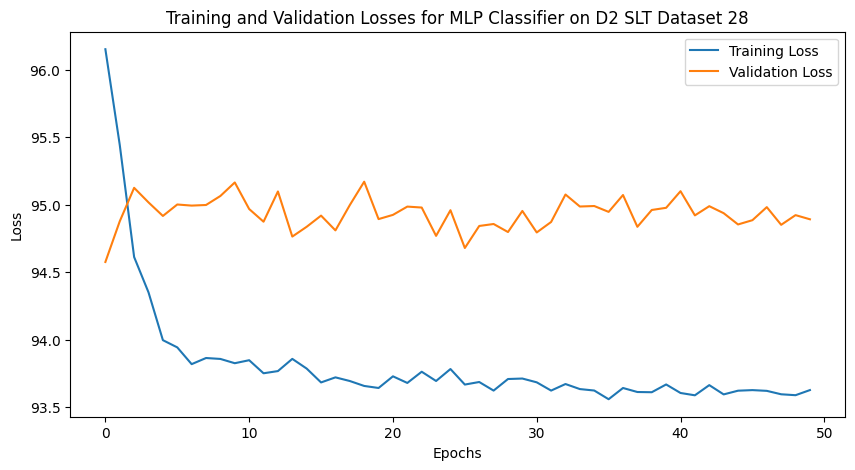

Test Loss: 79.5606, Test Accuracy: 0.7750, AUROC: 0.6194
Training on D2 SLT Dataset 29/33
Epoch 1/50, Training Loss: 96.3264, Validation Loss: 94.4761, Training Accuracy: 0.5167
Epoch 10/50, Training Loss: 93.8526, Validation Loss: 94.9039, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 93.7076, Validation Loss: 94.8311, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.6467, Validation Loss: 94.8365, Training Accuracy: 0.9875
Epoch 40/50, Training Loss: 93.5804, Validation Loss: 94.9873, Training Accuracy: 0.9910
Epoch 50/50, Training Loss: 93.6171, Validation Loss: 94.9020, Training Accuracy: 0.9910


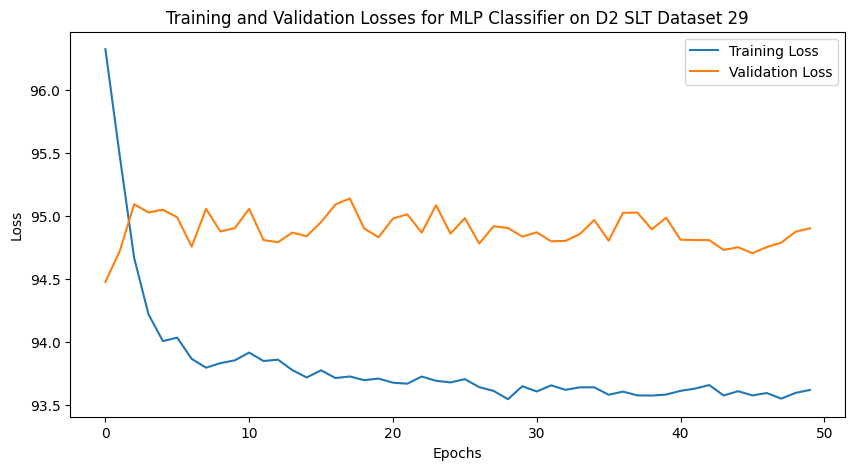

Test Loss: 79.8052, Test Accuracy: 0.7450, AUROC: 0.6180
Training on D2 SLT Dataset 30/33
Epoch 1/50, Training Loss: 96.2395, Validation Loss: 94.7429, Training Accuracy: 0.5632
Epoch 10/50, Training Loss: 93.7500, Validation Loss: 94.9079, Training Accuracy: 0.9771
Epoch 20/50, Training Loss: 93.6702, Validation Loss: 94.7996, Training Accuracy: 0.9826
Epoch 30/50, Training Loss: 93.6370, Validation Loss: 94.8989, Training Accuracy: 0.9861
Epoch 40/50, Training Loss: 93.6455, Validation Loss: 94.8686, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.5295, Validation Loss: 94.7530, Training Accuracy: 0.9958


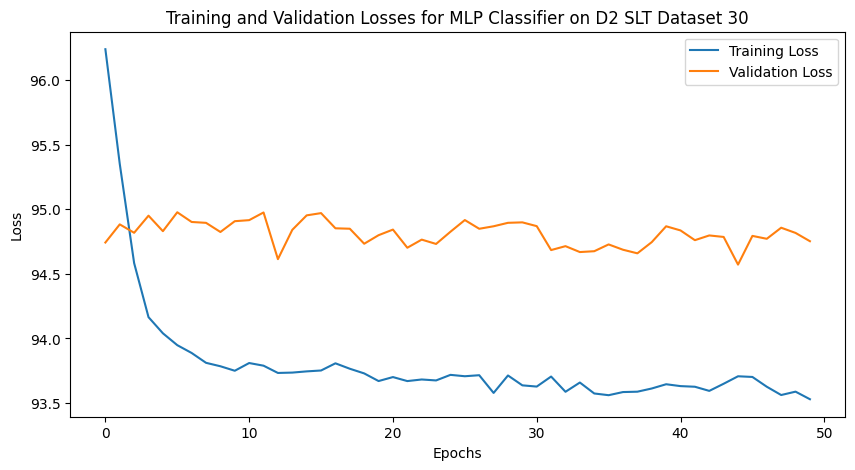

Test Loss: 79.4249, Test Accuracy: 0.7900, AUROC: 0.5595
Training on D2 SLT Dataset 31/33
Epoch 1/50, Training Loss: 96.2176, Validation Loss: 94.9985, Training Accuracy: 0.5299
Epoch 10/50, Training Loss: 93.8194, Validation Loss: 94.8981, Training Accuracy: 0.9729
Epoch 20/50, Training Loss: 93.7331, Validation Loss: 94.9748, Training Accuracy: 0.9833
Epoch 30/50, Training Loss: 93.6230, Validation Loss: 94.8733, Training Accuracy: 0.9875
Epoch 40/50, Training Loss: 93.6230, Validation Loss: 95.0058, Training Accuracy: 0.9896
Epoch 50/50, Training Loss: 93.5887, Validation Loss: 94.8075, Training Accuracy: 0.9931


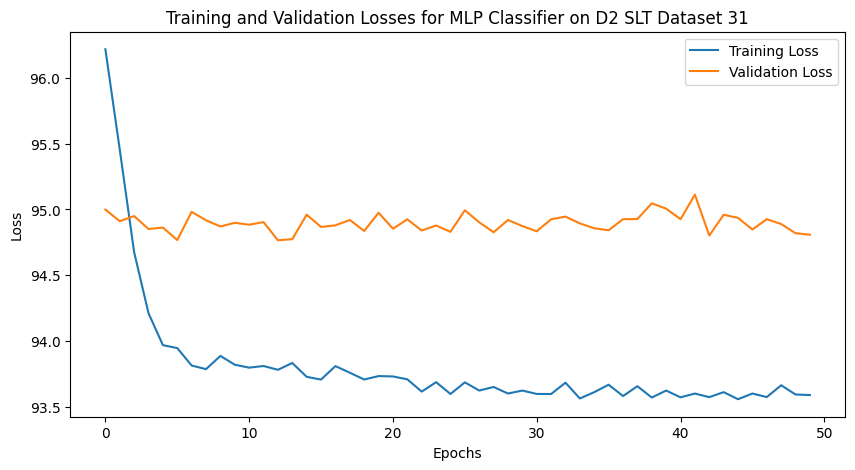

Test Loss: 79.5319, Test Accuracy: 0.7800, AUROC: 0.6150
Training on D2 SLT Dataset 32/33
Epoch 1/50, Training Loss: 96.1695, Validation Loss: 94.7773, Training Accuracy: 0.5590
Epoch 10/50, Training Loss: 93.8342, Validation Loss: 94.9393, Training Accuracy: 0.9743
Epoch 20/50, Training Loss: 93.7523, Validation Loss: 94.9816, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.6096, Validation Loss: 94.8985, Training Accuracy: 0.9889
Epoch 40/50, Training Loss: 93.5875, Validation Loss: 94.9217, Training Accuracy: 0.9924
Epoch 50/50, Training Loss: 93.6434, Validation Loss: 94.9884, Training Accuracy: 0.9896


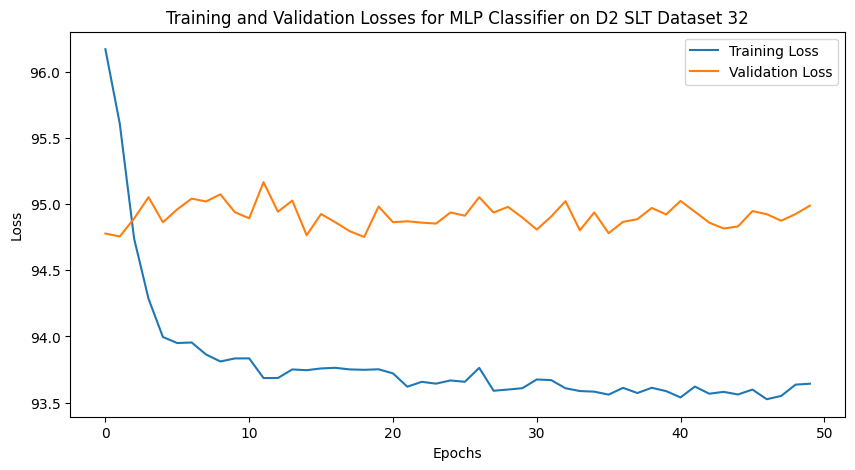

Test Loss: 79.4224, Test Accuracy: 0.7900, AUROC: 0.6062
Training on D2 SLT Dataset 33/33
Epoch 1/50, Training Loss: 96.1318, Validation Loss: 94.5465, Training Accuracy: 0.5396
Epoch 10/50, Training Loss: 93.9319, Validation Loss: 95.2843, Training Accuracy: 0.9646
Epoch 20/50, Training Loss: 93.7530, Validation Loss: 95.0057, Training Accuracy: 0.9785
Epoch 30/50, Training Loss: 93.6334, Validation Loss: 94.9006, Training Accuracy: 0.9889
Epoch 40/50, Training Loss: 93.6138, Validation Loss: 94.9924, Training Accuracy: 0.9910
Epoch 50/50, Training Loss: 93.6038, Validation Loss: 95.0918, Training Accuracy: 0.9903


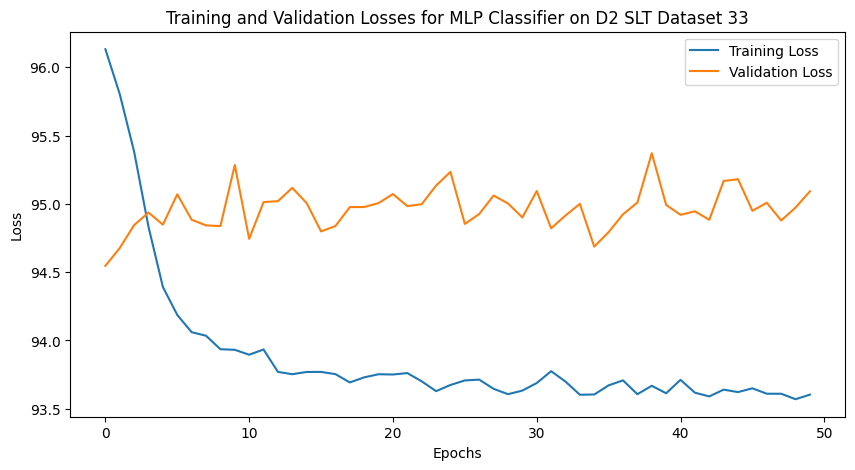

Test Loss: 80.0070, Test Accuracy: 0.7400, AUROC: 0.5259


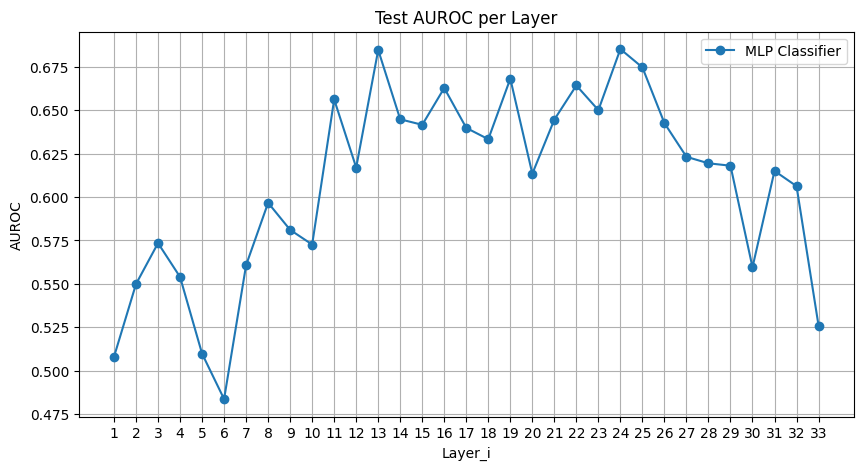

In [175]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
tmlpa_test_accs = []
tmlpa_test_aucs = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(d2a_tbg_train_dataloaders, d2a_tbg_valid_dataloaders, d2a_tbg_test_dataloaders)):
    print(f"Training on D2 TBG Dataset {i+1}/{len(d2a_tbg_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on D2 TBG Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    tmlpa_test_accs.append(test_acc)
    tmlpa_test_aucs.append(test_auc)

# plot_1d_metrics([tmlpa_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([tmlpa_test_aucs], ['MLP Classifier'], 'AUROC')

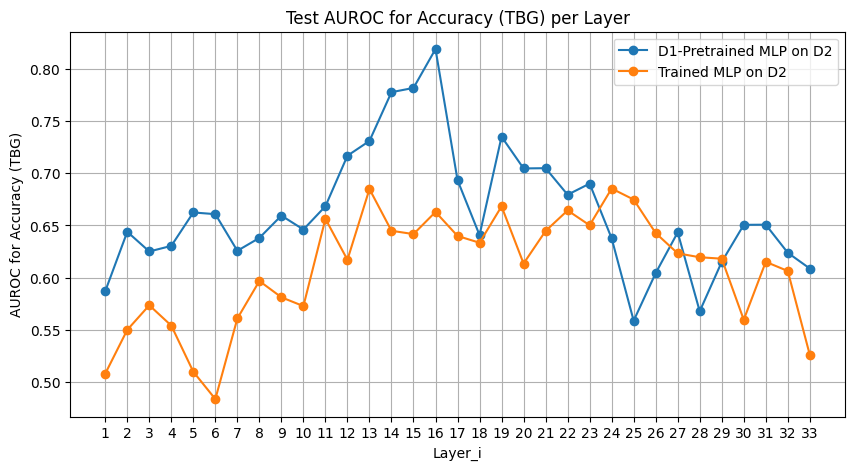

In [183]:
# Comparison with using pretrained model on D1 for prediction on D2
plot_1d_metrics([tmlp2a_test_aucs, tmlpa_test_aucs], ['D1-Pretrained MLP on D2', 'Trained MLP on D2'], 'AUROC for Accuracy (TBG)')

#### SLT Tokens

In [180]:
# Prepare all data sets from D2.
d2a_slt_train_dataloaders, d2a_slt_valid_dataloaders, d2a_slt_test_dataloaders = create_dataloaders(d2_slt_layered_datasets, d2_r_accuracies, total_size, batch_size, set_seed=True)

d2a_X_trains, d2a_X_vals, d2a_X_tests, d2a_y_trains, d2a_y_vals, d2a_y_tests = create_Xs_and_ys(d2_slt_layered_datasets, d2_r_accuracies, total_size)

Training on D2 SLT Dataset 1/32
Validation Accuracy: 0.8639, AUROC: 0.6475
Training Loss: 0.3873, Validation Loss: 0.3966
Test Loss: 0.3759, Test Accuracy: 0.8750, AUROC: 0.6219
Training on D2 SLT Dataset 2/32
Validation Accuracy: 0.8639, AUROC: 0.5938
Training Loss: 0.3861, Validation Loss: 0.3964
Test Loss: 0.3749, Test Accuracy: 0.8750, AUROC: 0.6402
Training on D2 SLT Dataset 3/32
Validation Accuracy: 0.8639, AUROC: 0.5649
Training Loss: 0.3801, Validation Loss: 0.3953
Test Loss: 0.3708, Test Accuracy: 0.8750, AUROC: 0.6491
Training on D2 SLT Dataset 4/32
Validation Accuracy: 0.8639, AUROC: 0.5810
Training Loss: 0.3715, Validation Loss: 0.3928
Test Loss: 0.3648, Test Accuracy: 0.8750, AUROC: 0.7120
Training on D2 SLT Dataset 5/32
Validation Accuracy: 0.8639, AUROC: 0.6098
Training Loss: 0.3451, Validation Loss: 0.3881
Test Loss: 0.3538, Test Accuracy: 0.8750, AUROC: 0.7147
Training on D2 SLT Dataset 6/32
Validation Accuracy: 0.8639, AUROC: 0.6424
Training Loss: 0.3192, Validation L

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8611, AUROC: 0.6424
Training Loss: 0.2084, Validation Loss: 0.4079
Test Loss: 0.3411, Test Accuracy: 0.8650, AUROC: 0.7401
Training on D2 SLT Dataset 10/32
Validation Accuracy: 0.8361, AUROC: 0.6222
Training Loss: 0.1346, Validation Loss: 0.4610
Test Loss: 0.3616, Test Accuracy: 0.8500, AUROC: 0.7351
Training on D2 SLT Dataset 11/32
Validation Accuracy: 0.8500, AUROC: 0.6659
Training Loss: 0.0991, Validation Loss: 0.4462
Test Loss: 0.3878, Test Accuracy: 0.8600, AUROC: 0.7209
Training on D2 SLT Dataset 12/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8417, AUROC: 0.6821
Training Loss: 0.0730, Validation Loss: 0.4698
Test Loss: 0.3927, Test Accuracy: 0.8650, AUROC: 0.7184
Training on D2 SLT Dataset 13/32
Validation Accuracy: 0.8250, AUROC: 0.6985
Training Loss: 0.0523, Validation Loss: 0.4944
Test Loss: 0.4038, Test Accuracy: 0.8800, AUROC: 0.7387
Training on D2 SLT Dataset 14/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8333, AUROC: 0.7048
Training Loss: 0.0398, Validation Loss: 0.5123
Test Loss: 0.4045, Test Accuracy: 0.8300, AUROC: 0.7682
Training on D2 SLT Dataset 15/32


/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8361, AUROC: 0.6913
Training Loss: 0.0245, Validation Loss: 0.5772
Test Loss: 0.4400, Test Accuracy: 0.8300, AUROC: 0.7570
Training on D2 SLT Dataset 16/32
Validation Accuracy: 0.8444, AUROC: 0.6964
Training Loss: 0.0197, Validation Loss: 0.5884
Test Loss: 0.5507, Test Accuracy: 0.8350, AUROC: 0.7161
Training on D2 SLT Dataset 17/32
Validation Accuracy: 0.8139, AUROC: 0.6862
Training Loss: 0.0117, Validation Loss: 0.6633
Test Loss: 0.6509, Test Accuracy: 0.8450, AUROC: 0.6791
Training on D2 SLT Dataset 18/32
Validation Accuracy: 0.8111, AUROC: 0.6524
Training Loss: 0.0089, Validation Loss: 0.7970
Test Loss: 0.6610, Test Accuracy: 0.8450, AUROC: 0.7031
Training on D2 SLT Dataset 19/32
Validation Accuracy: 0.8139, AUROC: 0.6573
Training Loss: 0.0067, Validation Loss: 0.7952
Test Loss: 0.6531, Test Accuracy: 0.8150, AUROC: 0.7282
Training on D2 SLT Dataset 20/32
Validation Accuracy: 0.8139, AUROC: 0.6472
Training Loss: 0.0053, Validation Loss: 0.8871
Test Loss: 0.63

/scratch-ssd/ms23jh/conda_envs/llm/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Accuracy: 0.8194, AUROC: 0.6440
Training Loss: 0.0014, Validation Loss: 0.9503
Test Loss: 0.7703, Test Accuracy: 0.8600, AUROC: 0.7079


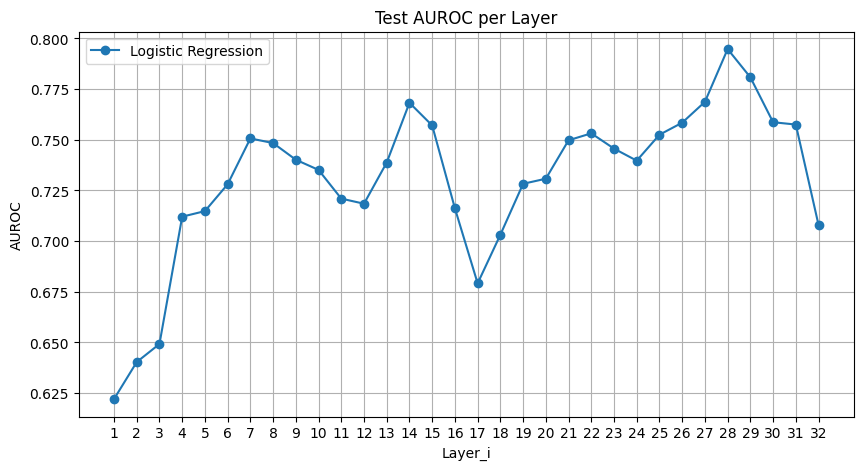

In [181]:
# Training Loops (LR)
slra_test_accs = []
slra_test_aucs = []

for i, (X_train, X_val, X_test, y_train, y_val, y_test) in enumerate(zip(d2a_X_trains, d2a_X_vals, d2a_X_tests, d2a_y_trains, d2a_y_vals, d2a_y_tests)):
    print(f"Training on D2 SLT Dataset {i+1}/{len(d2a_X_trains)}")
    model = LogisticRegression()
    sklearn_train_and_evaluate(model, X_train, y_train, X_val, y_val, binary_cls=True, title=f"Logistic Regression on D2 SLT Dataset {i+1}")
    test_loss, test_acc, test_auc = sklearn_evaluate_on_test(model, X_test, y_test, binary_cls=True)
    slra_test_accs.append(test_acc)
    slra_test_aucs.append(test_auc)

# plot_1d_metrics([slra_test_accs], ['Logistic Regression'], 'Accuracy')
plot_1d_metrics([slra_test_aucs], ['Logistic Regression'], 'AUROC')

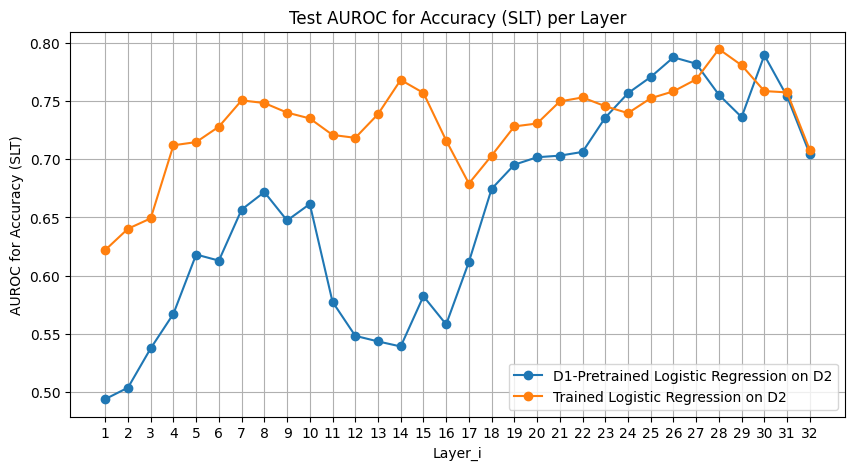

In [182]:
# Comparison with using pretrained model on D1 for prediction on D2
plot_1d_metrics([slr2a_test_aucs, slra_test_aucs], ['D1-Pretrained Logistic Regression on D2', 'Trained Logistic Regression on D2'], 'AUROC for Accuracy (SLT)')

Using device: cuda
Training on D2 SLT Dataset 1/32
Epoch 1/50, Training Loss: 96.2043, Validation Loss: 94.3815, Training Accuracy: 0.6813
Epoch 10/50, Training Loss: 95.4355, Validation Loss: 94.9113, Training Accuracy: 0.8764
Epoch 20/50, Training Loss: 94.8803, Validation Loss: 94.6024, Training Accuracy: 0.9069
Epoch 30/50, Training Loss: 94.6191, Validation Loss: 95.7280, Training Accuracy: 0.9222
Epoch 40/50, Training Loss: 94.3440, Validation Loss: 94.8689, Training Accuracy: 0.9444
Epoch 50/50, Training Loss: 94.2355, Validation Loss: 94.9200, Training Accuracy: 0.9431


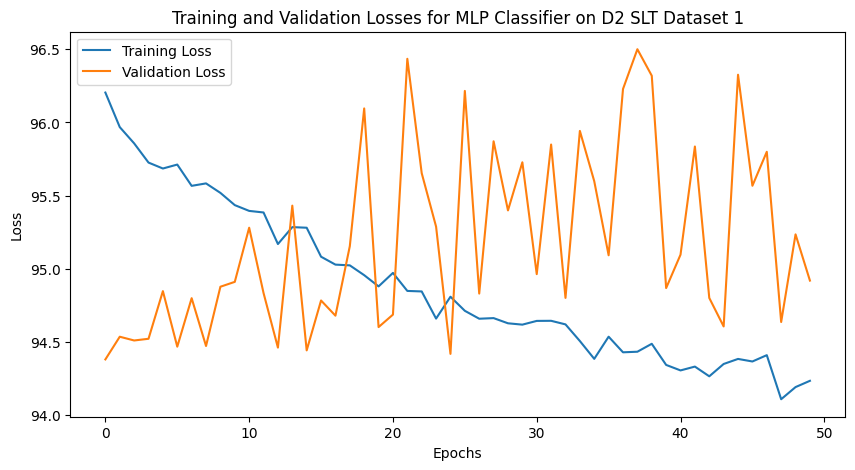

Test Loss: 79.5312, Test Accuracy: 0.7800, AUROC: 0.6357
Training on D2 SLT Dataset 2/32
Epoch 1/50, Training Loss: 96.1695, Validation Loss: 94.4025, Training Accuracy: 0.6493
Epoch 10/50, Training Loss: 95.4447, Validation Loss: 95.2064, Training Accuracy: 0.8701
Epoch 20/50, Training Loss: 94.8350, Validation Loss: 95.0267, Training Accuracy: 0.9083
Epoch 30/50, Training Loss: 94.5264, Validation Loss: 96.3014, Training Accuracy: 0.9278
Epoch 40/50, Training Loss: 94.2980, Validation Loss: 94.5787, Training Accuracy: 0.9451
Epoch 50/50, Training Loss: 94.1399, Validation Loss: 96.4054, Training Accuracy: 0.9542


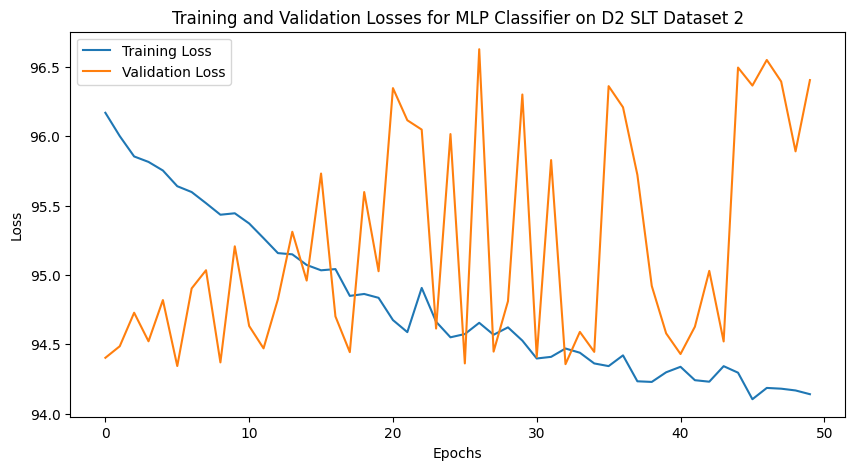

Test Loss: 80.4503, Test Accuracy: 0.5400, AUROC: 0.6392
Training on D2 SLT Dataset 3/32
Epoch 1/50, Training Loss: 96.1000, Validation Loss: 94.4336, Training Accuracy: 0.4924
Epoch 10/50, Training Loss: 95.4955, Validation Loss: 94.5917, Training Accuracy: 0.8139
Epoch 20/50, Training Loss: 94.6367, Validation Loss: 96.2929, Training Accuracy: 0.9181
Epoch 30/50, Training Loss: 94.2223, Validation Loss: 94.3731, Training Accuracy: 0.9465
Epoch 40/50, Training Loss: 94.1349, Validation Loss: 94.4923, Training Accuracy: 0.9528
Epoch 50/50, Training Loss: 94.1183, Validation Loss: 94.3825, Training Accuracy: 0.9583


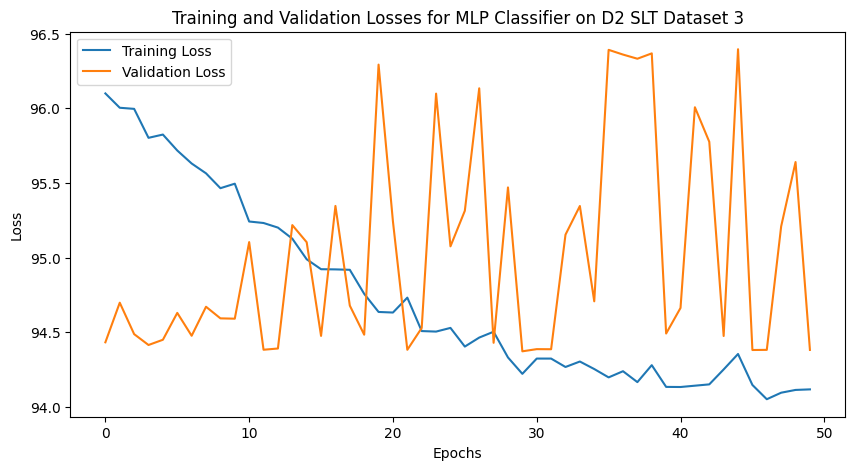

Test Loss: 79.2191, Test Accuracy: 0.8100, AUROC: 0.5258
Training on D2 SLT Dataset 4/32
Epoch 1/50, Training Loss: 96.1257, Validation Loss: 94.3646, Training Accuracy: 0.5208
Epoch 10/50, Training Loss: 95.1619, Validation Loss: 95.0994, Training Accuracy: 0.8806
Epoch 20/50, Training Loss: 94.4346, Validation Loss: 96.1765, Training Accuracy: 0.9347
Epoch 30/50, Training Loss: 94.2814, Validation Loss: 94.3831, Training Accuracy: 0.9479
Epoch 40/50, Training Loss: 94.0220, Validation Loss: 94.4333, Training Accuracy: 0.9639
Epoch 50/50, Training Loss: 93.9359, Validation Loss: 95.9838, Training Accuracy: 0.9639


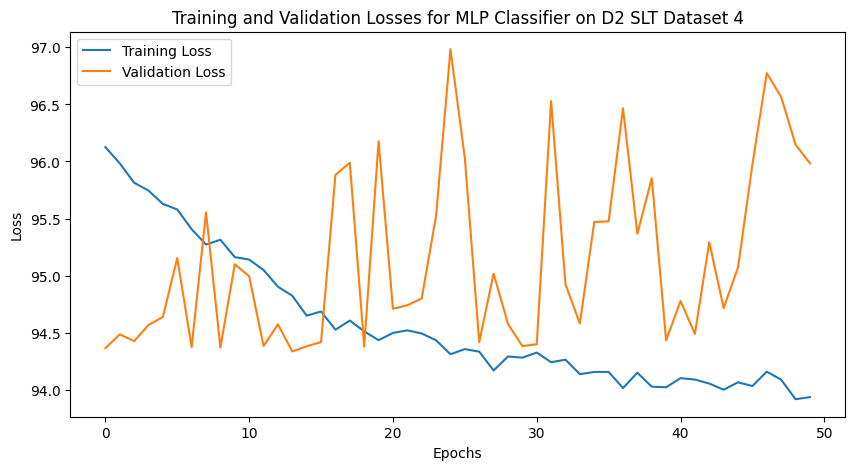

Test Loss: 80.2660, Test Accuracy: 0.6700, AUROC: 0.6372
Training on D2 SLT Dataset 5/32
Epoch 1/50, Training Loss: 96.1634, Validation Loss: 94.3841, Training Accuracy: 0.5208
Epoch 10/50, Training Loss: 94.6797, Validation Loss: 95.7834, Training Accuracy: 0.9160
Epoch 20/50, Training Loss: 94.0990, Validation Loss: 96.4410, Training Accuracy: 0.9590
Epoch 30/50, Training Loss: 93.8546, Validation Loss: 95.0998, Training Accuracy: 0.9743
Epoch 40/50, Training Loss: 93.8679, Validation Loss: 96.2566, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 93.8843, Validation Loss: 94.6210, Training Accuracy: 0.9701


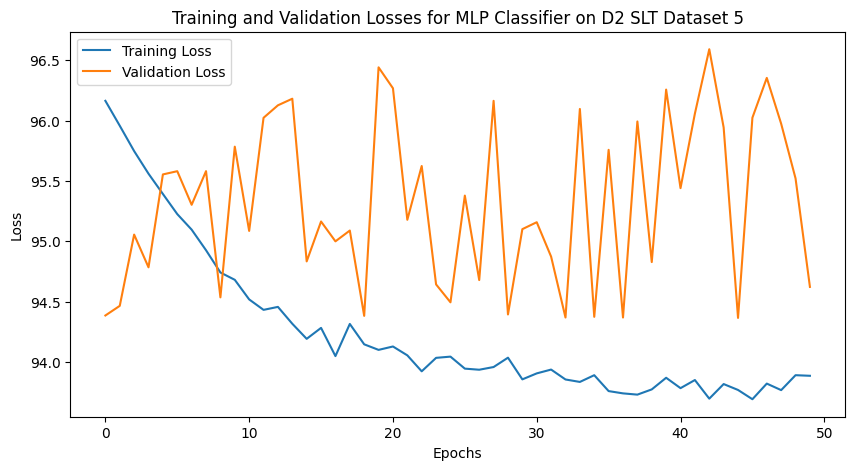

Test Loss: 79.1414, Test Accuracy: 0.8000, AUROC: 0.6276
Training on D2 SLT Dataset 6/32
Epoch 1/50, Training Loss: 96.2046, Validation Loss: 94.3435, Training Accuracy: 0.6431
Epoch 10/50, Training Loss: 94.5548, Validation Loss: 95.9728, Training Accuracy: 0.9264
Epoch 20/50, Training Loss: 93.9821, Validation Loss: 94.9599, Training Accuracy: 0.9618
Epoch 30/50, Training Loss: 93.9049, Validation Loss: 95.1127, Training Accuracy: 0.9688
Epoch 40/50, Training Loss: 93.7154, Validation Loss: 94.8757, Training Accuracy: 0.9826
Epoch 50/50, Training Loss: 93.7061, Validation Loss: 95.3458, Training Accuracy: 0.9826


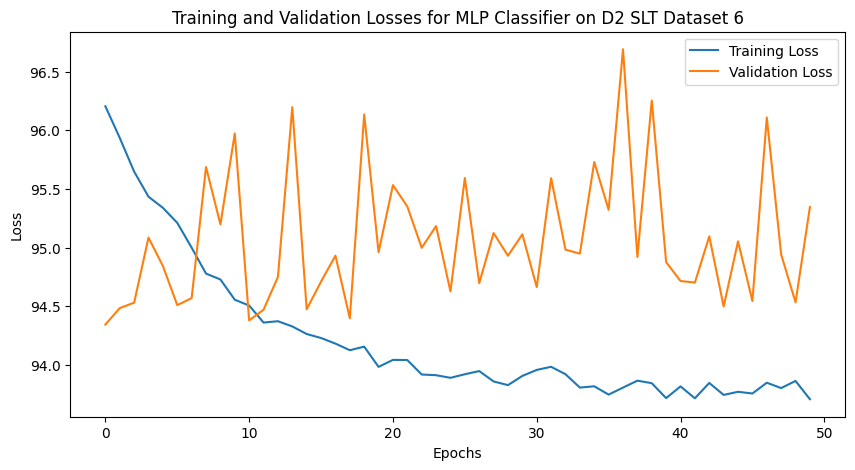

Test Loss: 79.7981, Test Accuracy: 0.7250, AUROC: 0.6232
Training on D2 SLT Dataset 7/32
Epoch 1/50, Training Loss: 96.0068, Validation Loss: 94.5001, Training Accuracy: 0.4167
Epoch 10/50, Training Loss: 94.7644, Validation Loss: 94.7315, Training Accuracy: 0.9028
Epoch 20/50, Training Loss: 94.0976, Validation Loss: 95.0025, Training Accuracy: 0.9535
Epoch 30/50, Training Loss: 93.8875, Validation Loss: 94.8422, Training Accuracy: 0.9729
Epoch 40/50, Training Loss: 93.9738, Validation Loss: 95.0100, Training Accuracy: 0.9625
Epoch 50/50, Training Loss: 93.7131, Validation Loss: 95.0559, Training Accuracy: 0.9812


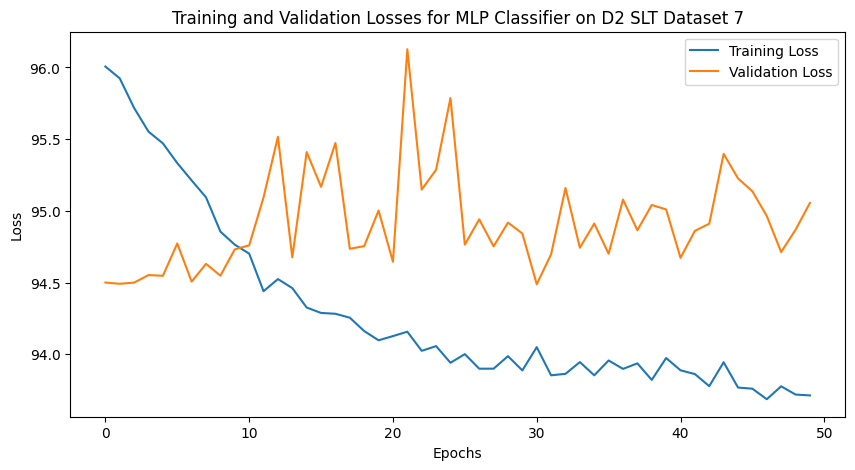

Test Loss: 79.8231, Test Accuracy: 0.7350, AUROC: 0.6891
Training on D2 SLT Dataset 8/32
Epoch 1/50, Training Loss: 96.0811, Validation Loss: 94.5451, Training Accuracy: 0.4736
Epoch 10/50, Training Loss: 94.7154, Validation Loss: 94.9155, Training Accuracy: 0.9090
Epoch 20/50, Training Loss: 93.9931, Validation Loss: 95.3029, Training Accuracy: 0.9632
Epoch 30/50, Training Loss: 93.9154, Validation Loss: 94.5700, Training Accuracy: 0.9667
Epoch 40/50, Training Loss: 93.8677, Validation Loss: 95.4840, Training Accuracy: 0.9708
Epoch 50/50, Training Loss: 93.8822, Validation Loss: 95.4088, Training Accuracy: 0.9701


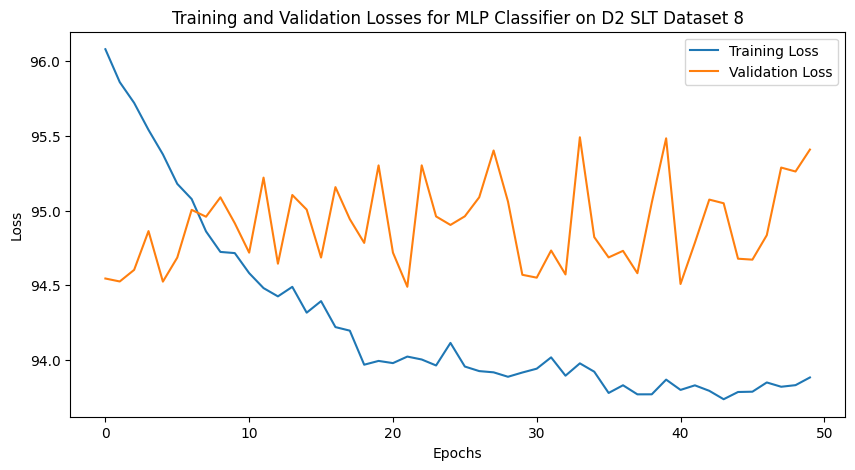

Test Loss: 79.7460, Test Accuracy: 0.7400, AUROC: 0.6715
Training on D2 SLT Dataset 9/32
Epoch 1/50, Training Loss: 96.1707, Validation Loss: 94.4981, Training Accuracy: 0.3750
Epoch 10/50, Training Loss: 94.8414, Validation Loss: 94.6016, Training Accuracy: 0.8951
Epoch 20/50, Training Loss: 94.1113, Validation Loss: 94.5537, Training Accuracy: 0.9556
Epoch 30/50, Training Loss: 93.8684, Validation Loss: 95.0733, Training Accuracy: 0.9722
Epoch 40/50, Training Loss: 93.7222, Validation Loss: 94.9860, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 93.7265, Validation Loss: 94.8534, Training Accuracy: 0.9826


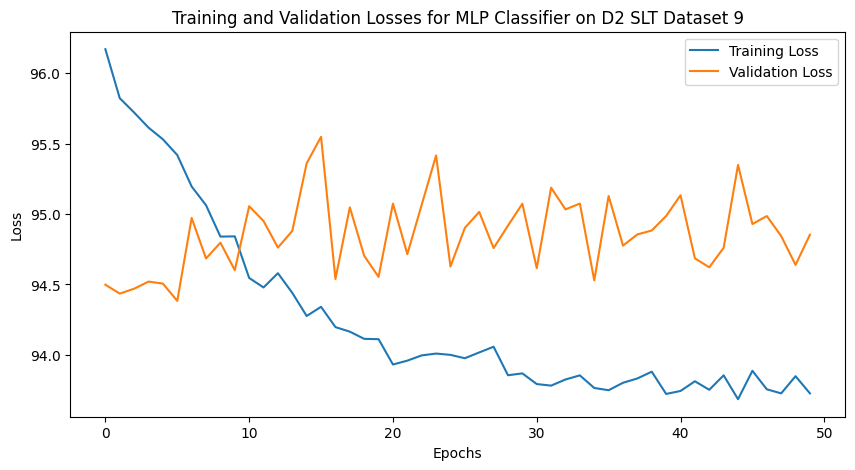

Test Loss: 79.5924, Test Accuracy: 0.7550, AUROC: 0.6739
Training on D2 SLT Dataset 10/32
Epoch 1/50, Training Loss: 96.1475, Validation Loss: 94.5703, Training Accuracy: 0.5708
Epoch 10/50, Training Loss: 94.5899, Validation Loss: 94.9046, Training Accuracy: 0.9167
Epoch 20/50, Training Loss: 94.0380, Validation Loss: 94.6945, Training Accuracy: 0.9597
Epoch 30/50, Training Loss: 93.9607, Validation Loss: 94.9599, Training Accuracy: 0.9639
Epoch 40/50, Training Loss: 93.8169, Validation Loss: 95.2710, Training Accuracy: 0.9743
Epoch 50/50, Training Loss: 93.6835, Validation Loss: 95.0687, Training Accuracy: 0.9847


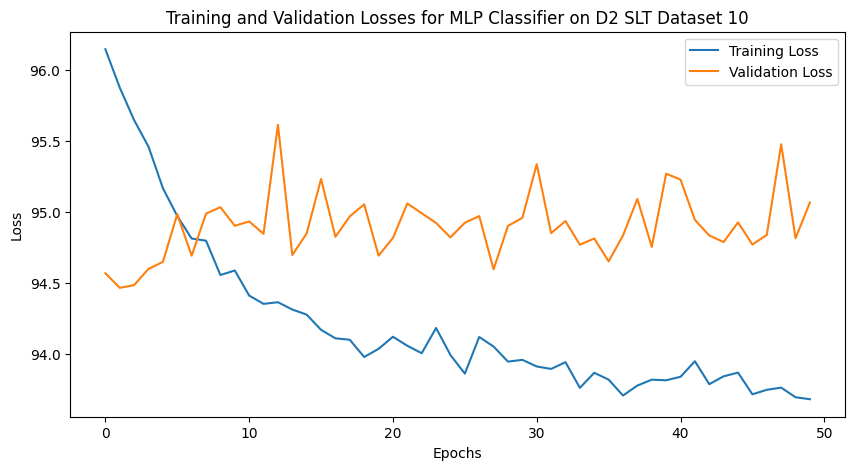

Test Loss: 79.1730, Test Accuracy: 0.7950, AUROC: 0.6949
Training on D2 SLT Dataset 11/32
Epoch 1/50, Training Loss: 96.1369, Validation Loss: 94.6911, Training Accuracy: 0.4181
Epoch 10/50, Training Loss: 94.5137, Validation Loss: 95.0598, Training Accuracy: 0.9243
Epoch 20/50, Training Loss: 94.1785, Validation Loss: 95.0975, Training Accuracy: 0.9403
Epoch 30/50, Training Loss: 93.8185, Validation Loss: 94.9055, Training Accuracy: 0.9785
Epoch 40/50, Training Loss: 93.8330, Validation Loss: 94.8112, Training Accuracy: 0.9736
Epoch 50/50, Training Loss: 93.7705, Validation Loss: 95.1141, Training Accuracy: 0.9778


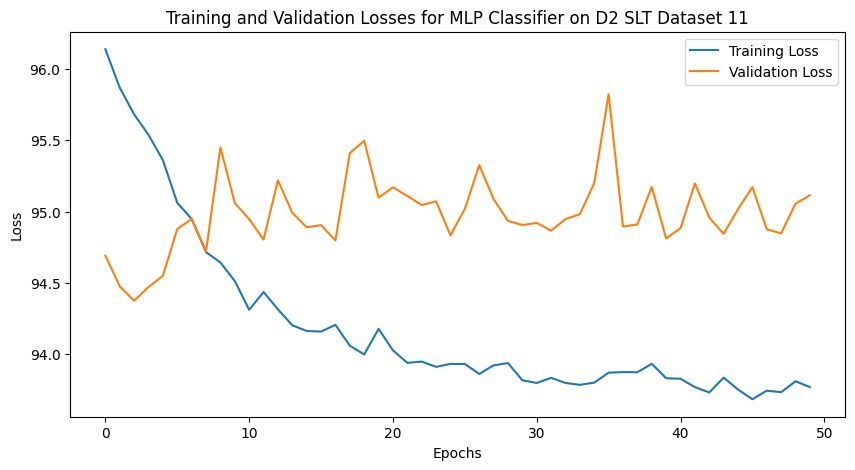

Test Loss: 78.9189, Test Accuracy: 0.8150, AUROC: 0.7740
Training on D2 SLT Dataset 12/32
Epoch 1/50, Training Loss: 96.1064, Validation Loss: 94.6336, Training Accuracy: 0.6042
Epoch 10/50, Training Loss: 94.3431, Validation Loss: 94.6016, Training Accuracy: 0.9472
Epoch 20/50, Training Loss: 94.1018, Validation Loss: 94.8473, Training Accuracy: 0.9625
Epoch 30/50, Training Loss: 93.7680, Validation Loss: 94.7708, Training Accuracy: 0.9771
Epoch 40/50, Training Loss: 93.8151, Validation Loss: 94.7081, Training Accuracy: 0.9764
Epoch 50/50, Training Loss: 93.6539, Validation Loss: 94.8616, Training Accuracy: 0.9854


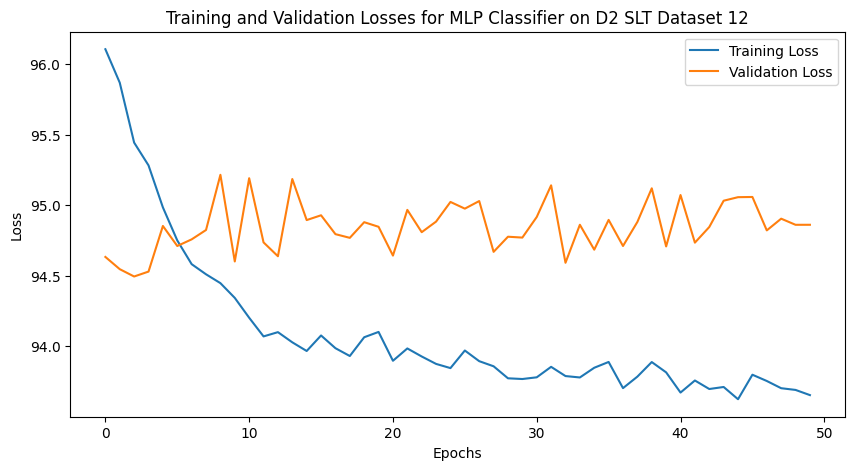

Test Loss: 79.2008, Test Accuracy: 0.8000, AUROC: 0.6949
Training on D2 SLT Dataset 13/32
Epoch 1/50, Training Loss: 96.0486, Validation Loss: 94.5196, Training Accuracy: 0.6368
Epoch 10/50, Training Loss: 94.2326, Validation Loss: 94.9454, Training Accuracy: 0.9458
Epoch 20/50, Training Loss: 93.9388, Validation Loss: 94.9832, Training Accuracy: 0.9639
Epoch 30/50, Training Loss: 93.9047, Validation Loss: 94.7809, Training Accuracy: 0.9694
Epoch 40/50, Training Loss: 93.8270, Validation Loss: 94.9773, Training Accuracy: 0.9715
Epoch 50/50, Training Loss: 93.7162, Validation Loss: 95.1749, Training Accuracy: 0.9792


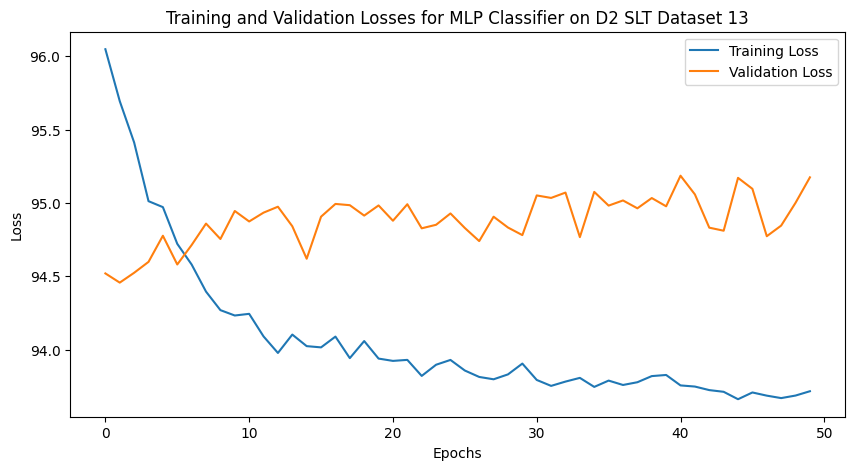

Test Loss: 79.4953, Test Accuracy: 0.7600, AUROC: 0.6977
Training on D2 SLT Dataset 14/32
Epoch 1/50, Training Loss: 96.0336, Validation Loss: 94.4161, Training Accuracy: 0.7021
Epoch 10/50, Training Loss: 94.2264, Validation Loss: 94.8753, Training Accuracy: 0.9444
Epoch 20/50, Training Loss: 93.9414, Validation Loss: 95.0193, Training Accuracy: 0.9653
Epoch 30/50, Training Loss: 93.7894, Validation Loss: 94.6666, Training Accuracy: 0.9750
Epoch 40/50, Training Loss: 93.6739, Validation Loss: 94.6747, Training Accuracy: 0.9882
Epoch 50/50, Training Loss: 93.7617, Validation Loss: 94.6832, Training Accuracy: 0.9812


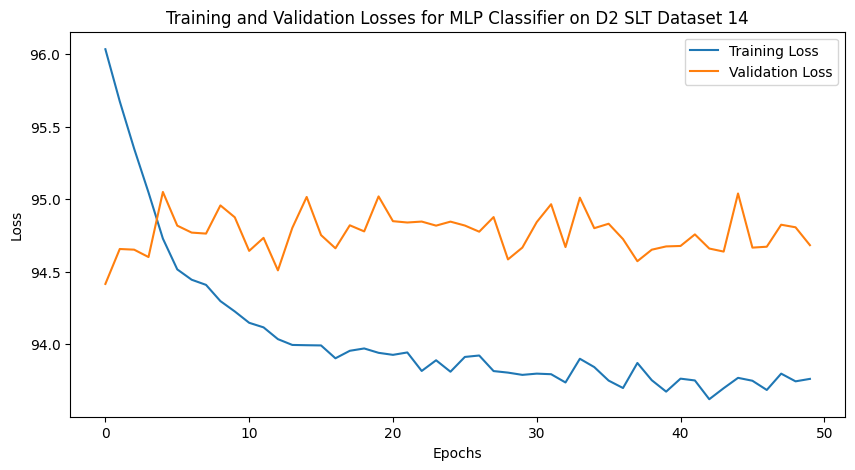

Test Loss: 79.0973, Test Accuracy: 0.8000, AUROC: 0.7247
Training on D2 SLT Dataset 15/32
Epoch 1/50, Training Loss: 96.1507, Validation Loss: 94.5691, Training Accuracy: 0.6139
Epoch 10/50, Training Loss: 94.1648, Validation Loss: 94.7452, Training Accuracy: 0.9465
Epoch 20/50, Training Loss: 93.8462, Validation Loss: 95.0209, Training Accuracy: 0.9708
Epoch 30/50, Training Loss: 93.7587, Validation Loss: 94.8883, Training Accuracy: 0.9812
Epoch 40/50, Training Loss: 93.7323, Validation Loss: 94.6119, Training Accuracy: 0.9792
Epoch 50/50, Training Loss: 93.7106, Validation Loss: 95.0011, Training Accuracy: 0.9812


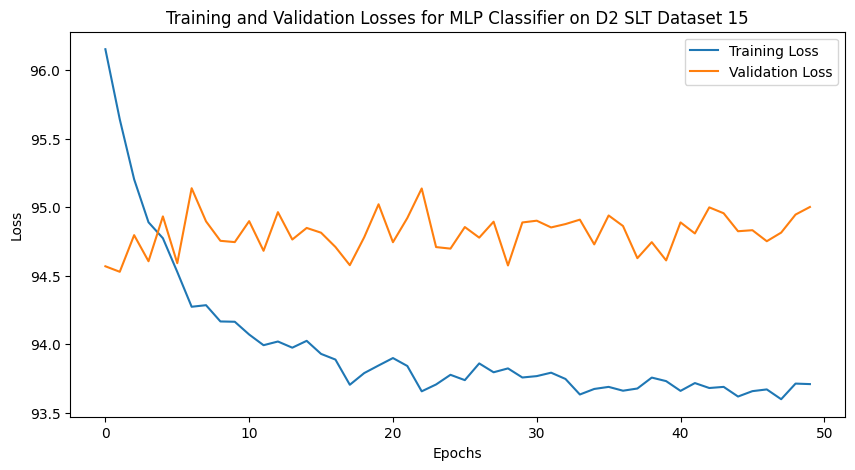

Test Loss: 79.2574, Test Accuracy: 0.7850, AUROC: 0.7178
Training on D2 SLT Dataset 16/32
Epoch 1/50, Training Loss: 96.0782, Validation Loss: 94.4559, Training Accuracy: 0.5340
Epoch 10/50, Training Loss: 94.1376, Validation Loss: 94.8565, Training Accuracy: 0.9521
Epoch 20/50, Training Loss: 93.7635, Validation Loss: 95.1095, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.6512, Validation Loss: 94.7274, Training Accuracy: 0.9882
Epoch 40/50, Training Loss: 93.6593, Validation Loss: 94.5809, Training Accuracy: 0.9854
Epoch 50/50, Training Loss: 93.6042, Validation Loss: 94.6735, Training Accuracy: 0.9910


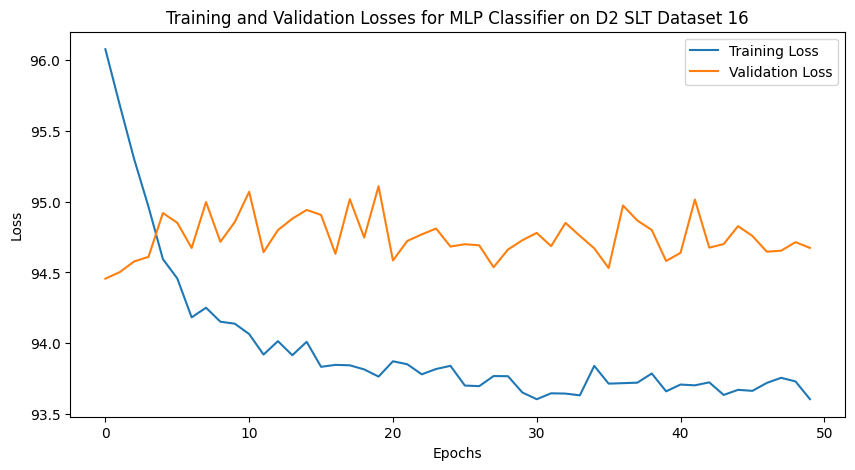

Test Loss: 79.4480, Test Accuracy: 0.7650, AUROC: 0.7101
Training on D2 SLT Dataset 17/32
Epoch 1/50, Training Loss: 96.1317, Validation Loss: 94.8219, Training Accuracy: 0.6069
Epoch 10/50, Training Loss: 93.9502, Validation Loss: 94.8049, Training Accuracy: 0.9632
Epoch 20/50, Training Loss: 93.8226, Validation Loss: 94.8709, Training Accuracy: 0.9729
Epoch 30/50, Training Loss: 93.6972, Validation Loss: 94.7967, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 93.6653, Validation Loss: 94.7174, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.6685, Validation Loss: 94.6525, Training Accuracy: 0.9840


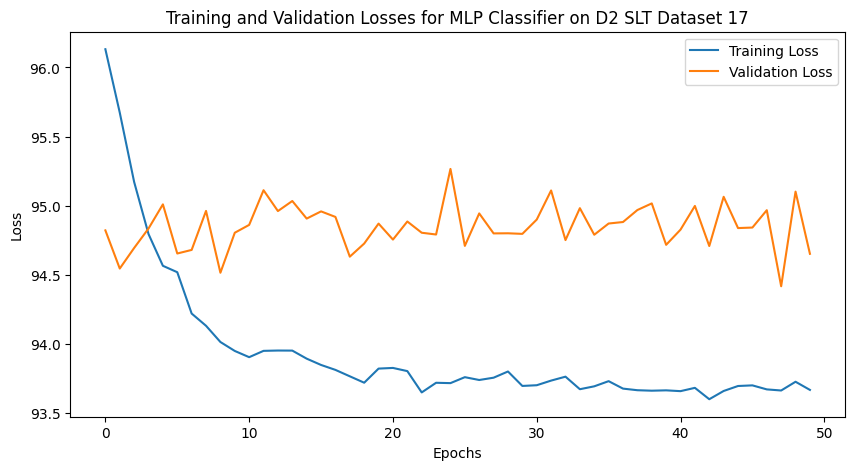

Test Loss: 79.1705, Test Accuracy: 0.7900, AUROC: 0.7460
Training on D2 SLT Dataset 18/32
Epoch 1/50, Training Loss: 96.1949, Validation Loss: 94.5000, Training Accuracy: 0.4750
Epoch 10/50, Training Loss: 94.0830, Validation Loss: 94.9072, Training Accuracy: 0.9549
Epoch 20/50, Training Loss: 93.8168, Validation Loss: 94.8538, Training Accuracy: 0.9736
Epoch 30/50, Training Loss: 93.6330, Validation Loss: 94.6412, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 93.6025, Validation Loss: 95.1189, Training Accuracy: 0.9896
Epoch 50/50, Training Loss: 93.6161, Validation Loss: 94.7204, Training Accuracy: 0.9882


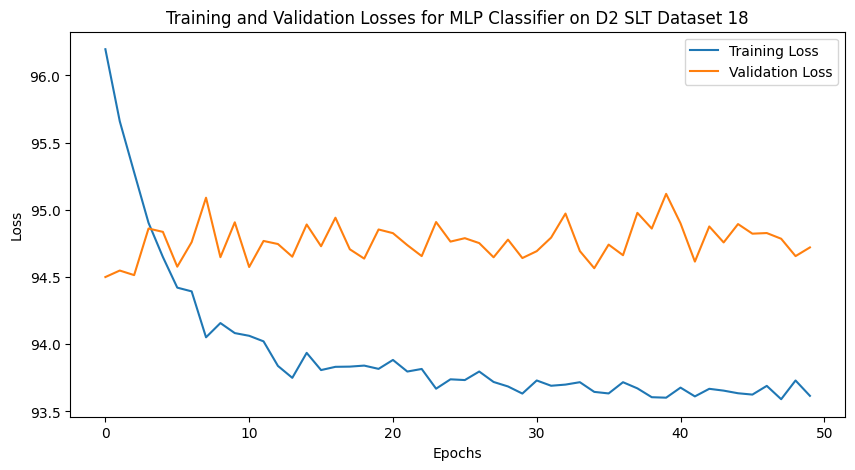

Test Loss: 79.4003, Test Accuracy: 0.7800, AUROC: 0.6873
Training on D2 SLT Dataset 19/32
Epoch 1/50, Training Loss: 96.1515, Validation Loss: 94.6000, Training Accuracy: 0.5535
Epoch 10/50, Training Loss: 94.0980, Validation Loss: 94.7278, Training Accuracy: 0.9507
Epoch 20/50, Training Loss: 93.8388, Validation Loss: 94.8939, Training Accuracy: 0.9729
Epoch 30/50, Training Loss: 93.6457, Validation Loss: 95.2445, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 93.6201, Validation Loss: 94.9707, Training Accuracy: 0.9882
Epoch 50/50, Training Loss: 93.6453, Validation Loss: 94.8998, Training Accuracy: 0.9854


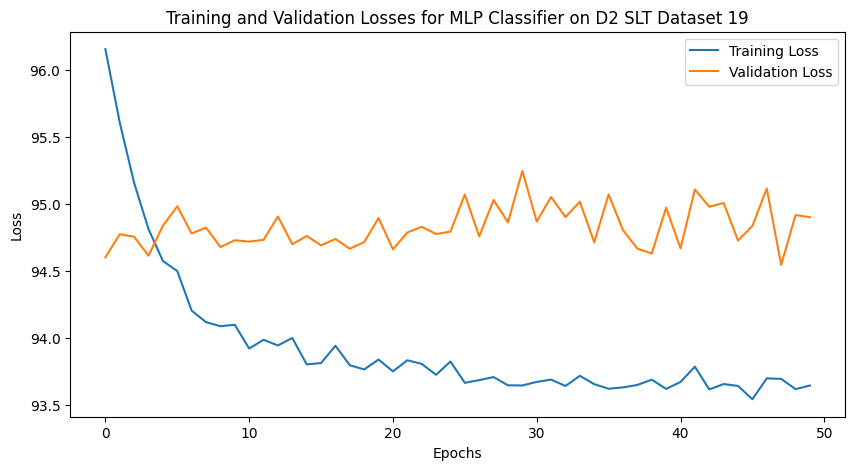

Test Loss: 79.2985, Test Accuracy: 0.7750, AUROC: 0.6902
Training on D2 SLT Dataset 20/32
Epoch 1/50, Training Loss: 96.1215, Validation Loss: 94.5667, Training Accuracy: 0.5062
Epoch 10/50, Training Loss: 94.1217, Validation Loss: 94.7766, Training Accuracy: 0.9556
Epoch 20/50, Training Loss: 93.8803, Validation Loss: 94.6346, Training Accuracy: 0.9708
Epoch 30/50, Training Loss: 93.6886, Validation Loss: 94.8363, Training Accuracy: 0.9847
Epoch 40/50, Training Loss: 93.7263, Validation Loss: 94.7985, Training Accuracy: 0.9812
Epoch 50/50, Training Loss: 93.6484, Validation Loss: 95.1158, Training Accuracy: 0.9889


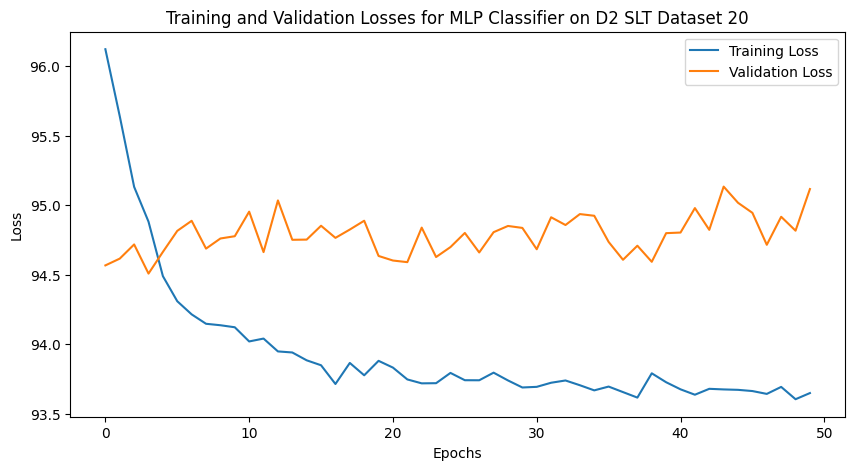

Test Loss: 79.3099, Test Accuracy: 0.7850, AUROC: 0.6984
Training on D2 SLT Dataset 21/32
Epoch 1/50, Training Loss: 96.1063, Validation Loss: 94.7996, Training Accuracy: 0.6715
Epoch 10/50, Training Loss: 94.1517, Validation Loss: 95.0740, Training Accuracy: 0.9500
Epoch 20/50, Training Loss: 93.9013, Validation Loss: 94.6635, Training Accuracy: 0.9694
Epoch 30/50, Training Loss: 93.7172, Validation Loss: 94.5002, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 93.7061, Validation Loss: 94.7076, Training Accuracy: 0.9806
Epoch 50/50, Training Loss: 93.6776, Validation Loss: 94.7168, Training Accuracy: 0.9854


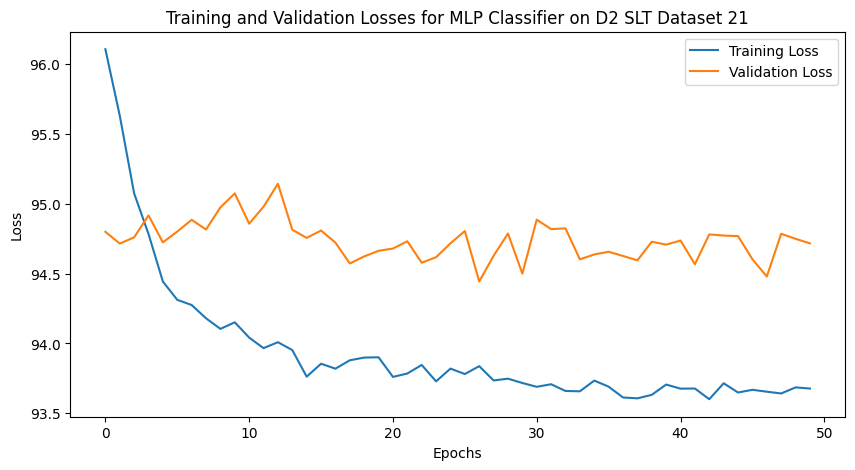

Test Loss: 79.3959, Test Accuracy: 0.7800, AUROC: 0.6986
Training on D2 SLT Dataset 22/32
Epoch 1/50, Training Loss: 96.2158, Validation Loss: 94.6767, Training Accuracy: 0.6278
Epoch 10/50, Training Loss: 93.9150, Validation Loss: 94.5716, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 93.8153, Validation Loss: 94.7736, Training Accuracy: 0.9715
Epoch 30/50, Training Loss: 93.8032, Validation Loss: 94.6071, Training Accuracy: 0.9792
Epoch 40/50, Training Loss: 93.7072, Validation Loss: 94.6344, Training Accuracy: 0.9812
Epoch 50/50, Training Loss: 93.6741, Validation Loss: 94.8840, Training Accuracy: 0.9833


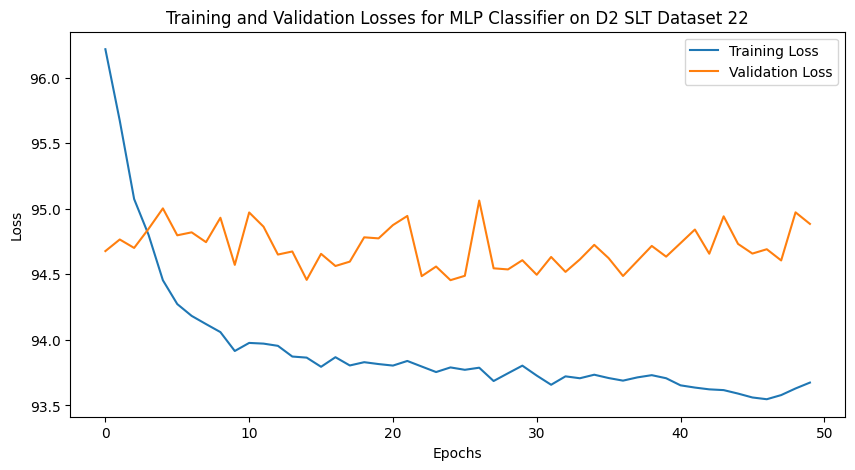

Test Loss: 79.5244, Test Accuracy: 0.7700, AUROC: 0.6645
Training on D2 SLT Dataset 23/32
Epoch 1/50, Training Loss: 96.2080, Validation Loss: 94.5848, Training Accuracy: 0.4764
Epoch 10/50, Training Loss: 93.9498, Validation Loss: 94.7436, Training Accuracy: 0.9646
Epoch 20/50, Training Loss: 93.8412, Validation Loss: 94.7909, Training Accuracy: 0.9701
Epoch 30/50, Training Loss: 93.7369, Validation Loss: 94.6066, Training Accuracy: 0.9799
Epoch 40/50, Training Loss: 93.6417, Validation Loss: 94.7689, Training Accuracy: 0.9861
Epoch 50/50, Training Loss: 93.6803, Validation Loss: 94.6397, Training Accuracy: 0.9833


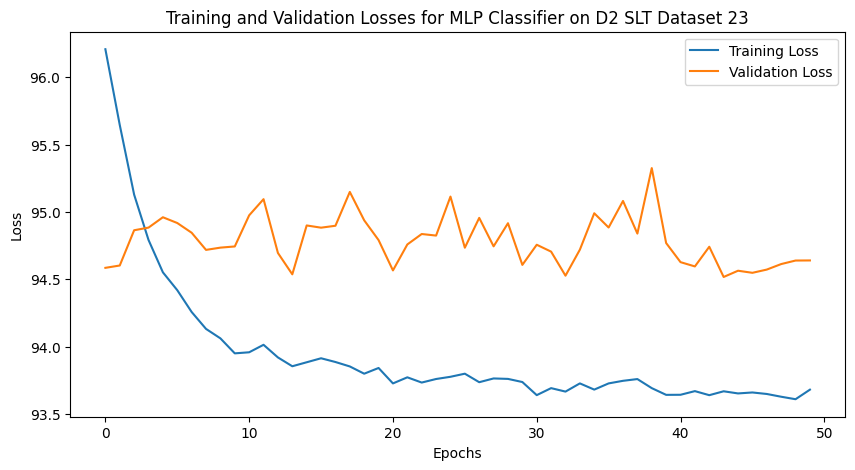

Test Loss: 79.3959, Test Accuracy: 0.7900, AUROC: 0.6855
Training on D2 SLT Dataset 24/32
Epoch 1/50, Training Loss: 96.0947, Validation Loss: 94.6441, Training Accuracy: 0.5771
Epoch 10/50, Training Loss: 94.0348, Validation Loss: 94.7035, Training Accuracy: 0.9583
Epoch 20/50, Training Loss: 93.8117, Validation Loss: 94.8485, Training Accuracy: 0.9715
Epoch 30/50, Training Loss: 93.7139, Validation Loss: 94.6102, Training Accuracy: 0.9792
Epoch 40/50, Training Loss: 93.6550, Validation Loss: 94.6904, Training Accuracy: 0.9875
Epoch 50/50, Training Loss: 93.6642, Validation Loss: 94.8828, Training Accuracy: 0.9882


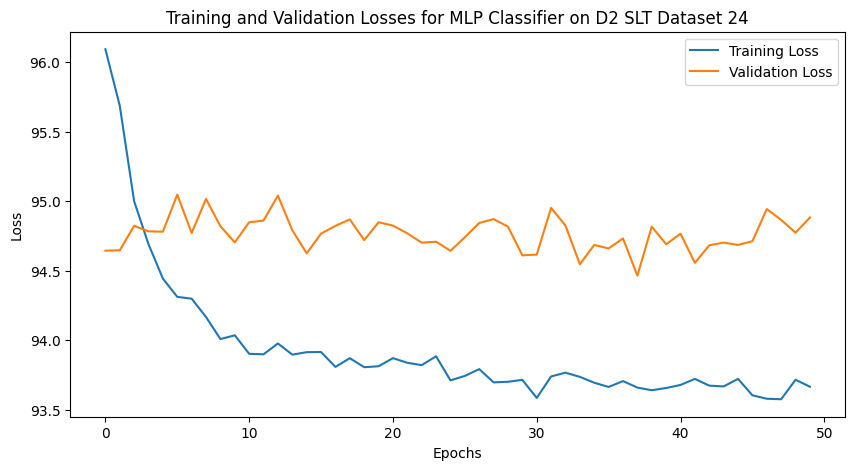

Test Loss: 79.3740, Test Accuracy: 0.7900, AUROC: 0.6776
Training on D2 SLT Dataset 25/32
Epoch 1/50, Training Loss: 96.1374, Validation Loss: 94.7010, Training Accuracy: 0.5257
Epoch 10/50, Training Loss: 94.0111, Validation Loss: 94.8229, Training Accuracy: 0.9639
Epoch 20/50, Training Loss: 93.7861, Validation Loss: 94.8266, Training Accuracy: 0.9778
Epoch 30/50, Training Loss: 93.7421, Validation Loss: 94.7026, Training Accuracy: 0.9826
Epoch 40/50, Training Loss: 93.6904, Validation Loss: 94.8700, Training Accuracy: 0.9826
Epoch 50/50, Training Loss: 93.5530, Validation Loss: 94.7344, Training Accuracy: 0.9931


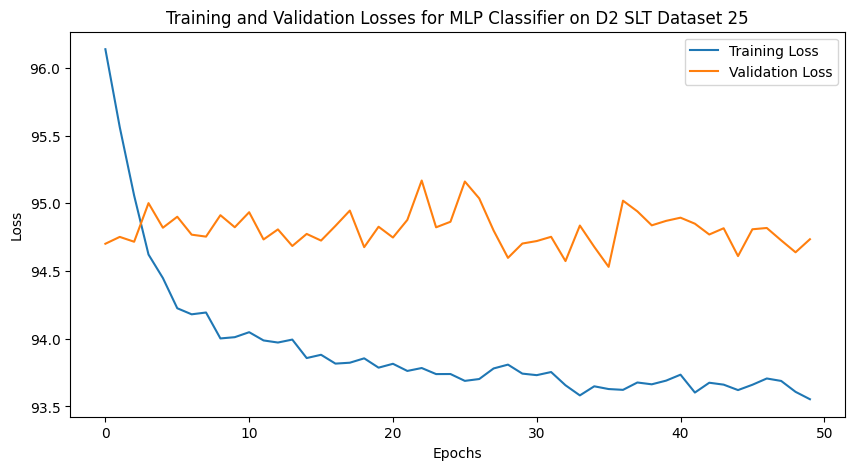

Test Loss: 79.3808, Test Accuracy: 0.7750, AUROC: 0.7383
Training on D2 SLT Dataset 26/32
Epoch 1/50, Training Loss: 96.0761, Validation Loss: 94.5406, Training Accuracy: 0.6854
Epoch 10/50, Training Loss: 94.1045, Validation Loss: 94.5847, Training Accuracy: 0.9528
Epoch 20/50, Training Loss: 93.7231, Validation Loss: 94.6605, Training Accuracy: 0.9778
Epoch 30/50, Training Loss: 93.6338, Validation Loss: 94.9109, Training Accuracy: 0.9868
Epoch 40/50, Training Loss: 93.7024, Validation Loss: 94.6907, Training Accuracy: 0.9812
Epoch 50/50, Training Loss: 93.6091, Validation Loss: 95.0067, Training Accuracy: 0.9903


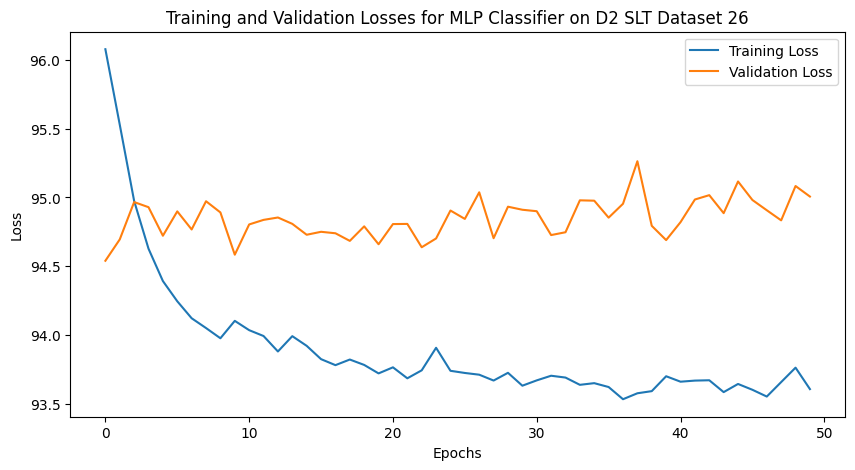

Test Loss: 79.5948, Test Accuracy: 0.7650, AUROC: 0.6624
Training on D2 SLT Dataset 27/32
Epoch 1/50, Training Loss: 96.1358, Validation Loss: 94.5004, Training Accuracy: 0.4028
Epoch 10/50, Training Loss: 93.9944, Validation Loss: 94.5904, Training Accuracy: 0.9639
Epoch 20/50, Training Loss: 93.7200, Validation Loss: 94.9590, Training Accuracy: 0.9785
Epoch 30/50, Training Loss: 93.8234, Validation Loss: 94.8541, Training Accuracy: 0.9743
Epoch 40/50, Training Loss: 93.6286, Validation Loss: 94.8219, Training Accuracy: 0.9889
Epoch 50/50, Training Loss: 93.6215, Validation Loss: 94.7191, Training Accuracy: 0.9882


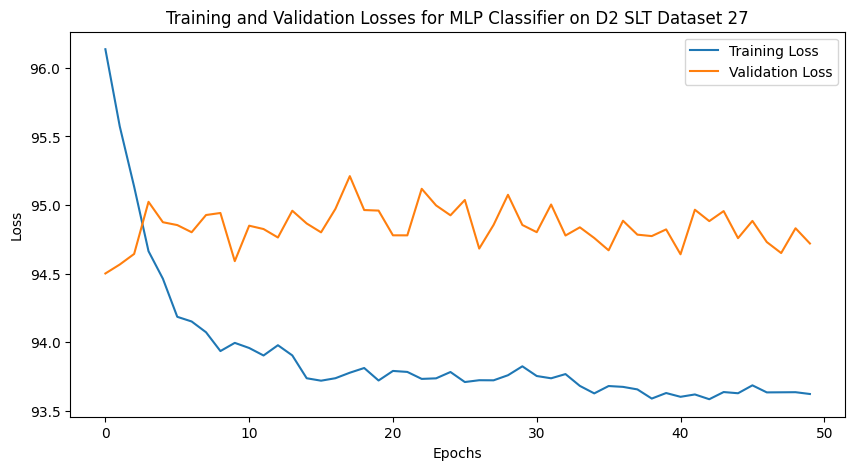

Test Loss: 79.6841, Test Accuracy: 0.7600, AUROC: 0.6407
Training on D2 SLT Dataset 28/32
Epoch 1/50, Training Loss: 96.1062, Validation Loss: 94.5537, Training Accuracy: 0.7278
Epoch 10/50, Training Loss: 94.0141, Validation Loss: 94.6292, Training Accuracy: 0.9597
Epoch 20/50, Training Loss: 93.7654, Validation Loss: 94.7213, Training Accuracy: 0.9750
Epoch 30/50, Training Loss: 93.6506, Validation Loss: 94.7835, Training Accuracy: 0.9875
Epoch 40/50, Training Loss: 93.6761, Validation Loss: 94.7524, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.6235, Validation Loss: 94.6644, Training Accuracy: 0.9882


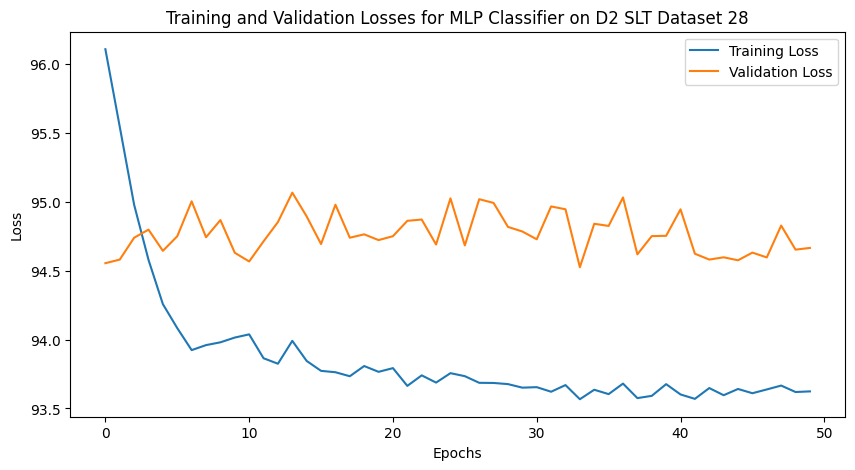

Test Loss: 79.4500, Test Accuracy: 0.7850, AUROC: 0.6664
Training on D2 SLT Dataset 29/32
Epoch 1/50, Training Loss: 96.1990, Validation Loss: 94.5102, Training Accuracy: 0.5736
Epoch 10/50, Training Loss: 93.9335, Validation Loss: 94.7433, Training Accuracy: 0.9632
Epoch 20/50, Training Loss: 93.6739, Validation Loss: 94.7198, Training Accuracy: 0.9854
Epoch 30/50, Training Loss: 93.7041, Validation Loss: 94.7444, Training Accuracy: 0.9854
Epoch 40/50, Training Loss: 93.6536, Validation Loss: 94.8630, Training Accuracy: 0.9868
Epoch 50/50, Training Loss: 93.6326, Validation Loss: 94.8079, Training Accuracy: 0.9882


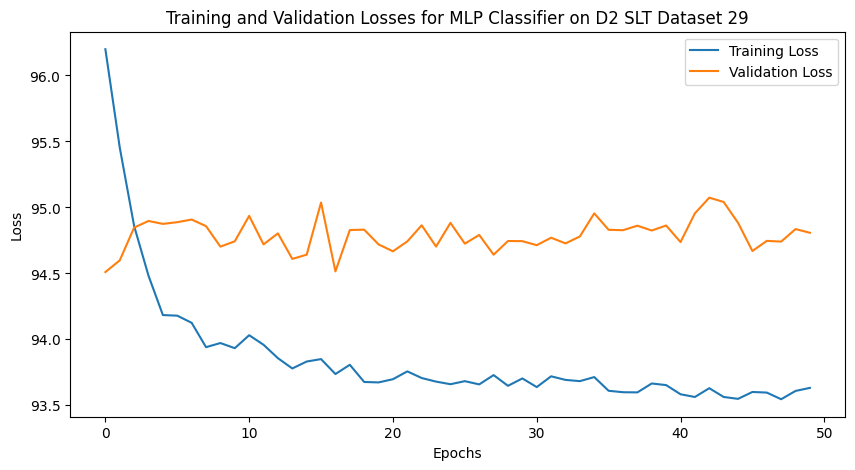

Test Loss: 79.3622, Test Accuracy: 0.7900, AUROC: 0.6767
Training on D2 SLT Dataset 30/32
Epoch 1/50, Training Loss: 96.1436, Validation Loss: 94.7751, Training Accuracy: 0.5611
Epoch 10/50, Training Loss: 93.9100, Validation Loss: 94.7588, Training Accuracy: 0.9674
Epoch 20/50, Training Loss: 93.7677, Validation Loss: 94.6576, Training Accuracy: 0.9750
Epoch 30/50, Training Loss: 93.6883, Validation Loss: 94.8158, Training Accuracy: 0.9819
Epoch 40/50, Training Loss: 93.6070, Validation Loss: 94.6157, Training Accuracy: 0.9924
Epoch 50/50, Training Loss: 93.5723, Validation Loss: 94.6876, Training Accuracy: 0.9917


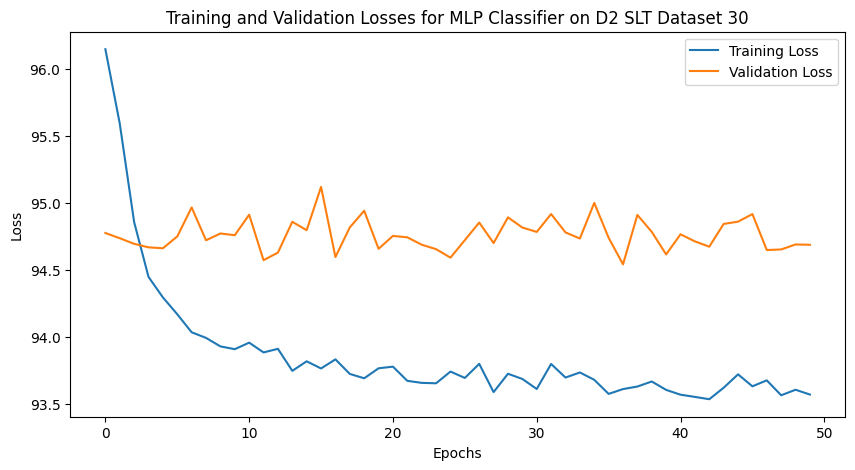

Test Loss: 79.5489, Test Accuracy: 0.7700, AUROC: 0.6451
Training on D2 SLT Dataset 31/32
Epoch 1/50, Training Loss: 96.1113, Validation Loss: 94.6430, Training Accuracy: 0.5674
Epoch 10/50, Training Loss: 93.9596, Validation Loss: 95.1860, Training Accuracy: 0.9646
Epoch 20/50, Training Loss: 93.7387, Validation Loss: 94.8202, Training Accuracy: 0.9812
Epoch 30/50, Training Loss: 93.6773, Validation Loss: 95.0092, Training Accuracy: 0.9840
Epoch 40/50, Training Loss: 93.6139, Validation Loss: 94.7451, Training Accuracy: 0.9889
Epoch 50/50, Training Loss: 93.5823, Validation Loss: 94.9297, Training Accuracy: 0.9903


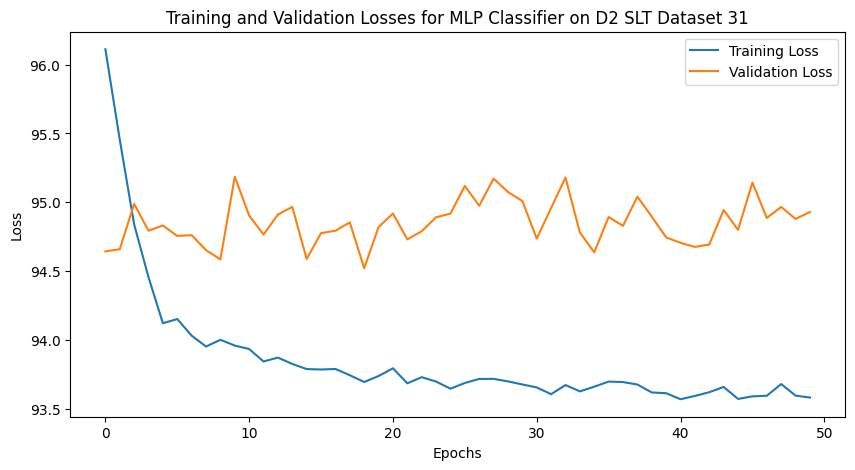

Test Loss: 79.2363, Test Accuracy: 0.7950, AUROC: 0.6138
Training on D2 SLT Dataset 32/32
Epoch 1/50, Training Loss: 96.0188, Validation Loss: 94.6536, Training Accuracy: 0.6139
Epoch 10/50, Training Loss: 94.1526, Validation Loss: 94.6575, Training Accuracy: 0.9521
Epoch 20/50, Training Loss: 93.8121, Validation Loss: 94.9587, Training Accuracy: 0.9771
Epoch 30/50, Training Loss: 93.6003, Validation Loss: 94.8725, Training Accuracy: 0.9917
Epoch 40/50, Training Loss: 93.7303, Validation Loss: 94.8958, Training Accuracy: 0.9799
Epoch 50/50, Training Loss: 93.6075, Validation Loss: 94.8207, Training Accuracy: 0.9896


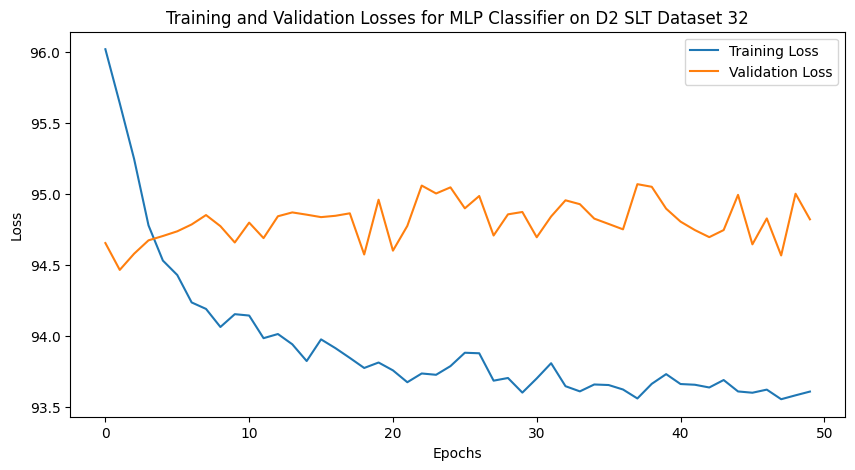

Test Loss: 79.3473, Test Accuracy: 0.7950, AUROC: 0.6647


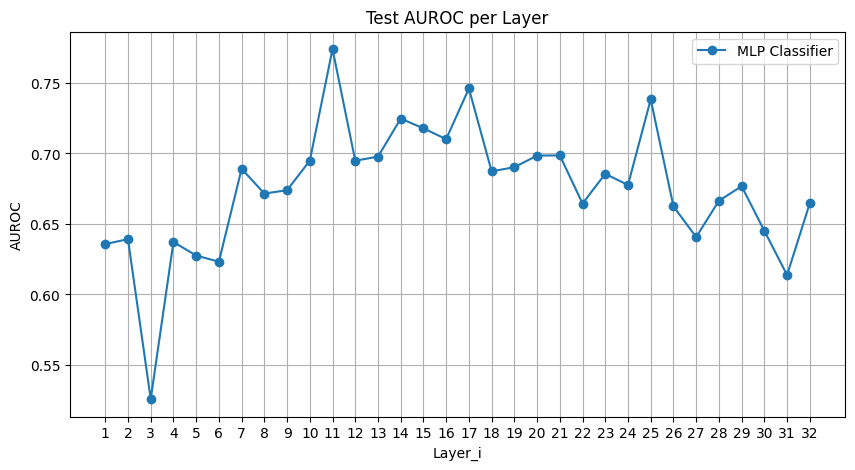

In [185]:
# Training with MLP.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

in_dim = 4096   # Token embedding dimensions
hid_dims = [2048, 1024, 512]
out_dim = 1    # Output dimension (scalar for semantic entropy)
dropout = 0.5  # Dropout rate

epochs = 50
smlpa_test_accs = []
smlpa_test_aucs = []

for i, (train_loader, valid_loader, test_loader) in enumerate(zip(d2a_slt_train_dataloaders, d2a_slt_valid_dataloaders, d2a_slt_test_dataloaders)):
    print(f"Training on D2 SLT Dataset {i+1}/{len(d2a_slt_train_dataloaders)}")
    model = MLPClassifier(in_dim, hid_dims, dropout)
    train_and_evaluate(model, train_loader, valid_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True,
                                                    epochs=epochs, title=f"MLP Classifier on D2 SLT Dataset {i+1}", silent=False)
    test_loss, test_acc, test_auc = evaluate_on_test(model, test_loader, device, criterion=nn.CrossEntropyLoss(), binary_cls=True)
    smlpa_test_accs.append(test_acc)
    smlpa_test_aucs.append(test_auc)

# plot_1d_metrics([smlpa_test_accs], ['MLP Classifier'], 'Accuracy')
plot_1d_metrics([smlpa_test_aucs], ['MLP Classifier'], 'AUROC')

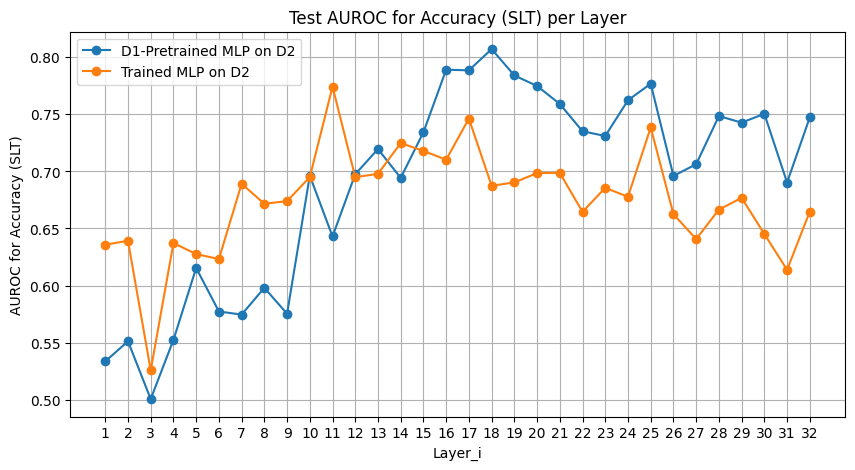

In [186]:
# Comparison with using pretrained model on D1 for prediction on D2
plot_1d_metrics([smlp2a_test_aucs, smlpa_test_aucs], ['D1-Pretrained MLP on D2', 'Trained MLP on D2'], 'AUROC for Accuracy (SLT)')

### Use model trained on [D1, D3] to predict D2

We will load another dataset D3 and continually train our models on it, before testing on D2 again.

We choose LLaMA-2-7B's generations on NQ dataset (2k samples) as D3.